# Capstone Project
#### Summary
In this notebook I investigate whether categorising music based on language difficulty could be used to facilitate non-native language learning. I scraped song meta data on 50k songs from Spotify and corresponding lyrics from the QQ Music API. I applied a range of statistcal modelling techniques to the data as a practical application of the material covered on this course. 


## 1. Virtual Environment & Installing Packages

### 1.0 Virtual Environment

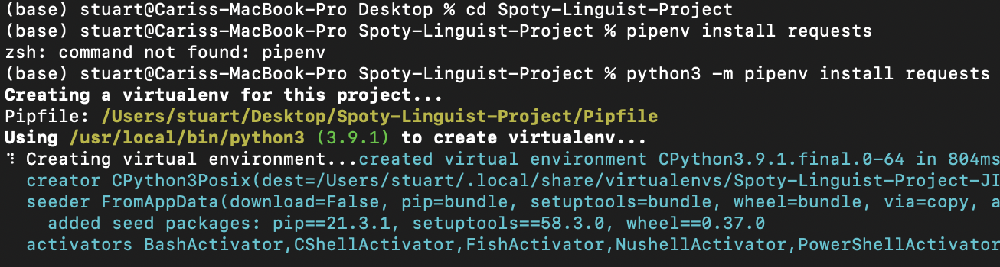

#### In terminal:
- Go to project directory and run: python3 -m venv env
- Note 'env' is name of sub folder where virtual environment will be located
- Activate the virtual environment: source env/bin/activate
- Confirm virtual environment is active by checking location of Python interpreter: source env/bin/activate
- It should be in the env directory
- To leave virtual environment: dactivate
- Set up new Kernel which uses env for packages: python3 -m ipykernel install --user --name=env
- Select env Kernel in Jupyter Interface

#### Activate virtual environment in terminal:

Note will see project name on left side of prompt:
((Spoty-Linguist-Project) ) (base) stuart@Cariss-MacBook-Pro Spoty-Linguist-Project % code goes here

Deactivate with: 'deactivate'

### 1.1 Packages

#### Install packages in virtual evironment in terminal and  import packages below

In [901]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import time
from tqdm import tqdm
import re
import sqlite3
from pandas.io import sql
import joblib

# Display settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
pd.options.display.max_columns = False

# QQ Music API Package
from QQMusicAPI import QQMusic

# Spotipy API Package
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth

# Mandarin NLP packages
from snownlp import SnowNLP
import jieba.posseg as pseg
import jieba
import hanzidentifier
import stopwordsiso
from stopwordsiso import stopwords

# NLP Using a count vectorizer TfidfVectorizer.
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV, LogisticRegression, LogisticRegressionCV
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve, roc_auc_score, average_precision_score
from sklearn.pipeline import make_pipeline
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

# disable warnings to increase readability of notebook
import warnings

warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

# other
import ipywidgets as widgets

## 2. Data Collection

### 2.1. Spotify API Setup

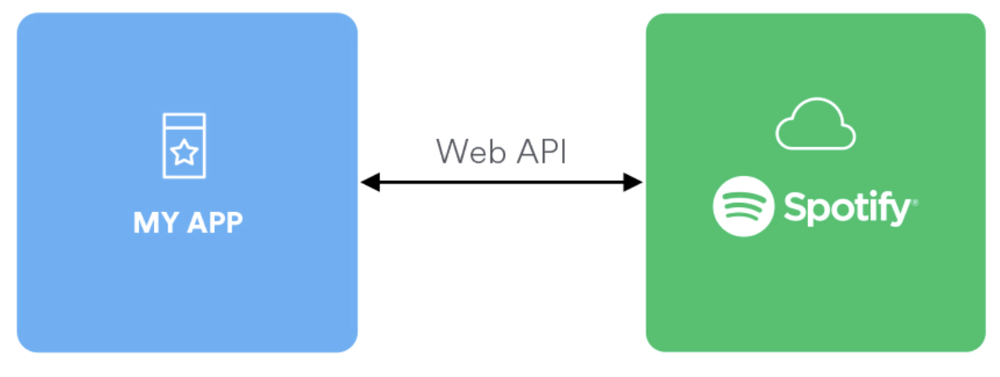

In [598]:
# slmsn Log in to spotipy API
client_id = 'c66cb687e0e84683a4e3ab8e8e434fb4'
client_secret = 'afcc61af42db4850a39bae2f80c7d22c'
spotipy_redirect = 'http://127.0.0.1:8888/'
username = 'stoooey'
device_id = '0d4063631663fbfd1c65bab8abb4d4cdd29a7ee3'
# # slout Log in to spotipy API
# client_id = 'd4326d78b2d546748e38e64999553ed7'
# client_secret = '322745c5243e4c20ac0f70c9e9f64aad'
# spotipy_redirect = 'http://127.0.0.1:8082/'
# username = '31vdm4nfavfv5cxazcd2agrhcxi4'
# device_id = '129053ff24523dd666330f953596e609249aad14'

scope = 'playlist-modify-private,playlist-modify-public,user-library-read,user-top-read,streaming, user-read-playback-state, user-read-recently-played'

token = SpotifyOAuth(username=username,
                     scope=scope,
                     client_id=client_id,
                     client_secret=client_secret,
                     redirect_uri=spotipy_redirect)
sp = spotipy.Spotify(auth_manager=token, requests_timeout=10, retries=10)

In [100]:
# sp can then be used to access spotify API commands

In [19]:
sp.artist_top_tracks('spotify:artist:7fIvjotigTGWqjIz6EP1i4')

{'tracks': [{'album': {'album_type': 'album',
    'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/7fIvjotigTGWqjIz6EP1i4'},
      'href': 'https://api.spotify.com/v1/artists/7fIvjotigTGWqjIz6EP1i4',
      'id': '7fIvjotigTGWqjIz6EP1i4',
      'name': 'Four Tops',
      'type': 'artist',
      'uri': 'spotify:artist:7fIvjotigTGWqjIz6EP1i4'}],
    'external_urls': {'spotify': 'https://open.spotify.com/album/2jvkMPydCpLWwRothqJU1O'},
    'href': 'https://api.spotify.com/v1/albums/2jvkMPydCpLWwRothqJU1O',
    'id': '2jvkMPydCpLWwRothqJU1O',
    'images': [{'height': 640,
      'url': 'https://i.scdn.co/image/ab67616d0000b273c0fa62ae53b2aeae3766f13d',
      'width': 640},
     {'height': 300,
      'url': 'https://i.scdn.co/image/ab67616d00001e02c0fa62ae53b2aeae3766f13d',
      'width': 300},
     {'height': 64,
      'url': 'https://i.scdn.co/image/ab67616d00004851c0fa62ae53b2aeae3766f13d',
      'width': 64}],
    'name': 'Four Tops Second Album',
    'release_d

In [22]:
# # E.g. access current user (me) most recently played song
sp.current_user_recently_played()

{'items': [],
 'next': None,
 'cursors': None,
 'limit': 50,
 'href': 'https://api.spotify.com/v1/me/player/recently-played?limit=50'}

### 2.2. Scrape mandarin speaking artists from Spotify
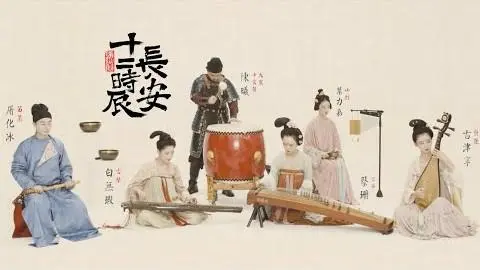

I started with a playlist of 100 mandarin songs. I then found similar artists using the Spotify API's related artists function to find further artists. I repeated this process on each of the new artists that I found until I had c.2,000 artists. I could have scraped many more artists however I was limited by the number of requests I could send to the Spotify server and time available. The artists scraped were more than sufficient for the purposes on this project. 

_Footnote: In the below example code I use a starting playlist of just 3 tracks to reduce run time in this notebook. The full results were run previously and are imported at the end of this section._

In [14]:
# I created a playlist in Spotify of 100 songs by various mandarin artists
# The below functions import the playlist and saves information about each track
# Including track name, artist, artist code,
# Playlist url is available in spotify (share playlist)


# Function to get the individual ids of each song in a playlist
def getTrackIDs(user, playlist_id):
    ids = []
    playlist = sp.user_playlist(user, playlist_id)
    for item in playlist['tracks']['items']:
        track = item['track']
        ids.append(track['id'])
    return ids


# Function to return information about a single track from its Spotify ID
def getTrackFeatures(id):
    try:
        meta = sp.track(id)
        features = sp.audio_features(id)
        name = meta['name']
        artist_href = meta['album']['artists'][0]['href']
        artist = meta['album']['artists'][0]['name']
        artist_uri = meta['artists'][0]['uri']
        artist_type = meta['artists'][0]['type']
        song_available_markets = meta['available_markets']
        song_duration_ms = meta['duration_ms']
        is_explicit = meta['explicit']
        song_href = meta['href']
        preview_url = meta['preview_url']
        track_number = meta['track_number']
        song_type = meta['type']
        length = meta['duration_ms']
        popularity = meta['popularity']
        album = meta['album']['name']
        album_type = meta['album']['album_type']
        album_artwork_link = meta['album']['images'][0]['url']
        album_tracks_num = meta['album']['total_tracks']
        album_uri = meta['album']['uri']
        album_release_date = meta['album']['release_date']
        acousticness = features[0]['acousticness']
        danceability = features[0]['danceability']
        energy = features[0]['energy']
        instrumentalness = features[0]['instrumentalness']
        liveness = features[0]['liveness']
        loudness = features[0]['loudness']
        speechiness = features[0]['speechiness']
        tempo = features[0]['tempo']
        time_signature = features[0]['time_signature']
        track = [
            name, artist_href, artist, artist_uri, artist_type,
            song_available_markets, song_duration_ms, is_explicit, song_href,
            preview_url, track_number, song_type, length, popularity, album,
            album_type, album_artwork_link, album_tracks_num, album_uri,
            album_release_date, acousticness, danceability, energy,
            instrumentalness, liveness, loudness, speechiness, tempo,
            time_signature
        ]
        return track
    except:
        pass


# Function to save information on every song in playlist in a dataframe
# This uses the two functions above
def grab_song_from_playlist(playlisturl, choose_playlist_name):
    # Spotify developer login credentials for API
    ids = getTrackIDs(username, playlisturl)
    tracks = []
    for i in range(len(ids)):
        track = getTrackFeatures(ids[i])
        tracks.append(track)
    # create dataset and save as csv
    df = pd.DataFrame(
        tracks,
        columns=[
            'name', 'artist_href', 'artist', 'artist_uri', 'artist_type',
            'song_available_markets', 'song_duration_ms', 'is_explicit',
            'song_href', 'preview_url', 'track_number', 'song_type', 'length',
            'popularity', 'album', 'album_type', 'album_artwork_link',
            'album_tracks_num', 'album_uri', 'album_release_date',
            'acousticness', 'danceability', 'energy', 'instrumentalness',
            'liveness', 'loudness', 'speechiness', 'tempo', 'time_signature'
        ])
    df.to_csv("%s.csv" % choose_playlist_name, sep=',')
    return df

In [148]:
df_eg_playlist = grab_song_from_playlist(
    'spotify:playlist:3MfiGKuLbufkFtBfKOSkA0', 'Example_playlist')
df_eg_playlist

Songs and their meta data are saved from the playlist and shown in the above dataframe. This dataframe was then used as a starting point to find further artists.


In [11]:
# Function to find similar artists to those included in original playlist
def scrape_similar_artists(starter_artist):
    # 1 Scrape similar artists and create df

    request = sp.artist_related_artists(starter_artist)
    name = []
    genres = []
    popularity = []
    followers = []
    artist_id = []
    artist_uri = []
    artist_href = []
    artist_images = []

    for ind, artists in enumerate(request['artists']):
        name.append(request['artists'][ind]['name'])
        genres.append(','.join(request['artists'][ind]['genres']))
        popularity.append(request['artists'][ind]['popularity'])
        followers.append(request['artists'][ind]['followers']['total'])
        artist_id.append(request['artists'][ind]['id'])
        artist_uri.append(request['artists'][ind]['uri'])
        artist_href.append(request['artists'][ind]['href'])
        # artist_images.append(request['artists'][ind]['images'][0]['url'])
        artist_images.append(np.nan)
    data = [
        name, genres, popularity, followers, artist_id, artist_uri,
        artist_href, artist_images
    ]
    df_artists = pd.DataFrame(data).T
    df_artists.columns = columns = [
        'name', 'genres', 'popularity', 'followers', 'artist_id', 'artist_uri',
        'artist_href', 'artist_images'
    ]
    df_artists = df_artists.sort_values(by='popularity', ascending=False)
    return df_artists

In [8]:
# For each artist scrape similar artists and save the artist details in a new dataframe
df_eg_playlist_similar_artists = pd.DataFrame()
for ind, i in enumerate(df_eg_playlist['artist_uri']):
    try:
        df_eg_playlist_similar_artists = df_eg_playlist_similar_artists.append(
            scrape_similar_artists(i))
    except:
        pass

df_eg_playlist_similar_artists = df_eg_playlist_similar_artists.drop_duplicates(
    subset='artist_id', keep="last")

In [9]:
df_eg_playlist_similar_artists.head(5)

,name,genres,popularity,followers,artist_id,artist_uri,artist_href,artist_images
16,Sorry Youth,"chinese indie,taiwan indie,taiwan pop,taiwan p...",40,25239,6c4IBMTcnFDhsKHXNSBBvp,spotify:artist:6c4IBMTcnFDhsKHXNSBBvp,https://api.spotify.com/v1/artists/6c4IBMTcnFD...,NaN
12,Schoolgirl Byebye,"chinese indie,sinogaze,southern china indie,ta...",39,14966,6kfcndVsu8F9Y5gL5xc717,spotify:artist:6kfcndVsu8F9Y5gL5xc717,https://api.spotify.com/v1/artists/6kfcndVsu8F...,NaN
3,Zhao Lei,"chinese indie,chinese minyao",35,46576,2KwZ9xnULczo0Z7Y7Bp57R,spotify:artist:2KwZ9xnULczo0Z7Y7Bp57R,https://api.spotify.com/v1/artists/2KwZ9xnULcz...,NaN
6,盘尼西林乐队,chinese indie,33,21184,2oKqZCLOi18wxFFnDS6e25,spotify:artist:2oKqZCLOi18wxFFnDS6e25,https://api.spotify.com/v1/artists/2oKqZCLOi18...,NaN
8,五條人,"chinese indie,chinese indie rock,chinese minya...",31,21686,6NQwuxgsebzIzixLkAHDCT,spotify:artist:6NQwuxgsebzIzixLkAHDCT,https://api.spotify.com/v1/artists/6NQwuxgsebz...,NaN


In [10]:
df_eg_playlist_similar_artists.shape

(48, 8)

In this example the origial playlist has been expanded from an inital number of 3 artists/tracks to 48 artists. I then used this to expand the search further by again looking for similar artists. For each new artist found I look for more similar artists.

In [12]:
# Function to expand this search further.
# Takes data frame of artists made above and looks for similar artists
# It then looks for similar artists to those new artists found and so on
# Each sub tree is searched until no new artists are available
def scrape_similar_artists_expansion(df_artists):
    # for each of the similar artists found scrape similar artists of these too and repeat and until no more unique searches
    # use input df as master df
    master_df = df_artists
    searched_already_list = []
    count = 0
    artist_dict = {}
    for ind, uri in enumerate(master_df['artist_uri']):
        if count < 10000:
            count += 1
            if uri not in searched_already_list:
                artist_dict[ind] = scrape_similar_artists(uri)
                searched_already_list.append(uri)
    for i in artist_dict.keys():
        master_df = master_df.append(artist_dict[i])
    master_df = master_df.drop_duplicates(subset='artist_id', keep="last")
    master_df = master_df.sort_values(by='popularity', ascending=False)
    return master_df

In [12]:
# # Run the code:
# df_eg_playlist_similar_artists_expand = scrape_similar_artists_expansion(df_eg_playlist_similar_artists)

Running all of the code from this section (3) resulted in a list of c. 2,000 mandarin speaking artists.

In [15]:
artists_df = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/Old Dfs/artists_df.csv',
    sep=',',
    index_col=0)
artists_df.head()

,name,genres,popularity,followers,artist_id,artist_uri,artist_href,artist_images
5,A Si,"chinese indie,chinese minyao,mandopop,taiwan i...",47,30483,4yamiVzQPYBb02ceSu0jaI,spotify:artist:4yamiVzQPYBb02ceSu0jaI,https://api.spotify.com/v1/artists/4yamiVzQPYB...,NaN
1,Deserts Chang,"chinese indie,mandopop,taiwan indie,taiwan pop...",46,111001,7v9Il42LvvTeSfmf1bwfNx,spotify:artist:7v9Il42LvvTeSfmf1bwfNx,https://api.spotify.com/v1/artists/7v9Il42LvvT...,NaN
16,老王樂隊,"chinese indie,mandopop,taiwan indie,taiwan pop",46,103339,4MRQK5pLyNbcOW493n55iT,spotify:artist:4MRQK5pLyNbcOW493n55iT,https://api.spotify.com/v1/artists/4MRQK5pLyNb...,NaN
18,Wang Feng,"c-pop,chinese singer-songwriter,classic mandop...",44,42463,10LslMPb7P5j9L2QXGZBmM,spotify:artist:10LslMPb7P5j9L2QXGZBmM,https://api.spotify.com/v1/artists/10LslMPb7P5...,NaN
4,Di Ma,"chinese indie,chinese minyao,chinese singer-so...",42,33600,6INLZbPHXGj6ERrjFGPYD6,spotify:artist:6INLZbPHXGj6ERrjFGPYD6,https://api.spotify.com/v1/artists/6INLZbPHXGj...,NaN


In [14]:
artists_df.shape

(2000, 8)

### 2.3. Get a list of albums for the artists scraped in 2.2.

In [16]:
# Loop through all of the artists scraped in 3.0 and get a list of albums
# Here we run through only the first 2 artists as an example
empty_list_albums = []

for artist_uri in tqdm(artists_df['artist_uri'].iloc[:2]):
    album_uri_temp = sp.artist_albums(artist_uri)
    for ind, i in enumerate(album_uri_temp['items']):
        empty_list_albums.append(album_uri_temp['items'][ind]['uri'])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 12.59it/s]


### 2.4. Get songs and meta data for each album

In [17]:
# loop through all the albums and get track ids for each (top 2 only here)
empty_list_tracks3 = []
for album in tqdm(empty_list_albums[:2]):
    temp = sp.album_tracks(album)['items']
    for ind, track in enumerate(temp):
        try:
            empty_list_tracks3.append(
                sp.album_tracks(album)['items'][ind]['uri'])
        except:
            pass

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.71it/s]


In [18]:
# Function to get song information from list of song ids
# This didnt work well with large dataframes
# def grab_song_from_ids(ids, choose_playlist_name):
#     # Spotify developer login credentials for API
#     sp = spotify_api_login()

#     tracks = []
#     for i in range(len(ids)):
#         # time.sleep(.5)
#         track = getTrackFeatures(ids[i])
#         tracks.append(track)

#     # create dataset
#     df = pd.DataFrame(tracks, columns = ['name', 'artist_href', 'artist','artist_uri','artist_type','song_available_markets','song_duration_ms','is_explicit','song_href','preview_url', 'track_number', 'song_type', 'length', 'popularity', 'album', 'album_type','album_artwork_link', 'album_tracks_num', 'album_uri', 'album_release_date', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'time_signature'])
#     df.to_csv("%s.csv"%choose_playlist_name, sep = ',')
#     return df

In [19]:
# Loop through list of track IDs and get song information
tracks = []
for i in tqdm(empty_list_tracks3):
    try:
        track = getTrackFeatures(i)
        tracks.append(track)
    except:
        pass

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 11.50it/s]


In [20]:
# Loop through list of tracks and append to dataframe. Note that couldnt add altogether due to
# size issues.
df_tracks_master = pd.DataFrame(columns=[
    'name', 'artist_href', 'artist', 'artist_uri', 'artist_type',
    'song_available_markets', 'song_duration_ms', 'is_explicit', 'song_href',
    'preview_url', 'track_number', 'song_type', 'length', 'popularity',
    'album', 'album_type', 'album_artwork_link', 'album_tracks_num',
    'album_uri', 'album_release_date', 'acousticness', 'danceability',
    'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness',
    'tempo', 'time_signature'
])

for ind, i in enumerate(tracks):
    try:
        df_tracks_master.loc[ind] = i
    except:
        pass

Here's one I made earlier: the full dataframe of all tracks scraped

In [23]:
df_tracks_master = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/Old Dfs/df_tracks_master.csv',
    sep=',',
    index_col=0)
display(df_tracks_master.head())
df_tracks_master.shape

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,...,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature
0,英雄 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",182040.0,False,https://api.spotify.com/v1/tracks/1i31BYKv1La3...,https://p.scdn.co/mp3-preview/191037a026d9e098...,...,2019-11-01,0.000172,0.522,0.908,0.002500,0.458,-8.747,0.0596,118.987,4.0
1,雙截棍 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",145173.0,False,https://api.spotify.com/v1/tracks/77uwbOEaj6nM...,https://p.scdn.co/mp3-preview/80c09c504a54344b...,...,2019-11-01,0.002810,0.461,0.953,0.000000,0.424,-6.440,0.1360,101.037,4.0
2,開不了口 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",272973.0,False,https://api.spotify.com/v1/tracks/5OR1Fbd7RSI1...,https://p.scdn.co/mp3-preview/82a62689347391e7...,...,2019-11-01,0.001760,0.519,0.612,0.000002,0.564,-10.634,0.0267,139.944,4.0
3,床邊故事 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",220240.0,False,https://api.spotify.com/v1/tracks/7MmT3xzugKwe...,https://p.scdn.co/mp3-preview/5316d5602f55d671...,...,2019-11-01,0.039800,0.640,0.844,0.000005,0.122,-9.645,0.0539,106.033,4.0
4,夜曲+竊愛 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",222013.0,False,https://api.spotify.com/v1/tracks/4vlzCpNsDFBa...,https://p.scdn.co/mp3-preview/446b1630b52837ae...,...,2019-11-01,0.028300,0.538,0.610,0.005630,0.386,-10.513,0.1680,174.093,4.0


(89689, 29)

Clean up the data:

In [24]:
# Update column data types
strings_cols = [
    'name', 'artist_href', 'artist', 'artist_uri', 'artist_type',
    'song_available_markets', 'song_duration_ms', 'is_explicit', 'song_href',
    'preview_url', 'song_type', 'album', 'album_type', 'album_artwork_link',
    'album_uri'
]

for i in strings_cols:
    df_tracks_master[i] = df_tracks_master[i].astype("string")
df_tracks_master['album_release_date'] = pd.to_datetime(
    df_tracks_master.album_release_date)

df_tracks_master.dtypes

name                              string
artist_href                       string
artist                            string
artist_uri                        string
artist_type                       string
song_available_markets            string
song_duration_ms                  string
is_explicit                       string
song_href                         string
preview_url                       string
track_number                     float64
song_type                         string
length                           float64
popularity                       float64
album                             string
album_type                        string
album_artwork_link                string
album_tracks_num                 float64
album_uri                         string
album_release_date        datetime64[ns]
acousticness                     float64
danceability                     float64
energy                           float64
instrumentalness                 float64
liveness        

In [25]:
# Drop NAs
df_tracks_master_clean = df_tracks_master.dropna()
df_tracks_master_clean.shape

(75029, 29)

In [26]:
df_tracks_master_clean = df_tracks_master.drop_duplicates(subset='name',
                                                          keep='first')
df_tracks_master_clean.shape

(54947, 29)

In [28]:
df_tracks_master_clean = df_tracks_master_clean.drop_duplicates(
    subset=['acousticness', 'danceability', 'energy', 'tempo'], keep='first')
df_tracks_master_clean.shape

(54326, 29)

In [29]:
# Save the CSV to drive
df_tracks_master_clean.to_csv('df_tracks_master_clean.csv')

## 3. Lyric Scraping and Some SQL

### 3.1. Lyrics Scraper
.  |  .
- | - 
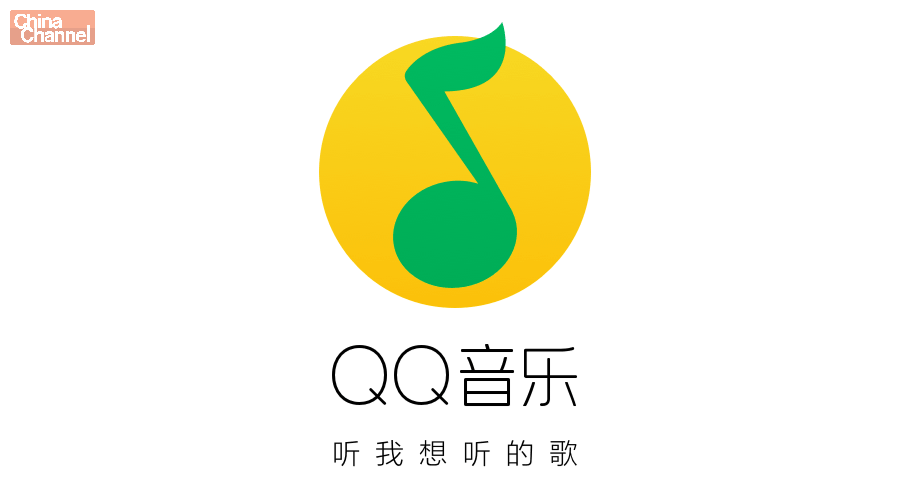| 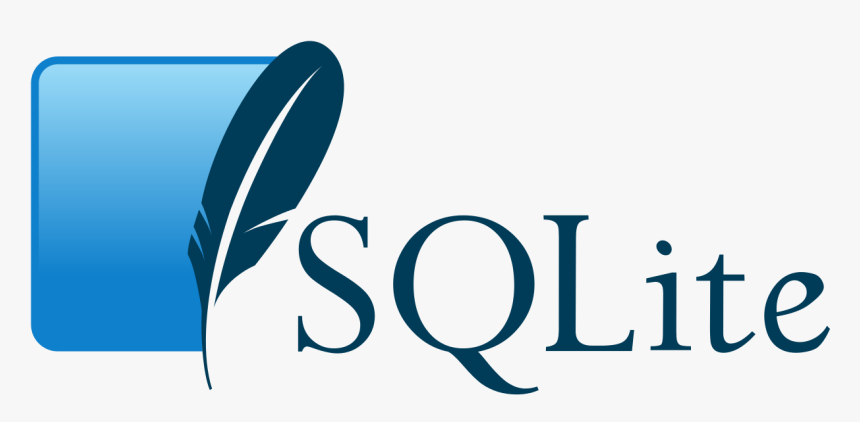 

I used the QQ Music API to scrape lyrics for each of the songs I scraped in section 2. This was the most time consuming part of the project with the scraper running for more than 4 days. Surprisingly a majority of the songs I scraped had lyrics available. I encountered issues with the dataframe size becoming too large which was solved by using an SQL database to store information. Lyrics were downloaded in string format with time stamps generally included. I used regex to filter this information. As well as saving the primary dataframe (Spotify song information + lyrics) in SQL, I also saved each song in a unique table with the lyrics in one column and the time stamps in another. I found that I could use this later to print the lyrics of a song in time with the music (just for fun!).

I scraped lyrics for ~55,000 songs. The code below is blocked so that the scraper doesn't run again.

In [30]:
# import random
# db_connection = sqlite3.connect('/Users/stuart/Desktop/Spoty-Linguist-Project/master_sql_db.db.sqlite')
# # Regex for extracting lyrics and time stamps fro QQ scrape
# lyric_r = re.compile(r'\[\d\d\:\d\d\.\d\d\](\w+|'')')
# time_r = re.compile(r'\[(\d\d\:\d\d\.\d\d)\]')

# df = df_tracks_master_clean.copy()
# df['lyrics'] = 'nan'
# df['time_stamp'] = 'nan'

# for ind, i in tqdm(enumerate(df.name)):

#     # create search string:
#     if df.artist.iloc[ind] == 'Various Artists': # if Various artist, just search for album and song name
#         search_text = df.name.iloc[ind] + " " + df.album.iloc[ind]
#     else:
#         search_text = df.artist.iloc[ind] + " " + df.name.iloc[ind]
#     try:
#         search_result = QQMusic.search(search_text).data[0]
#         lyric = search_result.lyric
#         lyric.extract()
#         lyric = lyric.lyric

#         # add lyrics and timestamps to main dataframe
#         lyric_list = re.findall(lyric_r, lyric)
#         time_list = re.findall(time_r, lyric)
#         lyric_string = ','.join(lyric_list)
#         lyric_time = ','.join(time_list)
#         df.iloc[ind,29] = lyric_string
#         df.iloc[ind, 30] = lyric_time

#         if not lyric_list:
#             df.iloc[ind,29] = lyric
# #         # save to csv
# #         df.to_csv('df_tracks_master_lyrics.csv')
# # save to sql:
#         df.to_sql(name = 'master', con = db_connection, if_exists = 'replace', index = False)

#     except:
#         pass

#     try:
#         # create a dataframe for each song and save in sql
#         df_temp = pd.DataFrame({'time':time_list,'lyrics':lyric_list})
#         name_temp = df.iloc[ind,0]
#         df_temp.to_sql(name = name_temp, con = db_connection, if_exists = 'replace', index = False)
#     except:
#         pass

#     time.sleep(random.uniform(1,4))

In [17]:
# Import the results from the final dataframe table in SQL
db_connection = sqlite3.connect(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/master_sql_db.db.sqlite')
df_tracks_master_clean_lyrics = sql.read_sql('SELECT * FROM master',
                                             con=db_connection)
df_tracks_master_clean_lyrics.shape

(54326, 31)

### 3.2. Add Genre of songs (from Spotify)

In [18]:
df_tracks_master_clean_lyrics_genre = df_tracks_master_clean_lyrics.merge(
    artists_df[['artist_uri',
                'genres']], on='artist_uri', how='left').drop_duplicates()
df_tracks_master_clean_lyrics_genre.to_csv(
    'df_tracks_master_clean_lyrics_genre.csv')

In [77]:
def add_genre_0(genre_0):
    try:
        genre_reg = re.compile(r'\w+')
        genre_list = re.findall(genre_reg, genre_0)
        return genre_list[0]
    except:
        return np.nan


def add_genre_1(genre_1):
    try:
        genre_reg = re.compile(r'\w+')
        genre_list = re.findall(genre_reg, genre_1)
        return genre_list[1]
    except:
        return np.nan


def add_genre_2(genre_2):
    try:
        genre_reg = re.compile(r'\w+')
        genre_list = re.findall(genre_reg, genre_2)
        return genre_list[2]
    except:
        return np.nan

In [20]:
df_tracks_master_clean_lyrics_genre[
    'genre_0'] = df_tracks_master_clean_lyrics_genre['genres'].apply(
        add_genre_0)
df_tracks_master_clean_lyrics_genre[
    'genre_1'] = df_tracks_master_clean_lyrics_genre['genres'].apply(
        add_genre_1)
df_tracks_master_clean_lyrics_genre[
    'genre_2'] = df_tracks_master_clean_lyrics_genre['genres'].apply(
        add_genre_2)

In [22]:
df_tracks_master_clean_lyrics_genre['genre_0'].isnull().sum()

34497

In [25]:
df_tracks_master_clean_lyrics_genre.to_csv(
    'df_tracks_master_clean_lyrics_genre')

In [44]:
df_tracks_master_clean_lyrics_genre = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean_lyrics_genre.csv',
    sep=',',
    index_col=0)

At this stage 768 lyrics are null. None of the artists are null. 

## 4. Language Difficulty Scoring

#### 4.1. HSK Scores
Many people studying mandarin will follow the HSK testing system. In this system the language learning process is divided into 6 grades (HSK 1 to HSK 6). In each stage the amount of characters /words a student is required to recognise increases:

- HSK1: 300 characters / 500 words
- HSK2: 600 characters / 1300 words
- HSK3: 900 characters / 2300 words
- HSK4: 1200 characters / 3300 words
- HSK5: 1500 characters / 4300 words
- HSK6 1800 characters / 5500 words

Using this system I gave each song a score for each HSK level to show what percentage of the lyrics would be known by a person at that level. I utilised CSV files of mandarin vocab at each HSK level。

Chinese words can be made of one or more characters. For example 'I' is formed by one character 我, where as library is formed by 3 character 图书馆. I therefore  used 'SnowNLP' a mandarin NLP Python package to tokenise the lyrics.

In [1087]:
# SnowNLP example:
print('I met my friends in the library')
print('我在图书馆遇到了我的朋友')
SnowNLP(u'我在图书馆遇到了我的朋友').words

I met my friends in the library
我在图书馆遇到了我的朋友


['我', '在', '图书馆', '遇到', '了', '我', '的', '朋友']

In [1088]:
# Import HSK Lists: CSV files with words at each HSK level
csv_file_hsk1 = "/Users/stuart/Desktop/GA2/DSI20-lessons/projects/project-capstone/SL1/hsk_csv-master/hsk1.csv"
hsk1 = pd.read_csv(csv_file_hsk1, sep=',', header=None)
hsk1.columns = ['mandarin', 'pinyin', 'english']

csv_file_hsk2 = "/Users/stuart/Desktop/GA2/DSI20-lessons/projects/project-capstone/SL1/hsk_csv-master/hsk2.csv"
hsk2 = pd.read_csv(csv_file_hsk2, sep=',', header=None)
hsk2.columns = ['mandarin', 'pinyin', 'english']

csv_file_hsk3 = "/Users/stuart/Desktop/GA2/DSI20-lessons/projects/project-capstone/SL1/hsk_csv-master/hsk3.csv"
hsk3 = pd.read_csv(csv_file_hsk3, sep=',', header=None)
hsk3.columns = ['mandarin', 'pinyin', 'english']

csv_file_hsk4 = "/Users/stuart/Desktop/GA2/DSI20-lessons/projects/project-capstone/SL1/hsk_csv-master/hsk4.csv"
hsk4 = pd.read_csv(csv_file_hsk4, sep=',', header=None)
hsk4.columns = ['mandarin', 'pinyin', 'english']

csv_file_hsk5 = "/Users/stuart/Desktop/GA2/DSI20-lessons/projects/project-capstone/SL1/hsk_csv-master/hsk5.csv"
hsk5 = pd.read_csv(csv_file_hsk5, sep=',', header=None)
hsk5.columns = ['mandarin', 'pinyin', 'english']

csv_file_hsk6 = "/Users/stuart/Desktop/GA2/DSI20-lessons/projects/project-capstone/SL1/hsk_csv-master/hsk6.csv"
hsk6 = pd.read_csv(csv_file_hsk6, sep=',', header=None)
hsk6.columns = ['mandarin', 'pinyin', 'english']

In [1089]:
# expand hsk lists to also include individual characters
def expand_hsk(x):
    elist = []
    for i in x.mandarin:
        for j in i:
            elist.append(j)
    temp = pd.DataFrame(elist).drop_duplicates()
    temp['pinyin'] = np.nan
    temp['english'] = np.nan
    temp.columns = ['mandarin', 'pinyin', 'english']
    x = x.merge(temp, how='outer', on='mandarin')
    x = x.drop(columns=['pinyin_y', 'english_y'])
    x.columns = ['mandarin', 'pinyin', 'english']
    return x


hsk1 = expand_hsk(hsk1)
hsk2 = expand_hsk(hsk2)
hsk3 = expand_hsk(hsk3)
hsk4 = expand_hsk(hsk4)
hsk5 = expand_hsk(hsk5)
hsk6 = expand_hsk(hsk6)

In [49]:
# Create a column that labels each row as HSK level x
hsk1['hsk'] = 1
hsk2['hsk'] = 2
hsk3['hsk'] = 3
hsk4['hsk'] = 4
hsk5['hsk'] = 5
hsk6['hsk'] = 6

In [1093]:
# HSK1 should include all HSK1, HSK6 should include HSK1-HSK6
hsk2 = hsk2.append(hsk1)
hsk3 = hsk3.append(hsk2)
hsk4 = hsk4.append(hsk3)
hsk5 = hsk5.append(hsk4)
hsk6 = hsk6.append(hsk5)

In [51]:
# Create a master HSK DF which includes all vocab and their HSK level
hsk6 = hsk6.sort_values(by='hsk')
hsk_master = hsk6.copy()

In [52]:
# Drop any duplicates
hsk_master = hsk_master.drop_duplicates('mandarin')

In [53]:
# Function take text and return df with HSK scores for each word or individual character:


def text_hsk_split(text):
    # tokenise the text: extract words (typically 1-2 characters)
    from snownlp import SnowNLP
    text = SnowNLP(text)
    lyrics_tokenised_df = pd.DataFrame(list(text.tags),
                                       columns=['mandarin', 'type'])
    # drop rows where there is only a comma and also drop duplicates:
    lyrics_tokenised_df = lyrics_tokenised_df[
        lyrics_tokenised_df["mandarin"].replace(
            ",", np.nan).notnull()].drop_duplicates()

    # add hsk levels to the df by left merging with HSK master df
    lyrics_tokenised_hsk_df = pd.merge(lyrics_tokenised_df,
                                       hsk_master,
                                       on="mandarin",
                                       how='left')

    # # for all nan values, break down into individual character and add to list
    lyrics_tokenised_hsk_nan_df = lyrics_tokenised_hsk_df[
        lyrics_tokenised_hsk_df['hsk'].isnull(
        )]  # filter for all that were hsk nan
    lyrics_tokenised_hsk_nan_df = lyrics_tokenised_hsk_nan_df[
        'mandarin'].str.extract(r'(\w)')  # extract indivual characters
    lyrics_tokenised_hsk_nan_df.columns = ['mandarin']
    lyrics_tokenised_hsk_nan_df = pd.merge(lyrics_tokenised_hsk_nan_df,
                                           hsk_master,
                                           on="mandarin",
                                           how='left')  # add hsk info
    lyrics_tokenised_hsk_nan_df = lyrics_tokenised_hsk_nan_df.drop_duplicates()
    lyrics_tokenised_hsk_not_nan_df = lyrics_tokenised_hsk_df[
        lyrics_tokenised_hsk_df['hsk'].notnull(
        )]  # filter original df for all that were not nan

    lyrics_tokenised_hsk_final_df = lyrics_tokenised_hsk_not_nan_df.append(
        lyrics_tokenised_hsk_nan_df)
    return lyrics_tokenised_hsk_final_df

In [54]:
def check_hsk_levels(lyrics_tokenised_hsk_final_df):
    try:
        df = lyrics_tokenised_hsk_final_df.copy(
        )  # function to take df and return score

        hsk1_per = df[(df.hsk == 1)].shape[0] / df.hsk.shape[0]
        hsk2_per = df[(df.hsk == 2) | (df.hsk == 1)].shape[0] / df.hsk.shape[0]
        hsk3_per = df[(df.hsk == 3) | (df.hsk == 2) |
                      (df.hsk == 1)].shape[0] / df.hsk.shape[0]
        hsk4_per = df[(df.hsk == 4) | (df.hsk == 3) | (df.hsk == 2) |
                      (df.hsk == 1)].shape[0] / df.hsk.shape[0]
        hsk5_per = df[(df.hsk == 5) | (df.hsk == 4) | (df.hsk == 3) |
                      (df.hsk == 2) | (df.hsk == 1)].shape[0] / df.hsk.shape[0]
        hsk6_per = df[(df.hsk == 6) | (df.hsk == 5) | (df.hsk == 4) |
                      (df.hsk == 3) | (df.hsk == 2) |
                      (df.hsk == 1)].shape[0] / df.hsk.shape[0]
        results = [hsk1_per, hsk2_per, hsk3_per, hsk4_per, hsk5_per, hsk6_per]
        return results
    except:
        return [np.nan for i in range(6)]  # 6 nan values

In [55]:
# Filter out any other non-chinese characters from the lyrics
def getChinese(context):
    filtrate = re.compile(u'[^\u4E00-\u9FA5]')  # non-Chinese unicode range
    context = filtrate.sub(r'', context)  # remove all non-Chinese characters
    return context

In [56]:
# Filter out songs with less than 8 characters
df_tracks_master_clean2_lyrics__genre = df_tracks_master_clean_lyrics_genre.copy(
)
df_tracks_master_clean2_lyrics__genre[
    'lyrics'] = df_tracks_master_clean2_lyrics__genre['lyrics'].astype(str)
df_tracks_master_clean2_lyrics__genre[
    'lyrics'] = df_tracks_master_clean2_lyrics__genre['lyrics'].apply(
        getChinese)
df_tracks_master_clean2_lyrics__genre[
    'lyrics_len'] = df_tracks_master_clean2_lyrics__genre['lyrics'].apply(
        lambda x: len(x))
df_tracks_master_clean2_lyrics__genre = df_tracks_master_clean2_lyrics__genre[
    df_tracks_master_clean2_lyrics__genre['lyrics_len'] >= 8]

In [57]:
df_tracks_master_clean2_lyrics__genre = df_tracks_master_clean2_lyrics__genre.drop_duplicates(
    'lyrics')

In [62]:
df_tracks_master_clean2_lyrics__genre.shape

(35942, 33)

In [63]:
df_tracks_master_clean2_lyrics_genre_hsk = df_tracks_master_clean2_lyrics__genre.copy(
)
# Run the above two functions into the main dataframe:
for ind, i in tqdm(enumerate(df_tracks_master_clean2_lyrics_genre_hsk.lyrics)):
    try:
        temp = text_hsk_split(i)
        temp = check_hsk_levels(temp)
    except:
        temp = [np.nan for i in range(6)]  # 6 nan values
        pass

    index_temp = df_tracks_master_clean2_lyrics_genre_hsk.index[ind]

    df_tracks_master_clean2_lyrics_genre_hsk.loc[index_temp, 'hsk1'] = temp[0]
    df_tracks_master_clean2_lyrics_genre_hsk.loc[index_temp, 'hsk2'] = temp[1]
    df_tracks_master_clean2_lyrics_genre_hsk.loc[index_temp, 'hsk3'] = temp[2]
    df_tracks_master_clean2_lyrics_genre_hsk.loc[index_temp, 'hsk4'] = temp[3]
    df_tracks_master_clean2_lyrics_genre_hsk.loc[index_temp, 'hsk5'] = temp[4]
    df_tracks_master_clean2_lyrics_genre_hsk.loc[index_temp, 'hsk6'] = temp[5]

df_tracks_master_clean2_lyrics_genre_hsk = df_tracks_master_clean2_lyrics_genre_hsk.drop_duplicates(
    'name').copy()
df_tracks_master_clean2_lyrics_genre_hsk.to_csv(
    'df_tracks_master_clean2_lyrics_genre_hsk.csv')

35942it [1:28:18,  6.78it/s]


In [65]:
df_tracks_master_clean2_lyrics_genre_hsk.shape

(35942, 39)

In [200]:
# Assign a HSK level to each song based on the vocabulary that is covered at that HSK level
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'] = 6
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk5'] >= 0.8] = 5
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk4'] >= 0.8] = 4
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk3'] >= 0.8] = 3
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk2'] >= 0.75] = 2
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk1'] >= 0.75] = 1

# Create binary classification for each song. E.g. is it suitable for HSK 2 learner at 80% coverage? Yes/ No
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_6_80p'] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_5_80p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_4_80p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_3_80p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_2_80p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_1_80p'] = 0

df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_5_80p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk5'] >= 0.8] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_4_80p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk4'] >= 0.8] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_3_80p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk3'] >= 0.8] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_2_80p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk2'] >= 0.8] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_1_80p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk1'] >= 0.8] = 1

df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_5_75p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_4_75p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_3_75p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_2_75p'] = 0
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_1_75p'] = 0

df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_5_75p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk5'] >= 0.75] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_4_75p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk4'] >= 0.75] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_3_75p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk3'] >= 0.75] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_2_75p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk2'] >= 0.75] = 1
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level_1_75p'][
    df_tracks_master_clean2_lyrics_genre_hsk['hsk1'] >= 0.75] = 1

display(df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'].value_counts(
    normalize=False))
df_tracks_master_clean2_lyrics_genre_hsk['hsk_level'].value_counts(
    normalize=True)

5    20883
4    12142
6     1780
3     1037
2       90
1        6
Name: hsk_level, dtype: int64

5    0.581084
4    0.337860
6    0.049530
3    0.028855
2    0.002504
1    0.000167
Name: hsk_level, dtype: float64

In [201]:
df_tracks_master_clean2_lyrics_genre_hsk.to_csv(
    'df_tracks_master_clean2_lyrics_genre_hsk.csv')

In [385]:
df_tracks_master_clean2_lyrics_genre_hsk = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean2_lyrics_genre_hsk.csv',
    sep=',',
    index_col=0)
df_tracks_master_clean2_lyrics_genre_hsk.shape

(35938, 54)

In [386]:
df_tracks_master_clean2_lyrics_genre_hsk.head()

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2
0,英雄 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",182040.0,0.0,https://api.spotify.com/v1/tracks/1i31BYKv1La3...,https://p.scdn.co/mp3-preview/191037a026d9e098...,1.0,track,182040.0,31.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.000172,0.522,0.908,0.002500,0.458,-8.747,0.0596,118.987,4.0,英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都...,"00:00.00,00:10.81,00:21.62,00:32.43,00:34.37,0...",NaN,288,0.280303,0.469697,0.583333,0.666667,0.856061,0.946970,5,1,1,0,0,0,0,1,0,0,0,0,NaN,NaN,NaN
1,雙截棍 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",145173.0,0.0,https://api.spotify.com/v1/tracks/77uwbOEaj6nM...,https://p.scdn.co/mp3-preview/80c09c504a54344b...,2.0,track,145173.0,30.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.002810,0.461,0.953,0.000000,0.424,-6.440,0.1360,101.037,4.0,双截棍词曲岩烧店的烟味弥漫店里面的妈妈桑教拳脚武术的老板练铁沙掌硬底子功夫最擅长还会金钟罩铁...,"00:00.00,00:09.79,00:19.58,00:29.37,00:31.72,0...",NaN,370,0.320000,0.460000,0.670000,0.810000,0.870000,0.980000,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN
2,開不了口 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",272973.0,0.0,https://api.spotify.com/v1/tracks/5OR1Fbd7RSI1...,https://p.scdn.co/mp3-preview/82a62689347391e7...,3.0,track,272973.0,32.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.001760,0.519,0.612,0.000002,0.564,-10.634,0.0267,139.944,4.0,开不了口词曲才离开没多久就开始担心今天的你过得好不好整个画面是你嘴嘟嘟那可爱的模样还有在你身...,"00:00.00,00:24.00,00:48.00,01:12.01,01:14.58,0...",NaN,299,0.404762,0.595238,0.833333,0.892857,0.928571,0.988095,3,1,1,1,1,0,0,1,1,1,0,0,NaN,NaN,NaN
3,床邊故事 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",220240.0,0.0,https://api.spotify.com/v1/tracks/7MmT3xzugKwe...,https://p.scdn.co/mp3-preview/5316d5602f55d671...,4.0,track,220240.0,29.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.039800,0.640,0.844,0.000005,0.122,-9.645,0.0539,106.033,4.0,床边故事词曲从前从前有只猫头鹰它站在屋顶屋顶后面一遍森林森林很安静安静的钢琴在大厅阁楼里仔细...,"00:00.00,00:06.45,00:12.91,00:19.37,00:20.74,0...",NaN,346,0.368852,0.500000,0.655738,0.803279,0.901639,0.950820,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN
4,夜曲+竊愛 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",222013.0,0.0,https://api.spotify.com/v1/tracks/4vlzCpNsDFBa...,https://p.scdn.co/mp3-preview/446b1630b52837ae...,5.0,track,222013.0,41.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.028300,0.538,0.610,0.005630,0.386,-10.513,0.1680,174.093,4.0,夜曲夜曲词曲窃爱词曲一群嗜血的蚂蚁被腐肉所吸引我面无表情看孤独的风景失去你失去你当鸽子不再象...,"00:00.00,00:03.37,00:03.70,00:04.45,00:05.10,0...",NaN,414,0.2

## 5. Data Cleaning

Some final data cleaning including removing genres that are not in scope. Removal of corrupt lyrics etc.

In [387]:
df_tracks_master_clean2_lyrics_genre_hsk[[
    'hsk1', 'hsk2', 'hsk3', 'hsk4', 'hsk5', 'hsk6'
]].describe()

,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6
count,35938.000000,35938.000000,35938.000000,35938.000000,35938.000000,35938.000000
mean,0.313522,0.460375,0.632173,0.769797,0.896004,0.976780
std,0.073362,0.088865,0.091038,0.080770,0.059733,0.039831
min,0.000000,0.000000,0.000000,0.100000,0.333333,0.363636
25%,0.266667,0.405809,0.577465,0.724138,0.867647,0.970297
50%,0.309258,0.459184,0.633333,0.775000,0.903614,0.985507
75%,0.357143,0.515152,0.689655,0.822581,0.934211,1.000000
max,0.857143,0.923077,1.000000,1.000000,1.000000,1.000000


In [390]:
# delete as lyrics are corrupt
df_tracks_master_clean2_lyrics_genre_hsk = df_tracks_master_clean2_lyrics_genre_hsk.drop(
    index=[178755, 53570, 240, 84568])

In [165]:
df_tracks_master_clean2_lyrics_genre_hsk[[
    'hsk1', 'hsk2', 'hsk3', 'hsk4', 'hsk5', 'hsk6'
]].describe()

,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6
count,35938.000000,35938.000000,35938.000000,35938.000000,35938.000000,35938.000000
mean,0.313522,0.460375,0.632173,0.769797,0.896004,0.976780
std,0.073362,0.088865,0.091038,0.080770,0.059733,0.039831
min,0.000000,0.000000,0.000000,0.100000,0.333333,0.363636
25%,0.266667,0.405809,0.577465,0.724138,0.867647,0.970297
50%,0.309258,0.459184,0.633333,0.775000,0.903614,0.985507
75%,0.357143,0.515152,0.689655,0.822581,0.934211,1.000000
max,0.857143,0.923077,1.000000,1.000000,1.000000,1.000000


In [211]:
df_tracks_master_clean2_lyrics_genre_hsk['genre_0'][
    df_tracks_master_clean2_lyrics_genre_hsk.genre_0 == 'c'] = 'c-pop'

In [223]:
df_tracks_master_clean2_lyrics_genre_hsk['genre_1'][
    df_tracks_master_clean2_lyrics_genre_hsk.genre_1 == 'r'] = 'chinese r&b'

In [231]:
df_tracks_master_clean2_lyrics_genre_hsk['genre_1'][
    df_tracks_master_clean2_lyrics_genre_hsk['genre_1'] ==
    'viral'] = 'chinese_viral_pop'

In [247]:
df_tracks_master_clean2_lyrics_genre_hsk[
    df_tracks_master_clean2_lyrics_genre_hsk['genre_0'].isnull()]

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2
0,英雄 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",182040.0,0.0,https://api.spotify.com/v1/tracks/1i31BYKv1La3...,https://p.scdn.co/mp3-preview/191037a026d9e098...,1.0,track,182040.0,31.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.000172,0.522,0.908,0.002500,0.4580,-8.747,0.0596,118.987,4.0,英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都...,"00:00.00,00:10.81,00:21.62,00:32.43,00:34.37,0...",NaN,288,0.280303,0.469697,0.583333,0.666667,0.856061,0.946970,5,1,1,0,0,0,0,1,0,0,0,0,NaN,NaN,NaN
1,雙截棍 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",145173.0,0.0,https://api.spotify.com/v1/tracks/77uwbOEaj6nM...,https://p.scdn.co/mp3-preview/80c09c504a54344b...,2.0,track,145173.0,30.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.002810,0.461,0.953,0.000000,0.4240,-6.440,0.1360,101.037,4.0,双截棍词曲岩烧店的烟味弥漫店里面的妈妈桑教拳脚武术的老板练铁沙掌硬底子功夫最擅长还会金钟罩铁...,"00:00.00,00:09.79,00:19.58,00:29.37,00:31.72,0...",NaN,370,0.320000,0.460000,0.670000,0.810000,0.870000,0.980000,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN
2,開不了口 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",272973.0,0.0,https://api.spotify.com/v1/tracks/5OR1Fbd7RSI1...,https://p.scdn.co/mp3-preview/82a62689347391e7...,3.0,track,272973.0,32.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.001760,0.519,0.612,0.000002,0.5640,-10.634,0.0267,139.944,4.0,开不了口词曲才离开没多久就开始担心今天的你过得好不好整个画面是你嘴嘟嘟那可爱的模样还有在你身...,"00:00.00,00:24.00,00:48.00,01:12.01,01:14.58,0...",NaN,299,0.404762,0.595238,0.833333,0.892857,0.928571,0.988095,3,1,1,1,1,0,0,1,1,1,0,0,NaN,NaN,NaN
3,床邊故事 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",220240.0,0.0,https://api.spotify.com/v1/tracks/7MmT3xzugKwe...,https://p.scdn.co/mp3-preview/5316d5602f55d671...,4.0,track,220240.0,29.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.039800,0.640,0.844,0.000005,0.1220,-9.645,0.0539,106.033,4.0,床边故事词曲从前从前有只猫头鹰它站在屋顶屋顶后面一遍森林森林很安静安静的钢琴在大厅阁楼里仔细...,"00:00.00,00:06.45,00:12.91,00:19.37,00:20.74,0...",NaN,346,0.368852,0.500000,0.655738,0.803279,0.901639,0.950820,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN
4,夜曲+竊愛 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",222013.0,0.0,https://api.spotify.com/v1/tracks/4vlzCpNsDFBa...,https://p.scdn.co/mp3-preview/446b1630b52837ae...,5.0,track,222013.0,41.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.028300,0.538,0.610,0.005630,0.3860,-10.513,0.1680,174.093,4.0,夜曲夜曲词曲窃爱词曲一群嗜血的蚂蚁被腐肉所吸引我面无表情看孤独的风景失去你失去你当鸽子不再象...,"00:00.00,00:03.37,00:03.70,00:04.45,00:05.10,0...",NaN,41

In [248]:
sp.artist('potify:artist:2elBjNSdBE2Y3f0j1mjrql')

{'external_urls': {'spotify': 'https://open.spotify.com/artist/2elBjNSdBE2Y3f0j1mjrql'},
 'followers': {'href': None, 'total': 2737866},
 'genres': ['c-pop', 'mandopop', 'taiwan pop', 'zhongguo feng'],
 'href': 'https://api.spotify.com/v1/artists/2elBjNSdBE2Y3f0j1mjrql',
 'id': '2elBjNSdBE2Y3f0j1mjrql',
 'images': [{'height': 640,
   'url': 'https://i.scdn.co/image/ab6761610000e5eba9989f6b9885c7aedc29c557',
   'width': 640},
  {'height': 320,
   'url': 'https://i.scdn.co/image/ab67616100005174a9989f6b9885c7aedc29c557',
   'width': 320},
  {'height': 160,
   'url': 'https://i.scdn.co/image/ab6761610000f178a9989f6b9885c7aedc29c557',
   'width': 160}],
 'name': 'Jay Chou',
 'popularity': 73,
 'type': 'artist',
 'uri': 'spotify:artist:2elBjNSdBE2Y3f0j1mjrql'}

In [268]:
list_of_artists = df_tracks_master_clean2_lyrics_genre_hsk.artist_uri.drop_duplicates(
)

In [271]:
list_of_artists

0         spotify:artist:2elBjNSdBE2Y3f0j1mjrql
8         spotify:artist:1xCrrnnj9xif5G0y3ie5dM
73        spotify:artist:6TwanpBr3fIrx6ITQM9kc0
75        spotify:artist:2iJUPCerX1OiPRuQXsStZH
83        spotify:artist:3LyN3dzJjv35T1XcDysnZG
                          ...                  
180160    spotify:artist:0pxtsY8RWW1IClFhKRHPqU
180163    spotify:artist:2DnSZXdPcLmYSHiNgLPGJH
180168    spotify:artist:7iGIX7gvr9SPKdvzdsAFqD
180169    spotify:artist:3kqGWMGSayGUtYrAah9Quh
180330    spotify:artist:6azt2KNXenlXO7FCKGtE6R
Name: artist_uri, Length: 2199, dtype: object

Fix genres as previous work had too many errors:

In [281]:
df_tracks_master_clean2_lyrics_genre_hsk_test = df_tracks_master_clean2_lyrics_genre_hsk.copy(
)

In [287]:
df_tracks_master_clean2_lyrics_genre_hsk_test['Genre0']

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2
0,英雄 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",182040.0,0.0,https://api.spotify.com/v1/tracks/1i31BYKv1La3...,https://p.scdn.co/mp3-preview/191037a026d9e098...,1.0,track,182040.0,31.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.000172,0.522,0.908,0.002500,0.4580,-8.747,0.0596,118.987,4.0,英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都...,"00:00.00,00:10.81,00:21.62,00:32.43,00:34.37,0...",NaN,288,0.280303,0.469697,0.583333,0.666667,0.856061,0.946970,5,1,1,0,0,0,0,1,0,0,0,0,NaN,NaN,NaN
1,雙截棍 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",145173.0,0.0,https://api.spotify.com/v1/tracks/77uwbOEaj6nM...,https://p.scdn.co/mp3-preview/80c09c504a54344b...,2.0,track,145173.0,30.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.002810,0.461,0.953,0.000000,0.4240,-6.440,0.1360,101.037,4.0,双截棍词曲岩烧店的烟味弥漫店里面的妈妈桑教拳脚武术的老板练铁沙掌硬底子功夫最擅长还会金钟罩铁...,"00:00.00,00:09.79,00:19.58,00:29.37,00:31.72,0...",NaN,370,0.320000,0.460000,0.670000,0.810000,0.870000,0.980000,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN
2,開不了口 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",272973.0,0.0,https://api.spotify.com/v1/tracks/5OR1Fbd7RSI1...,https://p.scdn.co/mp3-preview/82a62689347391e7...,3.0,track,272973.0,32.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.001760,0.519,0.612,0.000002,0.5640,-10.634,0.0267,139.944,4.0,开不了口词曲才离开没多久就开始担心今天的你过得好不好整个画面是你嘴嘟嘟那可爱的模样还有在你身...,"00:00.00,00:24.00,00:48.00,01:12.01,01:14.58,0...",NaN,299,0.404762,0.595238,0.833333,0.892857,0.928571,0.988095,3,1,1,1,1,0,0,1,1,1,0,0,NaN,NaN,NaN
3,床邊故事 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",220240.0,0.0,https://api.spotify.com/v1/tracks/7MmT3xzugKwe...,https://p.scdn.co/mp3-preview/5316d5602f55d671...,4.0,track,220240.0,29.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.039800,0.640,0.844,0.000005,0.1220,-9.645,0.0539,106.033,4.0,床边故事词曲从前从前有只猫头鹰它站在屋顶屋顶后面一遍森林森林很安静安静的钢琴在大厅阁楼里仔细...,"00:00.00,00:06.45,00:12.91,00:19.37,00:20.74,0...",NaN,346,0.368852,0.500000,0.655738,0.803279,0.901639,0.950820,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN
4,夜曲+竊愛 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",222013.0,0.0,https://api.spotify.com/v1/tracks/4vlzCpNsDFBa...,https://p.scdn.co/mp3-preview/446b1630b52837ae...,5.0,track,222013.0,41.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.028300,0.538,0.610,0.005630,0.3860,-10.513,0.1680,174.093,4.0,夜曲夜曲词曲窃爱词曲一群嗜血的蚂蚁被腐肉所吸引我面无表情看孤独的风景失去你失去你当鸽子不再象...,"00:00.00,00:03.37,00:03.70,00:04.45,00:05.10,0...",NaN,41

In [345]:
len(list_of_artists)

2199

In [364]:
artists_genre_df = pd.DataFrame()
for i in tqdm(list_of_artists):
    empty_list = []
    empty_list.append(i)
    genres_list = sp.artist(i)['genres']
    [empty_list.append(j) for j in genres_list]
    artists_genre_df = artists_genre_df.append([empty_list])
artists_genre_df

100%|███████████████████████████████████████████████████████████████████████████████| 2199/2199 [03:35<00:00, 10.19it/s]


,0,1,2,3,4,5,6,7
0,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,c-pop,mandopop,taiwan pop,zhongguo feng,NaN,NaN,NaN
0,spotify:artist:1xCrrnnj9xif5G0y3ie5dM,chinese r&b,mandopop,taiwan pop,NaN,NaN,NaN,NaN
0,spotify:artist:6TwanpBr3fIrx6ITQM9kc0,chinese soundtrack,NaN,NaN,NaN,NaN,NaN,NaN
0,spotify:artist:2iJUPCerX1OiPRuQXsStZH,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,spotify:artist:3LyN3dzJjv35T1XcDysnZG,mandopop,taiwan pop,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
0,spotify:artist:0pxtsY8RWW1IClFhKRHPqU,chinese minyao,NaN,NaN,NaN,NaN,NaN,NaN
0,spotify:artist:2DnSZXdPcLmYSHiNgLPGJH,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,spotify:artist:7iGIX7gvr9SPKdvzdsAFqD,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,spotify:artist:3kqGWMGSayGUtYrAah9Quh,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [391]:
artists_genre_df.columns = [
    'artist_uri', 'Genre1', 'Genre2', 'Genre3', 'Genre4', 'Genre5', 'Genre6',
    'Genre7'
]

In [393]:
df_tracks_master_clean2_lyrics_genre_hsk = df_tracks_master_clean2_lyrics_genre_hsk.merge(
    artists_genre_df, on='artist_uri', how='left')

In [192]:
df_tracks_master_clean2_lyrics_genre_hsk.to_csv(
    'df_tracks_master_clean2_lyrics_genre_hsk_v2.csv')

In [3]:
df_tracks_master_clean2_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean2_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

In [4]:
df_tracks_master_clean2_lyrics_genre_hsk_v2.Genre1.value_counts()

c-pop                 16816
chinese indie          4673
mandopop               4473
cantopop               1330
classic mandopop       1114
                      ...  
sinogaze                  1
english indie rock        1
acoustic pop              1
classic j-pop             1
belgian dnb               1
Name: Genre1, Length: 99, dtype: int64

In [5]:
df_tracks_master_clean3_lyrics_genre_hsk_v2 = df_tracks_master_clean2_lyrics_genre_hsk_v2[
    (df_tracks_master_clean2_lyrics_genre_hsk_v2.Genre1 != 'indian metal')
    & (df_tracks_master_clean2_lyrics_genre_hsk_v2.Genre1 != 'japanese piano')
    & (df_tracks_master_clean2_lyrics_genre_hsk_v2.Genre1 != 'danish pop') &
    (df_tracks_master_clean2_lyrics_genre_hsk_v2.Genre1 !=
     'english indie rock') &
    (df_tracks_master_clean2_lyrics_genre_hsk_v2.Genre1 != 'belgian dnb')]
df_tracks_master_clean3_lyrics_genre_hsk_v2 = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre2 != 'russian dance pop')
    & (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre2 !=
       'japanese punk rock') &
    (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre2 != 'korean pop') &
    (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre2 != 'japanese r&b')]
df_tracks_master_clean3_lyrics_genre_hsk_v2 = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre3 != 'nordic folk metal')
    & (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre3 !=
       'japanese jazz fusion')]

I also want to urls that can open the song in a browser rather than in the api. Update the api columns to allow this:

In [6]:
def modify_url(x):
    url_search = re.compile(r'(?<=tracks).*')
    url_clean = 'https://open.spotify.com/track'
    url_clean = url_clean + re.findall(url_search, x)[0]
    return url_clean

In [7]:
df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'weblink'] = df_tracks_master_clean3_lyrics_genre_hsk_v2['song_href']
df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'weblink'] = df_tracks_master_clean3_lyrics_genre_hsk_v2['weblink'].apply(
        modify_url)
df_tracks_master_clean3_lyrics_genre_hsk_v2['weblink'][:10]

0    https://open.spotify.com/track/1i31BYKv1La3wVC...
1    https://open.spotify.com/track/77uwbOEaj6nMy6T...
2    https://open.spotify.com/track/5OR1Fbd7RSI18Oo...
3    https://open.spotify.com/track/7MmT3xzugKweEte...
4    https://open.spotify.com/track/4vlzCpNsDFBaW99...
5    https://open.spotify.com/track/2KrXsknYKiyTDFt...
6    https://open.spotify.com/track/4WXwCqReqMXALrY...
7    https://open.spotify.com/track/3M1YMhbHFUO1tzy...
8    https://open.spotify.com/track/50Njtg1yk7ODjC0...
9    https://open.spotify.com/track/2aOYHzYlLY80ju0...
Name: weblink, dtype: object

In [10]:
df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'].value_counts(
    normalize=True)

5    0.578575
4    0.306562
2    0.055455
6    0.049330
3    0.008574
1    0.001503
Name: hsk_level, dtype: float64

I also want to urls that can open the song in a browser rather than in the api. Update the api columns to allow this:

In [ ]:
def modify_url(x):
    url_search = re.compile(r'(?<=tracks).*')
    url_clean = 'https://open.spotify.com/track'
    url_clean = url_clean + re.findall(url_search, x)[0]
    return url_clean

In [ ]:
df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'weblink'] = df_tracks_master_clean3_lyrics_genre_hsk_v2['song_href']
df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'weblink'] = df_tracks_master_clean3_lyrics_genre_hsk_v2['weblink'].apply(
        modify_url)
df_tracks_master_clean3_lyrics_genre_hsk_v2['weblink'][:10]

In [12]:
df_tracks_master_clean3_lyrics_genre_hsk_v2.to_csv(
    'df_tracks_master_clean3_lyrics_genre_hsk_v2.csv')

In [ ]:
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

## 7. Data Analysis

### 7.1. HSK Coverage
The KDE plots below demonstrate the distribution of song comprehension for each HSK level. At the lowest HSK levels 1 and 2 comprehension is low with HSK 1 / HSK 2 vocabulary covering on average 30% / 46% of lyrics in a song respectively. There are very few songs that are accessible at an 80% comprehension level (HSK 1: total of 4 songs, HSK 2: 32 songs). Nonethless, these outliers could be valuable to learners at this level where accessible authentic material is extremely limited.

Of course comprehension rates increase with HSK level and therefore the number of songs available at an 80% comprehenion increases too. At HSK 3 the number of songs available at 80% comprehension spikes to over 1000+ and at HSK 4 to 13,000+ and finally to 34,000+ for both HSK 5 and 6. This shows that even at HSK 3 and HSK 4 levels there is a large corpus of music that should be accessible to learners.

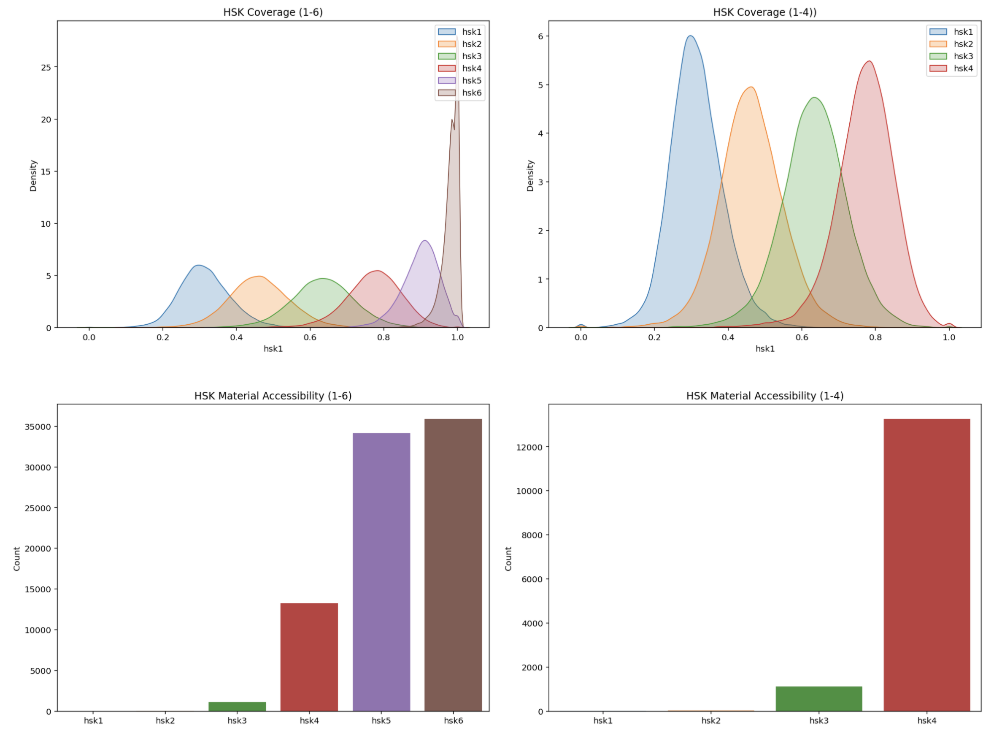

In [6]:
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

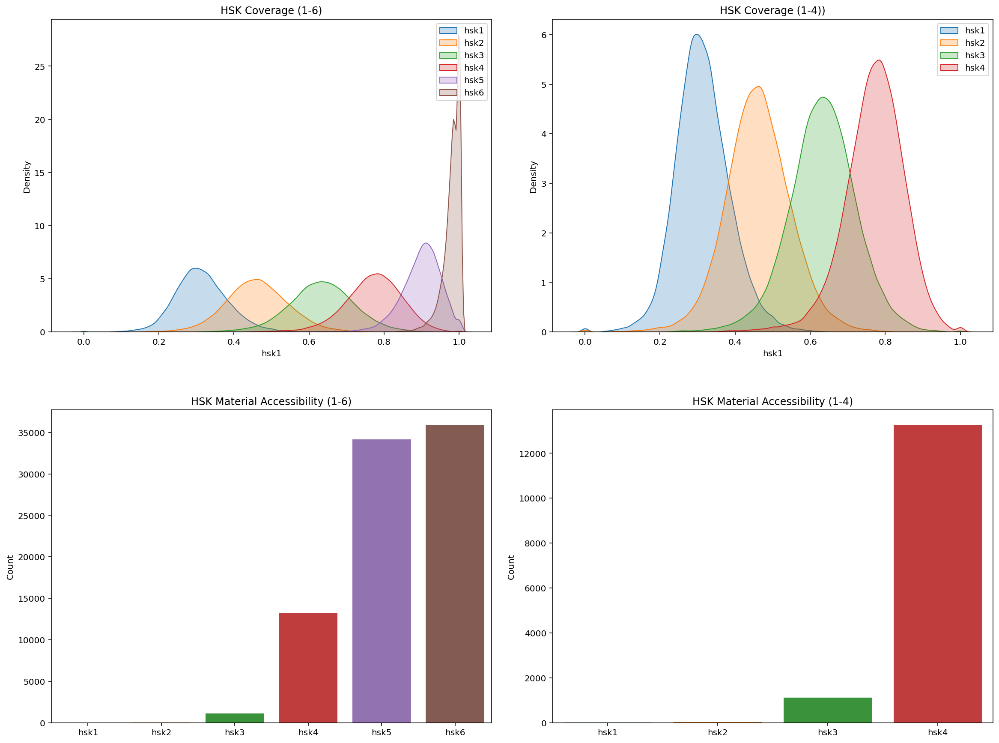

In [4]:
# Create a dataframe with the number of songs available at each HSK Level assuming 80% coverage
hsk6_count = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'hsk_level_6_80p'].sum()
hsk5_count = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'hsk_level_5_80p'].sum()
hsk4_count = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'hsk_level_4_80p'].sum()
hsk3_count = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'hsk_level_3_80p'].sum()
hsk2_count = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'hsk_level_2_80p'].sum()
hsk1_count = df_tracks_master_clean3_lyrics_genre_hsk_v2[
    'hsk_level_1_80p'].sum()

hsk_count_df = pd.DataFrame(
    [hsk6_count, hsk5_count, hsk4_count, hsk3_count, hsk2_count, hsk1_count],
    index=['hsk6', 'hsk5', 'hsk4', 'hsk3', 'hsk2', 'hsk1'],
    columns=['Count'])
hsk_count_df = hsk_count_df.sort_values(by='Count')

# Plot the results
fig1, ax1 = plt.subplots(ncols=2, nrows=2, figsize=(16, 12))
fig1.tight_layout(h_pad=7, w_pad=4)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk1'],
            ax=ax1[0][0],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk2'],
            ax=ax1[0][0],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk3'],
            ax=ax1[0][0],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk4'],
            ax=ax1[0][0],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk5'],
            ax=ax1[0][0],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk6'],
            ax=ax1[0][0],
            fill=True)
ax1[0][0].legend(['hsk1', 'hsk2', 'hsk3', 'hsk4', 'hsk5', 'hsk6'])
ax1[0][0].set_title('HSK Coverage (1-6)')

sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk1'],
            ax=ax1[0][1],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk2'],
            ax=ax1[0][1],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk3'],
            ax=ax1[0][1],
            fill=True)
sns.kdeplot(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk4'],
            ax=ax1[0][1],
            fill=True)
ax1[0][1].legend(['hsk1', 'hsk2', 'hsk3', 'hsk4'])
ax1[0][1].set_title('HSK Coverage (1-4))')

sns.barplot(data=hsk_count_df, x=hsk_count_df.index, y='Count', ax=ax1[1][0])
sns.barplot(data=hsk_count_df.iloc[:4],
            x=hsk_count_df.iloc[:4].index,
            y='Count',
            ax=ax1[1][1])

ax1[1][0].set_title('HSK Material Accessibility (1-6)')
ax1[1][1].set_title('HSK Material Accessibility (1-4)')
fig1.show()

In [8]:
df_tracks_master_clean3_lyrics_genre_hsk_v2[[
    'hsk1', 'hsk2', 'hsk3', 'hsk4', 'hsk5', 'hsk6'
]].describe()

,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6
count,35921.000000,35921.000000,35921.000000,35921.000000,35921.000000,35921.000000
mean,0.313556,0.460414,0.632219,0.769857,0.896059,0.976837
std,0.073309,0.088806,0.090968,0.080649,0.059587,0.039618
min,0.000000,0.000000,0.000000,0.100000,0.333333,0.363636
25%,0.266667,0.405941,0.577465,0.724138,0.867647,0.970339
50%,0.309278,0.459184,0.633333,0.775000,0.903614,0.985507
75%,0.357143,0.515152,0.689655,0.822581,0.934211,1.000000
max,0.857143,0.923077,1.000000,1.000000,1.000000,1.000000


In [9]:
df_tracks_master_clean3_lyrics_genre_hsk_v2.shape

(35921, 62)

### 7.2. Tableau
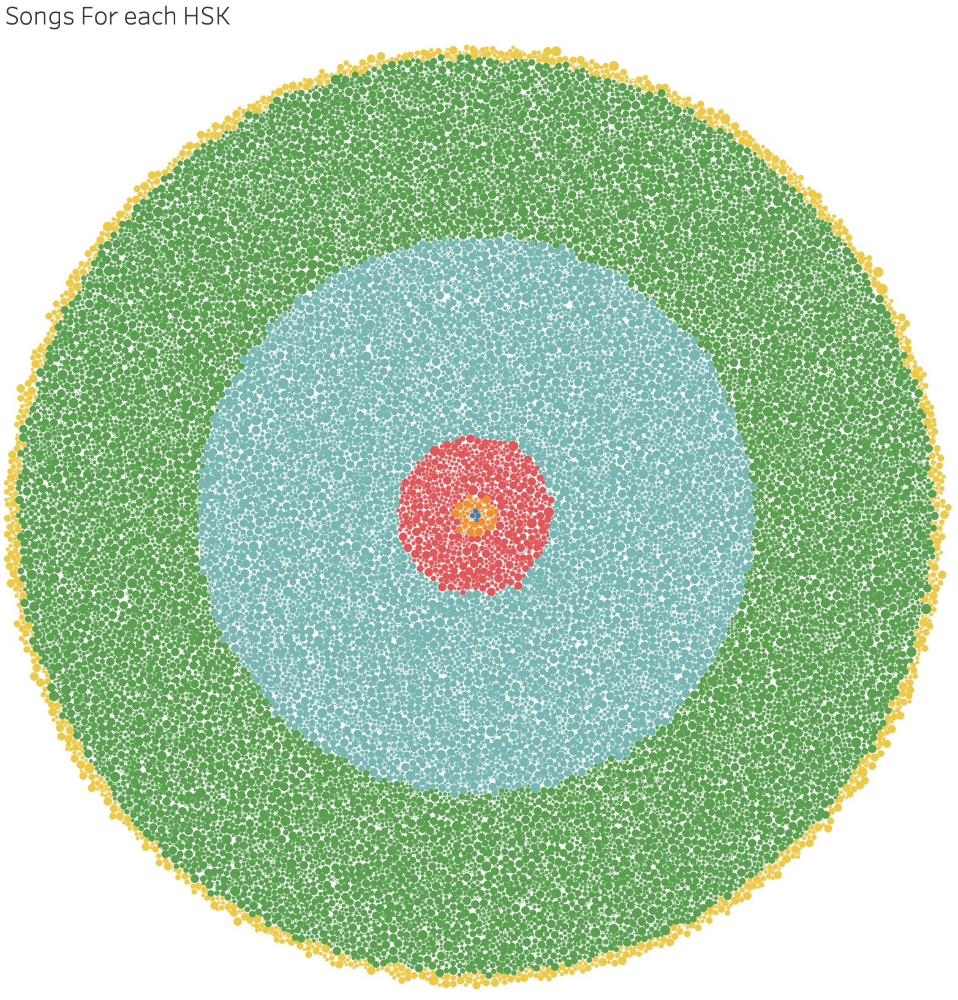
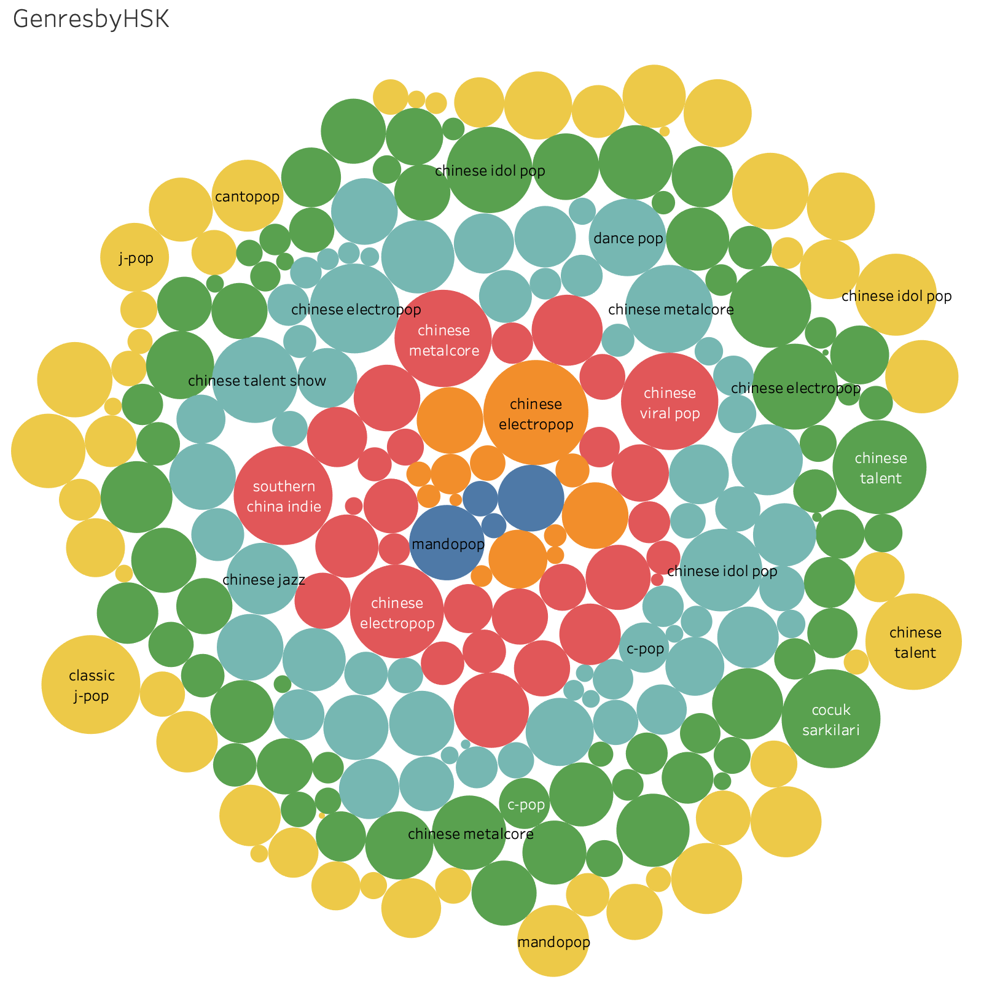

https://prod-uk-a.online.tableau.com/#/site/spottylinguist/workbooks/76696/views

### 7.3. Word Frequency Analysis
#### With stop words included:
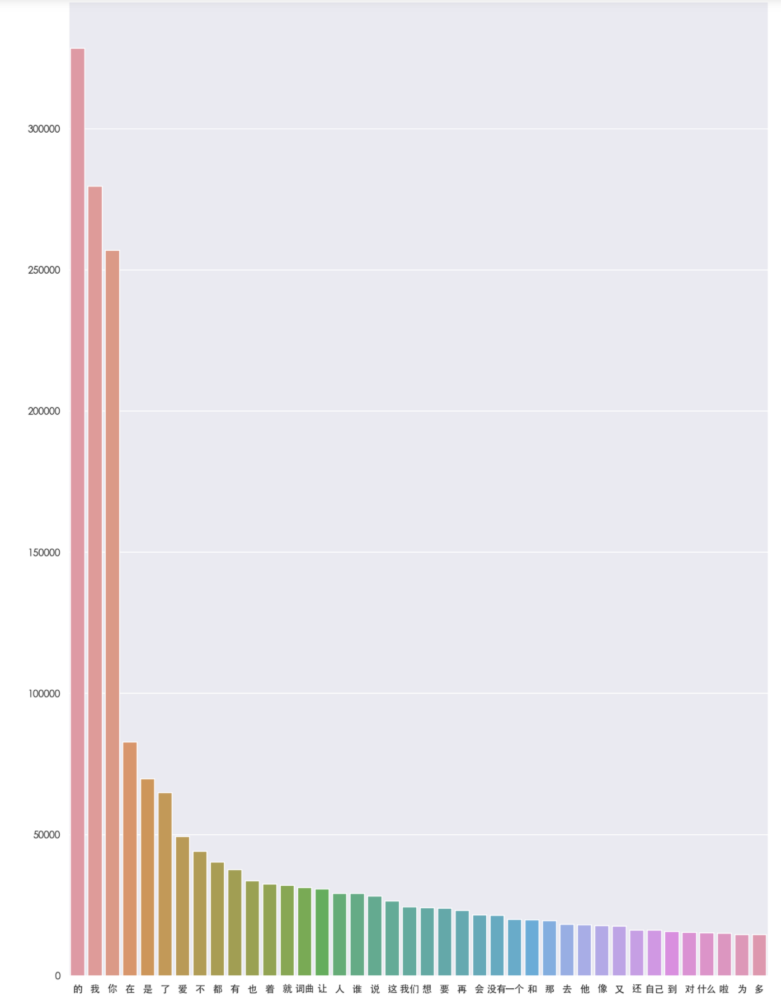

#### With stop words excluded:
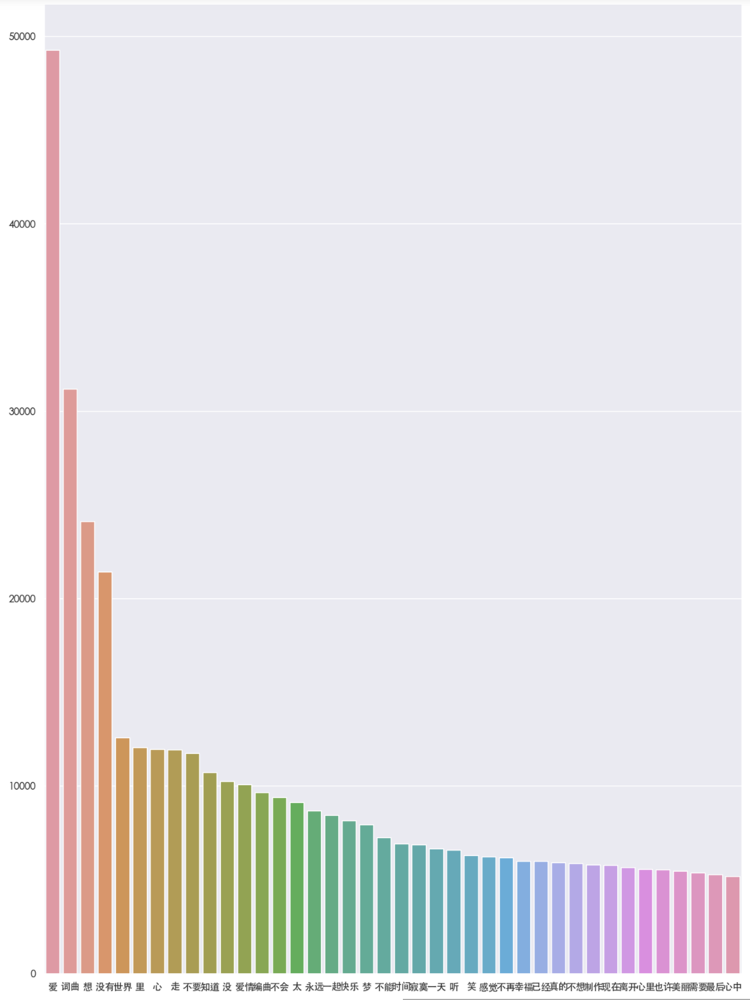

In [121]:
# Import Jieba to tokenize lyrics
import jieba.posseg as pseg
import jieba

In [122]:
# Tokenizer using JieBa to account for Mandarin
def man_token_jie(x):
    return jieba.lcut(x)

In [123]:
lyrics = df_tracks_master_clean3_lyrics_genre_hsk_v2.lyrics

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=10000)
X_all = cvec.fit_transform(lyrics)

In [124]:
X_all_df = pd.DataFrame(X_all.toarray(), columns =cvec.get_feature_names() )

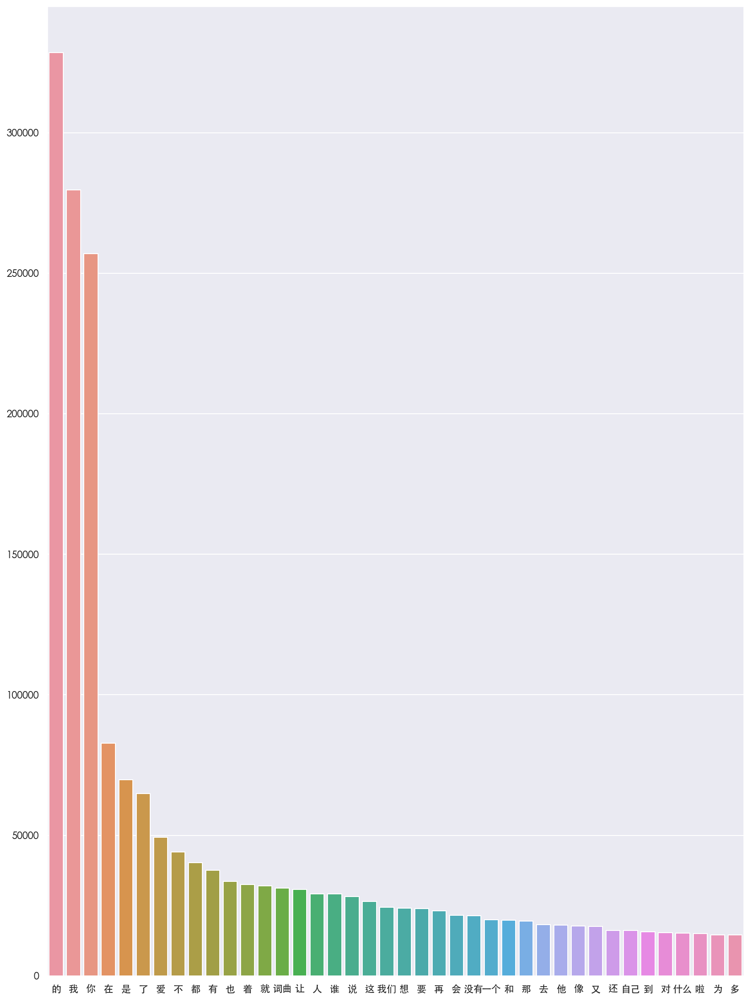

In [125]:
# pd.options.display.max_columns = None
import seaborn as sns
sns.set_style("darkgrid",{"font.sans-serif":['simhei', 'Arial']})
pd.options.display.max_rows = None

sns.set(rc={'figure.figsize':(14,20)})
sns.set
# set Chinese as font for plot
plt.rcParams['font.family'] = ['Heiti TC']

plot_data = X_all_df.sum().sort_values(ascending=False)[0:40]
plot = sns.barplot(x = plot_data.index, y = plot_data);
plot.tick_params(axis='x', rotation=0)

#### 7.3.1. With Stop Words Removed

In [126]:
stopwords(["zh"])

{'、',
 '。',
 '〈',
 '〉',
 '《',
 '》',
 '一',
 '一个',
 '一些',
 '一何',
 '一切',
 '一则',
 '一方面',
 '一旦',
 '一来',
 '一样',
 '一种',
 '一般',
 '一转眼',
 '七',
 '万一',
 '三',
 '上',
 '上下',
 '下',
 '不',
 '不仅',
 '不但',
 '不光',
 '不单',
 '不只',
 '不外乎',
 '不如',
 '不妨',
 '不尽',
 '不尽然',
 '不得',
 '不怕',
 '不惟',
 '不成',
 '不拘',
 '不料',
 '不是',
 '不比',
 '不然',
 '不特',
 '不独',
 '不管',
 '不至于',
 '不若',
 '不论',
 '不过',
 '不问',
 '与',
 '与其',
 '与其说',
 '与否',
 '与此同时',
 '且',
 '且不说',
 '且说',
 '两者',
 '个',
 '个别',
 '中',
 '临',
 '为',
 '为了',
 '为什么',
 '为何',
 '为止',
 '为此',
 '为着',
 '乃',
 '乃至',
 '乃至于',
 '么',
 '之',
 '之一',
 '之所以',
 '之类',
 '乌乎',
 '乎',
 '乘',
 '九',
 '也',
 '也好',
 '也罢',
 '了',
 '二',
 '二来',
 '于',
 '于是',
 '于是乎',
 '云云',
 '云尔',
 '五',
 '些',
 '亦',
 '人',
 '人们',
 '人家',
 '什',
 '什么',
 '什么样',
 '今',
 '介于',
 '仍',
 '仍旧',
 '从',
 '从此',
 '从而',
 '他',
 '他人',
 '他们',
 '他们们',
 '以',
 '以上',
 '以为',
 '以便',
 '以免',
 '以及',
 '以故',
 '以期',
 '以来',
 '以至',
 '以至于',
 '以致',
 '们',
 '任',
 '任何',
 '任凭',
 '会',
 '似的',
 '但',
 '但凡',
 '但是',
 '何',
 '何以',
 '何况',
 '何处',
 '何时',
 '余外',
 '作为',
 '你',
 '你们',
 '使',


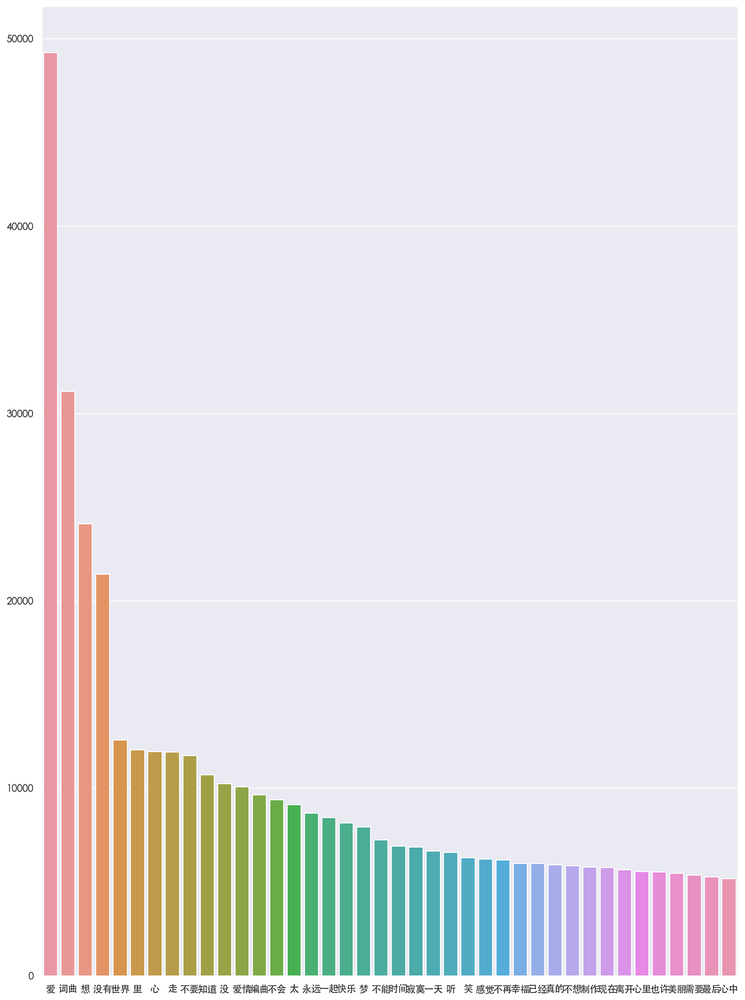

In [127]:
cvec = CountVectorizer(tokenizer=man_token_jie,
                       max_features=10000,
                       stop_words=stopwords(["zh"]))

X_all = cvec.fit_transform(lyrics)
X_all_df = pd.DataFrame(X_all.toarray(), columns =cvec.get_feature_names() )
sns.set_style("darkgrid",{"font.sans-serif":['simhei', 'Arial']})
pd.options.display.max_rows = None

sns.set(rc={'figure.figsize':(14,20)})
sns.set
# set Chinese as font for plot
plt.rcParams['font.family'] = ['Heiti TC']

plot_data = X_all_df.sum().sort_values(ascending=False)[0:40]
plot = sns.barplot(x = plot_data.index, y = plot_data);
plot.tick_params(axis='x', rotation=0)

Inspect top 75 words. Not surprisingly love is the number one? I wonder if this is the same for english songs?

Some of these should be exluded: 
- 词曲 (word): included in lyrics in error during scraping.
- 编曲 (compose: as above
- 制作 (manufacture): as above (I think in this context it is referring to the record label
- 想: many meanings therefore will exclude
- 里: as above
- 心: heart and mind, emotive, keep

The rest look ok.

Some of the top words (roughly translated):
爱  love
没有 not having
不要 must not
爱情 romance
永远 foreve, eternal
一起 together, the same place
快乐 happiness
梦 dreams
不能 not able
时间 time

In [128]:
X_all_df.sum().sort_values(ascending=False)[:75]

爱     49268
词曲    31187
想     24105
没有    21429
世界    12576
里     12058
心     11965
走     11922
不要    11745
知道    10710
没     10253
爱情    10078
编曲     9650
不会     9386
太      9132
永远     8672
一起     8443
快乐     8145
梦      7928
不能     7242
时间     6918
寂寞     6856
一天     6641
听      6586
笑      6294
感觉     6229
不再     6180
幸福     5991
已经     5990
真的     5917
不想     5866
制作     5805
现在     5764
离开     5643
心里     5565
也许     5539
美丽     5472
需要     5376
最后     5264
心中     5166
回忆     5099
相信     5099
今天     5087
想要     5065
喜欢     5046
一次     5022
陪      4965
一生     4944
懂      4824
过去     4820
曾经     4784
是否     4725
未来     4671
温柔     4619
眼泪     4555
我会     4530
问      4471
混音     4459
身边     4396
唱      4394
带      4376
其实     4301
找      4296
生活     4287
生命     4229
忘记     4220
一点     4176
拥抱     4157
总是     4129
一直     4127
怕      4060
失去     4014
明白     4003
希望     3975
等待     3952
dtype: int64

In [129]:
# these look ok too
X_all_df.sum().sort_values(ascending=False)[75:150]

忘     3934
记得    3918
天空    3878
朋友    3863
哭     3841
我要    3799
原来    3779
无法    3684
人生    3663
讲     3610
明天    3607
手     3542
不到    3538
告诉    3480
孤单    3464
变成    3438
慢慢    3377
自由    3342
能够    3311
以后    3307
每个    3279
路     3254
拥有    3242
故事    3227
未     3226
女     3181
眼睛    3171
想起    3167
男     3142
继续    3137
不必    3124
应该    3121
错     3121
愿     3114
看见    3110
愿意    3105
看着    3058
声     2988
思念    2968
喔     2967
改变    2962
变     2958
快     2935
音乐    2933
发现    2933
再见    2914
风     2910
有人    2907
青春    2905
留下    2890
伤心    2869
吉他    2833
放弃    2811
微笑    2805
地方    2789
终于    2783
温暖    2764
真     2754
觉得    2752
感情    2751
回头    2746
期待    2726
话     2711
害怕    2677
总     2667
越     2642
吻     2640
飞     2638
从前    2613
轻轻    2612
面对    2610
孤独    2609
难     2579
习惯    2570
似     2568
dtype: int64

In [47]:
updated_stopwords = list(stopwords(["zh"]))
updated_stopwords.extend(['词曲','编曲','制作','想','里'])
updated_stopwords = set(updated_stopwords)

{'、',
 '。',
 '〈',
 '〉',
 '《',
 '》',
 '一',
 '一个',
 '一些',
 '一何',
 '一切',
 '一则',
 '一方面',
 '一旦',
 '一来',
 '一样',
 '一种',
 '一般',
 '一转眼',
 '七',
 '万一',
 '三',
 '上',
 '上下',
 '下',
 '不',
 '不仅',
 '不但',
 '不光',
 '不单',
 '不只',
 '不外乎',
 '不如',
 '不妨',
 '不尽',
 '不尽然',
 '不得',
 '不怕',
 '不惟',
 '不成',
 '不拘',
 '不料',
 '不是',
 '不比',
 '不然',
 '不特',
 '不独',
 '不管',
 '不至于',
 '不若',
 '不论',
 '不过',
 '不问',
 '与',
 '与其',
 '与其说',
 '与否',
 '与此同时',
 '且',
 '且不说',
 '且说',
 '两者',
 '个',
 '个别',
 '中',
 '临',
 '为',
 '为了',
 '为什么',
 '为何',
 '为止',
 '为此',
 '为着',
 '乃',
 '乃至',
 '乃至于',
 '么',
 '之',
 '之一',
 '之所以',
 '之类',
 '乌乎',
 '乎',
 '乘',
 '九',
 '也',
 '也好',
 '也罢',
 '了',
 '二',
 '二来',
 '于',
 '于是',
 '于是乎',
 '云云',
 '云尔',
 '五',
 '些',
 '亦',
 '人',
 '人们',
 '人家',
 '什',
 '什么',
 '什么样',
 '今',
 '介于',
 '仍',
 '仍旧',
 '从',
 '从此',
 '从而',
 '他',
 '他人',
 '他们',
 '他们们',
 '以',
 '以上',
 '以为',
 '以便',
 '以免',
 '以及',
 '以故',
 '以期',
 '以来',
 '以至',
 '以至于',
 '以致',
 '们',
 '任',
 '任何',
 '任凭',
 '会',
 '似的',
 '但',
 '但凡',
 '但是',
 '何',
 '何以',
 '何况',
 '何处',
 '何时',
 '余外',
 '作为',
 '你',
 '你们',
 '使',


In [356]:
updated_stopwords

{'、',
 '。',
 '〈',
 '〉',
 '《',
 '》',
 '一',
 '一个',
 '一些',
 '一何',
 '一切',
 '一则',
 '一方面',
 '一旦',
 '一来',
 '一样',
 '一种',
 '一般',
 '一转眼',
 '七',
 '万一',
 '三',
 '上',
 '上下',
 '下',
 '不',
 '不仅',
 '不但',
 '不光',
 '不单',
 '不只',
 '不外乎',
 '不如',
 '不妨',
 '不尽',
 '不尽然',
 '不得',
 '不怕',
 '不惟',
 '不成',
 '不拘',
 '不料',
 '不是',
 '不比',
 '不然',
 '不特',
 '不独',
 '不管',
 '不至于',
 '不若',
 '不论',
 '不过',
 '不问',
 '与',
 '与其',
 '与其说',
 '与否',
 '与此同时',
 '且',
 '且不说',
 '且说',
 '两者',
 '个',
 '个别',
 '中',
 '临',
 '为',
 '为了',
 '为什么',
 '为何',
 '为止',
 '为此',
 '为着',
 '乃',
 '乃至',
 '乃至于',
 '么',
 '之',
 '之一',
 '之所以',
 '之类',
 '乌乎',
 '乎',
 '乘',
 '九',
 '也',
 '也好',
 '也罢',
 '了',
 '二',
 '二来',
 '于',
 '于是',
 '于是乎',
 '云云',
 '云尔',
 '五',
 '些',
 '亦',
 '人',
 '人们',
 '人家',
 '什',
 '什么',
 '什么样',
 '今',
 '介于',
 '仍',
 '仍旧',
 '从',
 '从此',
 '从而',
 '他',
 '他人',
 '他们',
 '他们们',
 '以',
 '以上',
 '以为',
 '以便',
 '以免',
 '以及',
 '以故',
 '以期',
 '以来',
 '以至',
 '以至于',
 '以致',
 '们',
 '任',
 '任何',
 '任凭',
 '会',
 '似的',
 '但',
 '但凡',
 '但是',
 '何',
 '何以',
 '何况',
 '何处',
 '何时',
 '余外',
 '作为',
 '你',
 '你们',
 '使',


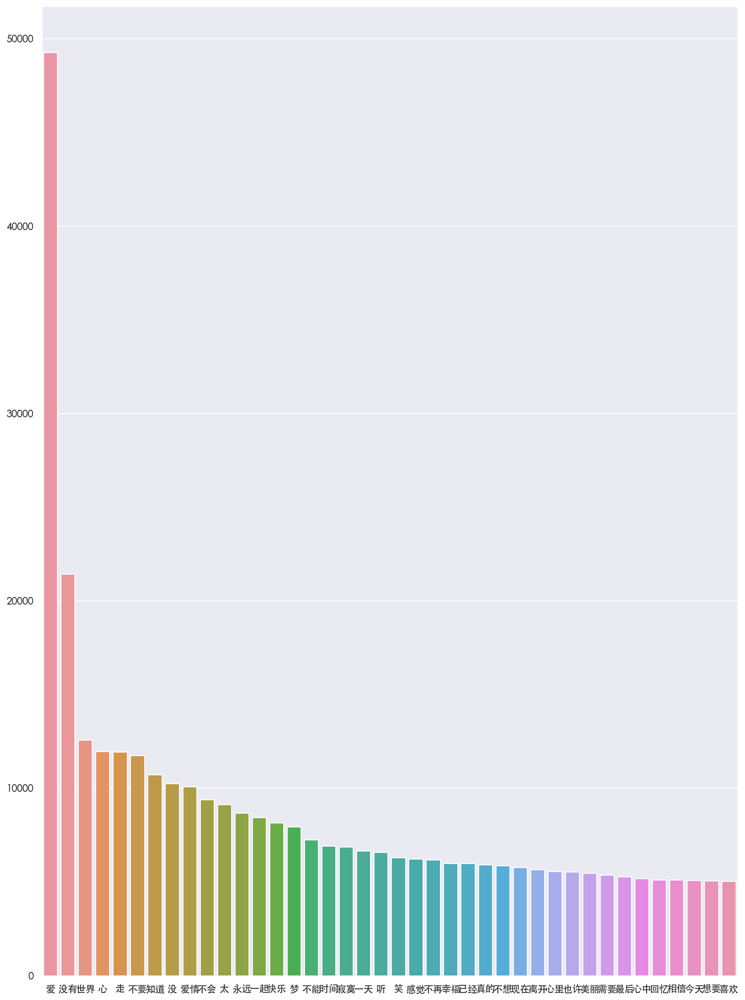

In [131]:
# check this has worked: 
cvec = CountVectorizer(tokenizer=man_token_jie,
                       max_features=10000,
                       stop_words=updated_stopwords)

X_all = cvec.fit_transform(lyrics)
X_all_df = pd.DataFrame(X_all.toarray(), columns =cvec.get_feature_names() )
sns.set_style("darkgrid",{"font.sans-serif":['simhei', 'Arial']})
pd.options.display.max_rows = None

sns.set(rc={'figure.figsize':(14,20)})
sns.set
# set Chinese as font for plot
plt.rcParams['font.family'] = ['Heiti TC']

plot_data = X_all_df.sum().sort_values(ascending=False)[0:40]
plot = sns.barplot(x = plot_data.index, y = plot_data);
plot.tick_params(axis='x', rotation=0)

In [132]:
X_all_df = pd.DataFrame(X_all.toarray(), columns =cvec.get_feature_names() )

X_all_df_filtered1 = pd.DataFrame(X_all_df.sum().sort_values(ascending=False)[:100])
additional_stops1 = X_all_df_filtered1.index

X_all_df_filtered2 = pd.DataFrame(X_all_df.sum().sort_values(ascending=False)[:300])
additional_stops2 = X_all_df_filtered2.index

In [133]:
X_all_df_filtered.index

Index(['爱', '没有', '世界', '心', '走', '不要', '知道', '没', '爱情', '不会', '太', '永远', '一起',
       '快乐', '梦', '不能', '时间', '寂寞', '一天', '听', '笑', '感觉', '不再', '幸福', '已经',
       '真的', '不想', '现在', '离开', '心里', '也许', '美丽', '需要', '最后', '心中', '回忆', '相信',
       '今天', '想要', '喜欢', '一次', '陪', '一生', '懂', '过去', '曾经', '是否', '未来', '温柔',
       '眼泪', '我会', '问', '混音', '身边', '唱', '带', '其实', '找', '生活', '生命', '忘记',
       '一点', '拥抱', '总是', '一直', '怕', '失去', '明白', '希望', '等待', '忘', '记得', '天空',
       '朋友', '哭', '我要', '原来', '无法', '人生', '讲', '明天', '手', '不到', '告诉', '孤单',
       '变成', '慢慢', '自由', '能够', '以后', '每个', '路', '拥有', '故事', '未', '女', '眼睛',
       '想起', '男', '继续'],
      dtype='object')

In [134]:
# Also create stopword list that excludes top 100
updated_stopwords_2 = list(updated_stopwords)
updated_stopwords_2.extend(additional_stops1)
updated_stopwords_2 = set(updated_stopwords_2)
updated_stopwords_2

# Also create stopword list that excludes top 300
updated_stopwords_3 = list(updated_stopwords)
updated_stopwords_3.extend(additional_stops2)
updated_stopwords_3 = set(updated_stopwords_3)
updated_stopwords_3

{'矣乎',
 '巴',
 '沿',
 '么',
 '呀',
 '青春',
 '改变',
 '待',
 '还要',
 '一则',
 '这么',
 '及',
 '矣哉',
 '不会',
 '从来',
 '如是',
 '孰料',
 '呵呵',
 '为了',
 '它',
 '处在',
 '甚且',
 '各个',
 '不如',
 '年',
 '是的',
 '习惯',
 '离开',
 '与其说',
 '乃至于',
 '往',
 '有时',
 '心情',
 '就',
 '为什么',
 '因而',
 '论',
 '一种',
 '不得',
 '庶乎',
 '一片',
 '远',
 '你们',
 '就是',
 '无法',
 '反而',
 '心',
 '云尔',
 '一旦',
 '设使',
 '沉默',
 '是不是',
 '起来',
 '何以',
 '留下',
 '果真',
 '真的',
 '清楚',
 '但',
 '嘘',
 '像',
 '哪儿',
 '先不先',
 '同',
 '已经',
 '陪',
 '太阳',
 '点',
 '简单',
 '眼神',
 '分手',
 '归齐',
 '或则',
 '同时',
 '被',
 '鄙人',
 '应该',
 '４',
 '其余',
 '只当',
 '吉他',
 '咋',
 '前此',
 '〉',
 '嘎',
 '不尽',
 '非但',
 '不特',
 '不至于',
 '再则',
 '只要',
 '加以',
 '毋宁',
 '首先',
 '余外',
 '６',
 '出现',
 '而',
 '看见',
 '难',
 '旁人',
 '然而',
 '其中',
 '可是',
 '％',
 '痛苦',
 '仍',
 '某些',
 '可能',
 '类如',
 '回来',
 '其他',
 '有及',
 '称',
 '曾',
 '一切',
 '越',
 '伤',
 '以上',
 '腾',
 '冲',
 '那儿',
 '似',
 '关于',
 '１',
 '果然',
 '没奈何',
 '归',
 '不若',
 '分',
 '许多',
 '＜',
 '再见',
 '唯一',
 '？',
 '不能',
 '设或',
 '人',
 '随时',
 '正值',
 '倘或',
 '不',
 '用来',
 '继之',
 '只能',
 '不拘',
 '固然',
 '那会儿',

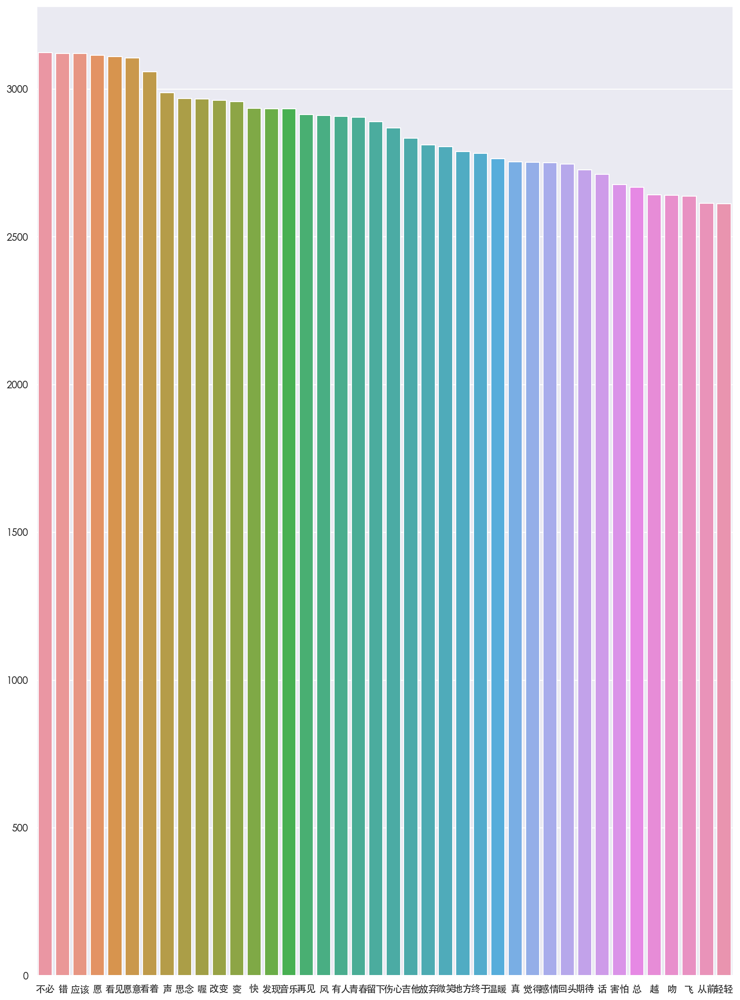

In [135]:
# check this has worked: 
cvec = CountVectorizer(tokenizer=man_token_jie,
                       max_features=10000,
                       stop_words=updated_stopwords_2)

X_all = cvec.fit_transform(lyrics)
X_all_df = pd.DataFrame(X_all.toarray(), columns =cvec.get_feature_names() )
sns.set_style("darkgrid",{"font.sans-serif":['simhei', 'Arial']})
pd.options.display.max_rows = None

sns.set(rc={'figure.figsize':(14,20)})
sns.set
# set Chinese as font for plot
plt.rcParams['font.family'] = ['Heiti TC']

plot_data = X_all_df.sum().sort_values(ascending=False)[0:40]
plot = sns.barplot(x = plot_data.index, y = plot_data);
plot.tick_params(axis='x', rotation=0)

## 8. Create English Song Data File

In [1]:
english_tracks = grab_song_from_playlist(
    'spotify:playlist:5IgEf6pGG8q565BqhApd7x', 'english_tracks')

In [ ]:
# For each artist scrape similar artists and save the artist details in a new dataframe
df_eg_playlist_similar_artists = pd.DataFrame()
for ind, i in enumerate(english_tracks['artist_uri']):
    try:
        df_eg_playlist_similar_artists = df_eg_playlist_similar_artists.append(
            scrape_similar_artists(i))
    except:
        pass

df_similar_english_lang_artists = df_eg_playlist_similar_artists.drop_duplicates(
    subset='artist_id', keep="last")

In [ ]:
df_similar_english_lang_artists_expand = scrape_similar_artists_expansion(
    df_similar_english_lang_artists)

In [ ]:
# Loop through all of the artists scraped in 3.0 and get a list of albums
# Here we run through only the first 2 artists as an example
empty_list_albums = []

for artist_uri in tqdm(df_similar_english_lang_artists['artist_uri']):
    album_uri_temp = sp.artist_albums(artist_uri)
    for ind, i in enumerate(album_uri_temp['items']):
        empty_list_albums.append(album_uri_temp['items'][ind]['uri'])

In [ ]:
# loop through all the albums and get track ids for each (top 2 only here)
empty_list_tracks3 = []
for album in tqdm(empty_list_albums):
    temp = sp.album_tracks(album)['items']
    for ind, track in enumerate(temp):
        try:
            empty_list_tracks3.append(
                sp.album_tracks(album)['items'][ind]['uri'])
        except:
            pass

In [ ]:
# Loop through list of track IDs and get song information
tracks = []
for i in tqdm(empty_list_tracks3):
    try:
        track = getTrackFeatures(i)
        tracks.append(track)
    except:
        pass

In [73]:
df_english_tracks_master = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_english_tracks_master.csv',
    sep=',',
    index_col=0)
df_english_tracks_master.shape

(8742, 29)

In [74]:
artists = pd.DataFrame(
    df_english_tracks_master.artist.drop_duplicates().dropna())

In [75]:
artists['genre'] = artists

In [76]:
artists.head()

,artist,genre
1,Tom Grennan,Tom Grennan
75,Calvin Harris,Calvin Harris
88,Ella Henderson,Ella Henderson
94,The Hunna,The Hunna
311,Inhaler,Inhaler


In [78]:
def get_artist_genre(x):
    try:
        artist_uri = sp.search(
            x)['tracks']['items'][0]['album']['artists'][0]['uri']
        artist_genre = sp.artist(artist_uri)['genres'][0]
        return artist_genre
    except:
        return np.nan

In [79]:
artists['genre'] = artists.genre.apply(get_artist_genre)

In [80]:
df_english_tracks_master_genre = df_english_tracks_master.merge(artists,
                                                                on='artist',
                                                                how='inner')

In [82]:
df_english_tracks_master_genre.to_csv('df_english_tracks_master_genre.csv')

## 9. Some Modelling

In [24]:
# import data file
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

### 9.1. Logistic Regression to identify songs in Cantonese
#### Summary
Artis genre was available for ~85% of all songs. Of those with genre available roughly 23% are classified as "Cantopop". Taking random samples from this subset showed that many of the songs in this category are sung in Cantonese rather than Mandarin (although they are written with the same characters) and these may therefore 
need to be excluded. 

It would be helpful if I could identify songs that are "Cantopop" where genre is not available so these could also be excluded...

#### Question: Is it possible to train a model to identify  songs in the genre "Cantopop" using the subset of songs where genre is available and to then apply this model to the rest of the data where no genre is available?

The challenge with this approach is that "Cantopop" does not strictly mean the song is sang in Cantonese. In addition genre information is available on a artist basis rather than per song.


Model 5 proved to be the most effective model in classifying songs into the genre "Cantopop" with a final recall rate of 87%. Precision rates were disapointing (e.g. 60% for minority class in the test data) albeit not surprising. As I highlighted before there are fundamental limitations to this model given the genre "Cantopop" does not strictly mean that the song will be sung in Cantonese. I applied model 5 to the songs where no genre is available as shown below. However, I decided to not exclude Cantopop from the dataset given the unreliability of the model and that it would result in an unnecessarily large loss of in scope songs. 

#### 9.1.1. Preprocessing
Inspecting the data and creating X and Y variables. Classification will be between Cantopop (27%) and other genres. 

In [9]:
df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre2.value_counts(normalize=True)

cantopop             0.274605
classic mandopop     0.200139
taiwan pop           0.133954
mandopop             0.107493
chinese indie        0.035930
                       ...   
kayokyoku            0.000033
anime rock           0.000033
blues rock           0.000033
taiwan electronic    0.000033
xinyao               0.000033
Name: Genre2, Length: 64, dtype: float64

Looking at the subset of songs where genre is available create a binary logistic regresssion to identify which songs are Cantonese. 

In [10]:
# Create a new column which identifies if a song is Cantopop, other genre, or no genre available
df_c = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_c['is_canto'] = np.nan
df_c['is_canto'][(df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre2.notnull()) |
    (df_tracks_master_clean3_lyrics_genre_hsk_v2.Genre3.notnull())] = 0
df_c['is_canto'][(df_c.Genre2 == 'cantopop') |
                 (df_c.Genre3 == 'classic cantopop')] = 1

In [11]:
display(df_c['is_canto'].value_counts(dropna=False))
display(df_c['is_canto'].value_counts(normalize=True, dropna=False))

0.0    21906
1.0     8403
NaN     5612
Name: is_canto, dtype: int64

0.0    0.609838
1.0    0.233930
NaN    0.156232
Name: is_canto, dtype: float64

In [12]:
# Crate a new data
df_c_clean = df_c[df_c.is_canto.notnull()]

In [13]:
display(df_c_clean['is_canto'].value_counts(dropna=False))
display(df_c_clean['is_canto'].value_counts(normalize=True, dropna=False))

0.0    21906
1.0     8403
Name: is_canto, dtype: int64

0.0    0.722756
1.0    0.277244
Name: is_canto, dtype: float64

Approximately 27% of the songs are classified as Cantopop

In [14]:
y = df_c_clean['is_canto']
X = df_c_clean['lyrics']

In [10]:
X.shape[0], y.shape[0]

(30309, 30309)

#### 9.1.2. Function for plots
A function to show ROC, confusion matrix etc. for models.

In [15]:
# Function to return some plots for Logistic Regression
def logist_plots(lr, X_train, y_train, X_test, y_test):

    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, plot_confusion_matrix
    from sklearn.metrics import plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve, roc_auc_score, average_precision_score
    from matplotlib.colors import ListedColormap
    import scikitplot as skplt

    # classification report
    predictions_train = lr.predict(X_train)
    predictions_test = lr.predict(X_test)
    print('y_train classification report:')
    print(classification_report(y_train, predictions_train))
    print('y_test classification report:')
    print(classification_report(y_test, predictions_test))

    # plot the confusion matrix
    fig, ax = plt.subplots(ncols=2, figsize=(14, 6), sharey=True)
    plot_confusion_matrix(lr,
                          X_train,
                          y_train,
                          cmap='Blues',
                          ax=ax[0],xticks_rotation='vertical' )
    plot_confusion_matrix(lr,
                          X_test,
                          y_test,
                          cmap='Blues',
                          ax=ax[1],xticks_rotation='vertical')
    
    for a in ax:
        texts = a.texts
        for text in texts:
            text.set_size(20)
    plt.show()

    # ROC  curves:
    print('ROC Curves:')
    fig_rec, ax_rec = plt.subplots(ncols=2, figsize=(12, 6), sharey=True)
    cmap = ListedColormap(sns.color_palette("husl", len(lr.classes_)))
    probabilities_train = lr.predict_proba(X_train)
    probabilities_test = lr.predict_proba(X_test)
    skplt.metrics.plot_roc(y_train,
                           probabilities_train,
                           cmap=cmap,
                           ax=ax_rec[0])
    skplt.metrics.plot_roc(y_test, probabilities_test, cmap=cmap, ax=ax_rec[1])
    ax_rec[0].set_title('Train')
    ax_rec[1].set_title('Test')
    plt.show()

    # Precision Recall:
    print('Precision Recall Curve:')
    fig_prec, ax_prec = plt.subplots(ncols=2, figsize=(12, 6), sharey=True)
    cmap = ListedColormap(sns.color_palette("husl", len(lr.classes_)))
    probabilities_train = lr.predict_proba(X_train)
    probabilities_test = lr.predict_proba(X_test)
    skplt.metrics.plot_precision_recall(y_train,
                                        probabilities_train,
                                        cmap=cmap,
                                        ax=ax_prec[0])
    skplt.metrics.plot_precision_recall(y_test,
                                        probabilities_test,
                                        cmap=cmap,
                                        ax=ax_prec[1])
    ax_prec[0].set_title('Train')
    ax_prec[1].set_title('Test')
    plt.show()

#     # Plot False Positive Rate and Accuracy Change Threshold
#     #  false positive rate as threshold changed:
#     print('Threholds (test data) impact on Accuracy / False Positive Rate:')
#     false_positives = []
#     for thresh in np.arange(1, 100) / 100.:
#         labeled_1 = np.array(
#             [1 if x >= thresh else 0 for x in lr.predict_proba(X_test)[:, 1]])
#         fp = np.mean((y_test == 0) & (labeled_1 == 1))
#         false_positives.append((thresh, fp))
#     #     print('Threshold:', thresh, 'false positives:', fp)
#     false_positives = np.array(false_positives)

#     #  accuracy change with threshold
#     accuracies = []
#     for thresh in np.arange(1, 100) / 100.:
#         labeled_1 = np.array(
#             [1 if x >= thresh else 0 for x in lr.predict_proba(X_test)[:, 1]])
#         acc = np.mean(y_test == labeled_1)
#         accuracies.append((thresh, acc))
#     #     print('Threshold:', thresh, 'Correct predictions:', acc)
#     accuracies = np.array(accuracies)

#     fig_acc, ax_acc = plt.subplots(ncols=2, figsize=(12, 6), sharey=True)
#     ax_acc[0].plot(false_positives[:, 0], false_positives[:, 1], lw=2)
#     ax_acc[0].set_xlabel('threshold')
#     ax_acc[0].set_ylabel('false positive fraction')

#     ax_acc[1].plot(*accuracies.T, lw=2)
#     ax_acc[1].set_xlabel('threshold')
#     ax_acc[1].set_ylabel('accuracy')
#     plt.show()

#### 9.1.3. Tokenizing Lyrics
I initially ran the logistic regression model using SnowNLP (as used in previous EDA stages) to tokenize the lyrics. However, the model performed poorly and was slow to run. I switched to an alernative tokenizer "Jieba", which increased computation time and improved results and I have used this in the models below. 

In [18]:
# Import Jieba to tokenize lyrics
import jieba.posseg as pseg
import jieba

In [18]:
# Turn off warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Demonstration of Jieba, note it recognises that 朋 and 友 together form the word 朋友 -> friend
sentence = '你是我的好朋友'
jieba.lcut(sentence)

['你', '是', '我', '的', '好', '朋友']

In [17]:
# Create a customer tokenizer using JieBa to account for Mandarin
def man_token_jie(x):
    return jieba.lcut(x)

#### 9.1.4. Logistic Regression Model (1)
The mean cross validated score suggests that we can expect to make correct classifications in 85% of cases which compares with the base line of 72% if we were to apply the majority class. From the classification report it can be seen that the model tends to favour the majority class which resulted in a training recall score of 65% for the minority class which in turn impacted the precision scores of both classes.

Could the recall of the minority class (Cantopop) be improved by assigning weights?


In [22]:
# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

In [23]:
# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=1000)
cvec.fit(X_train)
cvec.get_feature_names()[:5]

['一', '一下', '一世', '一个', '一些']

In [24]:
# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

In [25]:
# Import and fit a logistic regression model and test
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)
lr = LogisticRegression(solver='lbfgs', multi_class='ovr')
lr.fit(X_train, y_train)
lr_scores = cross_val_score(lr, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(lr.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(lr.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

Base line score: 0.723
Training Score: 0.866
Test Score: 0.856
Cross-validated training scores: [0.8524 0.8507 0.8497 0.8492 0.8391]
Mean cross-validated training score: 0.848 



Scores reflects the mean accuracy on the given test data and labels:
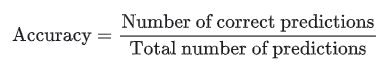

The mean cross validated score suggests that we can expect to make correct classifications in 85% of cases which compares with the base line of 72% if we were to apply the majority class. From the classification report it can be seen that the model tends to favour the majority class which resulted in a training recall score of 65% for the minority class which in turn impacted the precision scores of both classes.

Could the recall of the minority class (is Cantonese) be improved by assigning weights?

y_train classification report:
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91     17525
         1.0       0.83      0.65      0.73      6722

    accuracy                           0.87     24247
   macro avg       0.85      0.80      0.82     24247
weighted avg       0.86      0.87      0.86     24247

y_test classification report:
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.90      4381
         1.0       0.81      0.63      0.71      1681

    accuracy                           0.86      6062
   macro avg       0.84      0.79      0.81      6062
weighted avg       0.85      0.86      0.85      6062



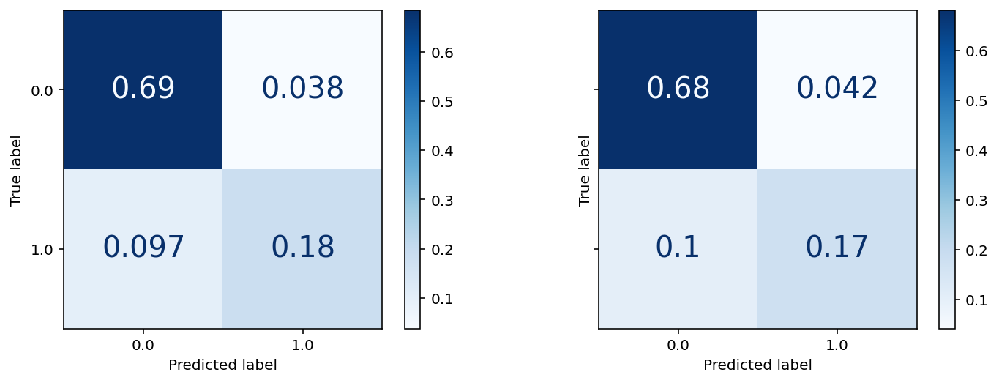

ROC Curves:


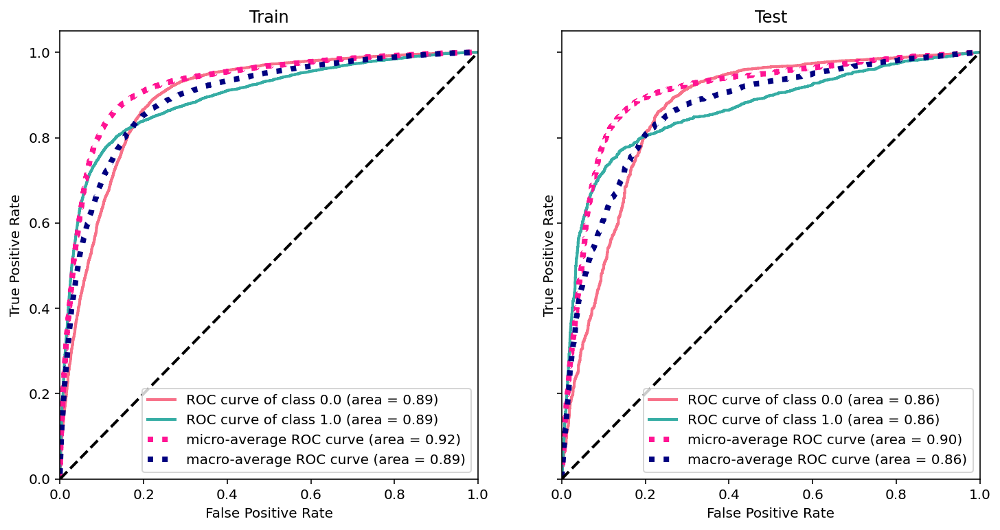

Precision Recall Curve:


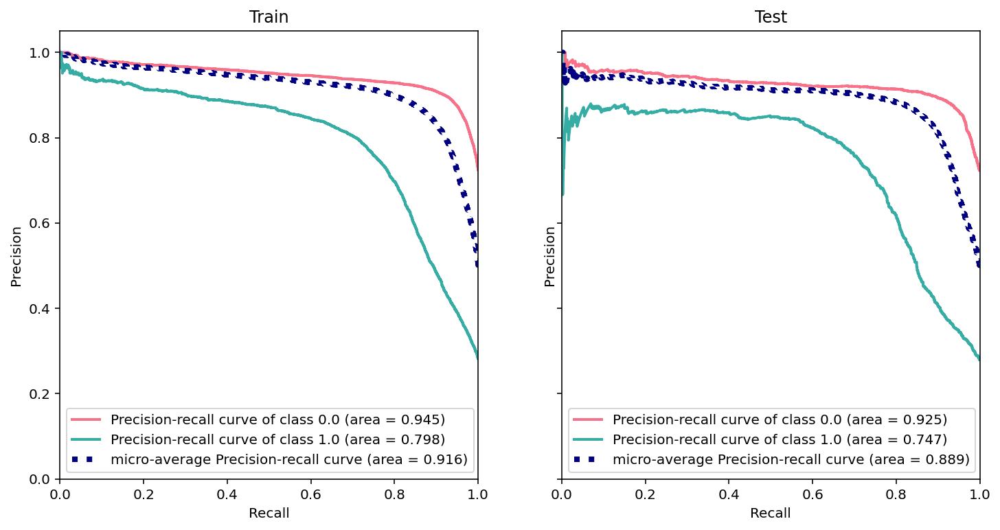

Threholds (test data) impact on Accuracy / False Positive Rate:


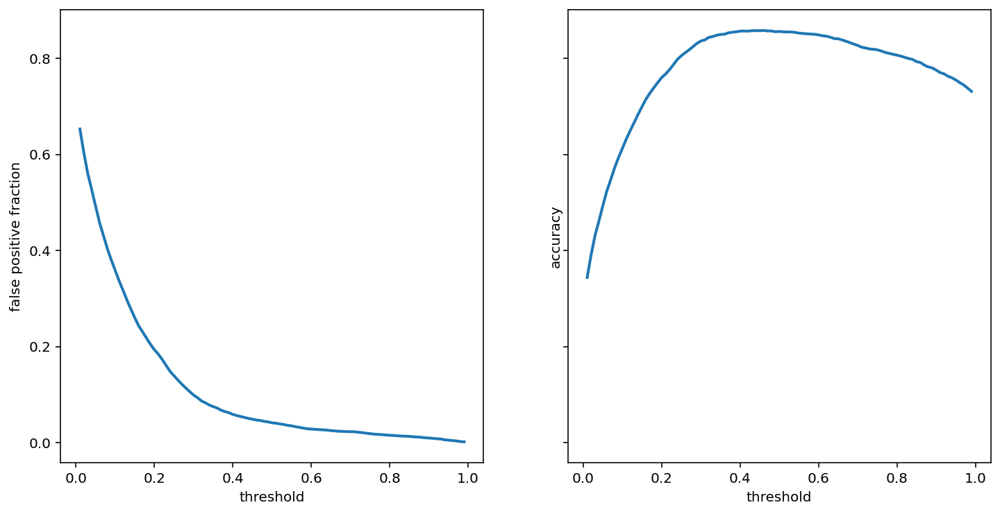

In [26]:
logist_plots(lr,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.1.5. Logistic Regression Model (2):  weights assigned to each class
Assigning a weight of 2 to the minority class improved the test recall rate from 63% previously to 81%. This was at the expense of majority class recall which declined from 94% to 76%. The mean cross validation score was 77% only slighlty ahead of the base line. 

Base line score: 0.723
Training Score: 0.798
Test Score: 0.773
Cross-validated training scores: [0.7833 0.7736 0.7639 0.7771 0.7684]
Mean cross-validated training score: 0.773 

y_train classification report:
              precision    recall  f1-score   support

         0.0       0.93      0.78      0.85     17525
         1.0       0.59      0.86      0.70      6722

    accuracy                           0.80     24247
   macro avg       0.76      0.82      0.77     24247
weighted avg       0.84      0.80      0.81     24247

y_test classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.76      0.83      4381
         1.0       0.56      0.81      0.67      1681

    accuracy                           0.77      6062
   macro avg       0.74      0.79      0.75      6062
weighted avg       0.82      0.77      0.78      6062



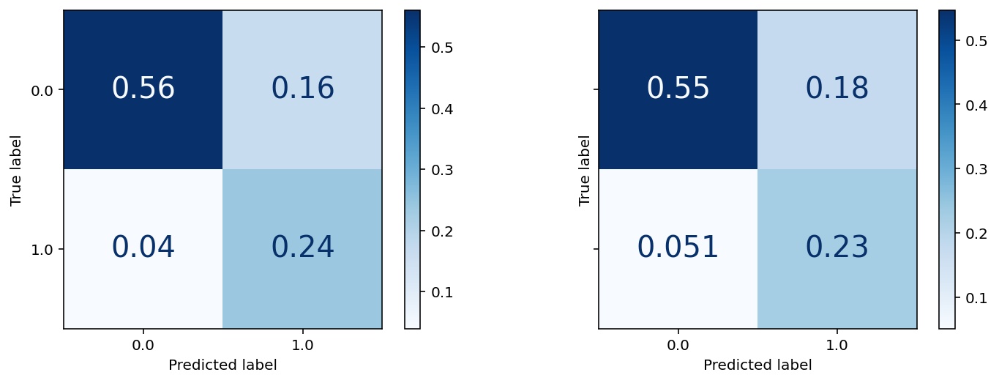

ROC Curves:


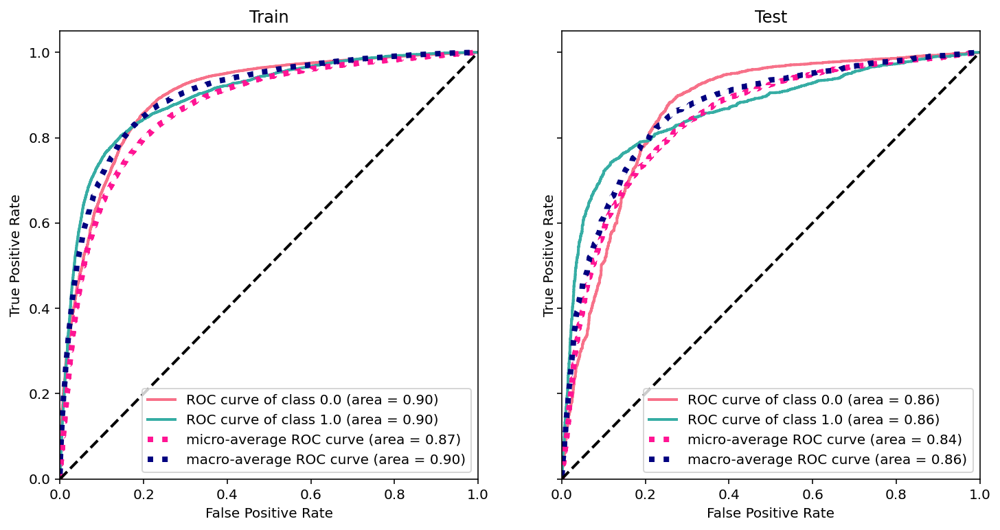

Precision Recall Curve:


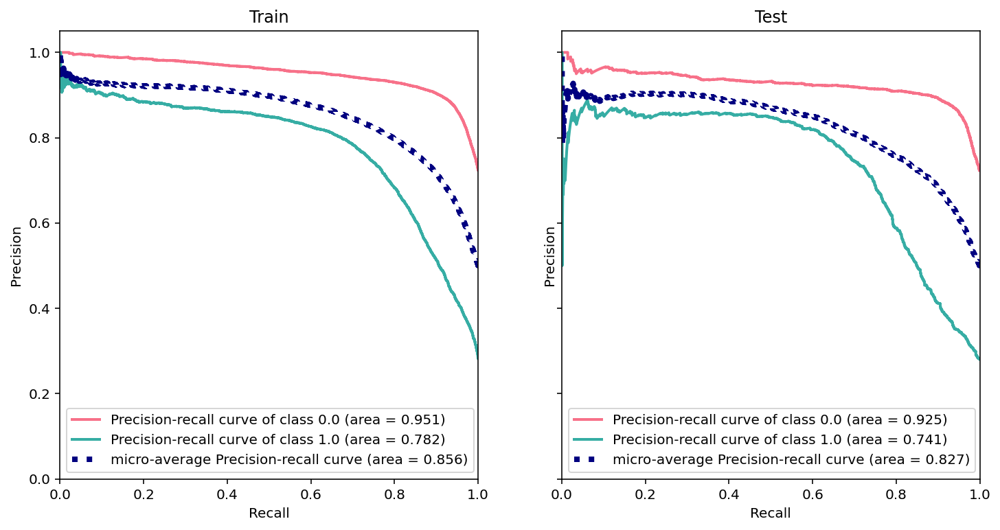

Threholds (test data) impact on Accuracy / False Positive Rate:


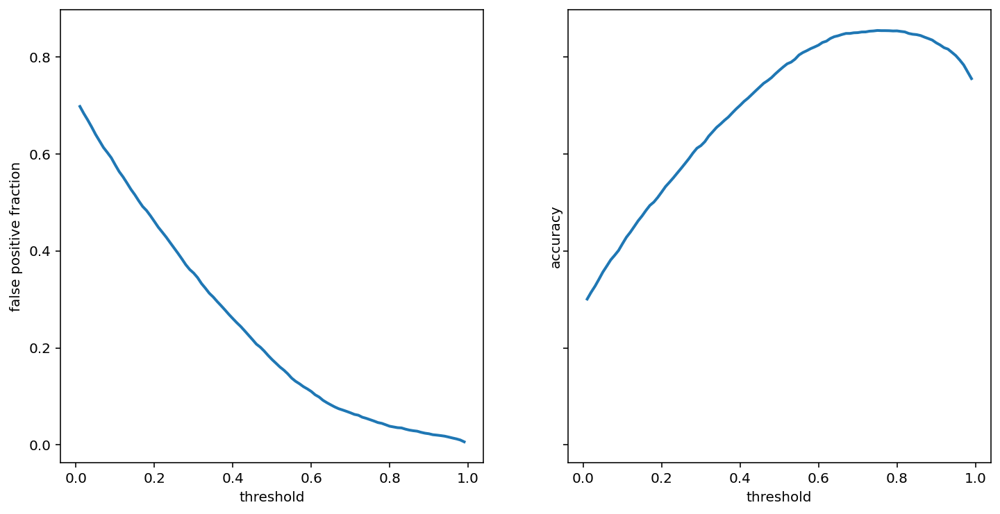

In [27]:
# Import and fit a logistic regression model and test
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

# assign weights to the classes
w = {0: 1, 1: 4}
lr = LogisticRegression(solver='lbfgs', multi_class='ovr', class_weight=w)
lr.fit(X_train, y_train)
lr_scores = cross_val_score(lr, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(lr.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(lr.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')
logist_plots(lr,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.1.6. Logistic Regression Model (3):  increasing the number of features to include
I increased the number of max_features from 1000 to 5000. This increased the computation time but resulted in improved scores. The comparatively stronger training score of 90% compared with the mean cross val score of 78% suggests the model could be overfit. The recall of the minority class of 75% in the test data remains low. This could be improved by further increasing the weight applied to the minority class.


Base line score: 0.723
Training Score: 0.903
Test Score: 0.794
Cross-validated training scores: [0.7825 0.7723 0.7784 0.791  0.7847]
Mean cross-validated training score: 0.782 

y_train classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.88      0.93     13143
         1.0       0.76      0.96      0.84      5042

    accuracy                           0.90     18185
   macro avg       0.87      0.92      0.89     18185
weighted avg       0.92      0.90      0.91     18185

y_test classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.81      0.85      8763
         1.0       0.60      0.75      0.67      3361

    accuracy                           0.79     12124
   macro avg       0.75      0.78      0.76     12124
weighted avg       0.81      0.79      0.80     12124



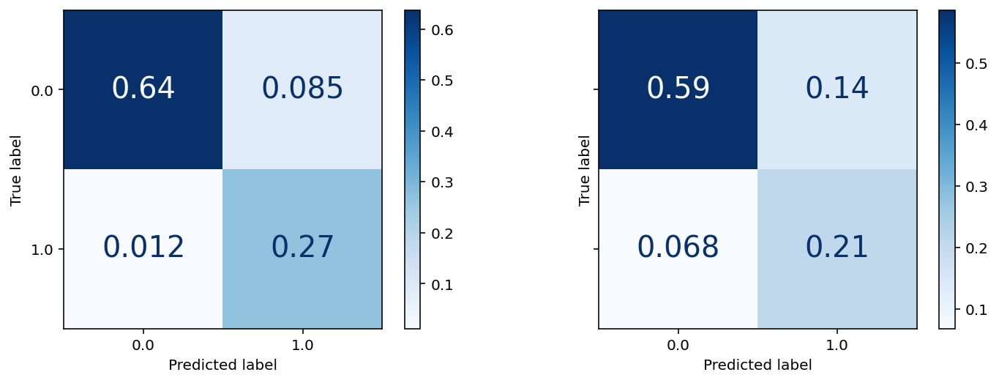

ROC Curves:


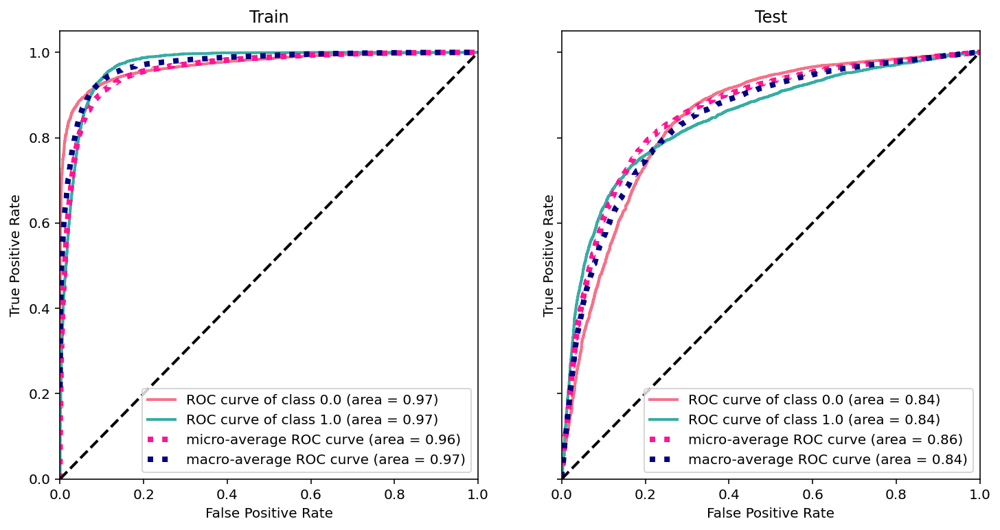

Precision Recall Curve:


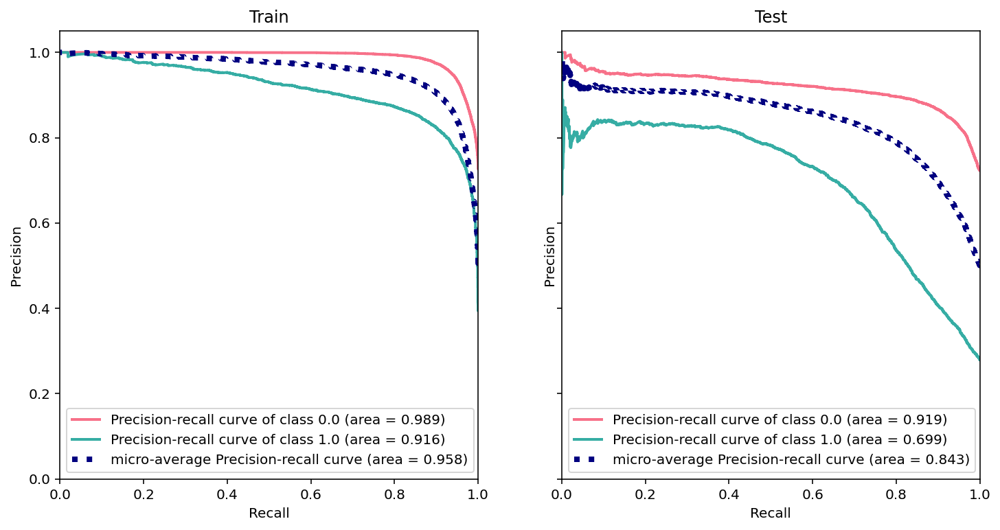

Threholds (test data) impact on Accuracy / False Positive Rate:


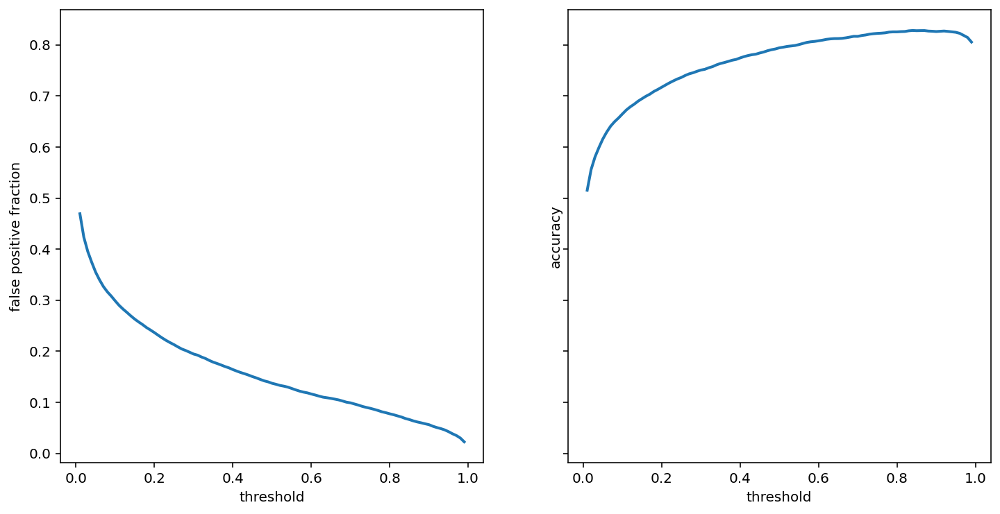

In [28]:
# Get Tran test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.4,
                                                    random_state=1)

cvec = CountVectorizer(tokenizer=man_token_jie, max_features=5000)
cvec.fit(X_train)
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

# Import and fit a logistic regression model and test
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)
w = {0: 1, 1: 4}
lr = LogisticRegression(solver='lbfgs', multi_class='ovr', class_weight=w)
lr.fit(X_train, y_train)
lr_scores = cross_val_score(lr, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(lr.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(lr.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')
logist_plots(lr=lr,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.1.7. Logistic Regression Model (4):  with cross validation
I experimented with using Logistic Regression with cross validation to improve regularization. I used StratifiedKFold so that the split of classes was kept balanced during cross validation. To reduce computation time I tried only three alpha values and three L1 ratios and set the max_iterations to 100. Finally I cranked up the weight on the minority class to six (previously set at four) to try and further increase recall of the minority class.

Given that I increased the weighting on the minority class the training score is not directly comparable with the previous model and based on this metric alone would make this model look inferior. However, this is due to the lower  precision for the majority class which came at the expense of improving recall for the minority class which increased to 84% in the test data from 73% previously. The training, test and mean cross validation scores are more closely alligned (75-87%) suggesting that the model is less overfit. Overall this model is an improvement on previous ones however the model performance remains poor. 

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Loading model cost 0.527 seconds.
Prefix dict has been built successfully.


LRCV Model:
LRCV Best alpha: [10000.]
Best l1-ratio: [0.001]
LRCV CV Training score: 0.8566950783612868
LRCV Test Score: 0.7732596502804355 

ROC Train and Test Score: 0.961037442977279 0.8676157526219471
Cross-validated training scores: [0.7778 0.7696 0.7586 0.7806 0.7677]
Mean cross-validated training score: 0.771 

y_train classification report:
              precision    recall  f1-score   support

         0.0       0.98      0.81      0.89     13143
         1.0       0.67      0.97      0.79      5042

    accuracy                           0.86     18185
   macro avg       0.83      0.89      0.84     18185
weighted avg       0.90      0.86      0.86     18185

y_test classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.75      0.83      8763
         1.0       0.56      0.83      0.67      3361

    accuracy                           0.77     12124
   macro avg       0.74      0.79      0.75     12124
weighted avg       0

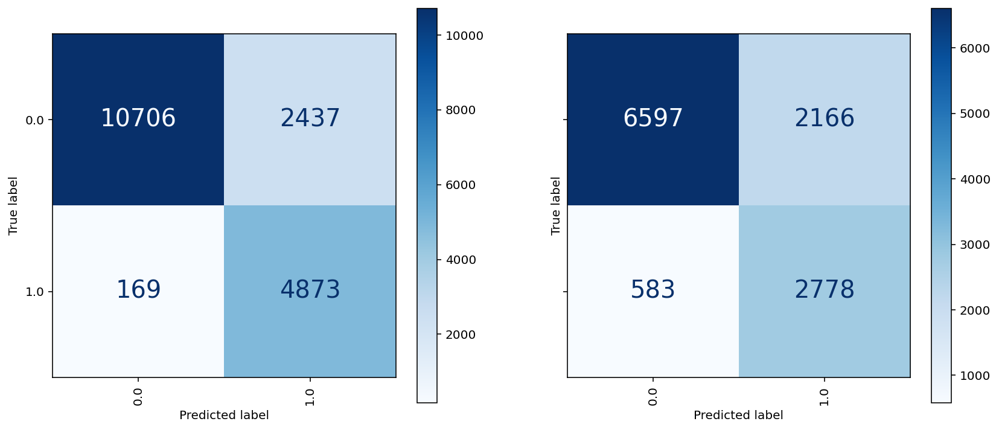

ROC Curves:


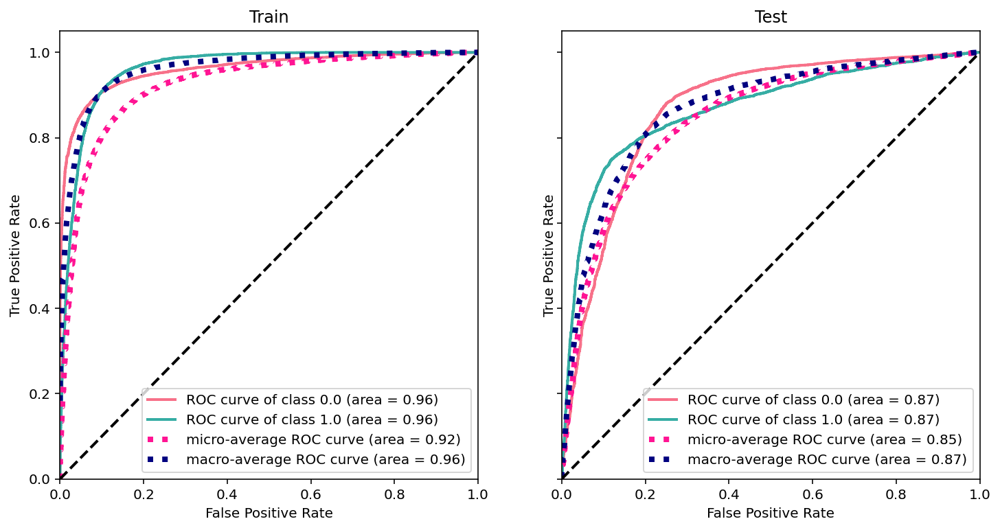

Precision Recall Curve:


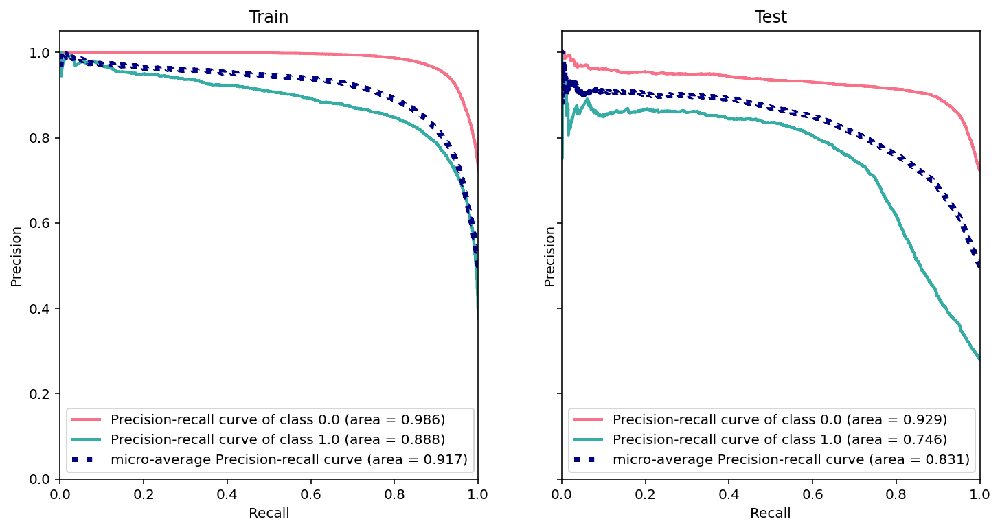

In [19]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve, roc_auc_score, average_precision_score

Bold = '\033[1m'
Normal = '\033[0m'

# Get Tran test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,y,stratify=y,test_size=0.4,random_state=1)
skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

cvec = CountVectorizer(tokenizer=man_token_jie, max_features=5000)
cvec.fit(X_train)
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

# Cs represent lambda, therefore penalty severity
# 10 ^-4 as alpha, then 15 intervals up to 4^10
# for multi class add --> multi_class='ovr'    and change solver to --->     'solver': ['liblinear']
w = {0: 1, 1: 6}
LRCV = LogisticRegressionCV(Cs=np.logspace(-4, 4, 3),
                            penalty='elasticnet',
                            max_iter=100,
                            cv=skf,
                            solver='saga',
                            l1_ratios=[0.001, 0.1, 0.5],
                            n_jobs=6,
                            class_weight=w)  # cv=LRCV_kfolds
# fit the model
LRCV.fit(X_train, y_train)

lr_scores = cross_val_score(LRCV, X_train, y_train, cv=skf, n_jobs=6)

# get the best alpha
print(Bold + 'LRCV Model:' + Normal)
print('LRCV Best alpha:', LRCV.C_)
# get the best l1-ratio
print('Best l1-ratio:', LRCV.l1_ratio_)
# evaluate on the training set
print('LRCV CV Training score:', LRCV.score(X_train, y_train))
# evaluate on the test set
print("LRCV Test Score:", LRCV.score(X_test, y_test), '\n')
# ROC Train and test score
print('ROC Train and Test Score:',
      roc_auc_score(y_train,
                    LRCV.predict_proba(X_train)[:, 1]),
      roc_auc_score(y_test,
                    LRCV.predict_proba(X_test)[:, 1]))

print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')
logist_plots(lr=LRCV,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.1.8. Logistic Regression Model (5):  with cross validation and stop words

Finally I tried adding stop words to remove the most commonly used words. My hypothesis was that this would reduce the effiacy of the model, as I suspected that it would be the most commonly used words which best distinguish a dialect. This proved to be the case with the minority class test recall declining to 81% (previously 87%). 

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

LRCV Model:
LRCV Best alpha: [10000.]
Best l1-ratio: [0.5]
LRCV CV Training score: 0.8645587022271103
LRCV Test Score: 0.7664137248432861 

ROC Train and Test Score: 0.965502560957711 0.8543414887518839
Cross-validated training scores: [0.7602 0.755  0.7569 0.7734 0.766 ]
Mean cross-validated training score: 0.762 

y_train classification report:
              precision    recall  f1-score   support

         0.0       0.99      0.82      0.90     13143
         1.0       0.68      0.97      0.80      5042

    accuracy                           0.86     18185
   macro avg       0.83      0.90      0.85     18185
weighted avg       0.90      0.86      0.87     18185

y_test classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.75      0.82      8763
         1.0       0.55      0.80      0.66      3361

    accuracy                           0.77     12124
   macro avg       0.73      0.78      0.74     12124
weighted avg       0.8

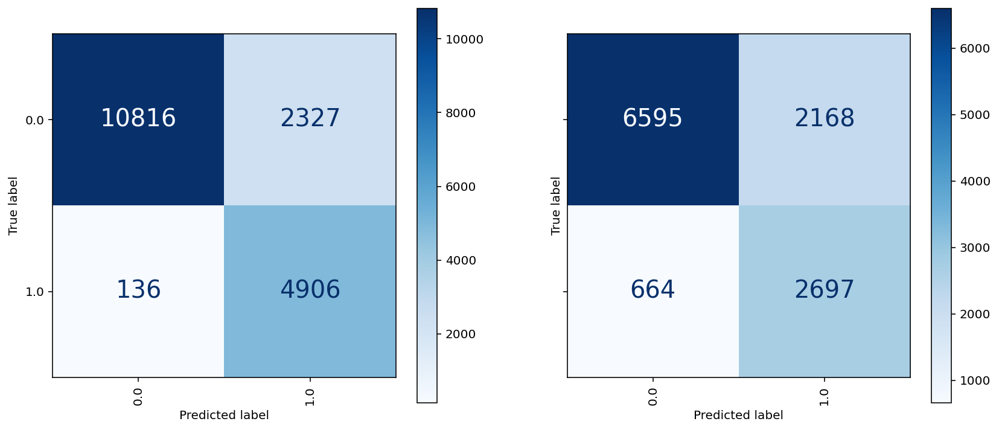

ROC Curves:


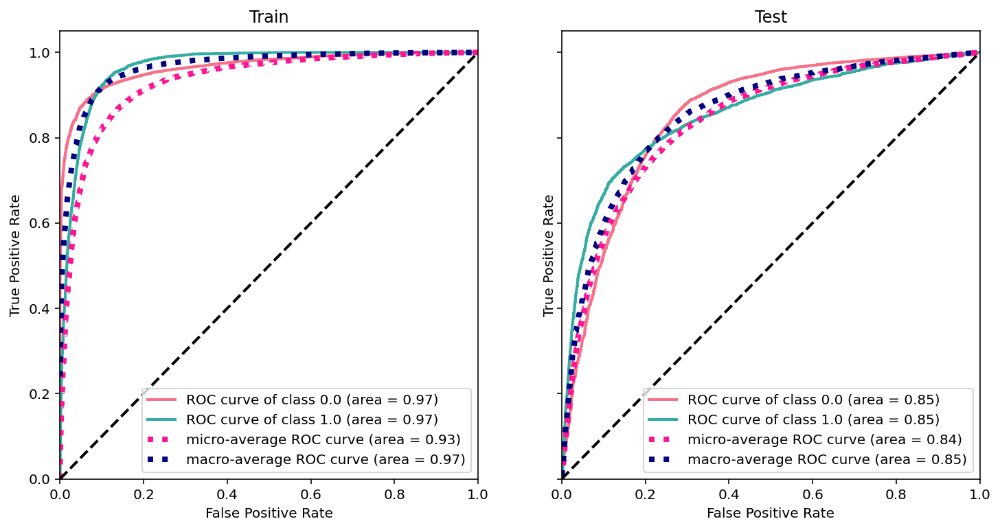

Precision Recall Curve:


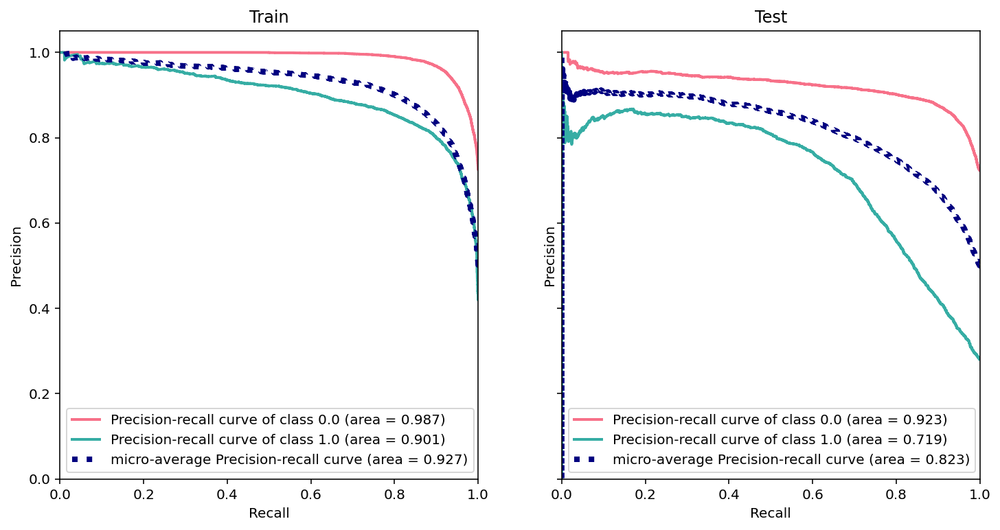

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

In [20]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve, roc_auc_score, average_precision_score

Bold = '\033[1m'
Normal = '\033[0m'

# Get Tran test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.4,
                                                    random_state=1)

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

cvec = CountVectorizer(tokenizer=man_token_jie,
                       max_features=5000,
                       stop_words=stopwords(["zh"]))
cvec.fit(X_train)
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

# Cs represent lambda, therefore penalty severity
# 10 ^-4 as alpha, then 15 intervals up to 4^10
# for multi class add --> multi_class='ovr'    and change solver to --->     'solver': ['liblinear']

w = {0: 1, 1: 6}
LRCV = LogisticRegressionCV(Cs=np.logspace(-4, 4, 3),
                            penalty='elasticnet',
                            max_iter=100,
                            cv=skf,
                            solver='saga',
                            l1_ratios=[0.001, 0.1, 0.5],
                            n_jobs=6,
                            class_weight=w)  # cv=LRCV_kfolds
# fit the model
LRCV.fit(X_train, y_train)

lr_scores = cross_val_score(LRCV, X_train, y_train, cv=skf, n_jobs=6)

### Some outputs

# get the best alpha
print(Bold + 'LRCV Model:' + Normal)
print('LRCV Best alpha:', LRCV.C_)
# get the best l1-ratio
print('Best l1-ratio:', LRCV.l1_ratio_)
# evaluate on the training set
print('LRCV CV Training score:', LRCV.score(X_train, y_train))
# evaluate on the test set
print("LRCV Test Score:", LRCV.score(X_test, y_test), '\n')
# ROC Train and test score
print('ROC Train and Test Score:',
      roc_auc_score(y_train,
                    LRCV.predict_proba(X_train)[:, 1]),
      roc_auc_score(y_test,
                    LRCV.predict_proba(X_test)[:, 1]))

print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')
logist_plots(lr=LRCV,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.2.0 Appying Model to Data with no Genre

In [187]:
# Apply model 5 to the songs where no genre is available to label those that are suspected of being "Cantopop"
df_tracks_no_genre = df_tracks_master_clean2_lyrics_genre_hsk_v2[
    (df_tracks_master_clean2_lyrics_genre_hsk_v2.genre_2.isnull()) |
    (df_tracks_master_clean2_lyrics_genre_hsk_v2.genre_2.isnull())]
df_tracks_no_genre_lyrics = df_tracks_no_genre['lyrics']

In [188]:
cvec_mat_no_genre = cvec.transform(df_tracks_no_genre_lyrics)

In [189]:
df_tracks_no_genre['predict_is_canton'] = LRCV.predict(cvec_mat_no_genre)

In [190]:
df_tracks_no_genre.predict_is_canton.value_counts()

0.0    11549
1.0    10512
Name: predict_is_canton, dtype: int64

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reac

### 9.2. Spotify Meta Data to HSK Relationship
#### Summary 
Finding songs that are accessible at the right level is computationally intensive and time consuming given that the method used so far requires scraping lyrics for each song in the database and then processing these. Is it possible to speed up this process by identifying songs that are more likely to be at the right level based on Spotify data?

In model 1 I tried to identify songs that are HSK 1-4 vs HSK 5-6 from Spotify song meta data. The mean cross validation score was 54% compared with the base line of 47%. This score suggests that there is very limited information contained in song meta data for grading HSK level. 

In model 2 I added artist and genre. The mean cross validation score improved to 60%. The coefficient with the greatest weight was Chinese R&B. When looking at this genre it can be seen that 86% of songs have lyrics within HSK1-4 vs. the base line of 52%. Singoaporean Mandopop was the second coefficient and has 68% in scope for HSK 1-4. 

Whilst the model was poor overall at identifying HSK level it was able to identify some genres which may be more accessible to language learners. 

#### 9.2.1. Modelling

In [40]:
df_h4 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h4['is_h4'] = 0
df_h4['is_h4'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk4 > 0.77] = 1

In [41]:
df_h4['is_h4'].value_counts()

1    18931
0    16990
Name: is_h4, dtype: int64

In [42]:
X = df_h4[[
    'song_duration_ms', 'is_explicit', 'length', 'popularity', 'acousticness',
    'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness',
    'speechiness', 'tempo', 'time_signature', 'is_h4'
]]

y = X.pop('is_h4')

Base line score: 0.473
Training Score: 0.547
Test Score: 0.556
Cross-validated training scores: [0.5534 0.545  0.5454 0.5357 0.5493]
Mean cross-validated training score: 0.546 

y_train classification report:
              precision    recall  f1-score   support

           0       0.54      0.29      0.38     11893
           1       0.55      0.78      0.64     13251

    accuracy                           0.55     25144
   macro avg       0.54      0.53      0.51     25144
weighted avg       0.54      0.55      0.52     25144

y_test classification report:
              precision    recall  f1-score   support

           0       0.56      0.29      0.39      5097
           1       0.56      0.79      0.65      5680

    accuracy                           0.56     10777
   macro avg       0.56      0.54      0.52     10777
weighted avg       0.56      0.56      0.53     10777



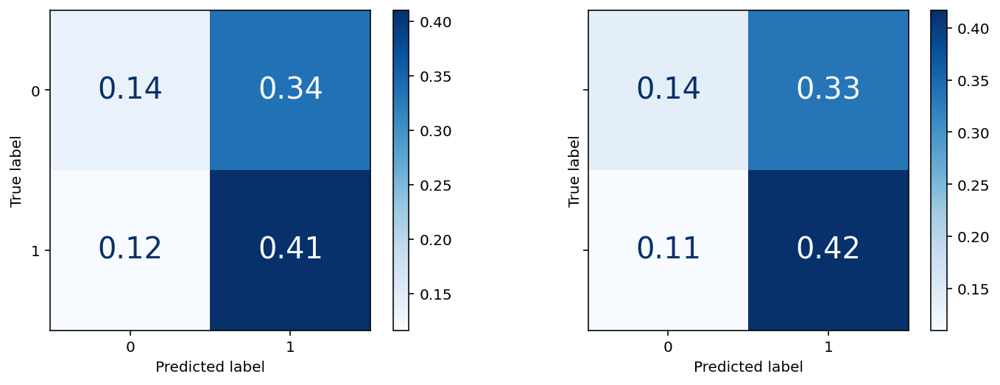

ROC Curves:


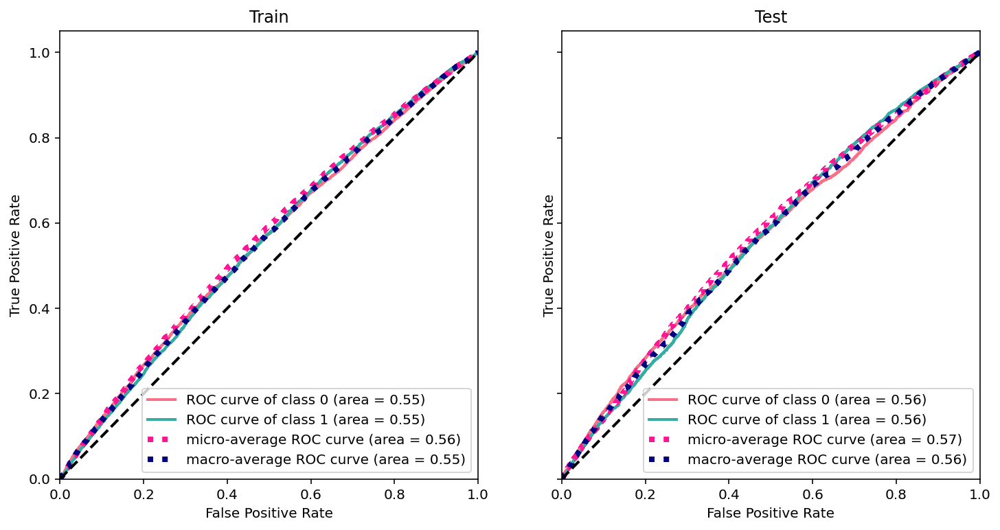

Precision Recall Curve:


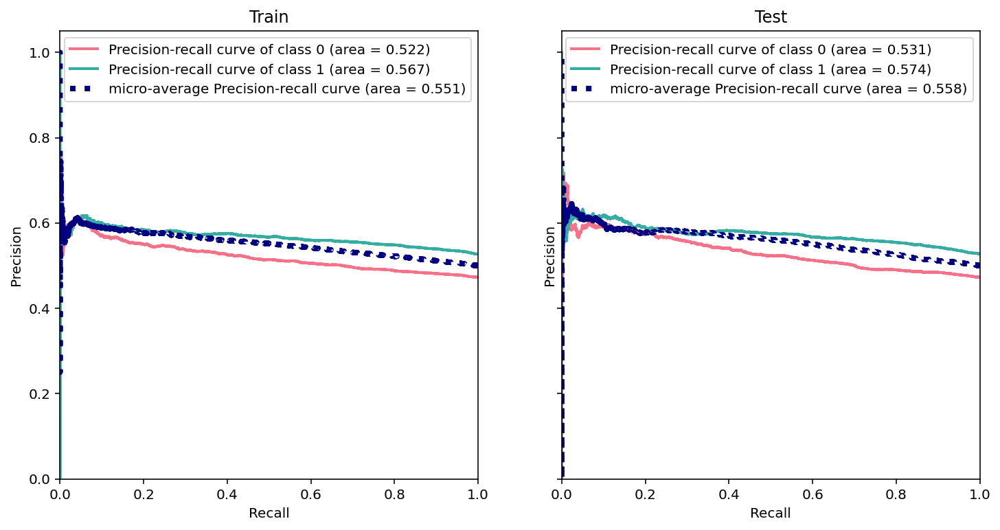

Threholds (test data) impact on Accuracy / False Positive Rate:


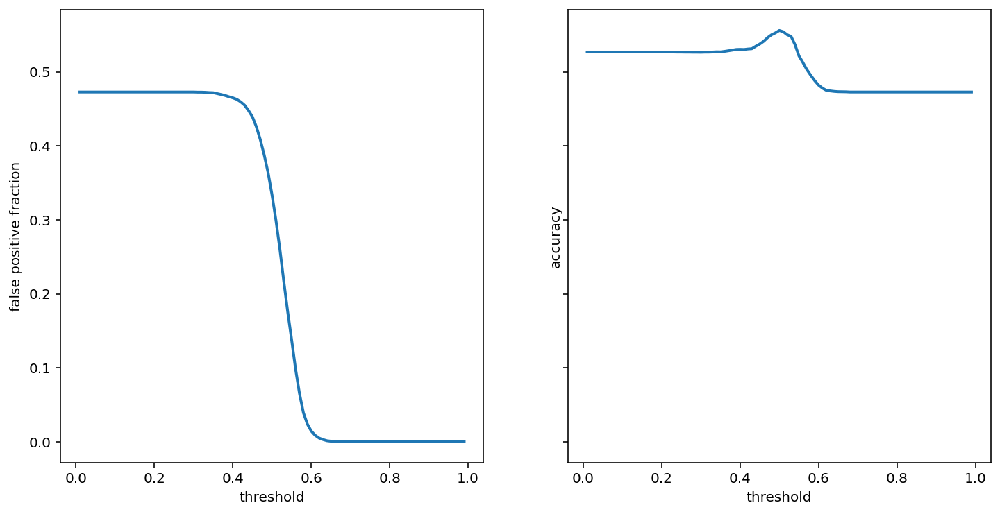

In [85]:
# Get Tran test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.3,
                                                    random_state=1)

# Import and fit a logistic regression model and test
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

Bold = '\033[1m'
Normal = '\033[0m'

scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X.columns)

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)
w = {0: 1, 1: 1}
lr = LogisticRegression(solver='lbfgs', multi_class='ovr', class_weight=w)
lr.fit(X_train, y_train)
lr_scores = cross_val_score(lr, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(lr.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(lr.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')
logist_plots(lr=lr,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.2.2. Spotify Meta Data Plus Genre

In [87]:
X = df_h4[[
    'artist', 'Genre1', 'Genre2', 'Genre3', 'song_duration_ms',
    'is_explicit', 'length', 'popularity', 'acousticness', 'danceability',
    'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness',
    'tempo', 'time_signature', 'is_h4']]
X = pd.get_dummies(X,columns=['artist', 'Genre1', 'Genre2', 'Genre3'],drop_first=True)
y = X.pop('is_h4')

There is some improvement in the scores overall by adding artist and genre. The mean cross validation score of 60% was ahead of the baseline score of 47%. 

Base line score: 0.473
Training Score: 0.642
Test Score: 0.618
Cross-validated training scores: [0.6017 0.6071 0.5971 0.6059 0.613 ]
Mean cross-validated training score: 0.605 

y_train classification report:
              precision    recall  f1-score   support

           0       0.64      0.56      0.60     11893
           1       0.64      0.71      0.68     13251

    accuracy                           0.64     25144
   macro avg       0.64      0.64      0.64     25144
weighted avg       0.64      0.64      0.64     25144

y_test classification report:
              precision    recall  f1-score   support

           0       0.61      0.53      0.57      5097
           1       0.62      0.70      0.66      5680

    accuracy                           0.62     10777
   macro avg       0.62      0.61      0.61     10777
weighted avg       0.62      0.62      0.61     10777



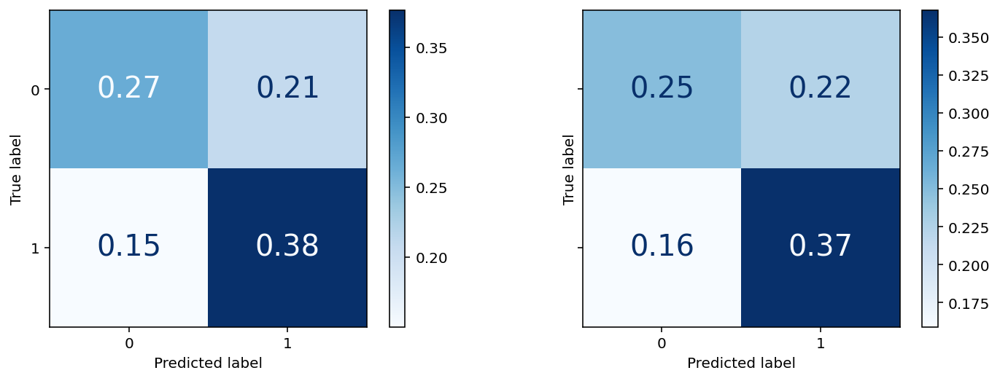

ROC Curves:


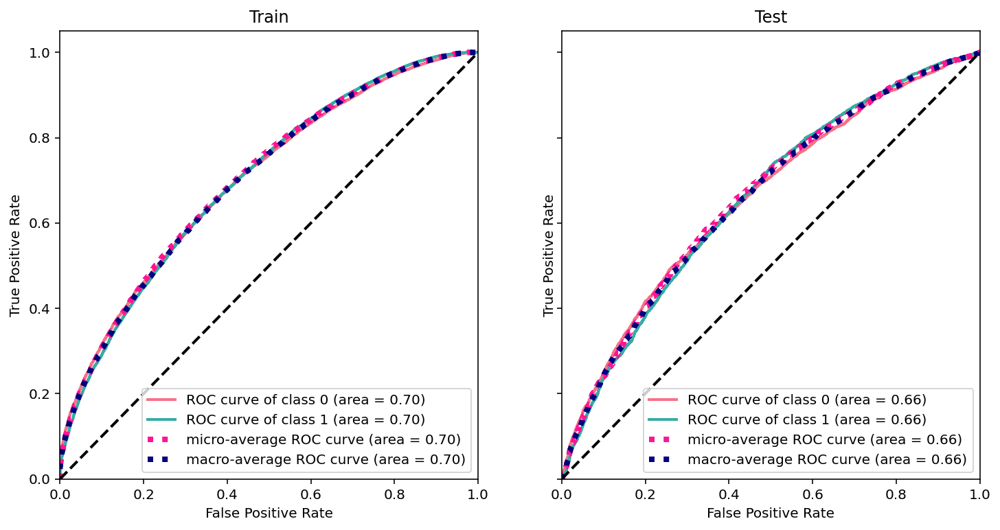

Precision Recall Curve:


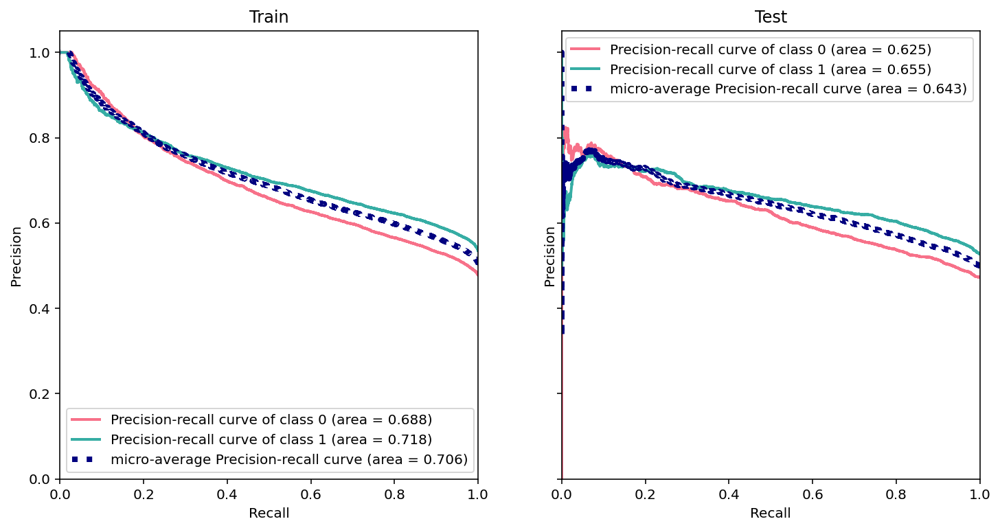

Threholds (test data) impact on Accuracy / False Positive Rate:


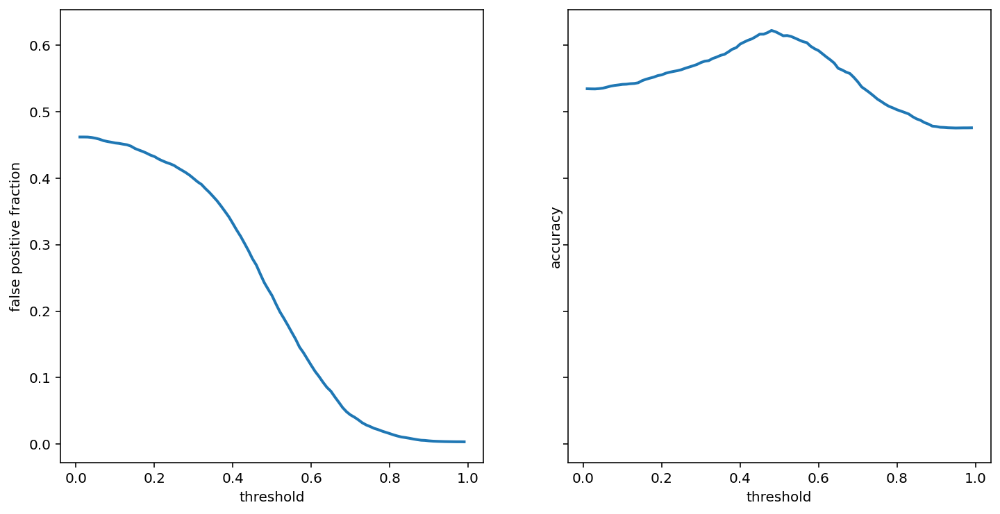

In [88]:
# Get Tran test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.3,
                                                    random_state=1)

# Import and fit a logistic regression model and test
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

Bold = '\033[1m'
Normal = '\033[0m'

scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X.columns)

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)
w = {0: 1, 1: 1}
lr = LogisticRegression(solver='lbfgs', multi_class='ovr', class_weight=w)
lr.fit(X_train, y_train)
lr_scores = cross_val_score(lr, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(lr.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(lr.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')
logist_plots(lr=lr,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

In [89]:
results = pd.DataFrame(list(zip(
    X_train.columns,
    lr.coef_[0],
)),
                       columns=['coef',
                                'coef_mag']).sort_values(by='coef_mag',
                                                         ascending=False)

In [90]:
results.head(15)

,coef,coef_mag
1000,Genre2_chinese r&b,0.492115
1023,Genre2_singaporean mandopop,0.438669
900,Genre1_c-pop,0.415215
997,Genre2_chinese post-punk,0.409854
1056,Genre3_chinese singer-songwriter,0.357753
906,Genre1_chinese electropop,0.348468
950,Genre1_mandopop,0.317644
920,Genre1_chinese post-punk,0.302995
373,artist_Stefanie Sun,0.296506
391,artist_Tanya Chua,0.261405


Does this mean that Chinese R&B is the most accessible genre for Chinese language learners??

In [91]:
df_h4['is_h4'].value_counts(normalize=True)

1    0.527018
0    0.472982
Name: is_h4, dtype: float64

In [102]:
df_h4['is_h4'][df_h4['Genre2'] == 'chinese r&b'].value_counts(normalize=True)

1    0.864286
0    0.135714
Name: is_h4, dtype: float64

Yes! Chinese R&B songs fall into category HSK 1 to HSK 4 in 86% of cases vs. the overall genre average of 52%. 

In [103]:
df_h4['is_h4'][df_h4['Genre2'] == 'singaporean mandopop'].value_counts(normalize=True)

1    0.680328
0    0.319672
Name: is_h4, dtype: float64

Similarly for Singaporean Mandopop

### 9.3 Binary Classification of HSK Based on Lyrics

#### 9.3.1. Binary Classification is HSK 1 - 5: Logistic Regression, TfidfVectorizer,  weights (50:50)
- Mean Cross validation score of 61% vs. base line of 53%. 
- Recall (train) of HSK5 is 100% with precision of 82%. 
- Recall (train) of 75% for not HSK5 with precision of 100%.

In [352]:
# import data file
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

In [353]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'

X = df_h5[['lyrics','is_h5'
]]

y = X.pop('is_h5')
X=X['lyrics']

df_h5['is_h5'].value_counts()

HSK5      18893
NotHSK    17028
Name: is_h5, dtype: int64

In [357]:
# Logistis Regression
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics


# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

w = {'HSK5': 1, 'NotHSK': 1}

model = make_pipeline(TfidfVectorizer(stop_words=updated_stopwords,
                                      # sublinear_tf=True,
                                      max_df=2,
                                      min_df = 1,
                                      max_features=50000,
                                      tokenizer=man_token_jie,
                                      norm='l2'),
                                      LogisticRegression(solver='lbfgs', 
                                        multi_class='ovr', 
                                        class_weight=w),
                      )

model.fit(X_train, y_train)

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Loading model cost 0.665 seconds.
Prefix dict has been built successfully.
Loading model cost 0.674 seconds.
Prefix dict has been built successfully.
Loading model cost 0.659 seconds.
Prefix dict has been built successfully.
Loading model cost 0.646 seconds.
Prefix dict has been built successfully.
Loadi

Base line score: 0.526
Training Score: 0.883
Test Score: 0.606
Cross-validated training scores: [0.6079 0.6174 0.6038 0.6111 0.6109]
Mean cross-validated training score: 0.61 



y_train classification report:
              precision    recall  f1-score   support

        HSK5       0.82      1.00      0.90     15114
      NotHSK       1.00      0.75      0.86     13622

    accuracy                           0.88     28736
   macro avg       0.91      0.88      0.88     28736
weighted avg       0.90      0.88      0.88     28736

y_test classification report:
              precision    recall  f1-score   support

        HSK5       0.59      0.82      0.69      3779
      NotHSK       0.65      0.36      0.47      3406

    accuracy                           0.61      7185
   macro avg       0.62      0.59      0.58      7185
weighted avg       0.62      0.61      0.58      7185



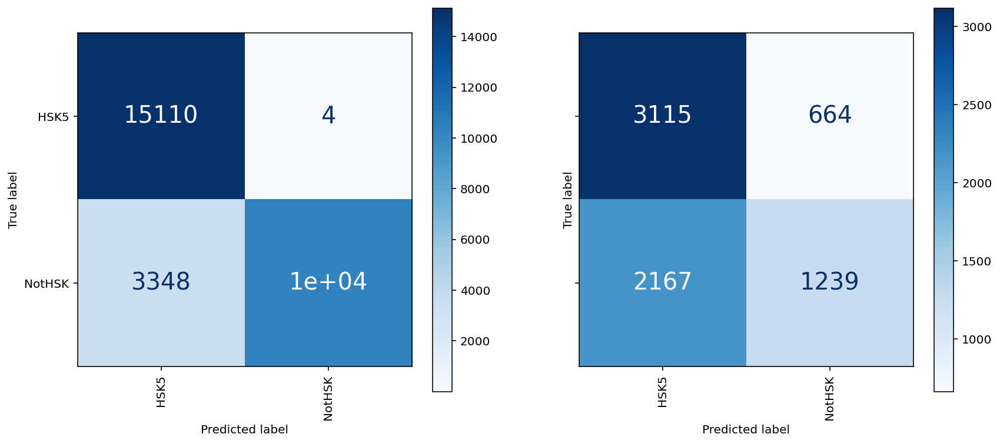

ROC Curves:


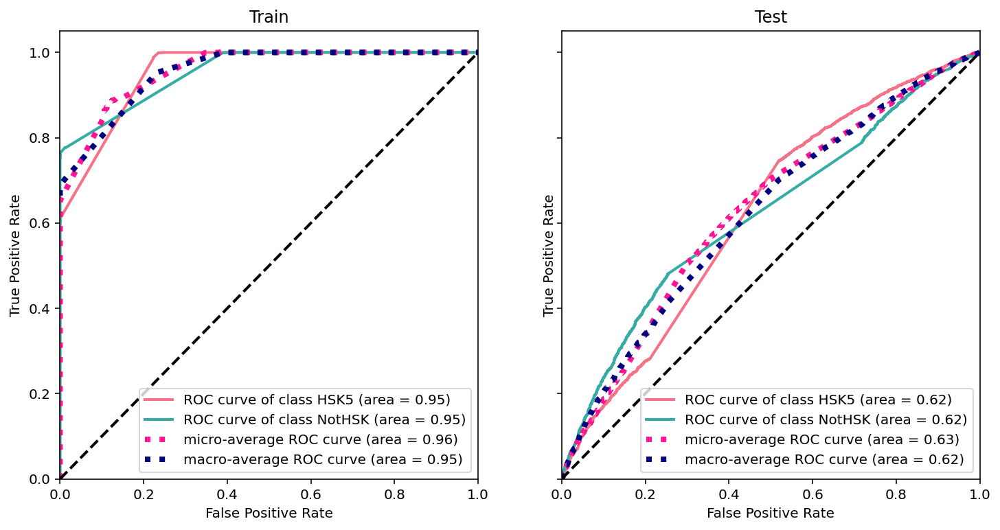

Precision Recall Curve:


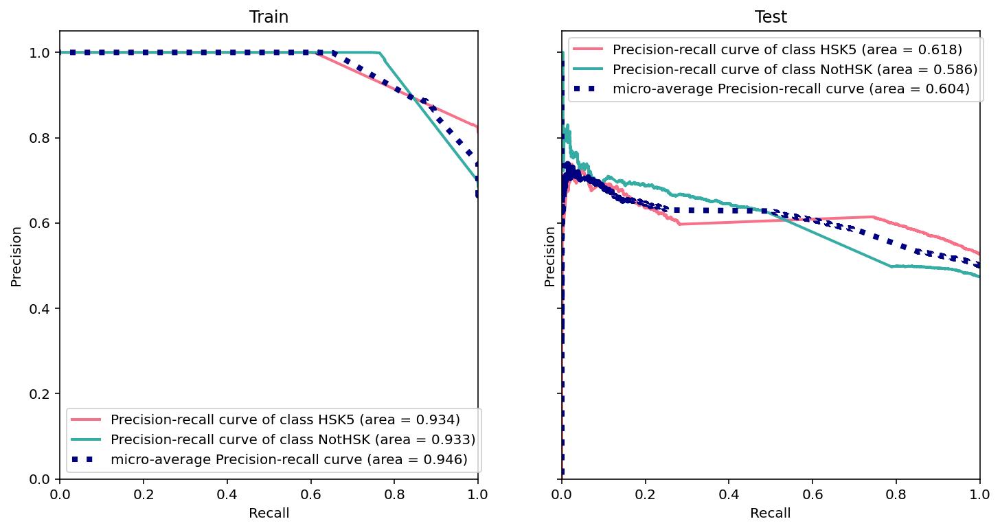

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', 

In [358]:
logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.2.Binary Classification is HSK 1 - 5: Logistic Regression, TfidfVectorizer,  weights (1.05 on minority)

There is a tipping point for weights above and below 1.2:

Applying weights of 1.1-1.19:
- Mean cross validation score reduced to 53% vs. base line of 53% and 63% previously. 
- Recall (train) of HSK5 98% precision of 83%.
- Recall (train) of NotHSK5 78% and precision of 98%

Applying weights of 1.2:
- Mean cross validation score reduced to 53%
- Recall (train) of HSK5 61% precision of 100%.
- Recall (train) of NotHSK5 100% and precision of 70%

In [375]:
## wieght updated to w = {'HSK5': 1, 'NotHSK': 1.199}
w = {'HSK5': 1, 'NotHSK': 1.199}

model = make_pipeline(TfidfVectorizer(stop_words=updated_stopwords,
                                      # sublinear_tf=True,
                                      max_df=2,
                                      min_df = 1,
                                      max_features=50000,
                                      tokenizer=man_token_jie,
                                      norm='l2'),
                                      LogisticRegression(solver='lbfgs', 
                                        multi_class='ovr', 
                                        class_weight=w),
                      )

model.fit(X_train, y_train)

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Loading model cost 0.691 seconds.
Prefix dict has been built successfully.
Loading model cost 0.669 seconds.
Prefix dict has been built successfully.
Loading model cost 0.651 seconds.
Prefix dict has been built successfully.
Loading model cost 0.632 seconds.
Prefix dict has been built successfully.
Loadi

Base line score: 0.526
Training Score: 0.886
Test Score: 0.62
Cross-validated training scores: [0.5186 0.5269 0.5318 0.5384 0.5281]
Mean cross-validated training score: 0.529 



y_train classification report:
              precision    recall  f1-score   support

        HSK5       0.83      0.98      0.90     15114
      NotHSK       0.98      0.78      0.87     13622

    accuracy                           0.89     28736
   macro avg       0.90      0.88      0.88     28736
weighted avg       0.90      0.89      0.88     28736

y_test classification report:
              precision    recall  f1-score   support

        HSK5       0.61      0.74      0.67      3779
      NotHSK       0.63      0.48      0.55      3406

    accuracy                           0.62      7185
   macro avg       0.62      0.61      0.61      7185
weighted avg       0.62      0.62      0.61      7185



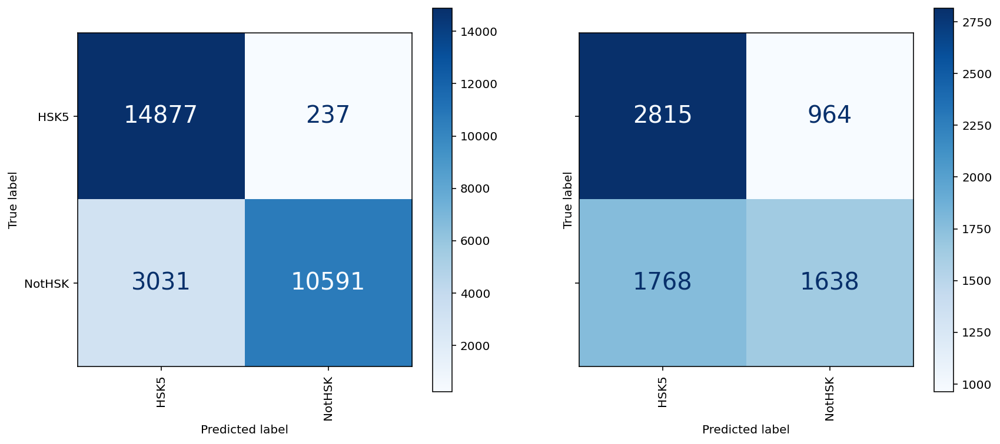

ROC Curves:


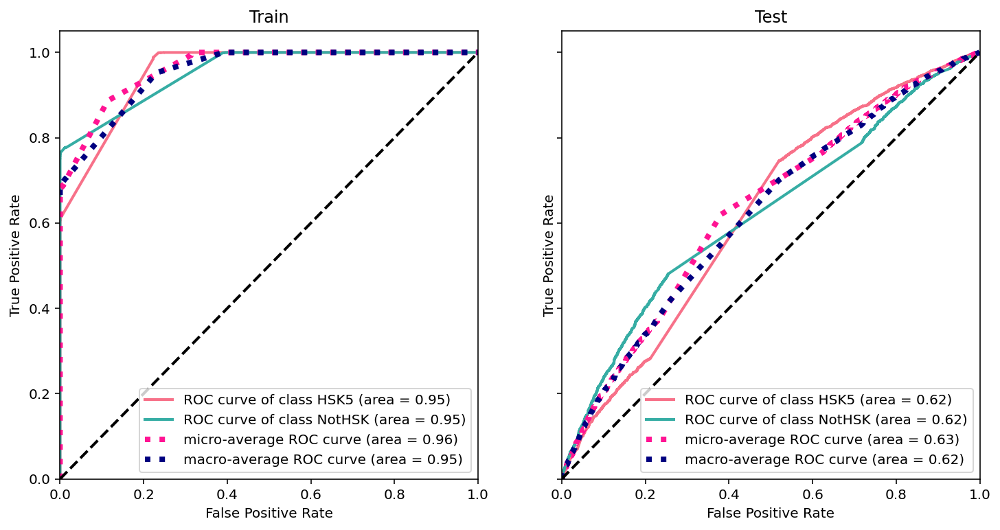

Precision Recall Curve:


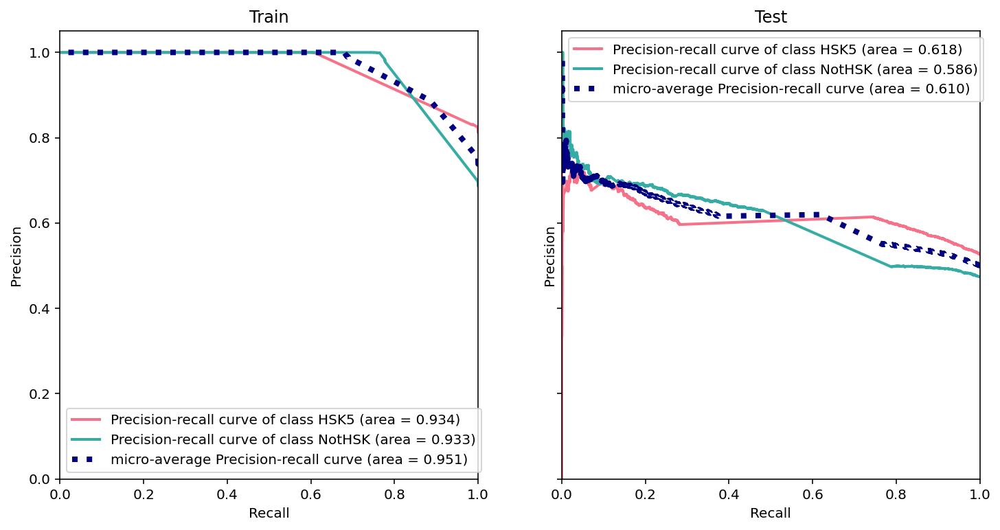

In [376]:
logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', 

Base line score: 0.526
Training Score: 0.795
Test Score: 0.522
Cross-validated training scores: [0.5188 0.5272 0.5319 0.5384 0.5286]
Mean cross-validated training score: 0.529 

y_train classification report:
              precision    recall  f1-score   support

        HSK5       1.00      0.61      0.76     15114
      NotHSK       0.70      1.00      0.82     13622

    accuracy                           0.79     28736
   macro avg       0.85      0.80      0.79     28736
weighted avg       0.86      0.79      0.79     28736

y_test classification report:
              precision    recall  f1-score   support

        HSK5       0.60      0.28      0.38      3779
      NotHSK       0.50      0.79      0.61      3406

    accuracy                           0.52      7185
   macro avg       0.55      0.54      0.50      7185
weighted avg       0.55      0.52      0.49      7185



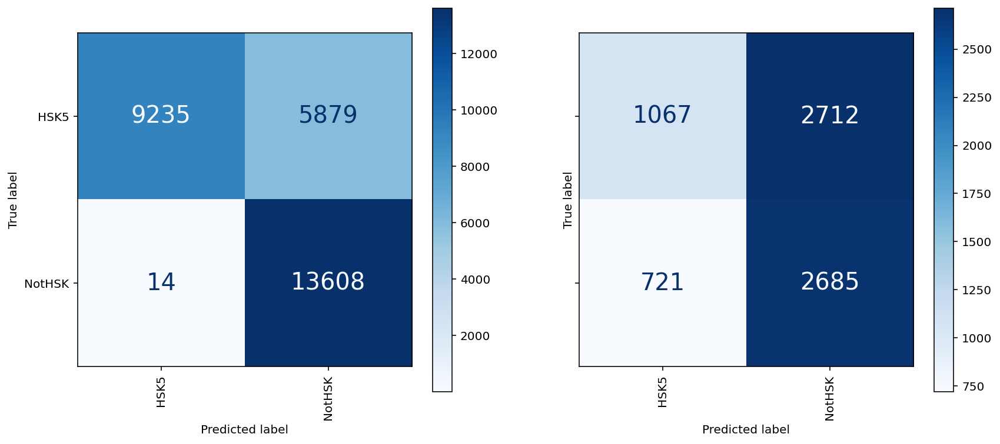

ROC Curves:


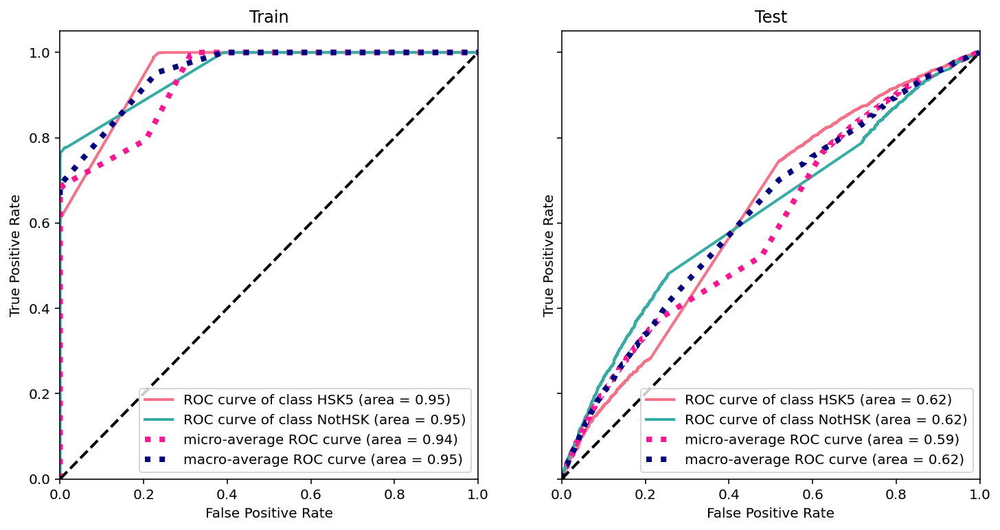

Precision Recall Curve:


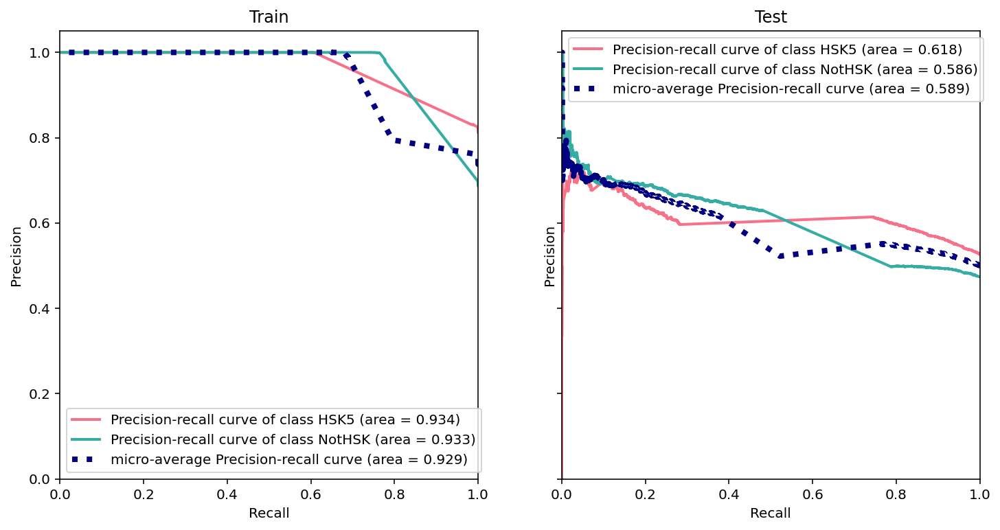

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', 

In [377]:
# weights updated to w = {'HSK5': 1, 'NotHSK': 1.2}
w = {'HSK5': 1, 'NotHSK': 1.2}

model = make_pipeline(TfidfVectorizer(stop_words=updated_stopwords,
                                      # sublinear_tf=True,
                                      max_df=2,
                                      min_df = 1,
                                      max_features=50000,
                                      tokenizer=man_token_jie,
                                      norm='l2'),
                                      LogisticRegression(solver='lbfgs', 
                                        multi_class='ovr', 
                                        class_weight=w),
                      )

model.fit(X_train, y_train)

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.2.Binary Classification is HSK 1 - 5: Logistic Regression, CountVectorizer,  weights (1.2 on minority)
Given that HSK levels are losely based on frequency of word occurence it makes sense to try and CountVectorizer model.

Weights were kept even at 1:1.

- Training score of 99.7% (vs. baseline of 53%).
- Mean cross validation score of 77% (ahead of previous best of 63%).
- Recall (train) score of HSK5 100% precision of 100%
- Recall (train) score of NotHSK5 100% precision of 100%
- Recall and Precision of Test data 76-80% accross both classes

Model has significantly improved using CVEC. Strong training score vs. mean cross validation score implies some model overfitting. 

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Loading model cost 0.706 seconds.
Prefix dict has been built successfully.
Loading model cost 0.684 seconds.
Prefix dict has been built successfully.
Loading model cost 0.688 seconds.
Prefix dict has been built successfully.
Loading model cost 0.678 seconds.
Prefix dict has been built successfully.
Loadi

Base line score: 0.526
Training Score: 0.997
Test Score: 0.782
Cross-validated training scores: [0.7747 0.7651 0.7783 0.7724 0.7654]
Mean cross-validated training score: 0.771 

y_train classification report:
              precision    recall  f1-score   support

        HSK5       1.00      1.00      1.00     15114
      NotHSK       1.00      1.00      1.00     13622

    accuracy                           1.00     28736
   macro avg       1.00      1.00      1.00     28736
weighted avg       1.00      1.00      1.00     28736

y_test classification report:
              precision    recall  f1-score   support

        HSK5       0.79      0.80      0.79      3779
      NotHSK       0.78      0.76      0.77      3406

    accuracy                           0.78      7185
   macro avg       0.78      0.78      0.78      7185
weighted avg       0.78      0.78      0.78      7185



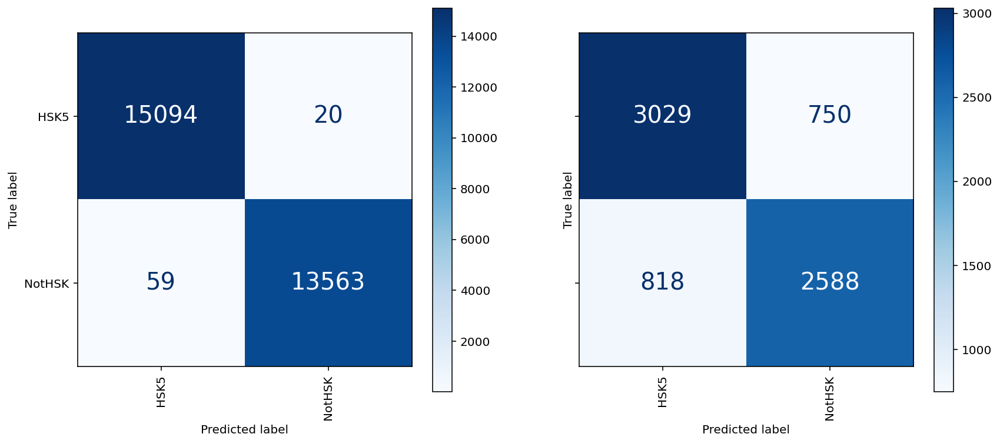

ROC Curves:


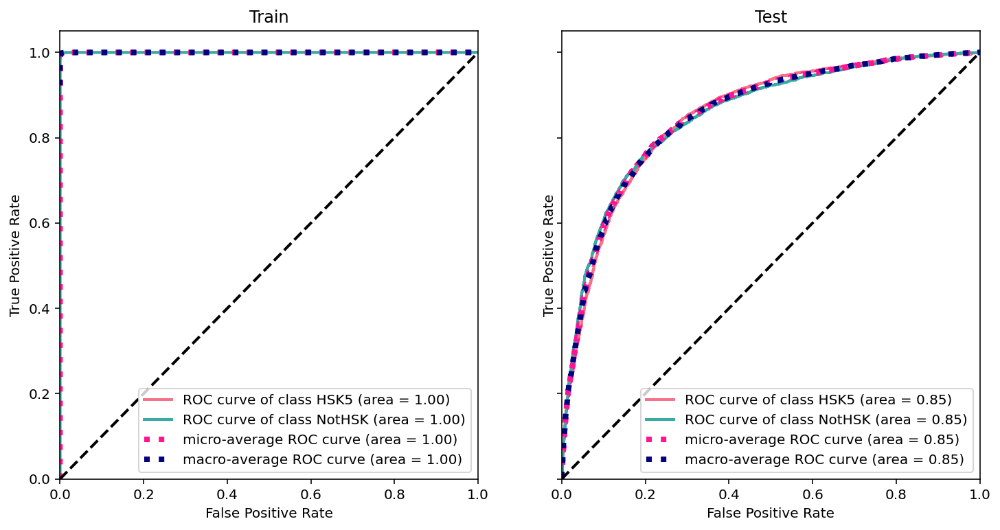

Precision Recall Curve:


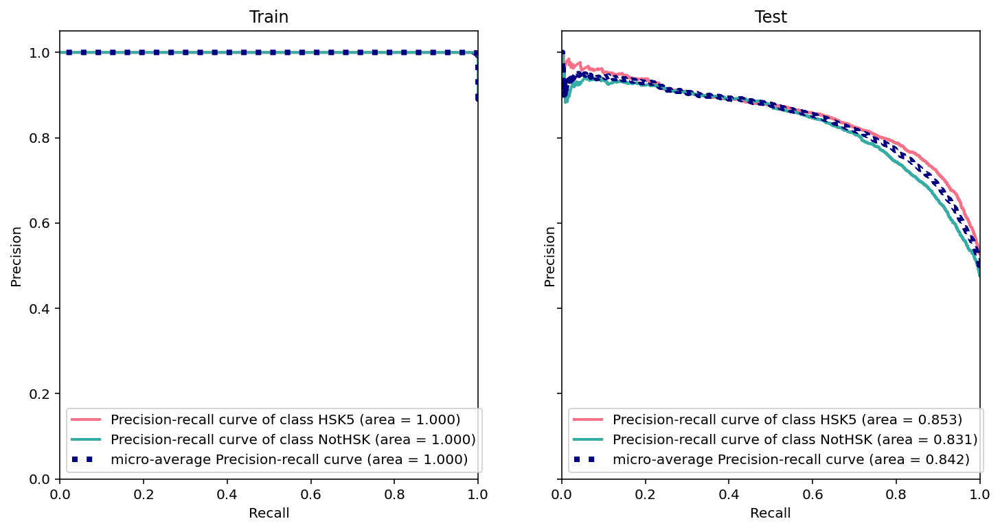

/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_ex

In [379]:
# weights kept at 1:1
w = {'HSK5': 1, 'NotHSK': 1}

model = make_pipeline(CountVectorizer(stop_words=updated_stopwords,
                                      # sublinear_tf=True,
                                      max_features=50000,
                                      tokenizer=man_token_jie),
                                      LogisticRegression(solver='lbfgs', 
                                        multi_class='ovr', 
                                        class_weight=w),
                      )

model.fit(X_train, y_train)

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.3. Binary Regression: All Classifiers

In [404]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)


Perceptron
________________________________________________________________________________
Training: 
Perceptron(class_weight={'HSK5': 1, 'NotHSK': 1}, n_jobs=-1)
train time: 0.210s
test time:  0.002s
accuracy:   0.760
dimensionality: 50000
density: 0.899960
top 10 keywords per class:
HSK5: 荒谬 尽快 虔诚 神情 恍惚 盘旋 创作 又哭又笑 晨光 奢侈
Top 10 features not available
classification report:
              precision    recall  f1-score   support

        HSK5       0.76      0.80      0.78      3779
      NotHSK       0.76      0.72      0.74      3406

    accuracy                           0.76      7185
   macro avg       0.76      0.76      0.76      7185
weighted avg       0.76      0.76      0.76      7185

confusion matrix:
[[3021  758]
 [ 969 2437]]

Passive-Aggressive
________________________________________________________________________________
Training: 
PassiveAggressiveClassifier(class_weight={'HSK5': 1, 'NotHSK': 1}, n_jobs=-1)
train time: 0.462s
test time:  0.001s
accuracy:   0.761
dime

              precision    recall  f1-score   support

        HSK5       0.74      0.80      0.77      3779
      NotHSK       0.75      0.69      0.72      3406

    accuracy                           0.75      7185
   macro avg       0.75      0.74      0.74      7185
weighted avg       0.75      0.75      0.75      7185

confusion matrix:
[[3006  773]
 [1052 2354]]

LinearSVC with L1-based feature selection
________________________________________________________________________________
Training: 
Pipeline(steps=[('feature_selection',
                 SelectFromModel(estimator=LinearSVC(dual=False,
                                                     penalty='l1'))),
                ('classification', LinearSVC())])
train time: 14.113s
test time:  0.008s
accuracy:   0.766
classification report:
              precision    recall  f1-score   support

        HSK5       0.77      0.78      0.78      3779
      NotHSK       0.76      0.75      0.75      3406

    accuracy              

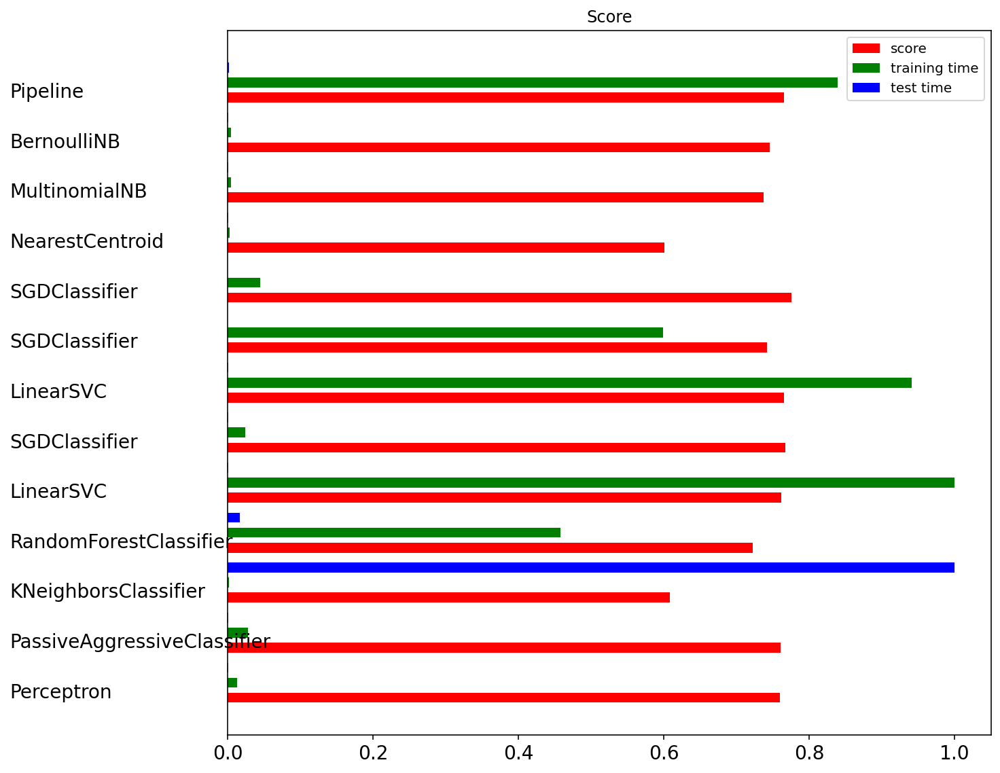

In [406]:
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics




w = {'HSK5': 1, 'NotHSK': 1}

cvec = CountVectorizer(stop_words=updated_stopwords,
                                      # sublinear_tf=True,
                                      max_features=50000,
                                      tokenizer=man_token_jie)




cvec.fit(X_train)
X_train = cvec.transform(X_train)
X_test = cvec.transform(X_test)


feature_names = np.array(cvec.get_feature_names())


def trim(s):
    """Trim string to fit on terminal (assuming 80-column display)"""
    return s if len(s) <= 80 else s[:77] + "..."

###############################################################################
# Benchmark classifiers


def benchmark(clf):
    print(('_' * 80))
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train, y_train)
    train_time = time() - t0
    print(("train time: %0.3fs" % train_time))

    t0 = time()
    pred = clf.predict(X_test)
    test_time = time() - t0
    print(("test time:  %0.3fs" % test_time))

    score = metrics.accuracy_score(y_test, pred)
    print(("accuracy:   %0.3f" % score))

    if hasattr(clf, 'coef_'):
        print(("dimensionality: %d" % clf.coef_.shape[1]))
        print(("density: %f" % density(clf.coef_)))
        
        try: 
            if feature_names is not None:
                print("top 10 keywords per class:")
                for i, category in enumerate(set(y_train.values)):
                    top10 = np.argsort(clf.coef_[i])[-10:]
                    print((trim("%s: %s"
                                % (category, " ".join(feature_names[top10])))))
            print()
        except: print('Top 10 features not available')
            
    print("classification report:")
    print((metrics.classification_report(y_test, pred,
                                         target_names=set(y_train.values))))

    print("confusion matrix:")
    print((metrics.confusion_matrix(y_test, pred)))

    print()
    clf_descr = str(clf).split('(')[0]
    return clf_descr, score, train_time, test_time


results = []
for clf, name in ((Perceptron(max_iter=1000, tol=1e-3, class_weight=w, n_jobs=-1), "Perceptron"),(PassiveAggressiveClassifier(max_iter=1000, tol=1e-3, class_weight=w,n_jobs=-1), "Passive-Aggressive"),(KNeighborsClassifier(n_neighbors=10, n_jobs=-1), "kNN"),(RandomForestClassifier(n_estimators=100, class_weight=w, n_jobs=-1), "Random forest")):
    print(('=' * 80))
    print(name)
    try: 
        results.append(benchmark(clf))
    except:
        results.append(np.nan)

for penalty in ["l2", "l1"]:
    print(('=' * 80))
    print(("%s penalty" % penalty.upper()))
    # Train Liblinear model
    try: 
        results.append(benchmark(LinearSVC(loss='squared_hinge', penalty=penalty,
                                                dual=False)))
    except:  results.append(np.nan)

    # Train SGD model
    try: 
        results.append(benchmark(SGDClassifier(alpha=.0001,
                                               penalty=penalty,
                                               max_iter=1000,
                                               tol=1e-3)))
    except: results.append(np.nan)

# Train SGD with Elastic Net penalty
print(('=' * 80))
print("Elastic-Net penalty")
try: 
    results.append(benchmark(SGDClassifier(alpha=.0001,
                                           penalty="elasticnet",
                                           max_iter=1000,
                                           tol=1e-3)))
except: results.append(np.nan)
    
# Train NearestCentroid without threshold
print(('=' * 80))
print("NearestCentroid (aka Rocchio classifier)")
try:
    results.append(benchmark(NearestCentroid()))
except:
    retults.append(np.nan)
# Train sparse Naive Bayes classifiers
print(('=' * 80))
print("Naive Bayes")
try: 
    results.append(benchmark(MultinomialNB(alpha=.01)))
    results.append(benchmark(BernoulliNB(alpha=.01)))
except:
        results.append(np.nan)
        results.append(np.nan)

print(('=' * 80))
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
try:
    results.append(benchmark(Pipeline([
        ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False))),
        ('classification', LinearSVC(penalty="l2"))])))
except:
    results.append(np.nan)
    results.append(np.nan
                  )
# make some plots

indices = np.arange(len(results))

results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='r')
plt.barh(indices + .3, training_time, .2, label="training time", color='g')
plt.barh(indices + .6, test_time, .2, label="test time", color='b')
plt.yticks((), fontsize=14)
plt.xticks(fontsize=14)
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c, fontsize=14)

plt.show()

#### 9.3.4. Neural Network modes: Multilayer Perceptron Feed-Forward network - Setup Run

In [411]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

Base line score: 0.526
Training Score: 0.993
Test Score: 0.78
Cross-validated training scores: [0.7773 0.7611 0.7734 0.7741 0.7637]
Mean cross-validated training score: 0.77 

y_train classification report:
              precision    recall  f1-score   support

        HSK5       0.99      0.99      0.99     15114
      NotHSK       0.99      0.99      0.99     13622

    accuracy                           0.99     28736
   macro avg       0.99      0.99      0.99     28736
weighted avg       0.99      0.99      0.99     28736

y_test classification report:
              precision    recall  f1-score   support

        HSK5       0.79      0.79      0.79      3779
      NotHSK       0.77      0.77      0.77      3406

    accuracy                           0.78      7185
   macro avg       0.78      0.78      0.78      7185
weighted avg       0.78      0.78      0.78      7185



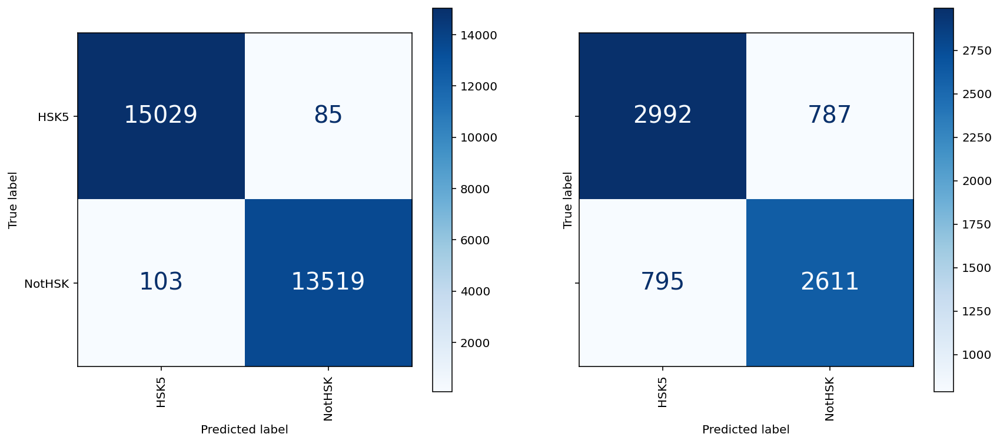

ROC Curves:


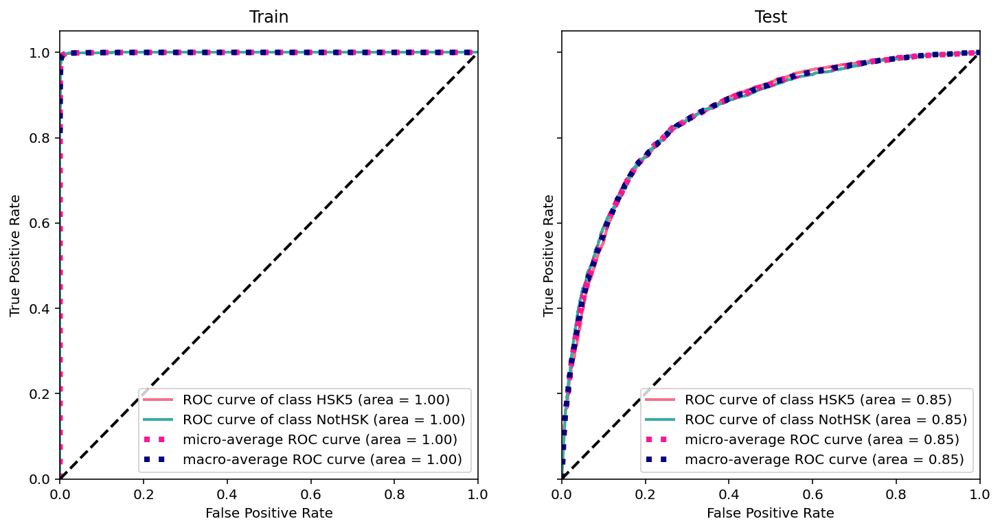

Precision Recall Curve:


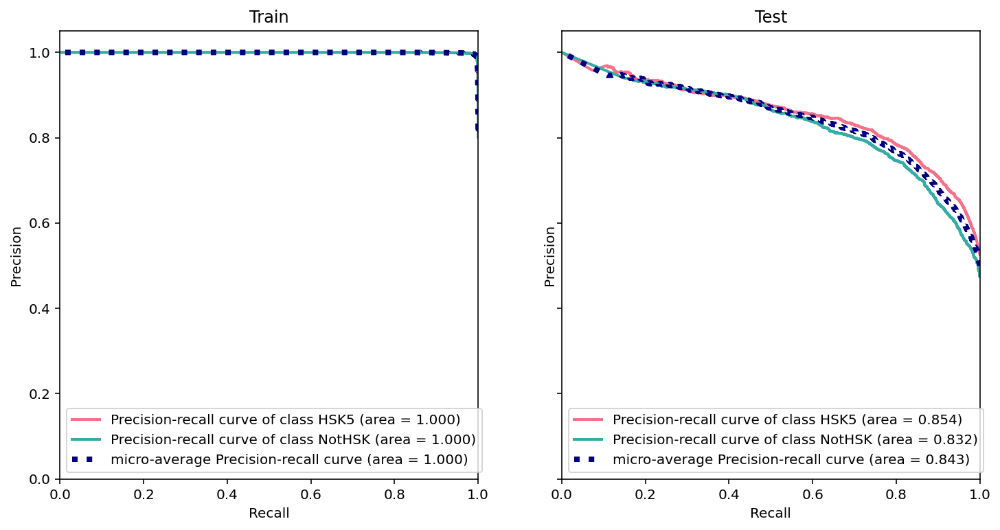

In [412]:
from sklearn.neural_network import MLPClassifier

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=50000)
cvec.fit(X_train)

# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

model = MLPClassifier(solver='lbfgs',
                    alpha=10**(-10),
                    hidden_layer_sizes=1,
                    activation='identity',
                    random_state=1,
                    batch_size='auto')


model.fit(X_train, y_train)



Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.5. Neural Network modes: Multilayer Perceptron Feed-Forward network
Params:
- max_feat: 1000
- activation: 'relu', 
- hidden_layer: (20)
- max iterations: default (200)

Results:
- run time:(2mins)
- MSE: 69%

In [423]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

Iteration 1, loss = 0.69617860
Iteration 2, loss = 0.61250176
Iteration 3, loss = 0.58969204
Iteration 4, loss = 0.57750362
Iteration 5, loss = 0.56917023
Iteration 6, loss = 0.56223128
Iteration 7, loss = 0.55697544
Iteration 8, loss = 0.55101358
Iteration 9, loss = 0.54668859
Iteration 10, loss = 0.54150511
Iteration 11, loss = 0.53778703
Iteration 12, loss = 0.53414516
Iteration 13, loss = 0.53110520
Iteration 14, loss = 0.52694947
Iteration 15, loss = 0.52392560
Iteration 16, loss = 0.52222829
Iteration 17, loss = 0.51775146
Iteration 18, loss = 0.51417511
Iteration 19, loss = 0.51364728
Iteration 20, loss = 0.51057123
Iteration 21, loss = 0.50816712
Iteration 22, loss = 0.50586420
Iteration 23, loss = 0.50457372
Iteration 24, loss = 0.50422499
Iteration 25, loss = 0.50382882
Iteration 26, loss = 0.49920513
Iteration 27, loss = 0.49772956
Iteration 28, loss = 0.49676852
Iteration 29, loss = 0.49543514
Iteration 30, loss = 0.49255365
Iteration 31, loss = 0.49105571
Iteration 32, los

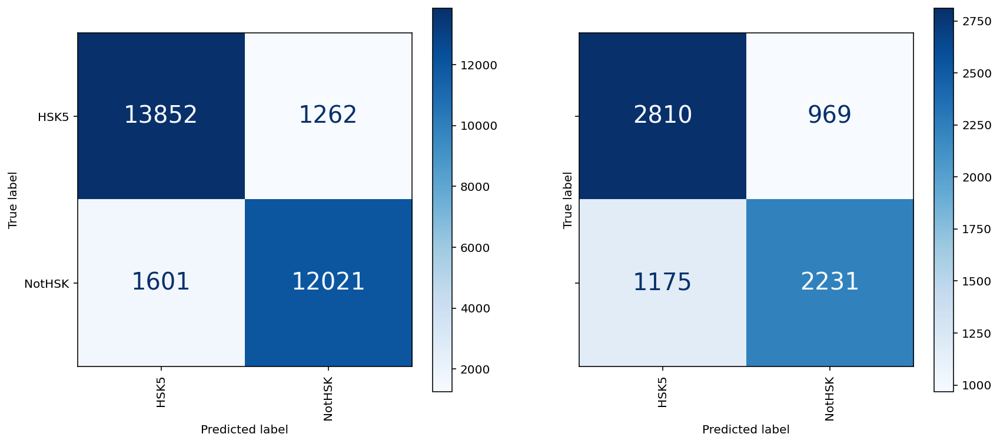

ROC Curves:


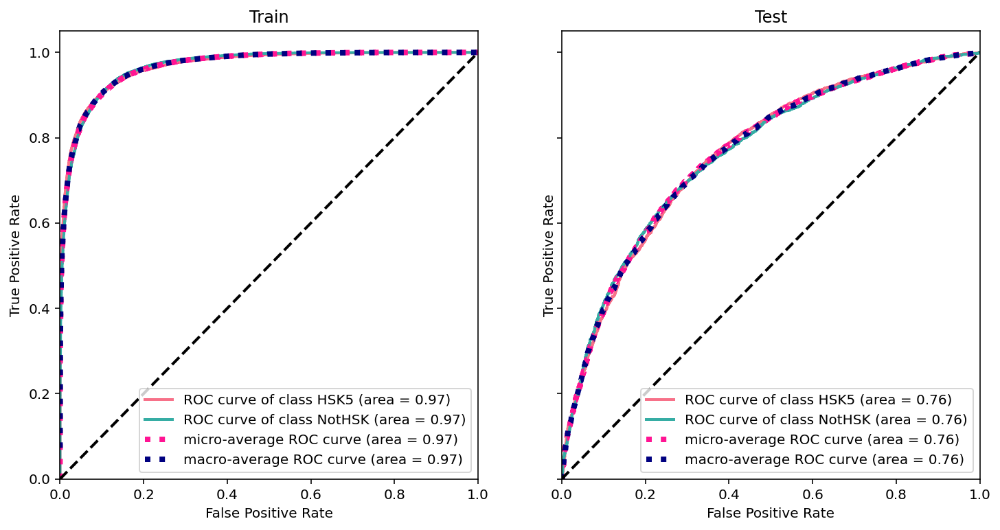

Precision Recall Curve:


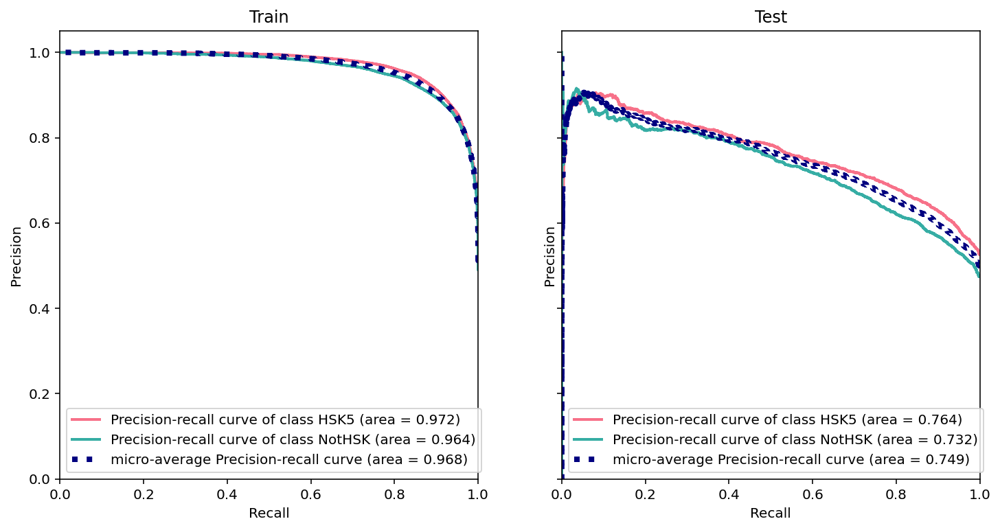

In [424]:
from sklearn.neural_network import MLPClassifier

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=1000)
cvec.fit(X_train)

# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

model = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(20),
                    activation='relu',
                    random_state=1,
                    batch_size='auto',
                    warm_start=True, max_iter=200, verbose=True)


model.fit(X_train, y_train)

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.6. Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', (500, 10)

Params:
- max_feat: 2000
- activation: 'relu', 
- hidden_layer: (100,100)
- max iterations: default (200)

Results:
- run time:(10mins)
- MSE: 72%

In [425]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

Iteration 1, loss = 2.15894925
Iteration 2, loss = 0.72569286
Iteration 3, loss = 0.67439789
Iteration 4, loss = 0.67025631
Iteration 5, loss = 0.66765934
Iteration 6, loss = 0.66628304
Iteration 7, loss = 0.66526631
Iteration 8, loss = 0.66306601
Iteration 9, loss = 0.66301215
Iteration 10, loss = 0.66215384
Iteration 11, loss = 0.66117766
Iteration 12, loss = 0.66081834
Iteration 13, loss = 0.65955271
Iteration 14, loss = 0.65927768
Iteration 15, loss = 0.65890505
Iteration 16, loss = 0.65868304
Iteration 17, loss = 0.65739426
Iteration 18, loss = 0.65758669
Iteration 19, loss = 0.65715959
Iteration 20, loss = 0.65696541
Iteration 21, loss = 0.65758157
Iteration 22, loss = 0.65548609
Iteration 23, loss = 0.65700433
Iteration 24, loss = 0.65543409
Iteration 25, loss = 0.65613741
Iteration 26, loss = 0.65512922
Iteration 27, loss = 0.65534525
Iteration 28, loss = 0.65516405
Iteration 29, loss = 0.65525887
Iteration 30, loss = 0.65460455
Iteration 31, loss = 0.65460151
Iteration 32, los

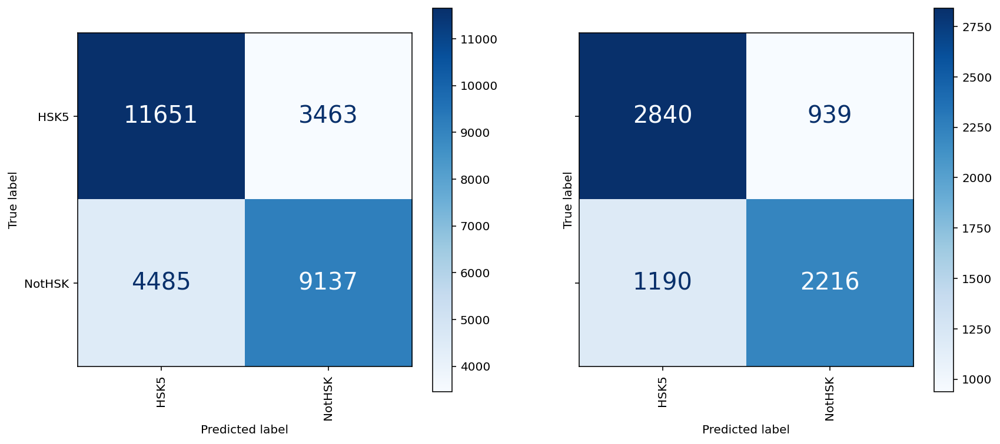

ROC Curves:


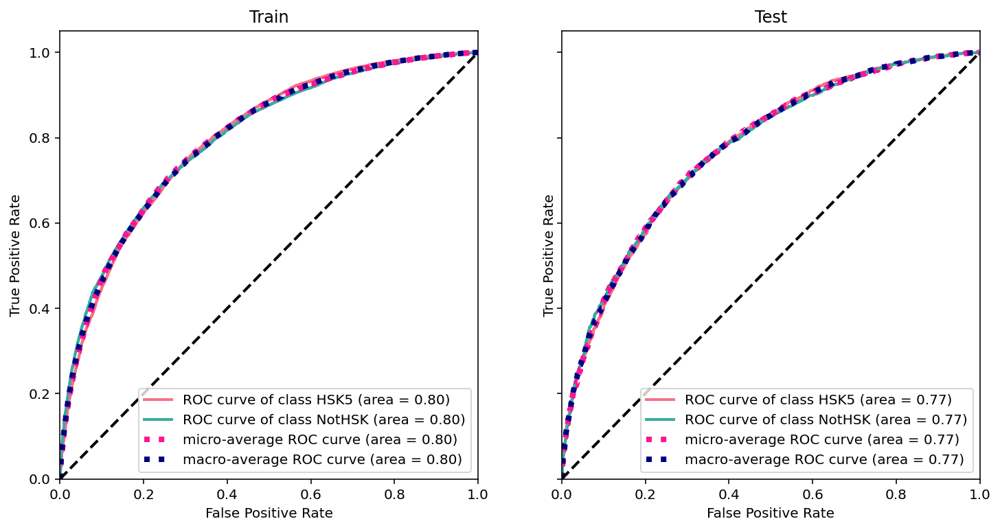

Precision Recall Curve:


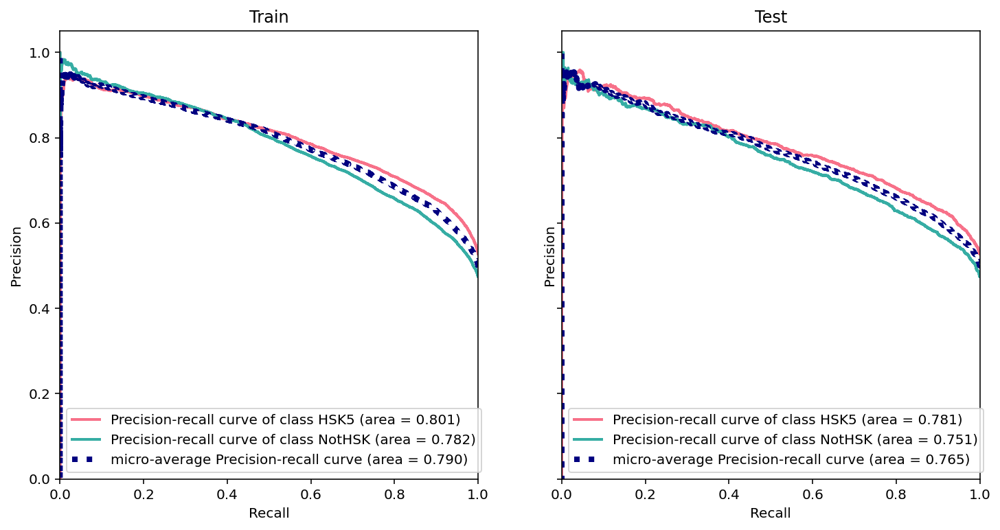

In [426]:
from sklearn.neural_network import MLPClassifier

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=2000)
cvec.fit(X_train)

# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

model = MLPClassifier(solver='adam',
                    alpha=10**(1),
                    hidden_layer_sizes=(100, 100),
                    activation='relu',
                    random_state=1,
                    batch_size='auto',verbose=True, warm_start=True)


model.fit(X_train, y_train)

Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)

lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.6. Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', Grid Search
Params:
- max_feat: 5000
- activation: 'relu', 
- hidden_layer: [(20, 20, 20, 20, 20), (10,120,10)]
- alpha: [10^(0), 10^(0.1)],
- max iterations: default (400)

Results:
- run time: 4 mins
- MSE: 72%

In [433]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

In [435]:
from sklearn.model_selection import GridSearchCV

from sklearn.neural_network import MLPClassifier

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=5000)
cvec.fit(X_train)

# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

In [437]:
params = {'solver':['adam'],
                'alpha':[10**(0), 10**(0.1)],
                'hidden_layer_sizes':[(20, 20, 20, 20, 20), (10,120,10)],
                'activation':['relu'],
                'random_state':[42],
                'batch_size':['auto'],
                'max_iter':[400], 'verbose':[True]}


skf = StratifiedKFold(n_splits=3)
skf.get_n_splits(X_train, y_train)



gs = GridSearchCV(MLPClassifier(), param_grid=params, cv=skf, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

model = gs.best_estimator_
print(gs.best_estimator_)
print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs.best_score_)
print('R2 test: ', gs.score(X_test, y_test))

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Iteration 1, loss = 0.81766635
Iteration 2, loss = 0.61479181
Iteration 3, loss = 0.55495943
Iteration 4, loss = 0.52425254
Iteration 5, loss = 0.50114541
Iteration 6, loss = 0.47969645
Iteration 7, loss = 0.45589368
Iteration 8, loss = 0.43812543
Iteration 9, loss = 0.41655007
Iteration 10, loss = 0.39912382
Iteration 11, loss = 0.38161417
Iteration 12, loss = 0.37046972
Iteration 13, loss = 0.35446057
Iteration 14, loss = 0.36063909
Iteration 15, loss = 0.34765092
Iteration 16, loss = 0.32916001
Iteration 17, loss = 0.32551016
Iteration 18, loss = 0.33178346
Iteration 19, loss = 0.31650513
Iteration 20, loss = 0.31376270
Iteration 21, loss = 0.31281944
Iteration 22, loss = 0.30750374
Iteration 23, loss = 0.31543963
Iteration 24, loss = 0.30186886
Iteration 25, loss = 0.29964405
Iteration 26, loss = 0.30514396
Iteration 27, loss = 0.30066262
Iteration 28, loss = 0.30179357
Iteration 29, loss = 0.30319338
Iteration 30, loss = 

#### 9.3.6. Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', Grid Search
- max_feat: 5000
- activation: 'relu', 
- hidden_layer: [(20, 20, 20, 20), (40,40,40,40)]
- alpha: [10^(1), 10^(2)],
- max iterations: default (400)

Results:
- run time: 4 mins
- MSE: 74.8%

In [441]:
params = {'solver':['adam'],
                'alpha':[10, 10**(1),10**(2)],
                'hidden_layer_sizes':[(20, 20, 20, 20), (40,40,40,40)],
                'activation':['relu'],
                'random_state':[42],
                'batch_size':['auto'],
                'max_iter':[400], 'verbose':[True],'warm_start':[False]}


skf = StratifiedKFold(n_splits=3)
skf.get_n_splits(X_train, y_train)



gs = GridSearchCV(MLPClassifier(), param_grid=params, cv=skf, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

model = gs.best_estimator_
print(gs.best_estimator_)
print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs.best_score_)
print('R2 test: ', gs.score(X_test, y_test))

Fitting 3 folds for each of 6 candidates, totalling 18 fits
Iteration 1, loss = 1.69985123
Iteration 2, loss = 0.98329225
Iteration 3, loss = 0.79008771
Iteration 4, loss = 0.73795442
Iteration 5, loss = 0.72236998
Iteration 6, loss = 0.71760245
Iteration 7, loss = 0.71492348
Iteration 8, loss = 0.71382409
Iteration 9, loss = 0.71161659
Iteration 10, loss = 0.71085495
Iteration 11, loss = 0.71029281
Iteration 12, loss = 0.70855166
Iteration 13, loss = 0.70918418
Iteration 14, loss = 0.70868875
Iteration 15, loss = 0.70854968
Iteration 16, loss = 0.70759618
Iteration 17, loss = 0.70707795
Iteration 18, loss = 0.70752291
Iteration 19, loss = 0.70739690
Iteration 20, loss = 0.70670531
Iteration 21, loss = 0.70599467
Iteration 22, loss = 0.70653734
Iteration 23, loss = 0.70610944
Iteration 24, loss = 0.70608667
Iteration 25, loss = 0.70616153
Iteration 26, loss = 0.70644156
Iteration 27, loss = 0.70485813
Iteration 28, loss = 0.70522708
Iteration 29, loss = 0.70470553
Iteration 30, loss = 

Iteration 1, loss = 0.89438967
Iteration 2, loss = 0.64671518
Iteration 3, loss = 0.54534548
Iteration 4, loss = 0.47127805
Iteration 5, loss = 0.40594966
Iteration 6, loss = 0.35944871
Iteration 7, loss = 0.32130265
Iteration 8, loss = 0.29885495
Iteration 9, loss = 0.29876019
Iteration 10, loss = 0.28726688
Iteration 11, loss = 0.27451230
Iteration 12, loss = 0.26148554
Iteration 13, loss = 0.25146080
Iteration 14, loss = 0.24864995
Iteration 15, loss = 0.24023416
Iteration 16, loss = 0.23736126
Iteration 17, loss = 0.23972638
Iteration 18, loss = 0.24655187
Iteration 19, loss = 0.24357090
Iteration 20, loss = 0.24147235
Iteration 21, loss = 0.23554039
Iteration 22, loss = 0.21986789
Iteration 23, loss = 0.21344630
Iteration 24, loss = 0.20893454
Iteration 25, loss = 0.21426368
Iteration 26, loss = 0.22231766
Iteration 27, loss = 0.22377042
Iteration 28, loss = 0.22023398
Iteration 29, loss = 0.21948621
Iteration 30, loss = 0.22452396
Iteration 31, loss = 0.21999034
Iteration 32, los

Iteration 1, loss = 1.91123841
Iteration 2, loss = 1.19427168
Iteration 3, loss = 0.92154469
Iteration 4, loss = 0.80468251
Iteration 5, loss = 0.75244958
Iteration 6, loss = 0.73206128
Iteration 7, loss = 0.72253101
Iteration 8, loss = 0.71885667
Iteration 9, loss = 0.71564229
Iteration 10, loss = 0.71371633
Iteration 11, loss = 0.71344323
Iteration 12, loss = 0.71197997
Iteration 13, loss = 0.70917206
Iteration 14, loss = 0.71009100
Iteration 15, loss = 0.70813053
Iteration 16, loss = 0.70708975
Iteration 17, loss = 0.70557889
Iteration 18, loss = 0.70607594
Iteration 19, loss = 0.70437064
Iteration 20, loss = 0.70481957
Iteration 21, loss = 0.70486001
Iteration 22, loss = 0.70207676
Iteration 23, loss = 0.70441443
Iteration 24, loss = 0.70091806
Iteration 25, loss = 0.70101905
Iteration 26, loss = 0.70301011
Iteration 27, loss = 0.69973697
Iteration 28, loss = 0.70073457
Iteration 29, loss = 0.70027846
Iteration 30, loss = 0.70055057
Iteration 31, loss = 0.69924839
Iteration 32, los

Iteration 1, loss = 0.78978245
Iteration 2, loss = 0.59829252
Iteration 3, loss = 0.51450391
Iteration 4, loss = 0.46194768
Iteration 5, loss = 0.41287823
Iteration 6, loss = 0.37504217
Iteration 7, loss = 0.33865973
Iteration 8, loss = 0.31467027
Iteration 9, loss = 0.28789343
Iteration 10, loss = 0.27149018
Iteration 11, loss = 0.27327907
Iteration 12, loss = 0.25321859
Iteration 13, loss = 0.24812767
Iteration 14, loss = 0.23883192
Iteration 15, loss = 0.24690136
Iteration 16, loss = 0.24467609
Iteration 17, loss = 0.24668804
Iteration 18, loss = 0.23781528
Iteration 19, loss = 0.22661645
Iteration 20, loss = 0.22316960
Iteration 21, loss = 0.22117634
Iteration 22, loss = 0.22816611
Iteration 23, loss = 0.22801499
Iteration 24, loss = 0.23299101
Iteration 25, loss = 0.21616765
Iteration 26, loss = 0.20607947
Iteration 27, loss = 0.19519548
Iteration 28, loss = 0.20360098
Iteration 29, loss = 0.22335601
Iteration 30, loss = 0.22295985
Iteration 31, loss = 0.21692097
Iteration 32, los

Iteration 1, loss = 0.89589522
Iteration 2, loss = 0.65162266
Iteration 3, loss = 0.55119551
Iteration 4, loss = 0.48043140
Iteration 5, loss = 0.41973146
Iteration 6, loss = 0.37167171
Iteration 7, loss = 0.33836642
Iteration 8, loss = 0.30791309
Iteration 9, loss = 0.29771111
Iteration 10, loss = 0.28758797
Iteration 11, loss = 0.27618941
Iteration 12, loss = 0.27176147
Iteration 13, loss = 0.25697824
Iteration 14, loss = 0.25142269
Iteration 15, loss = 0.25381998
Iteration 16, loss = 0.24882232
Iteration 17, loss = 0.24304735
Iteration 18, loss = 0.24301361
Iteration 19, loss = 0.24391681
Iteration 20, loss = 0.23517953
Iteration 21, loss = 0.22582058
Iteration 22, loss = 0.22173827
Iteration 23, loss = 0.23038068
Iteration 24, loss = 0.23769681
Iteration 25, loss = 0.23987423
Iteration 26, loss = 0.22903973
Iteration 27, loss = 0.21411744
Iteration 28, loss = 0.20986399
Iteration 29, loss = 0.21133795
Iteration 30, loss = 0.20734803
Iteration 31, loss = 0.21985850
Iteration 32, los

Iteration 1, loss = 2.81854333
Iteration 2, loss = 1.29587713
Iteration 3, loss = 0.87815060
Iteration 4, loss = 0.75750107
Iteration 5, loss = 0.72865995
Iteration 6, loss = 0.71961198
Iteration 7, loss = 0.71755950
Iteration 8, loss = 0.71565534
Iteration 9, loss = 0.71358897
Iteration 10, loss = 0.71357058
Iteration 11, loss = 0.71329185
Iteration 12, loss = 0.71219445
Iteration 13, loss = 0.71064837
Iteration 14, loss = 0.71007821
Iteration 15, loss = 0.71084271
Iteration 16, loss = 0.70939830
Iteration 17, loss = 0.70965807
Iteration 18, loss = 0.70807863
Iteration 19, loss = 0.70879689
Iteration 20, loss = 0.70888793
Iteration 21, loss = 0.70674558
Iteration 22, loss = 0.70812072
Iteration 23, loss = 0.70606623
Iteration 24, loss = 0.70563574
Iteration 25, loss = 0.70585651
Iteration 26, loss = 0.70586843
Iteration 27, loss = 0.70463831
Iteration 28, loss = 0.70414546
Iteration 29, loss = 0.70351957
Iteration 30, loss = 0.70228371
Iteration 31, loss = 0.70241038
Iteration 32, los

#### 9.3.7. Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', Grid Search
- max_feat: 5000
- activation: 'relu', 
- hidden_layer: [(20, 20, 20, 20,20), (25,25,25,25,25),(20,20,20)]
- alpha: [2, 10,15],
- max iterations: default (400)

Results:
- run time: 5 mins
- MSE: 74.1%

In [446]:
params = {'solver':['adam'],
                'alpha':[2, 10,15],
                'hidden_layer_sizes':[(20, 20, 20, 20,20), (20,20,20)],
                'activation':['relu'],
                'random_state':[42],
                'batch_size':['auto'],
                'max_iter':[500], 'verbose':[True],'warm_start':[True]}


skf = StratifiedKFold(n_splits=4)
skf.get_n_splits(X_train, y_train)



gs = GridSearchCV(MLPClassifier(), param_grid=params, cv=skf, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

model = gs.best_estimator_

Fitting 4 folds for each of 6 candidates, totalling 24 fits
Iteration 1, loss = 1.38387710
Iteration 2, loss = 0.86781597
Iteration 3, loss = 0.73673483
Iteration 4, loss = 0.69981619
Iteration 5, loss = 0.69117742
Iteration 6, loss = 0.68901145
Iteration 7, loss = 0.68860612
Iteration 8, loss = 0.68712426
Iteration 9, loss = 0.68692999
Iteration 10, loss = 0.68677188
Iteration 11, loss = 0.68584978
Iteration 12, loss = 0.68535792
Iteration 13, loss = 0.68469554
Iteration 14, loss = 0.68501983
Iteration 15, loss = 0.68481742
Iteration 16, loss = 0.68445238
Iteration 17, loss = 0.68444516
Iteration 18, loss = 0.68404435
Iteration 19, loss = 0.68344713
Iteration 20, loss = 0.68344785
Iteration 21, loss = 0.68418872
Iteration 22, loss = 0.68175452
Iteration 23, loss = 0.68249407
Iteration 24, loss = 0.68330110
Iteration 25, loss = 0.68235641
Iteration 26, loss = 0.68191326
Iteration 27, loss = 0.68198127
Iteration 28, loss = 0.68195521
Iteration 29, loss = 0.68163074
Iteration 30, loss = 

In [447]:
print(gs.best_estimator_)
print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs.best_score_)
print('R2 test: ', gs.score(X_test, y_test))

MLPClassifier(alpha=10, hidden_layer_sizes=(20, 20, 20), max_iter=500,
              random_state=42, verbose=True, warm_start=True)
R2 training:  0.7639546213808464
R2 CV training:  0.7407781180400891
R2 test:  0.7284620737647878
Iteration 1, loss = 0.82313584
Iteration 2, loss = 0.64606239
Iteration 3, loss = 0.58416770
Iteration 4, loss = 0.55567961
Iteration 5, loss = 0.53483693
Iteration 6, loss = 0.51972015
Iteration 7, loss = 0.50453162
Iteration 8, loss = 0.49113676
Iteration 9, loss = 0.47911761
Iteration 10, loss = 0.45991106
Iteration 11, loss = 0.44131047
Iteration 12, loss = 0.42730374
Iteration 13, loss = 0.42218497
Iteration 14, loss = 0.40290747
Iteration 15, loss = 0.38782275
Iteration 16, loss = 0.37983283
Iteration 17, loss = 0.37175430
Iteration 18, loss = 0.36636781
Iteration 19, loss = 0.34879882
Iteration 20, loss = 0.35393222
Iteration 21, loss = 0.35189440
Iteration 22, loss = 0.33881273
Iteration 23, loss = 0.34132728
Iteration 24, loss = 0.33284282
Iteration 

Iteration 1, loss = 0.82740499
Iteration 2, loss = 0.64588678
Iteration 3, loss = 0.58123565
Iteration 4, loss = 0.54818809
Iteration 5, loss = 0.52783426
Iteration 6, loss = 0.51012256
Iteration 7, loss = 0.49277952
Iteration 8, loss = 0.47850672
Iteration 9, loss = 0.46698018
Iteration 10, loss = 0.45005142
Iteration 11, loss = 0.43777341
Iteration 12, loss = 0.42820782
Iteration 13, loss = 0.41723816
Iteration 14, loss = 0.39979327
Iteration 15, loss = 0.39118963
Iteration 16, loss = 0.39625163
Iteration 17, loss = 0.37552826
Iteration 18, loss = 0.36076456
Iteration 19, loss = 0.35818242
Iteration 20, loss = 0.35886375
Iteration 21, loss = 0.35485110
Iteration 22, loss = 0.34243343
Iteration 23, loss = 0.33975237
Iteration 24, loss = 0.34261061
Iteration 25, loss = 0.33916073
Iteration 26, loss = 0.33426385
Iteration 27, loss = 0.33012918
Iteration 28, loss = 0.32466238
Iteration 29, loss = 0.32320949
Iteration 30, loss = 0.32324221
Iteration 31, loss = 0.32128618
Iteration 32, los

Iteration 1, loss = 0.82540952
Iteration 2, loss = 0.64805157
Iteration 3, loss = 0.58211620
Iteration 4, loss = 0.54696295
Iteration 5, loss = 0.52412253
Iteration 6, loss = 0.50717218
Iteration 7, loss = 0.49060328
Iteration 8, loss = 0.47620233
Iteration 9, loss = 0.45298709
Iteration 10, loss = 0.44087617
Iteration 11, loss = 0.42600006
Iteration 12, loss = 0.40838546
Iteration 13, loss = 0.39494180
Iteration 14, loss = 0.38793892
Iteration 15, loss = 0.37832659
Iteration 16, loss = 0.36287449
Iteration 17, loss = 0.36515337
Iteration 18, loss = 0.36071691
Iteration 19, loss = 0.34998629
Iteration 20, loss = 0.35269760
Iteration 21, loss = 0.34675755
Iteration 22, loss = 0.34367977
Iteration 23, loss = 0.34161236
Iteration 24, loss = 0.33439721
Iteration 25, loss = 0.33080060
Iteration 26, loss = 0.33602142
Iteration 27, loss = 0.32443131
Iteration 28, loss = 0.31758629
Iteration 29, loss = 0.32444303
Iteration 30, loss = 0.32400574
Iteration 31, loss = 0.32718273
Iteration 32, los

Iteration 1, loss = 2.19247402
Iteration 2, loss = 1.27110599
Iteration 3, loss = 0.93211423
Iteration 4, loss = 0.79980324
Iteration 5, loss = 0.75140740
Iteration 6, loss = 0.73497388
Iteration 7, loss = 0.72922396
Iteration 8, loss = 0.72632749
Iteration 9, loss = 0.72419434
Iteration 10, loss = 0.72225851
Iteration 11, loss = 0.72124894
Iteration 12, loss = 0.72018045
Iteration 13, loss = 0.71937776
Iteration 14, loss = 0.71872412
Iteration 15, loss = 0.71749664
Iteration 16, loss = 0.71478030
Iteration 17, loss = 0.70608044
Iteration 18, loss = 0.69797313
Iteration 19, loss = 0.69488123
Iteration 20, loss = 0.69363840
Iteration 21, loss = 0.69304301
Iteration 22, loss = 0.69270907
Iteration 23, loss = 0.69253669
Iteration 24, loss = 0.69236576
Iteration 25, loss = 0.69226313
Iteration 26, loss = 0.69220259
Iteration 27, loss = 0.69210483
Iteration 28, loss = 0.69211335
Iteration 29, loss = 0.69209447
Iteration 30, loss = 0.69201824
Iteration 31, loss = 0.69199141
Iteration 32, los

Iteration 1, loss = 2.19406137
Iteration 2, loss = 1.26861468
Iteration 3, loss = 0.93237767
Iteration 4, loss = 0.80034764
Iteration 5, loss = 0.75308995
Iteration 6, loss = 0.73744415
Iteration 7, loss = 0.73283125
Iteration 8, loss = 0.73063354
Iteration 9, loss = 0.72969322
Iteration 10, loss = 0.72865035
Iteration 11, loss = 0.72790792
Iteration 12, loss = 0.72760155
Iteration 13, loss = 0.72742439
Iteration 14, loss = 0.72657198
Iteration 15, loss = 0.72607109
Iteration 16, loss = 0.72581361
Iteration 17, loss = 0.72556733
Iteration 18, loss = 0.72531957
Iteration 19, loss = 0.72409388
Iteration 20, loss = 0.72316581
Iteration 21, loss = 0.72222049
Iteration 22, loss = 0.72150463
Iteration 23, loss = 0.72089315
Iteration 24, loss = 0.72034296
Iteration 25, loss = 0.71999753
Iteration 26, loss = 0.71924321
Iteration 27, loss = 0.71877035
Iteration 28, loss = 0.71832710
Iteration 29, loss = 0.71734530
Iteration 30, loss = 0.71587214
Iteration 31, loss = 0.71060355
Iteration 32, los

#### 9.3.8. Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', Grid Search
- increased tvec features to 10k
- max_feat: 50k
- activation: 'relu', 
- hidden_layer: [(20,20,20)]
- alpha: [10],
- max iterations: default (400)

Results:
- run time: 
- MSE: 77%

In [450]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

from sklearn.model_selection import GridSearchCV

from sklearn.neural_network import MLPClassifier

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie, max_features=50000)
cvec.fit(X_train)

# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

In [451]:
params = {'solver':['adam'],
                'alpha':[10],
                'hidden_layer_sizes':[(20,20,20)],
                'activation':['relu'],
                'random_state':[42],
                'batch_size':['auto'],
                'max_iter':[500], 'verbose':[True],'warm_start':[True]}


skf = StratifiedKFold(n_splits=4)
skf.get_n_splits(X_train, y_train)



gs = GridSearchCV(MLPClassifier(), param_grid=params, cv=skf, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

model = gs.best_estimator_

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Iteration 1, loss = 1.35024914
Iteration 2, loss = 0.88570812
Iteration 3, loss = 0.75858544
Iteration 4, loss = 0.72592676
Iteration 5, loss = 0.71699222
Iteration 6, loss = 0.71387496
Iteration 7, loss = 0.71335430
Iteration 8, loss = 0.71229031
Iteration 9, loss = 0.71232893
Iteration 10, loss = 0.71284070
Iteration 11, loss = 0.71170232
Iteration 12, loss = 0.71078681
Iteration 13, loss = 0.71000950
Iteration 14, loss = 0.71034506
Iteration 15, loss = 0.71034724
Iteration 16, loss = 0.70955133
Iteration 17, loss = 0.70792978
Iteration 1, loss = 1.44415131
Iteration 2, loss = 0.98354003
Iteration 3, loss = 0.82134583
Iteration 4, loss = 0.75499884
Iteration 5, loss = 0.72724757
Iteration 6, loss = 0.71921240
Iteration 7, loss = 0.71389767
Iteration 8, loss = 0.71431159
Iteration 9, loss = 0.70870511
Iteration 10, loss = 0.70763664
Iteration 11, loss = 0.70835559
Iteration 12, loss = 0.70396569
Iteration 13, loss = 0.70523846

Iteration 29, loss = 0.69733527
Iteration 30, loss = 0.69777064
Iteration 31, loss = 0.69541914
Iteration 32, loss = 0.69743891
Iteration 33, loss = 0.69653160
Iteration 34, loss = 0.69542744
Iteration 35, loss = 0.69486550
Iteration 36, loss = 0.69489337
Iteration 37, loss = 0.69449421
Iteration 38, loss = 0.69266193
Iteration 39, loss = 0.69372821
Iteration 40, loss = 0.69312790
Iteration 41, loss = 0.69344944
Iteration 42, loss = 0.69223218
Iteration 43, loss = 0.69355911
Iteration 44, loss = 0.69244126
Iteration 45, loss = 0.69241712
Iteration 46, loss = 0.69247078
Iteration 47, loss = 0.69165601
Iteration 48, loss = 0.69173240
Iteration 49, loss = 0.69238435
Iteration 50, loss = 0.68998832
Iteration 51, loss = 0.68950573
Iteration 52, loss = 0.69145219
Iteration 53, loss = 0.69110339
Iteration 54, loss = 0.69026099
Iteration 55, loss = 0.68984224
Iteration 56, loss = 0.68919030
Iteration 57, loss = 0.69179332
Iteration 58, loss = 0.68991976
Iteration 59, loss = 0.68935137
Iteratio

Iteration 107, loss = 0.68286353
Iteration 108, loss = 0.68230370
Iteration 109, loss = 0.68207762
Iteration 110, loss = 0.68239203
Iteration 111, loss = 0.68270288
Iteration 112, loss = 0.68258469
Iteration 113, loss = 0.68221028
Iteration 114, loss = 0.68257245
Iteration 115, loss = 0.68150500
Iteration 116, loss = 0.68261843
Iteration 117, loss = 0.68168770
Iteration 118, loss = 0.68162782
Iteration 119, loss = 0.68137726
Iteration 120, loss = 0.68155102
Iteration 121, loss = 0.68235209
Iteration 122, loss = 0.68238707
Iteration 1, loss = 1.44190506
Iteration 2, loss = 0.98349124
Iteration 3, loss = 0.81468965
Iteration 4, loss = 0.74912773
Iteration 5, loss = 0.72521721
Iteration 6, loss = 0.71560564
Iteration 7, loss = 0.71317239
Iteration 8, loss = 0.71207114
Iteration 9, loss = 0.71061220
Iteration 10, loss = 0.70955352
Iteration 11, loss = 0.71022893
Iteration 12, loss = 0.70798106
Iteration 13, loss = 0.70882156
Iteration 14, loss = 0.70742383
Iteration 15, loss = 0.70749150
I

Iteration 137, loss = 0.67925299
Iteration 138, loss = 0.68031730
Iteration 139, loss = 0.68125423
Iteration 140, loss = 0.68015618
Iteration 141, loss = 0.67905392
Iteration 142, loss = 0.67946569
Iteration 143, loss = 0.67963863
Iteration 144, loss = 0.67903906
Iteration 145, loss = 0.67967449
Iteration 146, loss = 0.67968267
Iteration 147, loss = 0.67842681
Iteration 148, loss = 0.67949922
Iteration 149, loss = 0.67807213
Iteration 150, loss = 0.67884751
Iteration 151, loss = 0.67896410
Iteration 152, loss = 0.67884457
Iteration 153, loss = 0.67722157
Iteration 154, loss = 0.67770104
Iteration 155, loss = 0.67780656
Iteration 156, loss = 0.67778764
Iteration 157, loss = 0.67751276
Iteration 158, loss = 0.67777243
Iteration 159, loss = 0.67794496
Iteration 160, loss = 0.67742499
Iteration 161, loss = 0.67910301
Iteration 162, loss = 0.67746237
Iteration 163, loss = 0.67765558
Iteration 164, loss = 0.67753824
Training loss did not improve more than tol=0.000100 for 10 consecutive epoc

In [452]:
print(gs.best_estimator_)
print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs.best_score_)
print('R2 test: ', gs.score(X_test, y_test))

MLPClassifier(alpha=10, hidden_layer_sizes=(20, 20, 20), max_iter=500,
              random_state=42, verbose=True, warm_start=True)
R2 training:  0.8366856904231625
R2 CV training:  0.7674345768374164
R2 test:  0.7585247042449548


#### 9.3.9. Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', Grid Search SNOW NLP
- increased tvec features to 10k
- max_feat: 50k
- activation: 'relu', 
- hidden_layer: [(20,20,20)]
- alpha: [10],
- max iterations: default (400)

Results:
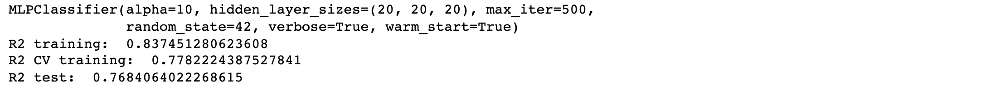
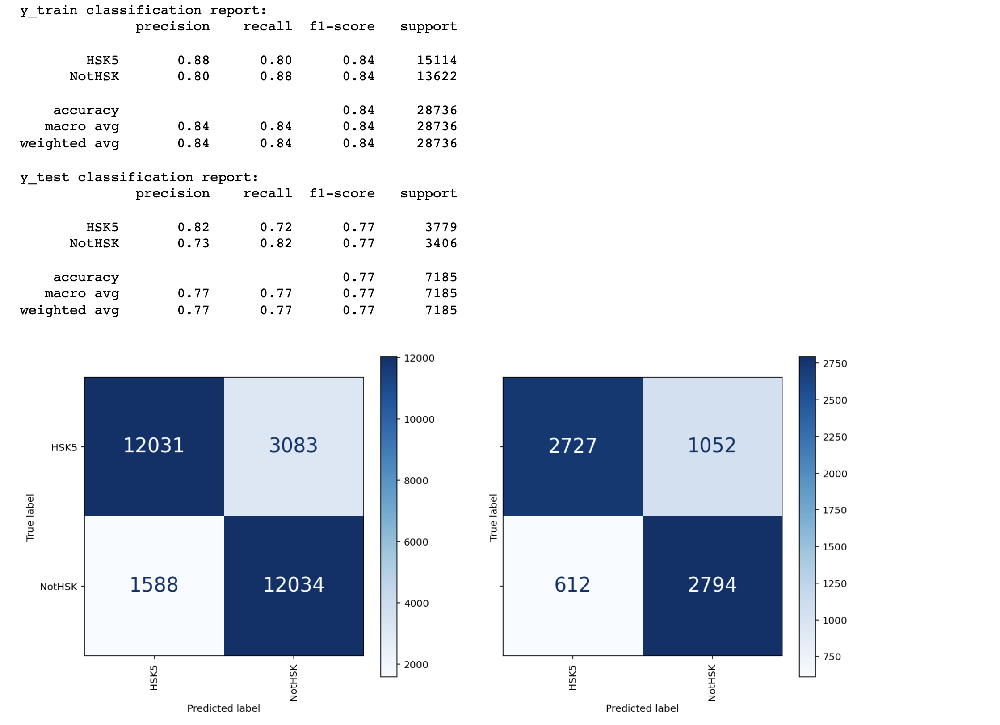

In [762]:

# Tokenizer using JieBa to account for Mandarin
def snowtok(x):
    return SnowNLP(x).words

In [763]:
# import data file
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

In [764]:
# Create HSK5 binary variable
df_h5 = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()
df_h5['is_h5'] = 'NotHSK'
df_h5['is_h5'][df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk5 > 0.9] = 'HSK5'
X = df_h5[['lyrics','is_h5'
]]
y = X.pop('is_h5')
X = X['lyrics']
df_h5['is_h5'].value_counts()
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

from sklearn.model_selection import GridSearchCV

from sklearn.neural_network import MLPClassifier

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=snowtok, max_features=50000)
cvec.fit(X_train)

# Transform training data
cvec_mat = cvec.transform(X_train)
X_train = cvec_mat
X_test = cvec.transform(X_test)

Iteration 1, loss = 1.91325684
Iteration 2, loss = 1.39304200
Iteration 3, loss = 1.19232611
Iteration 4, loss = 1.10263725
Iteration 5, loss = 1.06149409
Iteration 6, loss = 1.03916955
Iteration 7, loss = 1.02889977
Iteration 8, loss = 1.01976330
Iteration 9, loss = 1.01456397
Iteration 10, loss = 1.00789111
Iteration 11, loss = 1.00541002
Iteration 12, loss = 0.99992146
Iteration 13, loss = 0.99761200
Iteration 14, loss = 0.99479240
Iteration 15, loss = 0.99181690
Iteration 16, loss = 0.98946953
Iteration 17, loss = 0.98813744
Iteration 18, loss = 0.98466294
Iteration 19, loss = 0.98106277
Iteration 20, loss = 0.97904516
Iteration 21, loss = 0.97811869
Iteration 22, loss = 0.97467924
Iteration 23, loss = 0.97266005
Iteration 24, loss = 0.96918084
Iteration 25, loss = 0.96999102
Iteration 26, loss = 0.96539418
Iteration 27, loss = 0.96374379
Iteration 28, loss = 0.96327806
Iteration 29, loss = 0.96080431
Iteration 30, loss = 0.95861784
Iteration 31, loss = 0.95722914
Iteration 32, los

In [765]:
params = {'solver':['adam'],
                'alpha':[10],
                'hidden_layer_sizes':[(20,20,20)],
                'activation':['relu'],
                'random_state':[42],
                'batch_size':['auto'],
                'max_iter':[500], 'verbose':[True],'warm_start':[True]}


skf = StratifiedKFold(n_splits=4)
skf.get_n_splits(X_train, y_train)



gs = GridSearchCV(MLPClassifier(), param_grid=params, cv=skf, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

model = gs.best_estimator_

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Iteration 1, loss = 1.34570040
Iteration 2, loss = 0.88768400
Iteration 3, loss = 0.75830567
Iteration 4, loss = 0.72072509
Iteration 5, loss = 0.70902406
Iteration 6, loss = 0.70411581
Iteration 7, loss = 0.70288532
Iteration 8, loss = 0.70022518
Iteration 9, loss = 0.69849186
Iteration 10, loss = 0.70018484
Iteration 11, loss = 0.69704391
Iteration 12, loss = 0.69592386
Iteration 13, loss = 0.69542620
Iteration 14, loss = 0.69506114
Iteration 15, loss = 0.69505888
Iteration 1, loss = 1.43178663
Iteration 2, loss = 0.97106519
Iteration 3, loss = 0.80632169
Iteration 4, loss = 0.73937054
Iteration 5, loss = 0.71260413
Iteration 6, loss = 0.70507669
Iteration 7, loss = 0.69902833
Iteration 8, loss = 0.69831433
Iteration 9, loss = 0.69917195
Iteration 10, loss = 0.69361753
Iteration 11, loss = 0.69300973
Iteration 12, loss = 0.69261238
Iteration 13, loss = 0.69314095
Iteration 14, loss = 0.69225334
Iteration 15, loss = 0.69142419

Iteration 66, loss = 0.66858412
Iteration 67, loss = 0.67049710
Iteration 68, loss = 0.66888956
Iteration 69, loss = 0.66880296
Iteration 70, loss = 0.66918747
Iteration 71, loss = 0.66793652
Iteration 72, loss = 0.66828100
Iteration 73, loss = 0.66945378
Iteration 74, loss = 0.66713232
Iteration 75, loss = 0.66763186
Iteration 76, loss = 0.66701897
Iteration 77, loss = 0.66783687
Iteration 78, loss = 0.66721623
Iteration 79, loss = 0.66604143
Iteration 80, loss = 0.66661995
Iteration 1, loss = 1.43159590
Iteration 2, loss = 0.97384152
Iteration 3, loss = 0.80594664
Iteration 4, loss = 0.74174614
Iteration 5, loss = 0.71359353
Iteration 6, loss = 0.70630178
Iteration 7, loss = 0.70057566
Iteration 8, loss = 0.70232439
Iteration 9, loss = 0.69502154
Iteration 10, loss = 0.69487631
Iteration 11, loss = 0.69516909
Iteration 12, loss = 0.69171271
Iteration 13, loss = 0.69422712
Iteration 14, loss = 0.69304620
Iteration 15, loss = 0.69174291
Iteration 16, loss = 0.69027880
Iteration 17, los

Iteration 119, loss = 0.66222842
Iteration 120, loss = 0.66220772
Iteration 121, loss = 0.66391333
Iteration 122, loss = 0.66313093
Iteration 123, loss = 0.66241597
Iteration 124, loss = 0.66215528
Iteration 125, loss = 0.66265079
Iteration 126, loss = 0.66123624
Iteration 127, loss = 0.66243707
Iteration 128, loss = 0.66095057
Iteration 129, loss = 0.66143119
Iteration 130, loss = 0.66214589
Iteration 131, loss = 0.66172917
Iteration 132, loss = 0.66103711
Iteration 133, loss = 0.66220781
Iteration 134, loss = 0.66126672
Iteration 135, loss = 0.66174324
Iteration 136, loss = 0.66210151
Iteration 137, loss = 0.66052308
Iteration 138, loss = 0.66095829
Iteration 139, loss = 0.66275412
Iteration 140, loss = 0.66186452
Iteration 141, loss = 0.66067267
Iteration 142, loss = 0.66108905
Iteration 143, loss = 0.66139412
Iteration 144, loss = 0.66092684
Iteration 145, loss = 0.66245711
Iteration 146, loss = 0.66155445
Iteration 147, loss = 0.66102122
Iteration 148, loss = 0.66247150
Training l

In [766]:
print(gs.best_estimator_)
print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs.best_score_)
print('R2 test: ', gs.score(X_test, y_test))

MLPClassifier(alpha=10, hidden_layer_sizes=(20, 20, 20), max_iter=500,
              random_state=42, verbose=True, warm_start=True)
R2 training:  0.837451280623608
R2 CV training:  0.7782224387527841
R2 test:  0.7684064022268615


y_train classification report:
              precision    recall  f1-score   support

        HSK5       0.88      0.80      0.84     15114
      NotHSK       0.80      0.88      0.84     13622

    accuracy                           0.84     28736
   macro avg       0.84      0.84      0.84     28736
weighted avg       0.84      0.84      0.84     28736

y_test classification report:
              precision    recall  f1-score   support

        HSK5       0.82      0.72      0.77      3779
      NotHSK       0.73      0.82      0.77      3406

    accuracy                           0.77      7185
   macro avg       0.77      0.77      0.77      7185
weighted avg       0.77      0.77      0.77      7185



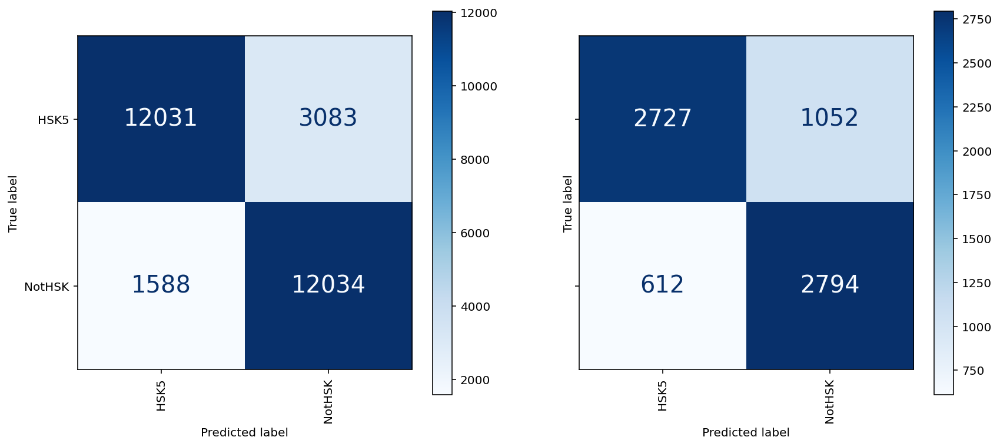

ROC Curves:


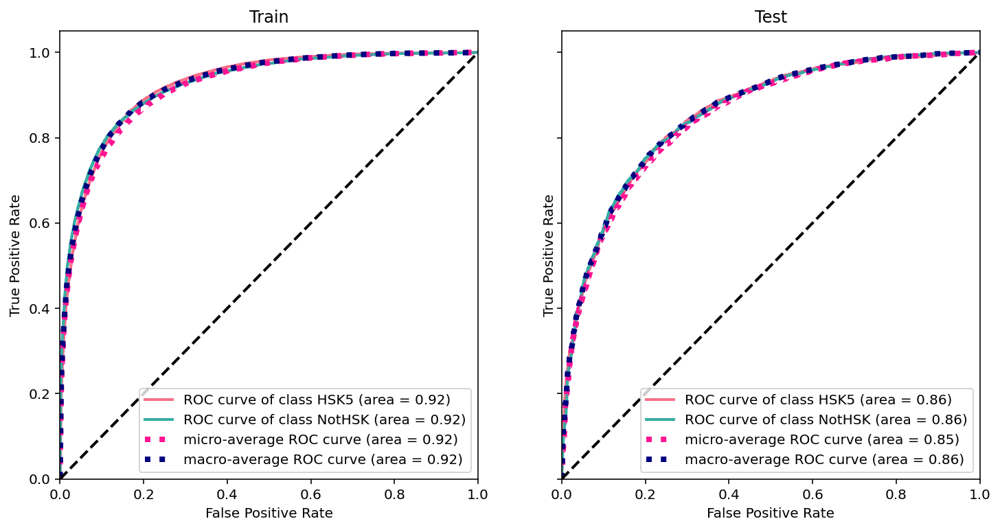

Precision Recall Curve:


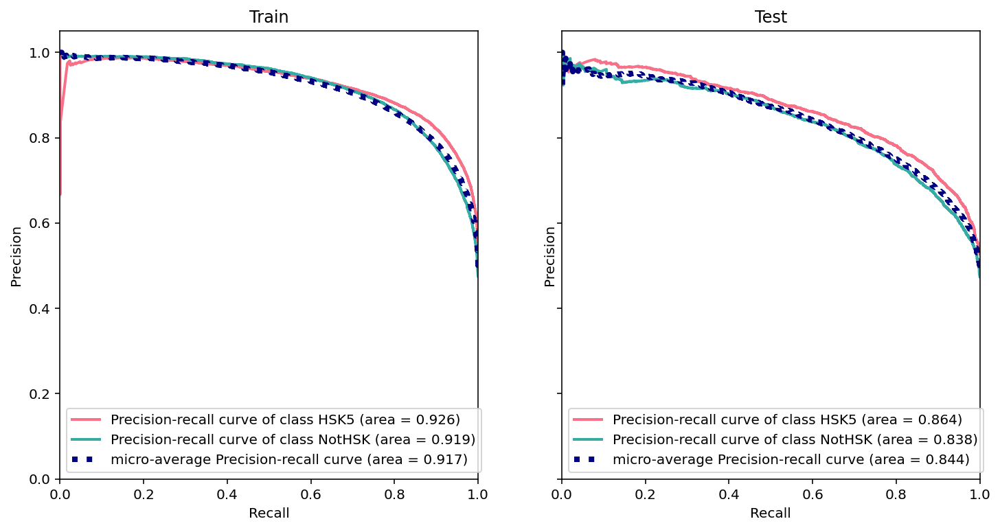

In [773]:
logist_plots(gs,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

### 9.4. Multi Classification of HSK Based on Lyrics

#### 9.4.1. Try All Models

#### Fastest/Best Model:
- Training: 
- BernoulliNB(alpha=0.01)
- train time: 0.022s
- test time:  0.008s
- accuracy:   0.685
- dimensionality: 50000
- density: 1.000000
- top 10 keywords per class:
- 3: 一天 一起 世界 没 不会 走 不要 知道 没有 爱
- 4: 爱情 不要 不会 没 心 世界 知道 走 没有 爱
- 5: 梦 不会 太 走 混音 没 心 世界 没有 爱
- 6: 走 出 心 监制 录音 声 世界 吉他 爱 混音

- classification report:
confusion matrix:
- [[  98  118    9    1]
- [ 104 1628  680   16]
- [  48  921 3040  167]
- [  20   18  158  159]]
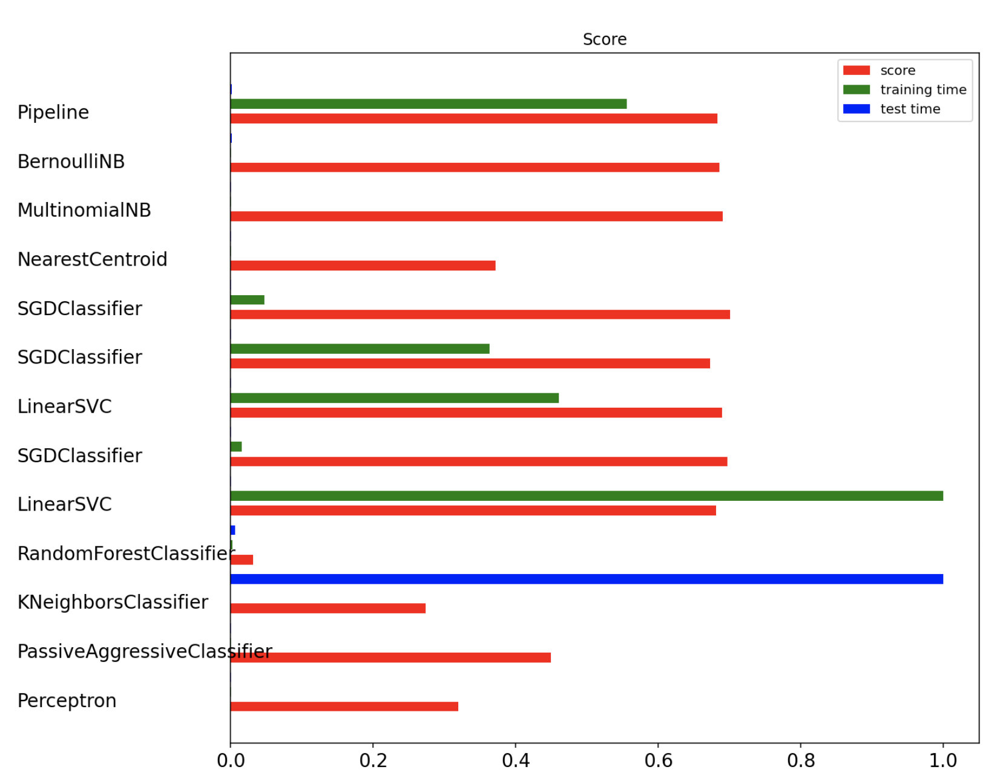



In [495]:
# import data file
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

In [502]:
# Create X and y
df_HSK_classification = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()

X = df_HSK_classification[['lyrics','hsk_level'
]]

y = X.pop('hsk_level')
X=X['lyrics']


In [503]:
def hsk3_group(x):
    if x <= 3:
        return 3
    else:
        return x

In [504]:
y = y.apply(hsk3_group)

In [505]:
y.value_counts()

5    20877
4    12139
6     1773
3     1132
Name: hsk_level, dtype: int64

In [506]:
# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie)
cvec.fit(X)

CountVectorizer(tokenizer=<function man_token_jie at 0x7fdb0b4cc940>)

Perceptron
________________________________________________________________________________
Training: 
Perceptron(class_weight={3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0}, n_jobs=-1)
train time: 0.058s
test time:  0.004s
accuracy:   0.319
dimensionality: 50000
density: 0.001060
top 10 keywords per class:
3: 小猫 小猫咪 小猫猫 小王 小王子 小玩意 小球 小生 小气 龟裂
4: 小狗 小猪 小猫 小猫咪 小猫猫 小王 小王子 小玩意 小步 龟裂
5: 小爱 小牛 小狗 小猪 小猫 小猫咪 小猫猫 小王 小桥流水 龟裂
6: 小猪 小猫 小猫咪 小猫猫 小王 小王子 小玩意 小球 小毛病 龟裂

classification report:
confusion matrix:
[[  74   83   59   10]
 [ 516  661 1037  214]
 [1163 1088 1540  385]
 [ 204   85   49   17]]

Passive-Aggressive
________________________________________________________________________________
Training: 
PassiveAggressiveClassifier(class_weight={3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0},
                            n_jobs=-1)
train time: 0.053s
test time:  0.004s
accuracy:   0.450
dimensionality: 50000
density: 0.220495
top 10 keywords per class:
3: 心向 心和心 心咒 心喜 心喲 心因 心困 心图 心同 龟裂
4: 微醺 微雨 微雨燕 微震 微風 微风吹拂 德国 德成善 微酸 龟裂
5

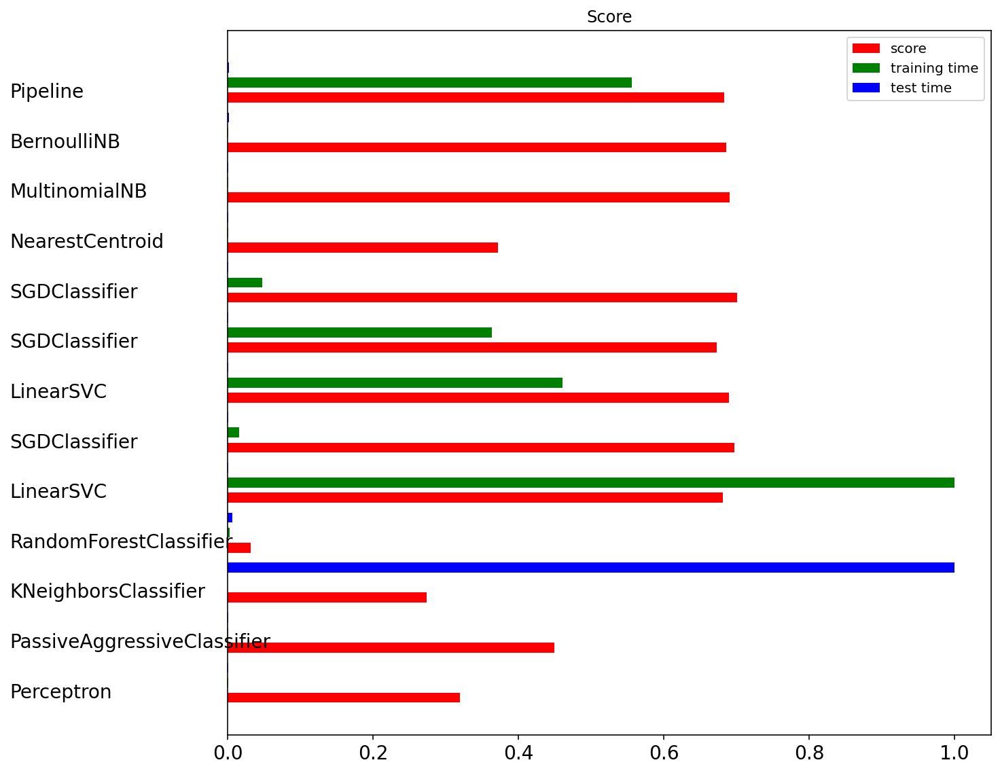

In [507]:
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics

# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

w = {3: np.round(1/1132), 4: np.round(1/12139), 5: np.round(1/20877), 6: np.round(1/1773) }

cvec = CountVectorizer(stop_words=updated_stopwords,
max_features=50000,
tokenizer=man_token_jie)





cvec.fit(X_train)
X_train = cvec.transform(X_train)
X_test = cvec.transform(X_test)


feature_names = np.array(cvec.get_feature_names())


def trim(s):
    """Trim string to fit on terminal (assuming 80-column display)"""
    return s if len(s) <= 80 else s[:77] + "..."

###############################################################################
# Benchmark classifiers


def benchmark(clf):
    print(('_' * 80))
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train, y_train)
    train_time = time() - t0
    print(("train time: %0.3fs" % train_time))

    t0 = time()
    pred = clf.predict(X_test)
    test_time = time() - t0
    print(("test time:  %0.3fs" % test_time))

    score = metrics.accuracy_score(y_test, pred)
    print(("accuracy:   %0.3f" % score))

    if hasattr(clf, 'coef_'):
        print(("dimensionality: %d" % clf.coef_.shape[1]))
        print(("density: %f" % density(clf.coef_)))
        try:
            if feature_names is not None:
                print("top 10 keywords per class:")
                for i, category in enumerate(set(y_train.values)):
                    top10 = np.argsort(clf.coef_[i])[-10:]
                    print((trim("%s: %s"
                                % (category, " ".join(feature_names[top10])))))
            print()
        except:
            pass
    print("classification report:")
    try:
        print((metrics.classification_report(y_test, pred,
                                         target_names=set(y_train.values))))
    except:
        pass
    try:
        print("confusion matrix:")
        print((metrics.confusion_matrix(y_test, pred)))

        print()
    except: 
        pass
    try:
        clf_descr = str(clf).split('(')[0]
    except:
        pass
    return clf_descr, score, train_time, test_time


results = []
for clf, name in ((Perceptron(max_iter=1000, tol=1e-3, class_weight=w, n_jobs=-1), "Perceptron"),(PassiveAggressiveClassifier(max_iter=1000, tol=1e-3, class_weight=w,n_jobs=-1), "Passive-Aggressive"),(KNeighborsClassifier(n_neighbors=10, n_jobs=-1), "kNN"),(RandomForestClassifier(n_estimators=100, class_weight=w, n_jobs=-1), "Random forest")):
    print(('=' * 80))
    print(name)
    results.append(benchmark(clf))

for penalty in ["l2", "l1"]:
    print(('=' * 80))
    print(("%s penalty" % penalty.upper()))
    # Train Liblinear model
    results.append(benchmark(LinearSVC(loss='squared_hinge', penalty=penalty,
                                            dual=False)))

    # Train SGD model
    results.append(benchmark(SGDClassifier(alpha=.0001,
                                           penalty=penalty,
                                           max_iter=1000,
                                           tol=1e-3)))

# Train SGD with Elastic Net penalty
print(('=' * 80))
print("Elastic-Net penalty")
results.append(benchmark(SGDClassifier(alpha=.0001,
                                       penalty="elasticnet",
                                       max_iter=1000,
                                       tol=1e-3)))

# Train NearestCentroid without threshold
print(('=' * 80))
print("NearestCentroid (aka Rocchio classifier)")
results.append(benchmark(NearestCentroid()))

# Train sparse Naive Bayes classifiers
print(('=' * 80))
print("Naive Bayes")
results.append(benchmark(MultinomialNB(alpha=.01)))
results.append(benchmark(BernoulliNB(alpha=.01)))

print(('=' * 80))
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
results.append(benchmark(Pipeline([
    ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False))),
    ('classification', LinearSVC(penalty="l2"))])))
# make some plots

indices = np.arange(len(results))

results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='r')
plt.barh(indices + .3, training_time, .2, label="training time", color='g')
plt.barh(indices + .6, test_time, .2, label="test time", color='b')
plt.yticks((), fontsize=14)
plt.xticks(fontsize=14)
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c, fontsize=14)

plt.show()

#### 9.4.2. Grid Search on BernouliNB
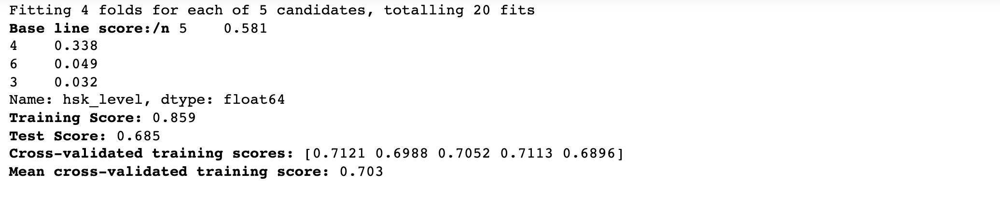
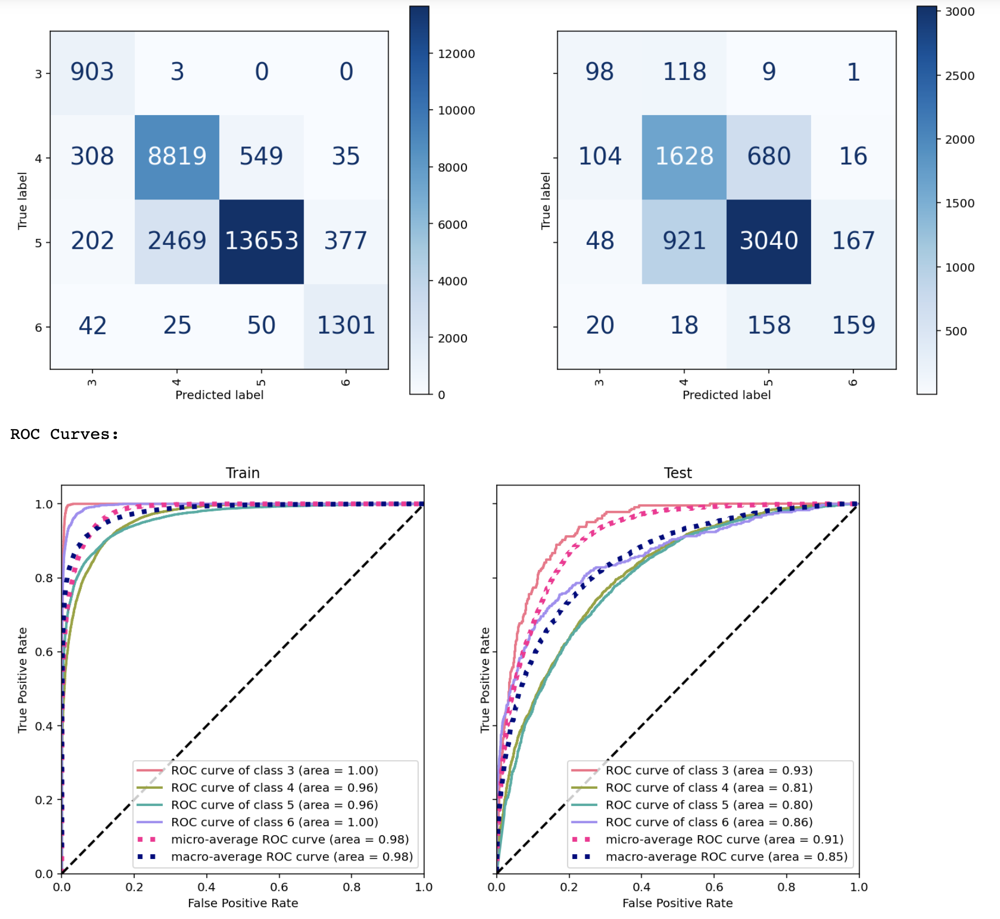

In [754]:
# import data file
df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

In [755]:
# Create X and y
df_HSK_classification = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()

X = df_HSK_classification[['lyrics','hsk_level'
]]

y = X.pop('hsk_level')
X = X['lyrics']


In [756]:
def hsk3_group(x):
    if x <= 3:
        return 3
    elif x == 4:
        return 4
    elif x == 5:
        return 5
    elif x == 6:
        return 6

In [757]:
y = y.apply(hsk3_group)

In [758]:
y.value_counts()

5    20877
4    12139
6     1773
3     1132
Name: hsk_level, dtype: int64

In [759]:
# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie)
cvec.fit(X)

# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

w = {3: np.round(1/1132), 4: np.round(1/12139), 5: np.round(1/20877), 6: np.round(1/1773) }

cvec = CountVectorizer(stop_words=updated_stopwords,
max_features=50000,
tokenizer=man_token_jie)





cvec.fit(X_train)
X_train = cvec.transform(X_train)
X_test = cvec.transform(X_test)


Fitting 4 folds for each of 5 candidates, totalling 20 fits
Base line score:/n 5    0.581
4    0.338
6    0.049
3    0.032
Name: hsk_level, dtype: float64
Training Score: 0.859
Test Score: 0.685
Cross-validated training scores: [0.7121 0.6988 0.7052 0.7113 0.6896]
Mean cross-validated training score: 0.703 

y_train classification report:
              precision    recall  f1-score   support

           3       0.62      1.00      0.76       906
           4       0.78      0.91      0.84      9711
           5       0.96      0.82      0.88     16701
           6       0.76      0.92      0.83      1418

    accuracy                           0.86     28736
   macro avg       0.78      0.91      0.83     28736
weighted avg       0.88      0.86      0.86     28736

y_test classification report:
              precision    recall  f1-score   support

           3       0.36      0.43      0.40       226
           4       0.61      0.67      0.64      2428
           5       0.78      0.

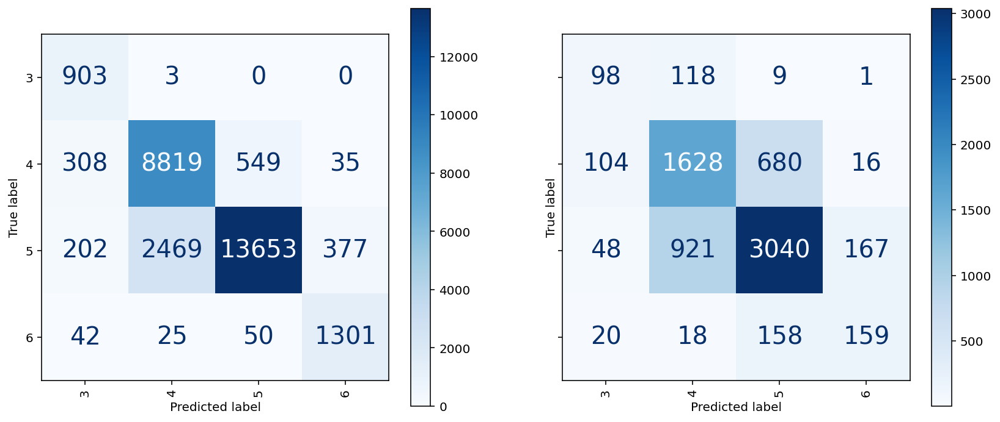

ROC Curves:


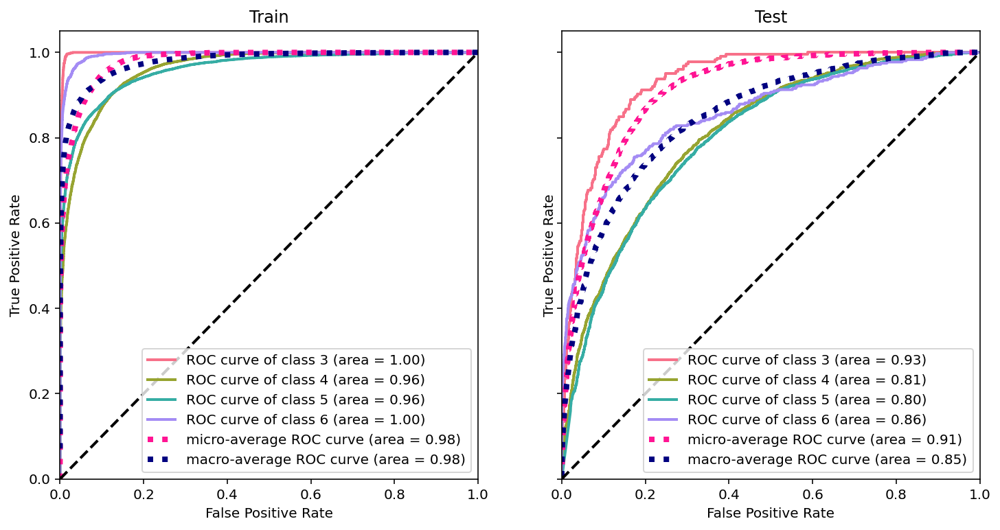

Precision Recall Curve:


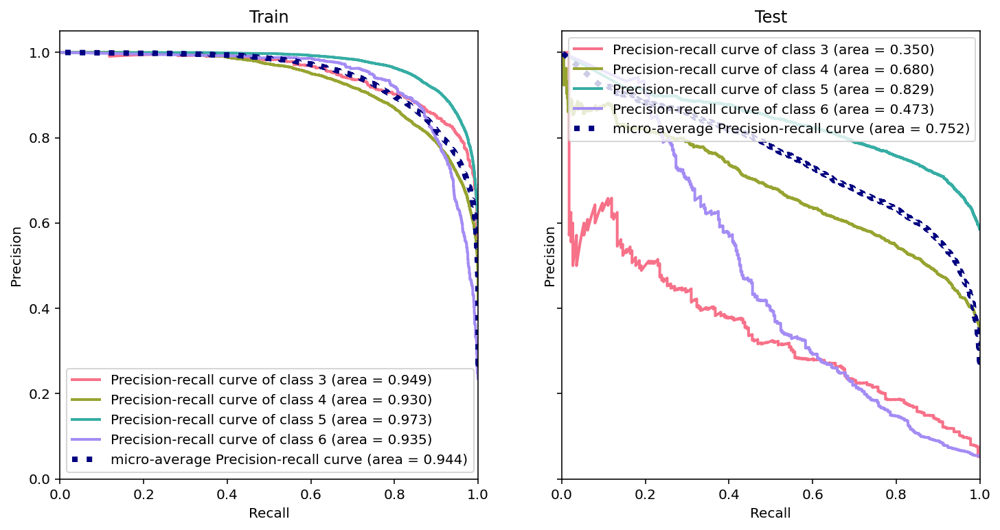

In [580]:
from sklearn.model_selection import GridSearchCV
# Get Train test split from sample data


params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0],
         }

skf = StratifiedKFold(n_splits=4)
skf.get_n_splits(X_train, y_train)

model = GridSearchCV(BernoulliNB(), param_grid=params, n_jobs=-1, cv=skf, verbose=5)

model.fit(X_train, y_train)


print(Bold + 'Base line score:/n' + Normal,
      np.round(y_train.value_counts(normalize=True), 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)


#### 9.4.4. TO RUN Neural Network modes: Multilayer Perceptron Feed-Forward network - activation: 'relu', Grid Search
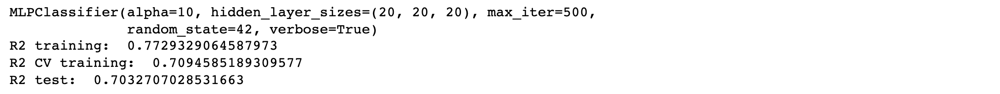

In [760]:
from sklearn.model_selection import GridSearchCV
# Get Train test split from sample data

params = {'solver':['adam'],
                'alpha':[10],
                'hidden_layer_sizes':[(20,20,20)],
                'activation':['relu'],
                'random_state':[42],
                'batch_size':['auto'],
                'max_iter':[500], 'verbose':[True],'warm_start':[False]}


skf = StratifiedKFold(n_splits=4)
skf.get_n_splits(X_train, y_train)



gs = GridSearchCV(MLPClassifier(), param_grid=params, cv=skf, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

model = gs.best_estimator_

Fitting 4 folds for each of 1 candidates, totalling 4 fits
Iteration 1, loss = 1.81194088
Iteration 2, loss = 1.27949234
Iteration 3, loss = 1.11469619
Iteration 4, loss = 1.05756040
Iteration 5, loss = 1.03557702
Iteration 6, loss = 1.02255827
Iteration 7, loss = 1.01600807
Iteration 8, loss = 1.01077285
Iteration 9, loss = 1.00526487
Iteration 10, loss = 1.00170086
Iteration 11, loss = 0.99674681
Iteration 12, loss = 0.99510047
Iteration 13, loss = 0.99100381
Iteration 14, loss = 0.98838621
Iteration 15, loss = 0.98602989
Iteration 16, loss = 0.98329116
Iteration 17, loss = 0.98010685
Iteration 18, loss = 0.97903095
Iteration 19, loss = 0.97830609
Iteration 20, loss = 0.97580157
Iteration 21, loss = 0.97328774
Iteration 22, loss = 0.97179357
Iteration 23, loss = 0.97001263
Iteration 24, loss = 0.96991397
Iteration 25, loss = 0.96715826
Iteration 26, loss = 0.96469610
Iteration 27, loss = 0.96346226
Iteration 28, loss = 0.96300918
Iteration 29, loss = 0.96043473
Iteration 30, loss = 0

Iteration 44, loss = 0.94558108
Iteration 45, loss = 0.94414210
Iteration 46, loss = 0.94342960
Iteration 47, loss = 0.94271115
Iteration 48, loss = 0.94281238
Iteration 49, loss = 0.94208799
Iteration 50, loss = 0.94255537
Iteration 51, loss = 0.94147257
Iteration 52, loss = 0.94064880
Iteration 53, loss = 0.94117626
Iteration 54, loss = 0.93999480
Iteration 55, loss = 0.93966000
Iteration 56, loss = 0.93901041
Iteration 57, loss = 0.93880618
Iteration 58, loss = 0.93840795
Iteration 59, loss = 0.93771382
Iteration 60, loss = 0.93815665
Iteration 61, loss = 0.93746840
Iteration 62, loss = 0.93600344
Iteration 63, loss = 0.93578555
Iteration 64, loss = 0.93551200
Iteration 65, loss = 0.93412268
Iteration 66, loss = 0.93455331
Iteration 67, loss = 0.93462790
Iteration 68, loss = 0.93291034
Iteration 69, loss = 0.93267396
Iteration 70, loss = 0.93251089
Iteration 71, loss = 0.93120060
Iteration 72, loss = 0.93172322
Iteration 73, loss = 0.93024313
Iteration 74, loss = 0.93033915
Iteratio

In [761]:
print(gs.best_estimator_)
print('R2 training: ', gs.score(X_train, y_train))
print('R2 CV training: ', gs.best_score_)
print('R2 test: ', gs.score(X_test, y_test))

MLPClassifier(alpha=10, hidden_layer_sizes=(20, 20, 20), max_iter=500,
              random_state=42, verbose=True)
R2 training:  0.7729329064587973
R2 CV training:  0.7094585189309577
R2 test:  0.7032707028531663


### 9.3 Classification of Genre Based on Lyrics
#### Summary

Is it possible to classify genres based on Spotify lyrics?

I ran a train of classification models to try and identify the 5 largest genres based on song lyrics: (i) Cantopop (27%), (ii) Classic Mandopop (20%), (iii) Taiwan Pop (13%), and (iv) Mandopop (11%). To handle class imbalance I applied inverse class weights which proved to be effective. I used JieBa to tokenize the lyrics and TfidfVectorizer. I experimented with using updated stop words but the impact was neglible. The best score was from the BernoulliNB with a test score of 62.4% vs. a base lin of 36%. This was also one of the quickest models to run. 

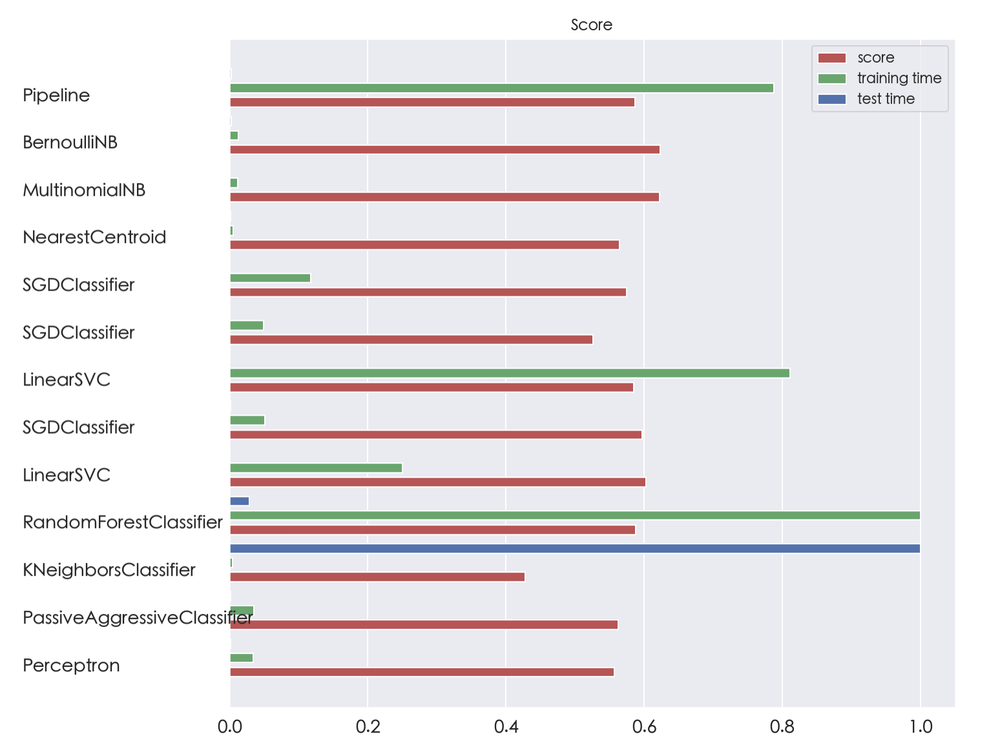


#### 9.3.1. Four Genres, TfidfVectorizer, Stop Words, Logistic Regression

Start off with top 5 genres:



In [275]:
df_genres = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()

In [276]:
df_genres.Genre2.value_counts(normalize=True)

cantopop             0.274605
classic mandopop     0.200139
taiwan pop           0.133954
mandopop             0.107493
chinese indie        0.035930
                       ...   
kayokyoku            0.000033
anime rock           0.000033
blues rock           0.000033
taiwan electronic    0.000033
xinyao               0.000033
Name: Genre2, Length: 64, dtype: float64

In [277]:
X = df_genres.lyrics[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]
y = df_genres.Genre2[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]

In [278]:
X.shape, y.shape

((22796,), (22796,))

In [285]:
X.head()

0    英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都...
1    双截棍词曲岩烧店的烟味弥漫店里面的妈妈桑教拳脚武术的老板练铁沙掌硬底子功夫最擅长还会金钟罩铁...
2    开不了口词曲才离开没多久就开始担心今天的你过得好不好整个画面是你嘴嘟嘟那可爱的模样还有在你身...
3    床边故事词曲从前从前有只猫头鹰它站在屋顶屋顶后面一遍森林森林很安静安静的钢琴在大厅阁楼里仔细...
4    夜曲夜曲词曲窃爱词曲一群嗜血的蚂蚁被腐肉所吸引我面无表情看孤独的风景失去你失去你当鸽子不再象...
Name: lyrics, dtype: object

In [287]:
type(X)

pandas.core.series.Series

In [286]:
y.head()

0    mandopop
1    mandopop
2    mandopop
3    mandopop
4    mandopop
Name: Genre2, dtype: object

In [279]:
y.value_counts()

cantopop            8323
classic mandopop    6066
taiwan pop          4060
mandopop            3258
chinese indie       1089
Name: Genre2, dtype: int64

In [280]:

# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

In [281]:
# Create a customer tokenizer using JieBa to account for Mandarin
def man_token_jie(x):
    return jieba.lcut(x)

In [282]:
y_train.value_counts(normalize=True)

cantopop            0.365102
classic mandopop    0.266122
taiwan pop          0.178109
mandopop            0.142904
chinese indie       0.047763
Name: Genre2, dtype: float64

In [283]:
w = {'cantopop': 1/0.36, 'classic mandopop': 1/0.27,'taiwan pop': 1/0.18, 'mandopop': 1/0.14,'chinese indie': 1/0.05  }
model = make_pipeline(TfidfVectorizer(stop_words=stopwords(["zh"]),
                                      # sublinear_tf=True,
                                      max_df=0.3,
                                      max_features=1000,
                                      tokenizer=man_token_jie,
                                      norm='l2'),
                      LogisticRegression(solver='lbfgs', multi_class='ovr', class_weight=w),
                      )



model.fit(X_train, y_train)

Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(max_df=0.3, max_features=1000,
                                 stop_words={'、', '。', '〈', '〉', '《', '》', '一',
                                             '一个', '一些', '一何', '一切', '一则',
                                             '一方面', '一旦', '一来', '一样', '一种',
                                             '一般', '一转眼', '七', '万一', '三', '上',
                                             '上下', '下', '不', '不仅', '不但', '不光',
                                             '不单', ...},
                                 tokenizer=<function man_token_jie at 0x7fdb0b4cc940>)),
                ('logisticregression',
                 LogisticRegression(class_weight={'cantopop': 2.7777777777777777,
                                                  'chinese indie': 20.0,
                                                  'classic mandopop': 3.7037037037037033,
                                                  'mandopop': 7.142857142857142,


In [284]:
Bold = '\033[1m'
Normal = '\033[0m'

skf = StratifiedKFold(n_splits=5)
skf.get_n_splits(X_train, y_train)
lr_scores = cross_val_score(model, X_train, y_train, cv=skf, n_jobs=6)

print(Bold + 'Base line score:' + Normal,
      np.round(y_train.value_counts(normalize=True)[0], 3))
print(Bold + 'Training Score:' + Normal, np.round(model.score(X_train, y_train),
                                                  3))
print(Bold + 'Test Score:' + Normal, np.round(model.score(X_test, y_test), 3))
print(Bold + "Cross-validated training scores:" + Normal,
      np.round(lr_scores, 4))
print(Bold + "Mean cross-validated training score:" + Normal,
      np.round(lr_scores.mean(), 3), '\n')

Building prefix dict from the default dictionary ...
Building prefix dict from the default dictionary ...
Building prefix dict from the default dictionary ...
Building prefix dict from the default dictionary ...
Building prefix dict from the default dictionary ...
Dumping model to file cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Dumping model to file cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Dumping model to file cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Dumping model to file cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Dumping model to file cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Loading model cost 0.892 seconds.
Prefix dict has been built successfully.
Loading model cost 0.896 seconds.
Prefix dict has been built successfully.
Loading model cost 0.895 seconds.
Prefix dict has been built successfully.
Loading model cost 0.902 seconds.
Prefix dict has been built succ

Base line score: 0.365


/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['借傥', '兼', '前', '唷', '啪', '啷', '喔', '天', '始', '漫', '然', '特', '竟', '莫', '见', '设', '达'] not in stop_words.
  warnings.warn(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/stuart/Desktop/Spoty-Linguist-Project/env/lib/python3.8/site-packages/sklearn/feature_ex

KeyboardInterrupt: 

y_train classification report:
                  precision    recall  f1-score   support

        cantopop       0.86      0.69      0.77      6658
   chinese indie       0.22      0.60      0.32       871
classic mandopop       0.65      0.55      0.59      4853
        mandopop       0.43      0.51      0.47      2606
      taiwan pop       0.51      0.52      0.51      3248

        accuracy                           0.59     18236
       macro avg       0.53      0.57      0.53     18236
    weighted avg       0.65      0.59      0.61     18236

y_test classification report:
                  precision    recall  f1-score   support

        cantopop       0.80      0.65      0.72      1665
   chinese indie       0.12      0.31      0.18       218
classic mandopop       0.55      0.49      0.51      1213
        mandopop       0.31      0.38      0.34       652
      taiwan pop       0.41      0.39      0.40       812

        accuracy                           0.50      4560
      

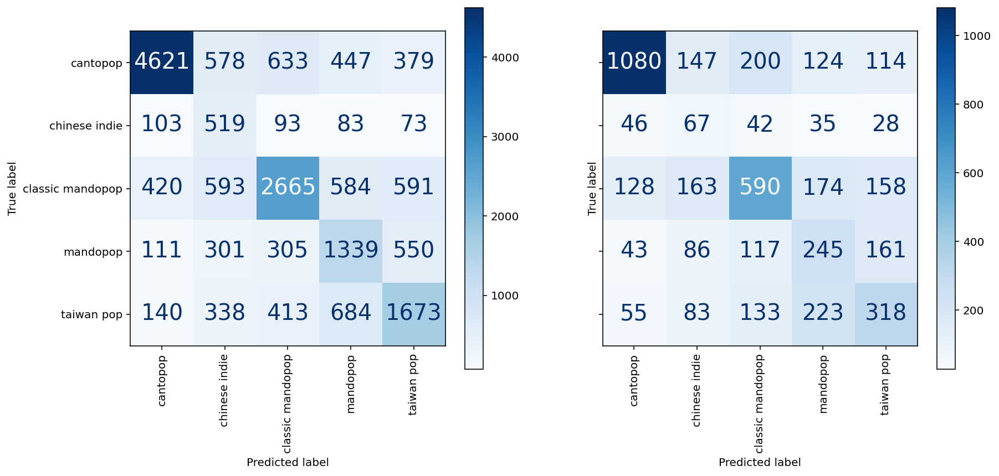

ROC Curves:


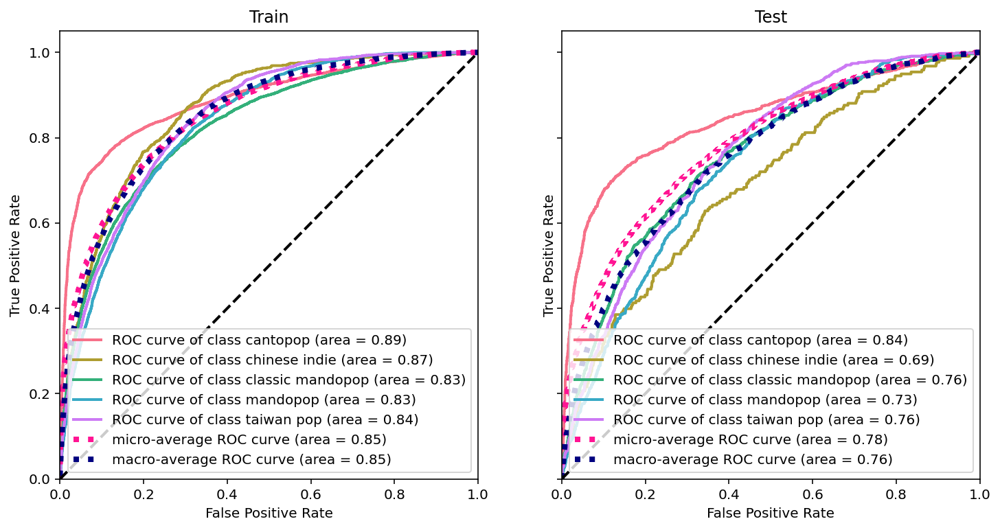

Precision Recall Curve:


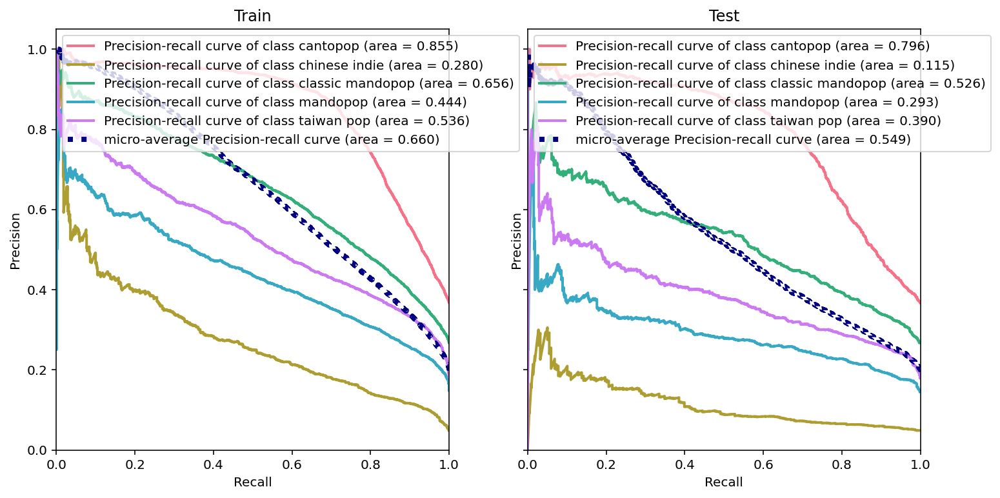

In [40]:
logist_plots(model,
             X_train=X_train,
             y_train=y_train,
             X_test=X_test,
             y_test=y_test)

#### 9.3.2. Four Genres, TfidfVectorizer, Stop Words, All Models

In [360]:
# Import Jieba to tokenize lyrics
import jieba.posseg as pseg
import jieba

In [361]:
# Create a customer tokenizer using JieBa to account for Mandarin
def man_token_jie(x):
    return jieba.lcut(x)

In [363]:
lyrics = df_tracks_master_clean3_lyrics_genre_hsk_v2.lyrics

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie)
cvec.fit(lyrics)
cvec.get_feature_names()[:5]

Building prefix dict from the default dictionary ...
Dumping model to file cache /var/folders/87/4nvcbwyx25s9fz86v2nq_xmw0000gq/T/jieba.cache
Loading model cost 0.732 seconds.
Prefix dict has been built successfully.


['一', '一一', '一一二', '一一记', '一丁']

Perceptron
________________________________________________________________________________
Training: 
Perceptron(class_weight={'cantopop': 2.78, 'chinese indie': 20.0,
                         'classic mandopop': 4.0, 'mandopop': 7.0,
                         'taiwan pop': 6.0},
           n_jobs=-1)
train time: 0.122s
test time:  0.003s
accuracy:   0.554
dimensionality: 50000
density: 0.815148
top 10 keywords per class:
cantopop: 一片空白 风花雪月 终止 借着 谭 脑海中 一双眼 雨里 令 监制
taiwan pop: 承载 沉默不语 合音 真理 随心所欲 难以形容 出走 飘来飘去 曰 工程
classic mandopop: 向北飞 心田 山盟海誓 流成 成河 瓢泼 变黑 统筹 落寞 不由自主
mandopop: 装乖 受伤害 最大 早点 一号 不管怎样 男当 日暮 之上 共看
chinese indie: 心若倦 纠结 寓言 放晴 所迷 前方 悬着 胡闹 一步步 大提琴

classification report:
                  precision    recall  f1-score   support

        cantopop       0.74      0.72      0.73      1665
      taiwan pop       0.27      0.27      0.27       218
classic mandopop       0.56      0.54      0.55      1213
        mandopop       0.34      0.40      0.37       652
   chinese indie      

train time: 0.262s
test time:  0.002s
accuracy:   0.527
dimensionality: 50000
density: 0.007596
top 10 keywords per class:
cantopop: 当天 只得 未 极 没法 几多 便 监制 令 似
taiwan pop: 岛愿 岛有 岩 岩浆 岗上 工程 阳光 两天 归去来兮 曰
classic mandopop: 伊 小河 山盟海誓 相逢 相思 昨夜 心头 涙 阮 真情
mandopop: 整个 双截棍 亲爱 勇敢 杜杜杜 拆掉 一周年 三十而立 痛痛 不管怎样
chinese indie: 评评理 那安 师 录制 迎战 与狼共舞 回不来 阿嬷 天诛地灭 编写

classification report:
                  precision    recall  f1-score   support

        cantopop       0.62      0.81      0.71      1665
      taiwan pop       0.50      0.03      0.06       218
classic mandopop       0.47      0.67      0.55      1213
        mandopop       0.30      0.15      0.20       652
   chinese indie       0.44      0.17      0.24       812

        accuracy                           0.53      4560
       macro avg       0.47      0.37      0.35      4560
    weighted avg       0.50      0.53      0.48      4560

confusion matrix:
[[1354    1  244   37   29]
 [  96    7   92   17    6]
 [ 295    3  807   58   50]
 [ 19

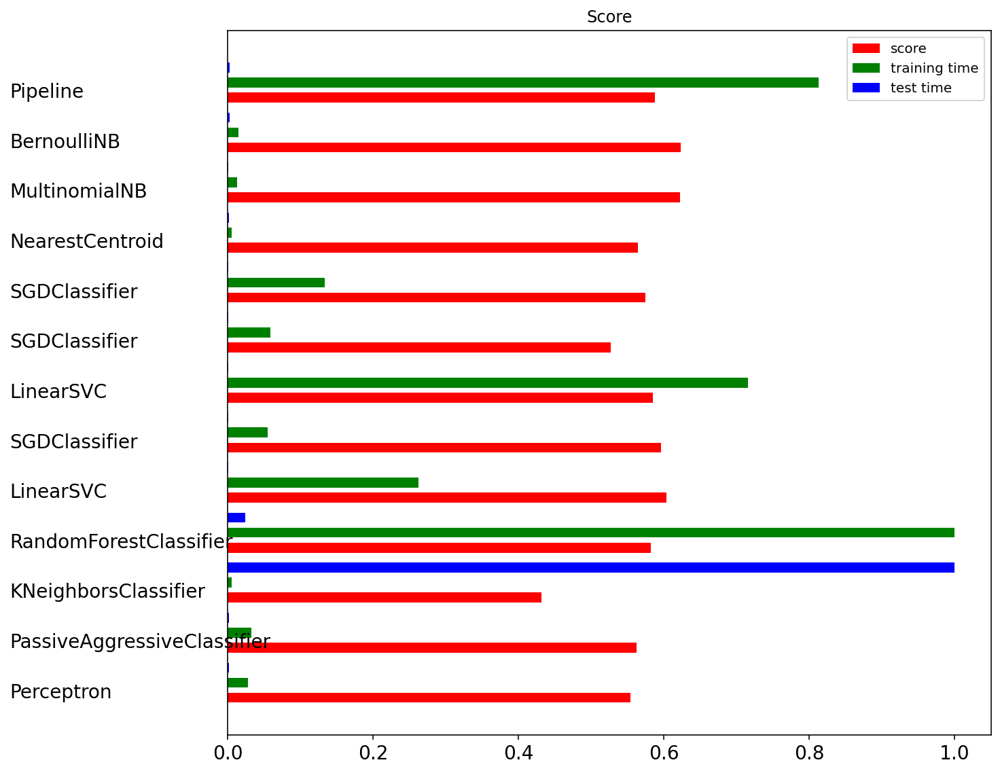

In [47]:
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics

X = df_genres.lyrics[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]
y = df_genres.Genre2[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]

# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

w = {'cantopop': np.round(1/0.36,2), 'classic mandopop': np.round(1/0.27),'taiwan pop': np.round(1/0.18), 'mandopop': np.round(1/0.14),'chinese indie': np.round(1/0.05)  }

tvec = TfidfVectorizer(stop_words=stopwords(["zh"]),
                                      max_df=0.3,
                                      max_features=50000,
                                      tokenizer=man_token_jie,
                                      norm='l2')




tvec.fit(X_train)
X_train = tvec.transform(X_train)
X_test = tvec.transform(X_test)


feature_names = np.array(tvec.get_feature_names())


def trim(s):
    """Trim string to fit on terminal (assuming 80-column display)"""
    return s if len(s) <= 80 else s[:77] + "..."

###############################################################################
# Benchmark classifiers


def benchmark(clf):
    print(('_' * 80))
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train, y_train)
    train_time = time() - t0
    print(("train time: %0.3fs" % train_time))

    t0 = time()
    pred = clf.predict(X_test)
    test_time = time() - t0
    print(("test time:  %0.3fs" % test_time))

    score = metrics.accuracy_score(y_test, pred)
    print(("accuracy:   %0.3f" % score))

    if hasattr(clf, 'coef_'):
        print(("dimensionality: %d" % clf.coef_.shape[1]))
        print(("density: %f" % density(clf.coef_)))

        if feature_names is not None:
            print("top 10 keywords per class:")
            for i, category in enumerate(set(y_train.values)):
                top10 = np.argsort(clf.coef_[i])[-10:]
                print((trim("%s: %s"
                            % (category, " ".join(feature_names[top10])))))
        print()

    print("classification report:")
    print((metrics.classification_report(y_test, pred,
                                         target_names=set(y_train.values))))

    print("confusion matrix:")
    print((metrics.confusion_matrix(y_test, pred)))

    print()
    clf_descr = str(clf).split('(')[0]
    return clf_descr, score, train_time, test_time


results = []
for clf, name in (
#         (RidgeClassifier(tol=1e-2, solver="sag", class_weight=w), "Ridge Classifier"),
        (Perceptron(max_iter=1000, tol=1e-3, class_weight=w, n_jobs=-1), "Perceptron"),
        (PassiveAggressiveClassifier(max_iter=1000, tol=1e-3, class_weight=w,n_jobs=-1), "Passive-Aggressive"),
        (KNeighborsClassifier(n_neighbors=10, n_jobs=-1), "kNN"),
        (RandomForestClassifier(n_estimators=100, class_weight=w, n_jobs=-1), "Random forest")):
    print(('=' * 80))
    print(name)
    results.append(benchmark(clf))

for penalty in ["l2", "l1"]:
    print(('=' * 80))
    print(("%s penalty" % penalty.upper()))
    # Train Liblinear model
    results.append(benchmark(LinearSVC(loss='squared_hinge', penalty=penalty,
                                            dual=False)))

    # Train SGD model
    results.append(benchmark(SGDClassifier(alpha=.0001,
                                           penalty=penalty,
                                           max_iter=1000,
                                           tol=1e-3)))

# Train SGD with Elastic Net penalty
print(('=' * 80))
print("Elastic-Net penalty")
results.append(benchmark(SGDClassifier(alpha=.0001,
                                       penalty="elasticnet",
                                       max_iter=1000,
                                       tol=1e-3)))

# Train NearestCentroid without threshold
print(('=' * 80))
print("NearestCentroid (aka Rocchio classifier)")
results.append(benchmark(NearestCentroid()))

# Train sparse Naive Bayes classifiers
print(('=' * 80))
print("Naive Bayes")
results.append(benchmark(MultinomialNB(alpha=.01)))
results.append(benchmark(BernoulliNB(alpha=.01)))

print(('=' * 80))
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
results.append(benchmark(Pipeline([
    ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False))),
    ('classification', LinearSVC(penalty="l2"))])))
# make some plots

indices = np.arange(len(results))

results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='r')
plt.barh(indices + .3, training_time, .2, label="training time", color='g')
plt.barh(indices + .6, test_time, .2, label="test time", color='b')
plt.yticks((), fontsize=14)
plt.xticks(fontsize=14)
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c, fontsize=14)

plt.show()

#### 9.3.3. Four Genres, TfidfVectorizer, Stop Words Updated, All Models

In [44]:
# Import Jieba to tokenize lyrics
import jieba.posseg as pseg
import jieba

In [45]:
# Create a customer tokenizer using JieBa to account for Mandarin
def man_token_jie(x):
    return jieba.lcut(x)

In [46]:
lyrics = df_tracks_master_clean3_lyrics_genre_hsk_v2.lyrics

# Tokenize lyrics
cvec = CountVectorizer(tokenizer=man_token_jie)
cvec.fit(lyrics)
cvec.get_feature_names()[:5]

['一', '一一', '一一二', '一一记', '一丁']

Perceptron
________________________________________________________________________________
Training: 
Perceptron(class_weight={'cantopop': 2.78, 'chinese indie': 20.0,
                         'classic mandopop': 4.0, 'mandopop': 7.0,
                         'taiwan pop': 6.0},
           n_jobs=-1)
train time: 0.184s
test time:  0.005s
accuracy:   0.557
dimensionality: 50000
density: 0.815796
top 10 keywords per class:
chinese indie: 路过 俩 最快 假想 置身事外 借着 仿似 令 雨里 监制
classic mandopop: 悄然 大米 出走 沉默不语 老鼠 曰 合音 鞋子 飘来飘去 工程
mandopop: 表达 心田 成河 恰恰 泪珠 捉迷藏 统筹 多心 不由自主 落寞
taiwan pop: 可救 无关 理想 感伤 男当 装乖 不管怎样 最大 变形 共看
cantopop: 前方 相框 置 惊天动地 得来不易 寓言 搜寻 主 下定决心 悬着

classification report:
                  precision    recall  f1-score   support

   chinese indie       0.74      0.72      0.73      1665
classic mandopop       0.28      0.29      0.29       218
        mandopop       0.56      0.57      0.57      1213
      taiwan pop       0.35      0.37      0.36       652
        cantopop       0.43     

train time: 0.265s
test time:  0.002s
accuracy:   0.526
dimensionality: 50000
density: 0.007728
top 10 keywords per class:
chinese indie: 仿似 当天 未 极 几多 没法 监制 便 令 似
classic mandopop: 已醒 已重 已闷 已难 已静 已过 龟壳 雨下个 主义 曰
mandopop: 姑娘 相逢 涙 相思 昨夜 心田 蔓莉 阮 心头 真情
taiwan pop: 桥边 罗斯福 买单 后知后觉 天黑黑 没差 卢广仲 欧拉 痛痛 气球
cantopop: 拉链 玛丽 编写 假假 录制 一下下 满洲里 已读 回不来 保护色

classification report:
                  precision    recall  f1-score   support

   chinese indie       0.61      0.82      0.70      1665
classic mandopop       0.15      0.04      0.06       218
        mandopop       0.48      0.65      0.56      1213
      taiwan pop       0.30      0.17      0.22       652
        cantopop       0.48      0.14      0.21       812

        accuracy                           0.53      4560
       macro avg       0.40      0.36      0.35      4560
    weighted avg       0.49      0.53      0.48      4560

confusion matrix:
[[1371    3  232   40   19]
 [  96    8   85   24    5]
 [ 307   14  794   66   32]
 [ 218   

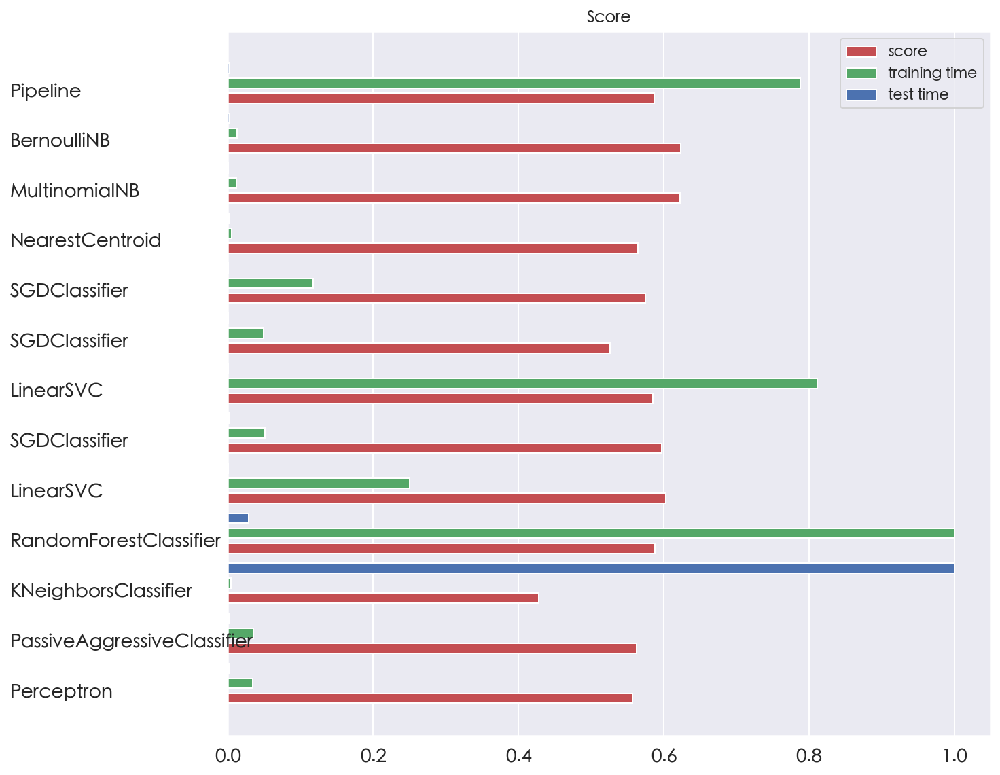

In [68]:
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics

X = df_genres.lyrics[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]
y = df_genres.Genre2[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]

# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

w = {'cantopop': np.round(1/0.36,2), 'classic mandopop': np.round(1/0.27),'taiwan pop': np.round(1/0.18), 'mandopop': np.round(1/0.14),'chinese indie': np.round(1/0.05)  }

tvec = TfidfVectorizer(stop_words=updated_stopwords,
max_df=0.3,
max_features=50000,
tokenizer=man_token_jie, norm='l2')





tvec.fit(X_train)
X_train = tvec.transform(X_train)
X_test = tvec.transform(X_test)


feature_names = np.array(tvec.get_feature_names())


def trim(s):
    """Trim string to fit on terminal (assuming 80-column display)"""
    return s if len(s) <= 80 else s[:77] + "..."

###############################################################################
# Benchmark classifiers


def benchmark(clf):
    print(('_' * 80))
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train, y_train)
    train_time = time() - t0
    print(("train time: %0.3fs" % train_time))

    t0 = time()
    pred = clf.predict(X_test)
    test_time = time() - t0
    print(("test time:  %0.3fs" % test_time))

    score = metrics.accuracy_score(y_test, pred)
    print(("accuracy:   %0.3f" % score))

    if hasattr(clf, 'coef_'):
        print(("dimensionality: %d" % clf.coef_.shape[1]))
        print(("density: %f" % density(clf.coef_)))

        if feature_names is not None:
            print("top 10 keywords per class:")
            for i, category in enumerate(set(y_train.values)):
                top10 = np.argsort(clf.coef_[i])[-10:]
                print((trim("%s: %s"
                            % (category, " ".join(feature_names[top10])))))
        print()

    print("classification report:")
    print((metrics.classification_report(y_test, pred,
                                         target_names=set(y_train.values))))

    print("confusion matrix:")
    print((metrics.confusion_matrix(y_test, pred)))

    print()
    clf_descr = str(clf).split('(')[0]
    return clf_descr, score, train_time, test_time


results = []
for clf, name in ((Perceptron(max_iter=1000, tol=1e-3, class_weight=w, n_jobs=-1), "Perceptron"),(PassiveAggressiveClassifier(max_iter=1000, tol=1e-3, class_weight=w,n_jobs=-1), "Passive-Aggressive"),(KNeighborsClassifier(n_neighbors=10, n_jobs=-1), "kNN"),(RandomForestClassifier(n_estimators=100, class_weight=w, n_jobs=-1), "Random forest")):
    print(('=' * 80))
    print(name)
    results.append(benchmark(clf))

for penalty in ["l2", "l1"]:
    print(('=' * 80))
    print(("%s penalty" % penalty.upper()))
    # Train Liblinear model
    results.append(benchmark(LinearSVC(loss='squared_hinge', penalty=penalty,
                                            dual=False)))

    # Train SGD model
    results.append(benchmark(SGDClassifier(alpha=.0001,
                                           penalty=penalty,
                                           max_iter=1000,
                                           tol=1e-3)))

# Train SGD with Elastic Net penalty
print(('=' * 80))
print("Elastic-Net penalty")
results.append(benchmark(SGDClassifier(alpha=.0001,
                                       penalty="elasticnet",
                                       max_iter=1000,
                                       tol=1e-3)))

# Train NearestCentroid without threshold
print(('=' * 80))
print("NearestCentroid (aka Rocchio classifier)")
results.append(benchmark(NearestCentroid()))

# Train sparse Naive Bayes classifiers
print(('=' * 80))
print("Naive Bayes")
results.append(benchmark(MultinomialNB(alpha=.01)))
results.append(benchmark(BernoulliNB(alpha=.01)))

print(('=' * 80))
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
results.append(benchmark(Pipeline([
    ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False))),
    ('classification', LinearSVC(penalty="l2"))])))
# make some plots

indices = np.arange(len(results))

results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='r')
plt.barh(indices + .3, training_time, .2, label="training time", color='g')
plt.barh(indices + .6, test_time, .2, label="test time", color='b')
plt.yticks((), fontsize=14)
plt.xticks(fontsize=14)
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c, fontsize=14)

plt.show()

#### 9.3.4. Four Genres, TfidfVectorizer, Stop Words Updated (Again), All Models

#### 9.3.5. Word Vectorizer Models

In [21]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors

# Facebook's Chinese word vectors.
fb_model = KeyedVectors.load_word2vec_format('/Users/stuart/Desktop/Spoty-Linguist-Project/wiki.zh/wiki.zh.vec')

In [38]:
fb_model.most_similar(positive=[u'高'])

[('低', 0.9805826544761658),
 ('，', 0.9782601594924927),
 ('和', 0.9773808121681213),
 ('也', 0.9772681593894958),
 ('的', 0.9756231904029846),
 ('。', 0.9755971431732178),
 ('以', 0.9750012159347534),
 ('而', 0.9744661450386047),
 ('有', 0.9743781685829163),
 ('其', 0.9742969274520874)]

In [22]:
# Import Jieba to tokenize lyrics
import jieba.posseg as pseg
import jieba

In [23]:
# Create a customer tokenizer using JieBa to account for Mandarin
def man_token_jie(x):
    return jieba.lcut(x)

In [39]:
import time
#Import the DecisionTreeeClassifier
from sklearn.tree import DecisionTreeClassifier
# Load from the filename
word2vec_df = fb_model
#Initialize the model
clf_decision_word2vec = DecisionTreeClassifier()

start_time = time.time()
# Fit the model
clf_decision_word2vec.fit(word2vec_df, y_train)
print("Time taken to fit the model with word2vec vectors: " + str(time.time() - start_time))

ValueError: setting an array element with a sequence.

Perceptron
________________________________________________________________________________
Training: 
Perceptron(class_weight={'cantopop': 2.78, 'chinese indie': 20.0,
                         'classic mandopop': 4.0, 'mandopop': 7.0,
                         'taiwan pop': 6.0},
           n_jobs=-1)
train time: 0.123s
test time:  0.003s
accuracy:   0.555
dimensionality: 50000
density: 0.814836
top 10 keywords per class:
chinese indie: 路过 仿似 麻醉 俩 巡演 若伤 有生之年 令 雨里 监制
classic mandopop: 公司 无菇 真理 向往 工程 难以形容 曰 沉默不语 飘来飘去 两天
mandopop: 瓢泼 一大堆 尽全力 落寞 目屎 泪珠 成河 装不出 多心 不由自主
taiwan pop: 安置 缓慢 不凡 最大 品味 采取行动 自然而然 尝 录音 不管怎样
cantopop: 秃头 下定决心 穿越 落笔 丢失 布鲁士 前方 悬着 得来不易 心若倦

classification report:
                  precision    recall  f1-score   support

   chinese indie       0.75      0.71      0.73      1665
classic mandopop       0.29      0.31      0.30       218
        mandopop       0.55      0.55      0.55      1213
      taiwan pop       0.34      0.36      0.35       652
        cantopop       

train time: 0.235s
test time:  0.002s
accuracy:   0.533
dimensionality: 50000
density: 0.008032
top 10 keywords per class:
chinese indie: 别要 只得 监制 当天 极 没法 几多 便 令 似
classic mandopop: 对望 对焦 对照 对爱施 对手戏 需留 岑林 蘑菇 归一 曰
mandopop: 亲像 今夜 相逢 涙 阮 目屎 相思 昨夜 心头 真情
taiwan pop: 李硕 退一步 编辑 卡拉 击杀 梦想家 立地成佛 黑吃黑 公公 卢广仲
cantopop: 告白 洪申豪 山楂树 录制 旅客 坏掉 窒爱 师 抠 不屑

classification report:
                  precision    recall  f1-score   support

   chinese indie       0.62      0.82      0.71      1665
classic mandopop       0.13      0.05      0.07       218
        mandopop       0.49      0.65      0.56      1213
      taiwan pop       0.36      0.01      0.02       652
        cantopop       0.41      0.33      0.37       812

        accuracy                           0.53      4560
       macro avg       0.40      0.37      0.34      4560
    weighted avg       0.49      0.53      0.48      4560

confusion matrix:
[[1363   10  225    3   64]
 [ 100   10   86    2   20]
 [ 302   17  783    3  108]
 [ 202   2

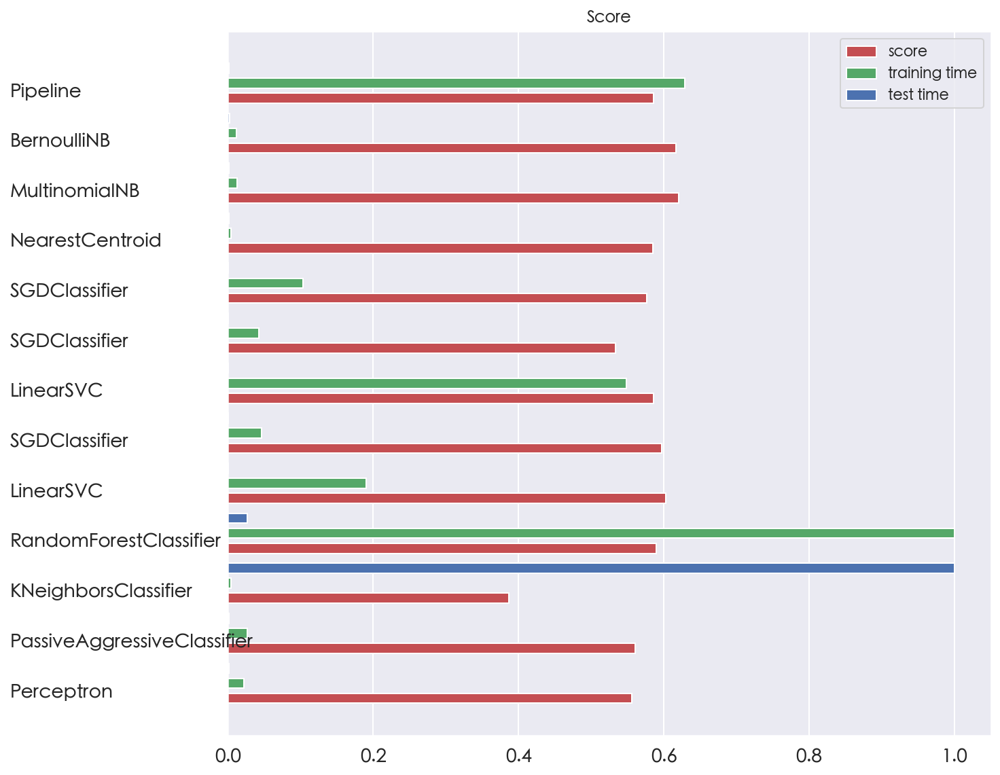

In [72]:
from time import time
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics

X = df_genres.lyrics[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]
y = df_genres.Genre2[(df_genres.Genre2 == 'cantopop') | (df_genres.Genre2 == 'classic mandopop') | (df_genres.Genre2 == 'taiwan pop') | (df_genres.Genre2 == 'mandopop') | (df_genres.Genre2 == 'chinese indie')]

# Get Train test split from sample data
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    stratify=y,
                                                    test_size=0.2,
                                                    random_state=1)

w = {'cantopop': np.round(1/0.36,2), 'classic mandopop': np.round(1/0.27),'taiwan pop': np.round(1/0.18), 'mandopop': np.round(1/0.14),'chinese indie': np.round(1/0.05)  }

tvec = TfidfVectorizer(stop_words=updated_stopwords_2,
max_df=0.3,
max_features=50000,
tokenizer=man_token_jie, norm='l2')





tvec.fit(X_train)
X_train = tvec.transform(X_train)
X_test = tvec.transform(X_test)


feature_names = np.array(tvec.get_feature_names())


def trim(s):
    """Trim string to fit on terminal (assuming 80-column display)"""
    return s if len(s) <= 80 else s[:77] + "..."

###############################################################################
# Benchmark classifiers


def benchmark(clf):
    print(('_' * 80))
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train, y_train)
    train_time = time() - t0
    print(("train time: %0.3fs" % train_time))

    t0 = time()
    pred = clf.predict(X_test)
    test_time = time() - t0
    print(("test time:  %0.3fs" % test_time))

    score = metrics.accuracy_score(y_test, pred)
    print(("accuracy:   %0.3f" % score))

    if hasattr(clf, 'coef_'):
        print(("dimensionality: %d" % clf.coef_.shape[1]))
        print(("density: %f" % density(clf.coef_)))

        if feature_names is not None:
            print("top 10 keywords per class:")
            for i, category in enumerate(set(y_train.values)):
                top10 = np.argsort(clf.coef_[i])[-10:]
                print((trim("%s: %s"
                            % (category, " ".join(feature_names[top10])))))
        print()

    print("classification report:")
    print((metrics.classification_report(y_test, pred,
                                         target_names=set(y_train.values))))

    print("confusion matrix:")
    print((metrics.confusion_matrix(y_test, pred)))

    print()
    clf_descr = str(clf).split('(')[0]
    return clf_descr, score, train_time, test_time


results = []
for clf, name in ((Perceptron(max_iter=1000, tol=1e-3, class_weight=w, n_jobs=-1), "Perceptron"),(PassiveAggressiveClassifier(max_iter=1000, tol=1e-3, class_weight=w,n_jobs=-1), "Passive-Aggressive"),(KNeighborsClassifier(n_neighbors=10, n_jobs=-1), "kNN"),(RandomForestClassifier(n_estimators=100, class_weight=w, n_jobs=-1), "Random forest")):
    print(('=' * 80))
    print(name)
    results.append(benchmark(clf))

for penalty in ["l2", "l1"]:
    print(('=' * 80))
    print(("%s penalty" % penalty.upper()))
    # Train Liblinear model
    results.append(benchmark(LinearSVC(loss='squared_hinge', penalty=penalty,
                                            dual=False)))

    # Train SGD model
    results.append(benchmark(SGDClassifier(alpha=.0001,
                                           penalty=penalty,
                                           max_iter=1000,
                                           tol=1e-3)))

# Train SGD with Elastic Net penalty
print(('=' * 80))
print("Elastic-Net penalty")
results.append(benchmark(SGDClassifier(alpha=.0001,
                                       penalty="elasticnet",
                                       max_iter=1000,
                                       tol=1e-3)))

# Train NearestCentroid without threshold
print(('=' * 80))
print("NearestCentroid (aka Rocchio classifier)")
results.append(benchmark(NearestCentroid()))

# Train sparse Naive Bayes classifiers
print(('=' * 80))
print("Naive Bayes")
results.append(benchmark(MultinomialNB(alpha=.01)))
results.append(benchmark(BernoulliNB(alpha=.01)))

print(('=' * 80))
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
results.append(benchmark(Pipeline([
    ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False))),
    ('classification', LinearSVC(penalty="l2"))])))
# make some plots

indices = np.arange(len(results))

results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='r')
plt.barh(indices + .3, training_time, .2, label="training time", color='g')
plt.barh(indices + .6, test_time, .2, label="test time", color='b')
plt.yticks((), fontsize=14)
plt.xticks(fontsize=14)
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c, fontsize=14)

plt.show()

### 9.4. Unsupervised Classifiation Models to Identify Topics
Is it possible to identify topics using the lyrics. This could be useful to create playlists based on a topic a person is trying to learn. Clustering songs together based on common words or themes could also be helpful for people learning a new language as they would encounter similar words in each song. 

#### 9.4.1. KMeans TfidfVectorizer

In [913]:
data = df_tracks_master_clean3_lyrics_genre_hsk_v2
lyrics = data.lyrics

In [916]:
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset

# fit the tvec on the 35k rows of lyrics, will take include the 10k top features in terms of scores. 
# Higher scores go to words that have more disciminating power. I.e. those that appear frequently in some documents,
# but occur relatively less freqently overall. 
tvec = TfidfVectorizer(stop_words=updated_stopwords,max_df=0.3,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)

# as we fit on all lyrics, and we are transoforming the 35k lyric rows into a dataframe, all 10k features will occur
# at least once. 
X_transformed = tvec.transform(lyrics)


# Consider X_transform each row is a vector, pointing to a position in 10k dimensional space.KMeans looks at these 
# points in 10k dimensional space and finds the 60 best centroids. 
from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=60, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

KMeans(n_clusters=60, n_init=100)

In [922]:
# think of the X_matrix as mapping each song to a position in 10k dimensional space based on its lyrics
X_transformed.toarray().shape

(35921, 10000)

In [955]:
# the dimensions are based on the word features available
tvec.get_feature_names

<bound method CountVectorizer.get_feature_names of TfidfVectorizer(max_df=0.3, max_features=10000,
                stop_words={'、', '。', '〈', '〉', '《', '》', '一', '一个', '一些', '一何',
                            '一切', '一则', '一方面', '一旦', '一来', '一样', '一种', '一般',
                            '一转眼', '七', '万一', '三', '上', '上下', '下', '不', '不仅',
                            '不但', '不光', '不单', ...},
                tokenizer=<function man_token_jie at 0x7fdb0b4cc940>)>

In [ ]:
# for example if two songs both had 一则' and '一方面' they would be mapped to a similar dimensional space

In [954]:
# these are the labels assigned to each of the 35k songs (60 labels)
modelkmeans.labels_

array([58,  3, 29, ..., 20, 42, 29], dtype=int32)

In [943]:
# number of labels matches the number of songs
modelkmeans.labels_.shape

(35921,)

In [927]:
# update the main dataframe so that labels can be seen
data['labels'] = modelkmeans.labels_

In [928]:
data.head()

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2,Genre1,Genre2,Genre3,Genre4,Genre5,Genre6,Genre7,weblink,groupings,labels
0,英雄 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",182040.0,0.0,https://api.spotify.com/v1/tracks/1i31BYKv1La3...,https://p.scdn.co/mp3-preview/191037a026d9e098...,1.0,track,182040.0,31.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.000172,0.522,0.908,0.002500,0.458,-8.747,0.0596,118.987,4.0,英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都...,"00:00.00,00:10.81,00:21.62,00:32.43,00:34.37,0...",NaN,288,0.280303,0.469697,0.583333,0.666667,0.856061,0.946970,5,1,1,0,0,0,0,1,0,0,0,0,NaN,NaN,NaN,c-pop,mandopop,taiwan pop,zhongguo feng,NaN,NaN,NaN,https://open.spotify.com/track/1i31BYKv1La3wVC...,41,58
1,雙截棍 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",145173.0,0.0,https://api.spotify.com/v1/tracks/77uwbOEaj6nM...,https://p.scdn.co/mp3-preview/80c09c504a54344b...,2.0,track,145173.0,30.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.002810,0.461,0.953,0.000000,0.424,-6.440,0.1360,101.037,4.0,双截棍词曲岩烧店的烟味弥漫店里面的妈妈桑教拳脚武术的老板练铁沙掌硬底子功夫最擅长还会金钟罩铁...,"00:00.00,00:09.79,00:19.58,00:29.37,00:31.72,0...",NaN,370,0.320000,0.460000,0.670000,0.810000,0.870000,0.980000,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN,c-pop,mandopop,taiwan pop,zhongguo feng,NaN,NaN,NaN,https://open.spotify.com/track/77uwbOEaj6nMy6T...,41,3
2,開不了口 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",272973.0,0.0,https://api.spotify.com/v1/tracks/5OR1Fbd7RSI1...,https://p.scdn.co/mp3-preview/82a62689347391e7...,3.0,track,272973.0,32.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.001760,0.519,0.612,0.000002,0.564,-10.634,0.0267,139.944,4.0,开不了口词曲才离开没多久就开始担心今天的你过得好不好整个画面是你嘴嘟嘟那可爱的模样还有在你身...,"00:00.00,00:24.00,00:48.00,01:12.01,01:14.58,0...",NaN,299,0.404762,0.595238,0.833333,0.892857,0.928571,0.988095,3,1,1,1,1,0,0,1,1,1,0,0,NaN,NaN,NaN,c-pop,mandopop,taiwan pop,zhongguo feng,NaN,NaN,NaN,https://open.spotify.com/track/5OR1Fbd7RSI18Oo...,2,29
3,床邊故事 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",220240.0,0.0,https://api.spotify.com/v1/tracks/7MmT3xzugKwe...,https://p.scdn.co/mp3-preview/5316d5602f55d671...,4.0,track,220240.0,29.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.039800,0.640,0.844,0.000005,0.122,-9.645,0.0539,106.033,4.0,床边故事词曲从前从前有只猫头鹰它站在屋顶屋顶后面一遍森林森林很安静安静的钢琴在大厅阁楼里仔细...,"00:00.00,00:06.45,00:12.91,00:19.37,00:20.74,0...",NaN,346,0.368852,0.500000,0.655738,0.803279,0.901639,0.950820,4,1,1,1,0,0,0,1,1,0,0,0,NaN,NaN,NaN,c-pop,mandopop,taiwan pop,zhongguo feng,NaN,NaN,NaN,https://open.spotify.com/track/7MmT3xzugKweEte...,41,29
4,夜曲+竊愛 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0

In [937]:
# 254 songs in each category
data[data['labels'] == 1].lyrics.shape

(254,)

In [ ]:
# now look at what are the most discerning features in each category

In [939]:
# the first category (i.e. label 1)
# this is the matrix for all songs in category 1 (i.e. matrix mapping them to dimensional space)
tvec.transform(data[data['labels'] == 1].lyrics).toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [941]:
group1 = pd.DataFrame(tvec.transform(data[data['labels'] == 1].lyrics).toarray(),columns =tvec.get_feature_names() )

In [962]:
group1

,一一,一万,一万个,一万年,一万次,一万遍,一下,一下子,一不小心,一世,一丝,一丝丝,一个个,一个圈,一串,一举一动,一二三,一二三四,一于,一人,一代,一件,一份,一会,一会儿,一位,一体,一关,一再,一出,一出戏,一刀,一刀两断,一分,一分一秒,一分钟,一切都是,一别,一到,一刹,...,黄土,黄昏,黄沙,黄河,黄算,黄色,黄金,黎明,黎明前,黏,黑,黑发,黑夜,黑暗,黑洞,黑白,黑眼圈,黑色,默契,默念,默然,默许,默默,默默地,黯淡,黯然,鼓,鼓励,鼓和声,鼓声,鼓手,鼓掌,鼓楼,鼓舞,鼓起勇气,鼻子,齐,齐来,齐齐,龙
0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.223017,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.051451,0.0,0.0,0.0,0.0
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.02679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.063826,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027825,0.0,0.0,0.0,0.0
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,0.142957,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
250,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
251,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
252,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


In [961]:
# as an example, looking at 鼻子 (nose)
# its weighting assigned is 0.0278
# if 鼻子 occurs in a song then that song is mapped to 鼻子 with weight 0.0278
# if it occurs twice that song is mapped to 鼻子 with 0.0278*2.
# higher weights indicate that the word mapping will be further from the centre
group1['鼻子'].value_counts()

0.000000    252
0.051451      1
0.027825      1
Name: 鼻子, dtype: int64

In [972]:
# the word with the greatest weighting accross all songs in this bucket is 再见 goodbye.
# it can be seen that 再见 has both the greatest weighting in this category (0.29) and also occurs the most frequently
# hence when summed accross songs has a value of 74. This weighting frequency holds up for all words.
print('Group1 words with greatest aggregate weighting:')
print(group1.sum().sort_values(ascending=False)[:30])
print('Group1 greatest weightings:')
print(group1.mean().sort_values(ascending=False)[:30])

Group1 words with greatest aggregate weighting:
再见     74.702798
脸       5.783756
一天      5.168989
相见      4.822330
想念      4.729018
一面      4.647293
也许      4.636408
时间      4.490539
永远      4.437379
离别      4.391933
走       4.217593
告别      4.022310
思念      3.985854
最后      3.962825
没有      3.861208
眼泪      3.743197
回忆      3.688381
不要      3.620866
一点      3.594091
来不及     3.243713
怀念      3.090310
不能      3.012689
不再      2.997391
离开      2.934047
从前      2.914221
我会      2.885348
不会      2.844505
没       2.824049
那天      2.739196
不想      2.698365
dtype: float64
Group1 greatest weightings:
再见     0.294106
脸      0.022771
一天     0.020350
相见     0.018986
想念     0.018618
一面     0.018296
也许     0.018254
时间     0.017679
永远     0.017470
离别     0.017291
走      0.016605
告别     0.015836
思念     0.015692
最后     0.015602
没有     0.015202
眼泪     0.014737
回忆     0.014521
不要     0.014255
一点     0.014150
来不及    0.012771
怀念     0.012167
不能     0.011861
不再     0.011801
离开     0.011551
从前     0.011473

In [978]:
# for each of the 60 labels, look at the words that were given the highest score in terms of their ability to distinguish
# from each of the other 60 labels. 
topics = {}
for i in range(60):
#     display(pd.DataFrame(tvec.transform(data[data['labels']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:20])
    topics[i] = pd.DataFrame(tvec.transform(data[data['labels']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:20]

In [986]:
# Initial Analysis of topics: 
# Lots of the same ideas coming out.

# POSTIVE sentiments:
#
# NEGATIVE sentiments:
# grief, fear, longing, 
# NEUTRAL sentiments:
# family / growing up, romance, moon/ stars/night, friendship, 

# japanese characters, cantonese characters, 

# # 0-2 vague: goodbye, time,
# 3: youth, flowers, lightness, 
# 4,5: negative feeling
# 6: lonely, taciturn. 
# 7: flying, freedom, sky,
# 8,9: slightly negative,
# 10: love
# 11: family and growing up,
# 12,14, 16, 19: music terminology should be deleted
# 13: dreams, spirituality
# 15: departing,
# 17: nothing
# 18: boys and girls, romance
# 20: through life,
# 21: love
# 22: happiness
# 23: moon, stars, night, twinkling 
# 24: nothing
# 25: grief
# 26: cantonese words (maybe these should be filtered out)
# 27: happiness
# 28: fear
# 29: nothing
# 30: nothing
# 31: nothing
# 32: romance
# 33: today, yesterday
# 34: negative feeling
# 35: tomorrow, yesterday,
# 36: nothing
# 37: side by side, together,
# 38: boys and girls love, 
# 39: mistakes
# 40: nothing much
# 41: sweet happy memories
# 42: wishing dreaming, 
# 43: not much
# 44: not much
# 45: words to be removed
# 46: flying heavens
# 47: friendship
# 48: not able to
# 49: boys and girls
# 50: nothing much
# 51: nothing much
# 52: nothing much
# 53: love
# 54: love
# 55: nothing much
# 56: nothing much
# 57: nothing much
# 58: together
# 59:  Japanese characters



topics

{0: 永远    105.628771
 不会     13.248149
 我会      8.605710
 忘记      7.538167
 不变      7.194917
 没有      7.115805
 世界      7.063160
 时间      6.398662
 身边      6.343440
 不再      6.230700
 改变      6.213841
 生命      5.900713
 心       5.631121
 愿       5.592855
 感觉      5.548468
 我俩      5.464185
 失去      5.445065
 美丽      5.404034
 怀念      5.352528
 也许      5.203141
 dtype: float64,
 1: 再见     74.702798
 脸       5.783756
 一天      5.168989
 相见      4.822330
 想念      4.729018
 一面      4.647293
 也许      4.636408
 时间      4.490539
 永远      4.437379
 离别      4.391933
 走       4.217593
 告别      4.022310
 思念      3.985854
 最后      3.962825
 没有      3.861208
 眼泪      3.743197
 回忆      3.688381
 不要      3.620866
 一点      3.594091
 来不及     3.243713
 dtype: float64,
 2: 现在     94.686882
 未来     16.590336
 曾经     12.393024
 没有     10.783314
 没       9.067866
 不会      8.139845
 真的      8.007453
 不再      7.942898
 已经      7.757705
 听       7.717387
 知道      7.679866
 过去      7.286486
 太       7.074691
 不要

In [988]:
group_all = pd.DataFrame(tvec.transform(data.lyrics).toarray(),columns =tvec.get_feature_names() )
group_all

,一一,一万,一万个,一万年,一万次,一万遍,一下,一下子,一不小心,一世,一丝,一丝丝,一个个,一个圈,一串,一举一动,一二三,一二三四,一于,一人,一代,一件,一份,一会,一会儿,一位,一体,一关,一再,一出,一出戏,一刀,一刀两断,一分,一分一秒,一分钟,一切都是,一别,一到,一刹,...,黄土,黄昏,黄沙,黄河,黄算,黄色,黄金,黎明,黎明前,黏,黑,黑发,黑夜,黑暗,黑洞,黑白,黑眼圈,黑色,默契,默念,默然,默许,默默,默默地,黯淡,黯然,鼓,鼓励,鼓和声,鼓声,鼓手,鼓掌,鼓楼,鼓舞,鼓起勇气,鼻子,齐,齐来,齐齐,龙
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.103094,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.032956,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.178812,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.05861,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35916,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
35917,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.304936,0.0
35918,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.239766,0.0,0.0,0.00000,0.0,0.0,0.099697,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
35919,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [1008]:
data[data['labels']==11].lyrics

14       爸词曲我听说通常在战争后就会换来和平为什么看到我的爸爸一直打我妈妈就因为喝醉酒我真的看不下去...
41       打架舞词曲编曲制作人想跟我干架没打听好吗我的拳头可是毫无牵挂拉筋一字马再送你电影里面的如来神...
109      爸词曲听说通常在战争后就会换来和平为什么看到我的爸爸一直打我妈妈就因为喝醉酒他就能拿我妈出气...
2347     鲁冰花词曲编曲啊啊夜夜想起妈妈的话闪闪的泪光鲁冰花天上的星星不说话地上的娃娃想妈妈天上的眼睛...
2880     永远是个小娃娃词曲妈妈有一个好娃娃娃娃有一个好妈妈树发芽娃娃已长大哦哦可知道我害怕哦哦外面的...
3156     一间房一家亲明明想安定一加一等于三明明很清醒很清醒一举起一双手明明想裸泳一张开一张嘴明明很干...
3403     推动摇篮的手词曲那些很小很小的时候很多事情其实我不是那么的记得还好有人一边回忆一边告诉我就算...
3895     还是跟妈妈说西施槟榔高速公路上正点女王全面开放从来没有想过自己这么狂妄月色之下机车之上你在凝...
4341     马戏团词曲傍晚了烛光皮影戏是真还是假今晚是神秘剧团期待的首映人们坐立不安孩子们手里紧紧抓住棉...
4485     孤儿泪一滴泪有谁知道眼里的泪水一滴泪有谁知道天冷了谁来管我树上的小鸟也有妈妈来陪除了叹息和流...
4914     妈妈请你也保重词曲编曲若想起故乡目屎就流落来免挂意请你放心我的阿母虽然是孤单一个虽然是孤单一...
5825     回家对着你妈妈词曲夜在笑好轻挑你的眼穿梭飘谁又是你目标若是我我不会心跳你愿吗为何仍未说话如想...
6500     小宝宝词曲小宝宝快将出世期待那天你叫我爸爸像我吗更像妈妈吗我想亲一下给你听莫扎特从没有想你变...
6822     妈妈说词曲妈妈说也别太执着不要执着妈妈说也要学会知足妈妈的有时候请不有时候辛苦有时候停步这就...
7830     牡丹忧词曲编曲娘生儿连心肉儿行千里母担忧儿想娘亲难叩首娘想儿来泪双流雪团圆声此起彼落她凭一件...
8430     白兔儿乖乖词曲白兔儿乖乖不开不开我不开妈妈没回来白兔儿乖乖不开不开我不开妈妈没回来妈妈不在大...
8770     她的妈妈不爱我词曲今天天气好好好得让人脸发烧达令达令昨天晚上真的好想你嘿电话里面约好了就老地.

In [ ]:
# next steps: 
# (1) some words need to be removed, such as music terminologies.
# then group songs into the major categories that were obvious. 
# 

# POSTIVE sentiments:
#
# NEGATIVE sentiments:
# grief, fear, longing, 
# NEUTRAL sentiments:
# family / growing up, romance, moon/ stars/night, friendship, 

# then run the model again on each of these sub categories to further divide.
# but first what happens if run the model for only two groups?
# or even 4 groups?
# also would i get better results if i reduced the max_df to something much smaller (currently at 30%)


In [1010]:
# update stop_words

additional_words_to_remove = {'录音室','处理','后期', '混音', '带','工程师','母带','师母','录音师', '声', '工程','编写', '录音','师', '助理', '弦乐', '吉他', '贝斯','配唱',
                              '鼓','混音', '录音', '弦乐','吉他', '声', '音乐', '贝斯','录音师', '母带', '编写', '人声', '录音室', '鼓', '工程师', '监制', '录音棚',
                              '师', '发行', '配唱', '带','唱', '一首歌', '听', '情歌', '歌', '首歌', '歌声', '出', '一首', '一起', '歌唱','歌', '一首', '唱', '写', '听', '情歌', '歌词', '没有', '首歌', '旋律', '一首歌', '快乐', '完', '这首', '曲'}



In [1020]:
updated_stopwords_3 = updated_stopwords.copy()
updated_stopwords_3.update(additional_words_to_remove)

In [1023]:
print(len(updated_stopwords_3))
print(len(updated_stopwords))

843
843


2 Clusters Only

In [1030]:
# splitting into just two categories didn't yield any interpretable resuls
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset

# fit the tvec on the 35k rows of lyrics, will take include the 10k top features in terms of scores. 
# Higher scores go to words that have more disciminating power. I.e. those that appear frequently in some documents,
# but occur relatively less freqently overall. 
tvec = TfidfVectorizer(stop_words=updated_stopwords_3,max_df=0.6,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)

# as we fit on all lyrics, and we are transoforming the 35k lyric rows into a dataframe, all 10k features will occur
# at least once. 
X_transformed = tvec.transform(lyrics)


# Consider X_transform each row is a vector, pointing to a position in 10k dimensional space.KMeans looks at these 
# points in 10k dimensional space and finds the 60 best centroids. 
from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=2, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

# update the main dataframe so that labels can be seen
data['labels_2_splits'] = modelkmeans.labels_
# for each of the 60 labels, look at the words that were given the highest score in terms of their ability to distinguish

# from each of the other 2 labels. 
topics2 = {}
for i in range(2):
    topics2[i] = pd.DataFrame(tvec.transform(data[data['labels']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:50]
    
topics2    
    

In [1031]:
topics2
    

{0: 永远    105.737591
 爱      29.236246
 不会     13.236363
 我会      8.568042
 忘记      7.600577
 不变      7.127243
 世界      7.074518
 时间      6.447390
 身边      6.385756
 改变      6.263312
 不再      6.224140
 生命      5.952343
 心       5.608687
 愿       5.600468
 感觉      5.533911
 我俩      5.461646
 美丽      5.413614
 失去      5.402633
 怀念      5.366989
 也许      5.180393
 知道      5.124179
 需要      5.070652
 梦       4.997212
 走       4.991050
 不能      4.900791
 不够      4.793236
 一直      4.664956
 心里      4.664622
 唯一      4.439465
 总是      4.372947
 过去      4.371056
 思念      4.288776
 爱着      4.279149
 明白      4.233655
 等待      4.182706
 变       4.162376
 爱情      4.116675
 忘       4.097349
 珍惜      4.067918
 未来      4.021752
 脸       4.021597
 不要      3.970891
 孤单      3.941420
 寂寞      3.883376
 一天      3.874287
 回忆      3.865685
 没       3.820393
 曾经      3.810800
 遥远      3.801887
 真的      3.800754
 dtype: float64,
 1: 再见     75.034489
 爱       8.131853
 脸       5.807741
 一天      5.187082
 相见  

In [1032]:
# Try 60 again but with max_df set at 5%
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset

# fit the tvec on the 35k rows of lyrics, will take include the 10k top features in terms of scores. 
# Higher scores go to words that have more disciminating power. I.e. those that appear frequently in some documents,
# but occur relatively less freqently overall. 
tvec = TfidfVectorizer(stop_words=updated_stopwords_3,max_df=0.05,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)

# as we fit on all lyrics, and we are transoforming the 35k lyric rows into a dataframe, all 10k features will occur
# at least once. 
X_transformed = tvec.transform(lyrics)


# Consider X_transform each row is a vector, pointing to a position in 10k dimensional space.KMeans looks at these 
# points in 10k dimensional space and finds the 60 best centroids. 
from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=60, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

# update the main dataframe so that labels can be seen
data['labels_60_splits_5%maxdf'] = modelkmeans.labels_
# for each of the 60 labels, look at the words that were given the highest score in terms of their ability to distinguish

# from each of the other 2 labels. 
topics3 = {}
for i in range(2):
    topics3[i] = pd.DataFrame(tvec.transform(data[data['labels']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:50]


In [1034]:
# from each of the other 2 labels. 
topics3 = {}
for i in range(60):
    topics3[i] = pd.DataFrame(tvec.transform(data[data['labels']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:50]
    

In [1035]:
topics3

{0: 不变      7.641444
 改变      6.934038
 我俩      5.959105
 愿       5.927213
 怀念      5.845134
 不够      5.286233
 唯一      4.999453
 爱着      4.710444
 思念      4.539008
 变       4.402551
 珍惜      4.324691
 孤单      4.249079
 脸       4.208260
 深深      4.141939
 遥远      4.102088
 看见      4.014079
 这份      4.013084
 愿意      3.987224
 拥有      3.982815
 誓言      3.907941
 放弃      3.869742
 轻轻      3.659532
 身旁      3.633288
 温暖      3.564693
 消失      3.540690
 以后      3.536539
 记忆      3.509409
 回头      3.444329
 熟悉      3.379152
 相爱      3.358661
 仿佛      3.341817
 从前      3.282475
 感情      3.270246
 雨       3.164541
 告诉      3.159434
 爱上你     3.156424
 泪       3.120291
 变成      3.081297
 吻       3.039956
 情       3.021181
 太阳      3.014440
 讲       2.989975
 我要      2.940781
 在我心中    2.934544
 昨天      2.929040
 祝福      2.923087
 就让      2.915998
 风雨      2.905585
 感动      2.904022
 明天      2.903559
 dtype: float64,
 1: 再见     78.114668
 脸       6.108197
 相见      5.014206
 想念      4.995720
 一面  

In [1037]:
# Try 300 again but with max_df set at 5%
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset

# fit the tvec on the 35k rows of lyrics, will take include the 10k top features in terms of scores. 
# Higher scores go to words that have more disciminating power. I.e. those that appear frequently in some documents,
# but occur relatively less freqently overall. 
tvec = TfidfVectorizer(stop_words=updated_stopwords_3,max_df=0.3,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)

# as we fit on all lyrics, and we are transoforming the 35k lyric rows into a dataframe, all 10k features will occur
# at least once. 
X_transformed = tvec.transform(lyrics)


# Consider X_transform each row is a vector, pointing to a position in 10k dimensional space.KMeans looks at these 
# points in 10k dimensional space and finds the 60 best centroids. 
from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=300, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

# update the main dataframe so that labels can be seen
data['labels_300_splits_30%maxdf'] = modelkmeans.labels_
# for each of the 60 labels, look at the words that were given the highest score in terms of their ability to distinguish



In [1041]:
# from each of the other 2 labels. 
topics4 = {}
for i in range(300):
    topics4[i] = pd.DataFrame(tvec.transform(data[data['labels_300_splits_30%maxdf']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:10]
    

In [1042]:
topics4

{0: 手中     11.699240
 紧握      2.997353
 名字      2.907741
 走       1.355694
 几公里     1.320932
 双手      1.317350
 手       1.246790
 飞驰      1.188928
 相爱      1.057249
 杯       0.997125
 dtype: float64,
 1: 相信    42.250376
 爱情     3.248130
 不会     2.692172
 幸福     2.227495
 我会     2.159298
 不要     2.143100
 世界     2.119697
 知道     2.016600
 不信     1.963493
 直觉     1.874105
 dtype: float64,
 2: 吃      29.848988
 早餐      5.023519
 钱       2.416164
 不吃      2.375211
 了不起     2.287201
 一口      2.275391
 菜       1.992932
 不要      1.884285
 现在      1.805504
 贪       1.776901
 dtype: float64,
 3: 听见    17.875504
 声音     2.446248
 不要     1.534376
 走      1.465714
 心里     1.449667
 一点     1.433982
 我别     1.433129
 出口     1.413452
 爱情     1.357273
 真的     1.342828
 dtype: float64,
 4: 想起    30.370237
 从前     3.024906
 心里     2.789818
 喜爱     2.499201
 不知     2.191333
 是否     2.054288
 总是     1.967856
 时间     1.950020
 回忆     1.894797
 曾经     1.866993
 dtype: float64,
 5: 一闪     7.235514
 亮晶晶    1.

In [1045]:
### 60 seems like a good starting point. Rerun on 60 at 30% as before but with additional stop words

from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset

# fit the tvec on the 35k rows of lyrics, will take include the 10k top features in terms of scores. 
# Higher scores go to words that have more disciminating power. I.e. those that appear frequently in some documents,
# but occur relatively less freqently overall. 
tvec = TfidfVectorizer(stop_words=updated_stopwords_3,max_df=0.6,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)

# as we fit on all lyrics, and we are transoforming the 35k lyric rows into a dataframe, all 10k features will occur
# at least once. 
X_transformed = tvec.transform(lyrics)


# Consider X_transform each row is a vector, pointing to a position in 10k dimensional space.KMeans looks at these 
# points in 10k dimensional space and finds the 60 best centroids. 
from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=60, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

# update the main dataframe so that labels can be seen
data['labels_60_splits_30%maxdf_v2'] = modelkmeans.labels_
# for each of the 60 labels, look at the words that were given the highest score in terms of their ability to distinguish


# from each of the other 2 labels. 
topics5 = {}
for i in range(60):
    topics5[i] = pd.DataFrame(tvec.transform(data[data['labels_60_splits_30%maxdf_v2']==i].lyrics).toarray(), columns =tvec.get_feature_names()).sum().sort_values(ascending=False)[:10]
    
    

In [1046]:
topics5

{0: 就让    57.922905
 需要    47.027987
 爱     12.541702
 走      6.594882
 感觉     6.428905
 时间     6.057105
 世界     6.016837
 心      6.001608
 知道     5.368626
 不要     5.354108
 dtype: float64,
 1: 爱     55.883207
 美丽    50.192413
 太阳    36.147004
 生命    35.831202
 快     34.358965
 跳     34.189928
 人生    33.587352
 走     32.350160
 世界    32.245762
 吃     31.679490
 dtype: float64,
 2: 心     116.723732
 爱      23.842606
 一颗     21.163851
 是否      9.180640
 不会      8.164903
 走       8.087759
 眼睛      7.696285
 寂寞      7.652282
 知道      7.057573
 感觉      6.912302
 dtype: float64,
 3: 再见    74.536962
 爱      7.405750
 脸      6.494899
 一天     5.076347
 走      4.838324
 想念     4.661172
 一面     4.644668
 告别     4.595723
 相见     4.497887
 永远     4.473849
 dtype: float64,
 4: 忘记    78.826656
 爱      9.753412
 回忆     7.777946
 忘      7.068006
 不会     6.647859
 已经     6.197136
 心里     5.807480
 放弃     5.717349
 没      5.625655
 过去     5.595723
 dtype: float64,
 5: 我爱你     69.065770
 爱       14.561455

In [1065]:
data3 = df_tracks_master_clean3_lyrics_genre_hsk_v2[df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk3 >= 0.9]
lyrics3 = data3.lyrics

In [1066]:
lyrics3.shape

(97,)

In [1073]:
### 60 seems like a good starting point. Rerun on 60 at 30% as before but with additional stop words

from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset

# fit the tvec on the 35k rows of lyrics, will take include the 10k top features in terms of scores. 
# Higher scores go to words that have more disciminating power. I.e. those that appear frequently in some documents,
# but occur relatively less freqently overall. 
cvec = CountVectorizer(stop_words=updated_stopwords_3,max_features=50000,tokenizer=man_token_jie)
cvec.fit(lyrics3)



CountVectorizer(max_features=50000,
                stop_words={'、', '。', '〈', '〉', '《', '》', '一', '一个', '一些', '一何',
                            '一切', '一则', '一方面', '一旦', '一来', '一样', '一种', '一般',
                            '一起', '一转眼', '一首', '一首歌', '七', '万一', '三', '上', '上下',
                            '下', '不', '不仅', ...},
                tokenizer=<function man_token_jie at 0x7fdb0b4cc940>)

In [1077]:

HSK3_lyrics_matrix = pd.DataFrame(cvec.transform(lyrics3).toarray(),columns =cvec.get_feature_names() )

In [1107]:
pd.options.display.max_rows = None
HSK3_lyrics_matrix.sum().sort_values(ascending=True)

特别        1
台上        1
右手        1
吃         1
这太远       1
同年        1
教         1
穿过        1
过生日       1
放在        1
听歌        1
放下        1
突然        1
边缘        1
整个        1
换         1
哭泣        1
抱起        1
唱祝        1
啤酒        1
找到        1
笑笑        1
路         1
足够        1
打来        1
四季        1
四次        1
手机        1
回不去       1
站         1
种树        1
叫做        1
只能        1
几公斤       1
春花秋月      1
春有        1
遮掩        1
星星        1
别去        1
睡         1
别问        1
副         1
选         1
送走        1
努力        1
睡眠        1
开口        1
早教        1
十二点       1
种         1
卖         1
原唱        1
参加        1
远在天边      1
旁边        1
发起人       1
发黄        1
变         1
变了样       1
变得        1
口         1
只想        1
回到        1
凌晨        1
回去        1
回来        1
忘不了       1
寻找        1
小宝宝       1
小小        1
必须        1
小树        1
脸         1
心能        1
心碎        1
心理        1
山丘        1
自信        1
工作室       1
快点        1
已干        1
帅气        1
菜         1
带你去 

In [1105]:
#### TO DO FIND CHARACTERS THAT ARENT IN HSK3,
#### THEN KEEP THESE AS FEATURES
#### THEN RUN CLASSIFIER BASED ON THIS SO THAT OUT OF HSK WORDS THAT OCCURS ACROSS MULTIPLE SONGS ARE GROUPED
for i in HSK3_lyrics_matrix.sum().sort_values(ascending=True):
    print(i)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4


In [1072]:
# as we fit on all lyrics, and we are transoforming the 35k lyric rows into a dataframe, all 10k features will occur
# at least once. 
X_transformed = cvec.transform(lyrics3)


# Consider X_transform each row is a vector, pointing to a position in 10k dimensional space.KMeans looks at these 
# points in 10k dimensional space and finds the 60 best centroids. 
from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=10, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

# update the main dataframe so that labels can be seen
data3['labels'] = modelkmeans.labels_
# for each of the 60 labels, look at the words that were given the highest score in terms of their ability to distinguish


# from each of the other 2 labels. 
topics6 = {}
for i in range(10):
    topics6[i] = pd.DataFrame(cvec.transform(data3[data3['labels']==i].lyrics).toarray(), columns =cvec.get_feature_names()).sum().sort_values(ascending=False)[:40]
    
    

{0: 走      20
 希望      5
 双眼      4
 你别      3
 远       2
 一次      2
 过去      2
 背影      2
 能别      2
 睁开      2
 闭起      2
 发现      2
 出现      2
 情景      2
 洗手台     0
 泰国      0
 洗衣      0
 一万次     0
 浪费      0
 泪       0
 深       0
 深情      0
 渡口      0
 湿湿的     0
 满天飞     0
 满脸      0
 漂亮      0
 漂着      0
 海边      0
 没错      0
 演算法     0
 没试      0
 段时间     0
 每一分     0
 每个      0
 每到      0
 每夜      0
 每天      0
 每朵      0
 毕竟      0
 dtype: int64,
 1: 生日快乐    22
 祝       19
 现在       2
 今天       1
 唱祝       1
 演唱       1
 最好       1
 笑        1
 过生日      1
 爸爸       1
 先唱       1
 朋友       1
 生日派对     1
 好开心      1
 参加       1
 我来       1
 沙发       0
 渡口       0
 浪费       0
 海边       0
 深        0
 每到       0
 深情       0
 每个       0
 湿湿的      0
 洗衣       0
 满天飞      0
 满脸       0
 漂亮       0
 漂着       0
 每一分      0
 每夜       0
 洗手台      0
 没        0
 没试       0
 没人       0
 水有       0
 没想       0
 没见       0
 水仙花      0
 dtype: int64,
 2: 加糖     35
 咖啡     30
 咖啡店     6
 服务员    

In [87]:
# Check elbow up to k = 10
tvec = TfidfVectorizer(stop_words=updated_stopwords_2,max_df=0.3,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)
X_transformed = tvec.transform(lyrics)


modelkmeans = KMeans(n_clusters=60, init='k-means++', n_init=100)




distortions = []
K = range(1,10)
for k in K:
    modelkmeans = KMeans(n_clusters=k, init='k-means++', n_init=100)
    modelkmeans.fit(X_transformed)
    distortions.append(modelkmeans.inertia_)

In [98]:
range(len(K)+1)

range(0, 10)

In [110]:
old = distortions
old

[35678.663398590696,
 35624.219684741896,
 35583.18153644596,
 35528.92516467828,
 35496.229220625784,
 35466.25213154638,
 35421.64830444519,
 35390.88946916553,
 35356.269004933085,
 35356.269004933085,
 35356.269004933085,
 35356.269004933085,
 35356.269004933085,
 35356.269004933085,
 35356.269004933085]

In [111]:
old.pop

<function list.pop(index=-1, /)>

In [119]:
distortions = old[:9]

In [105]:
test = [x for x in range(10)]

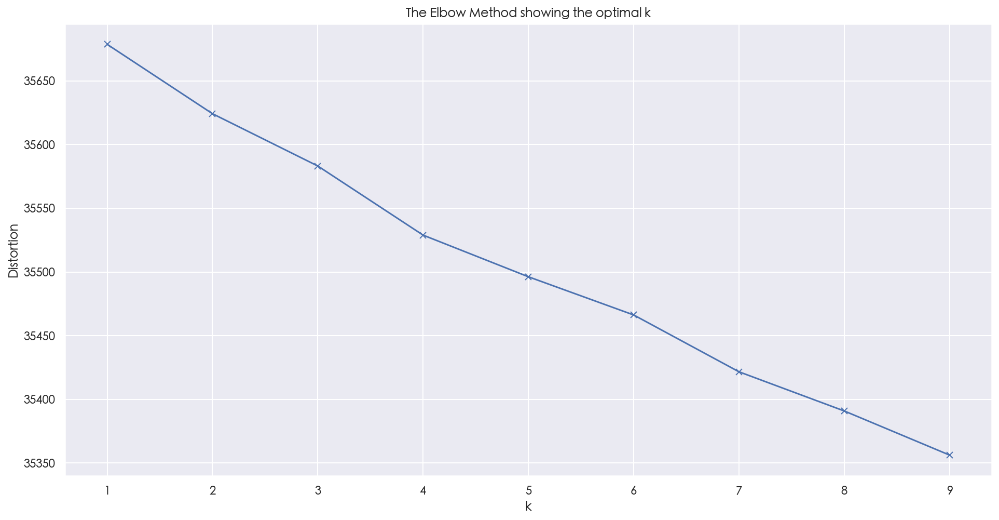

In [120]:

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

100%|████████████████████████████████████████| 99/99 [7:52:40<00:00, 286.47s/it]


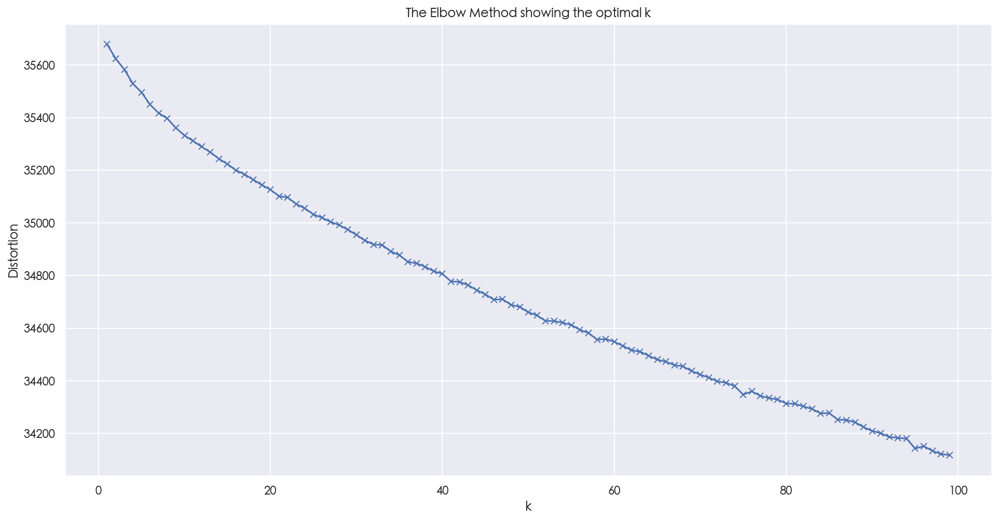

In [136]:
# Check elbow for up to k = 100, stopwords 2
tvec = TfidfVectorizer(stop_words=updated_stopwords_2,max_df=0.3,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)
X_transformed = tvec.transform(lyrics)



distortions = []
K = range(1,100)
for k in tqdm(K):
    modelkmeans = KMeans(n_clusters=k, init='k-means++', n_init=100)
    modelkmeans.fit(X_transformed)
    distortions.append(modelkmeans.inertia_)
    
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

#### 9.4.1. DBScan TfidfVectorizer

In [462]:
# try DBScan
from sklearn import metrics
from sklearn.cluster import DBSCAN
data = df_tracks_master_clean3_lyrics_genre_hsk_v2
lyrics = data.lyrics



tvec = TfidfVectorizer(stop_words=updated_stopwords_2,max_df=0.3,max_features=10000,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)
X_transformed = tvec.transform(lyrics)



modeldbscan = DBSCAN(eps=0.05, min_samples=5)
modeldbscan.fit(X_transformed)



DBSCAN(eps=0.05)

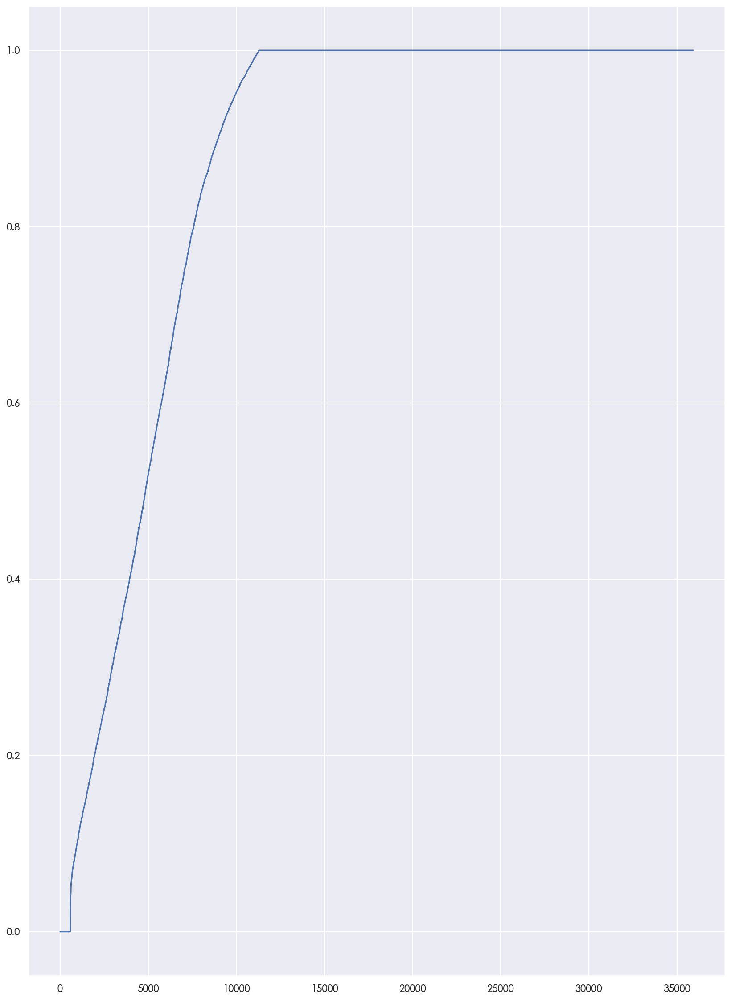

In [143]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_transformed)
distances, indices = nbrs.kneighbors(X_transformed)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

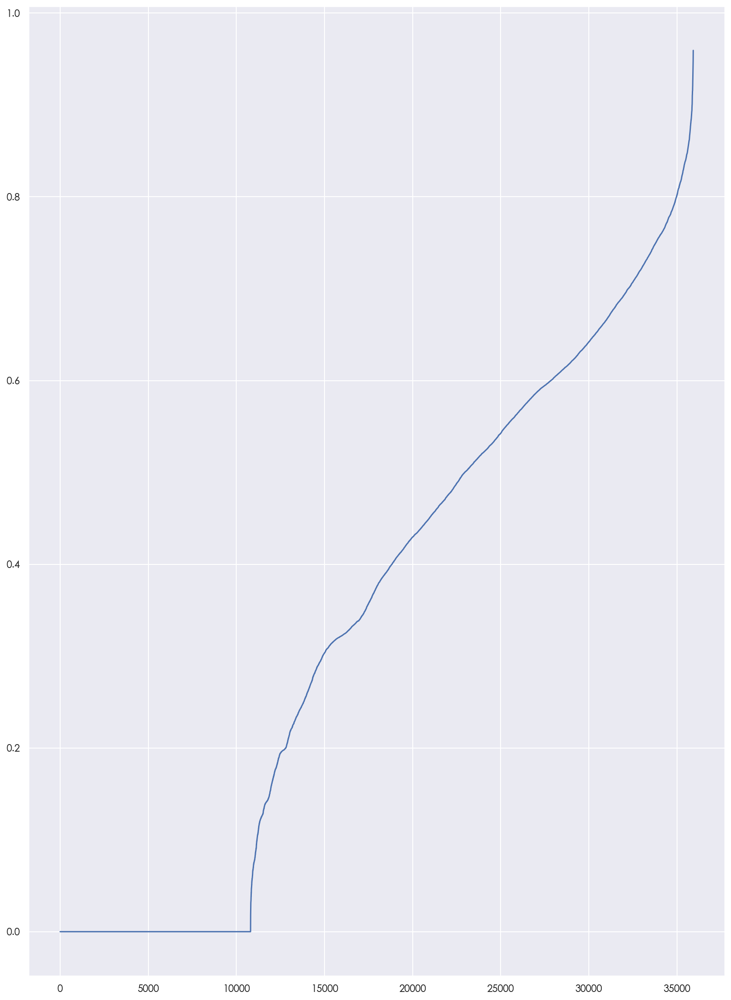

In [144]:
tvec = TfidfVectorizer(stop_words=updated_stopwords_2,max_df=0.3,max_features=100,tokenizer=man_token_jie, norm='l2')
tvec.fit(lyrics)
X_transformed = tvec.transform(lyrics)

neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_transformed)
distances, indices = nbrs.kneighbors(X_transformed)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)


Info here on how to optimze DBScan: 
- https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc
- https://towardsdatascience.com/k-means-vs-dbscan-clustering-49f8e627de27

#### 9.4.1. KMeans CVecVectorizer

In [767]:
data = df_tracks_master_clean3_lyrics_genre_hsk_v2
lyrics = data.lyrics

In [768]:
lyrics = data.lyrics

In [769]:
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot
# define dataset


cvec = CountVectorizer(stop_words=updated_stopwords,max_features=10000,tokenizer=man_token_jie)
cvec.fit(lyrics)
X_transformed = cvec.transform(lyrics)



from sklearn.cluster import KMeans
modelkmeans = KMeans(n_clusters=60, init='k-means++', n_init=100)
modelkmeans.fit(X_transformed)

KMeans(n_clusters=60, n_init=100)

In [770]:
cluster_labels = modelkmeans.labels_

In [771]:
cluster_labels

array([41, 41,  2, ..., 41, 57, 41], dtype=int32)

In [774]:
data['groupings'] = cluster_labels

In [791]:
labels = cvec.get_feature_names()

In [786]:
lyrics_mat = pd.DataFrame.sparse.from_spmatrix(X_transformed)
lyrics_mat.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,9960,9961,9962,9963,9964,9965,9966,9967,9968,9969,9970,9971,9972,9973,9974,9975,9976,9977,9978,9979,9980,9981,9982,9983,9984,9985,9986,9987,9988,9989,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [792]:
lyrics_mat.columns = labels

In [801]:
data2 = pd.merge(data, lyrics_mat, left_index=True, right_index=True)

In [802]:
data2.to_csv('df_tracks_master_clean3_lyrics_genre_hsk_v3.csv')

KeyboardInterrupt: 

In [803]:
data2.head()

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,...,黄土,黄昏,黄沙,黄河,黄算,黄色,黄金,黎明,黎明前,黏,黑,黑发,黑夜,黑暗,黑洞,黑白,黑眼圈,黑色,默契,默念,默然,默许,默默,默默地,黯淡,黯然,鼓,鼓励,鼓和声,鼓声,鼓手,鼓掌,鼓楼,鼓舞,鼓起勇气,鼻子,齐,齐来,齐齐,龙
0,英雄 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",182040.0,0.0,https://api.spotify.com/v1/tracks/1i31BYKv1La3...,https://p.scdn.co/mp3-preview/191037a026d9e098...,1.0,track,182040.0,31.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.000172,0.522,0.908,0.002500,0.458,-8.747,0.0596,118.987,4.0,英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都...,"00:00.00,00:10.81,00:21.62,00:32.43,00:34.37,0...",NaN,288,0.280303,0.469697,0.583333,0.666667,0.856061,0.946970,5,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,雙截棍 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",145173.0,0.0,https://api.spotify.com/v1/tracks/77uwbOEaj6nM...,https://p.scdn.co/mp3-preview/80c09c504a54344b...,2.0,track,145173.0,30.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.002810,0.461,0.953,0.000000,0.424,-6.440,0.1360,101.037,4.0,双截棍词曲岩烧店的烟味弥漫店里面的妈妈桑教拳脚武术的老板练铁沙掌硬底子功夫最擅长还会金钟罩铁...,"00:00.00,00:09.79,00:19.58,00:29.37,00:31.72,0...",NaN,370,0.320000,0.460000,0.670000,0.810000,0.870000,0.980000,4,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,開不了口 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",272973.0,0.0,https://api.spotify.com/v1/tracks/5OR1Fbd7RSI1...,https://p.scdn.co/mp3-preview/82a62689347391e7...,3.0,track,272973.0,32.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.001760,0.519,0.612,0.000002,0.564,-10.634,0.0267,139.944,4.0,开不了口词曲才离开没多久就开始担心今天的你过得好不好整个画面是你嘴嘟嘟那可爱的模样还有在你身...,"00:00.00,00:24.00,00:48.00,01:12.01,01:14.58,0...",NaN,299,0.404762,0.595238,0.833333,0.892857,0.928571,0.988095,3,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,床邊故事 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",220240.0,0.0,https://api.spotify.com/v1/tracks/7MmT3xzugKwe...,https://p.scdn.co/mp3-preview/5316d5602f55d671...,4.0,track,220240.0,29.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.039800,0.640,0.844,0.000005,0.122,-9.645,0.0539,106.033,4.0,床边故事词曲从前从前有只猫头鹰它站在屋顶屋顶后面一遍森林森林很安静安静的钢琴在大厅阁楼里仔细...,"00:00.00,00:06.45,00:12.91,00:19.37,00:20.74,0...",NaN,346,0.368852,0.500000,0.655738,0.803279,0.901639,0.950820,4,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,夜曲+竊愛 (Live),https://api.spotify.com/v1/artists/2elBjNSdBE2...,Jay Chou,spotify:artist:2elBjNSdBE2Y3f0j1mjrql,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",222013.0,0.0,https://api.spotify.com/v1/tracks/4vlzCpNsDFBa...,https://p.scdn.co/mp3-preview/446b1630b52837ae...,5.0,track,222013.0,41.0,周杰倫地表最強世界巡迴演唱會,album,https://i.scdn.co/image/ab67616d0000b273494cdb...,25.0,spotify:album:5lqE2qT3nGLW6FGoJYfwUT,2019-11-01,0.028300,0.538,0.610,0.005630,0.386,-10.513,0.1680,

In [ ]:
# # look at topics using original tvec
# topics = pd.DataFrame()
# for i in range(10):
#     display(pd.DataFrame(cvec.transform(data[data['labels']==i].lyrics).toarray(), columns =cvec.get_feature_names()).sum().sort_values(ascending=False)[:15])


In [ ]:
# # look at topics but recalibrating tvec on each new sub cluster
# topics = pd.DataFrame()
# for i in range(10):
#     display(pd.DataFrame(cvec.fit_transform(data[data['labels']==i].lyrics).toarray(), columns =cvec.get_feature_names()).sum().sort_values(ascending=False)[:15])


## 10. Playlist generation

In [904]:
df_tracks_master_clean3_lyrics_genre_hsk_v3 = pd.read_csv(
    '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
    sep=',',
    index_col=0)

#### 10.1. Player

In [779]:
### Version 1
from ipywidgets import GridspecLayout
from ipywidgets import AppLayout, Button, Layout
import ipywidgets as widgets
from ipywidgets import TwoByTwoLayout
# import IPython.display 
import urllib.request
from PIL import Image
from IPython.display import clear_output

########## HSK Selection
# default HSK Choice

def create_expanded_button(description, button_style):
    return Button(description=description, button_style=button_style, layout=Layout(height='auto', width='auto'))

grid = GridspecLayout(3, 3)

def HSK1_button(x):
    global HSK_choice
    HSK_choice = 1
    return HSK_choice

def HSK2_button(x):
    global HSK_choice
    HSK_choice = 2
    return HSK_choice

def HSK3_button(x):
    global HSK_choice
    HSK_choice = 3
    return HSK_choice

def HSK4_button(x):
    global HSK_choice
    HSK_choice = 4
    return HSK_choice

def HSK5_button(x):
    global HSK_choice
    HSK_choice = 5
    print(5)
    return HSK_choice

def HSK6_button(x):
    global HSK_choice
    HSK_choice = 6
    return HSK_choice  

grid[0,0] = create_expanded_button('HSK 1', 'info')
grid[0,0].on_click(HSK1_button)

grid[0,1] = create_expanded_button('HSK 2', 'info')
grid[0,1].on_click(HSK2_button)

grid[0,2] = create_expanded_button('HSK 3', 'success')
grid[0,2].on_click(HSK3_button)

grid[1,0] = create_expanded_button('HSK 4', 'success')
grid[1,0].on_click(HSK4_button)

grid[1,1] = create_expanded_button('HSK 5', 'warning')
grid[1,1].on_click(HSK5_button)

grid[1,2] = create_expanded_button('HSK 6', 'danger')
grid[1,2].on_click(HSK6_button)


###### Album Cover
img1 = open('gfg.png', 'rb').read()
wi1 = widgets.Image(value=img1, format='png', width=300, height=400)

# Genre
checkbox_genre = widgets.RadioButtons(options=df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()].unique()[:10], value = 'mandopop', description='Genre')

# Play Button
play_button = widgets.Button(description="Play Song")
create_play_list_button = widgets.Button(description="Create Playlist")

talk_slider = widgets.FloatSlider(
    value=80,
    min=0,
    max=100.0,
    step=0.1,
    description='Talkability',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.1f',
)

tempo_slider = widgets.FloatSlider(
    value=80,
    min=0,
    max=100.0,
    step=0.1,
    description='Tempo',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.1f',
)


grid_master = GridspecLayout(4, 20, height='500px')

grid_master[0,0:7] = grid
grid_master[0,12:20] = wi1
grid_master[0,7:10] = checkbox_genre
grid_master[1,0:7] = talk_slider
grid_master[2,0:7] = tempo_slider
grid_master[3,0:7] = play_button
grid_master[3,8:] = create_play_list_button

play_button.on_click(on_button_clicked)



display(grid_master)

def on_button_clicked(b):
    clear_output(wait=True)
    
    songs_found = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].shape[0]
    song_randomizer = random.randint(1, songs_found)
    
    img1 = open('gfg.png', 'rb').read()
    wi1 = widgets.Image(value=img1, format='png', width=300, height=400)


    
    
#     grid_master = GridspecLayout(20, 20)

#     grid_master[0,0:7] = grid
#     grid_master[0,12:20] = wi1
#     grid_master[0,7:10] = hkbox_genre
#     grid_master[1,0:7] = play_button
    
#     display(grid_master)
    
    urllib.request.urlretrieve(df_tracks_master_clean3_lyrics_genre_hsk_v3.iloc[song_randomizer,16],"gfg.png")

    ## Read images from file (because this is binary, maybe you can find how to use ByteIO) but this is more easy
#     ## Side by side thanks to HBox widgets
#     sidebyside = widgets.HBox([wi1])
#     ## Finally, show.
#     display(sidebyside)   
    grid_master = GridspecLayout(4, 20, height='500px')
    
    grid_master[0,0:7] = grid
    grid_master[0,12:20] = wi1
    grid_master[0,7:10] = checkbox_genre
    grid_master[1,0:7] = talk_slider
    grid_master[2,0:7] = tempo_slider
    grid_master[3,0:7] = play_button
    grid_master[3,8:] = create_play_list_button
    
    display(grid_master)
    song_selection_href = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].iloc[song_randomizer,8]

    song_selection = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].iloc[song_randomizer,0]
    artist_selection = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].iloc[song_randomizer,2]
    print('HSK Level:',HSK_choice )
    print('Number of songs found:', songs_found)
    print('Playing:',song_selection)
    print('Artist:',artist_selection )
    print('Track Name', song_selection)
    
    try:
        pull_lyrics(song_selection, song_selection_href)
    except:
        print('lyrics not avaiable')
    
    
    


GridspecLayout(children=(GridspecLayout(children=(Button(button_style='info', description='HSK 1', layout=Layo…

HSK Level: 4
Number of songs found: 1566
Playing: 哭過就好了
Artist: Rachel Liang
Track Name 哭過就好了
Starting Playback
Lyrics
哭过就好了
词


In [1047]:
def getChinese(context):
    filtrate = re.compile(u'[^\u4E00-\u9FA5]')  # non-Chinese unicode range
    context = filtrate.sub(r'', context)  # remove all non-Chinese characters
    return context
    

def song_uri_from_href(href):
    try: 
        url_search = re.compile(r'(?<=track/).*(?=.*?\?)')
        result = re.findall(url_search, href)[0]
        uri = 'spotify:track:' + result
        return uri
    except:
        url_search = re.compile(r'(?<=tracks/).*')
        result = re.findall(url_search, href)[0]
        uri = 'spotify:track:' + result
        return uri


def pull_lyrics(table_name, href):
    
    # first filter tablename variable for only chinese characters
    
    try:
        table_name = getChinese(table_name)

        song_uri = song_uri_from_href(href)
        print('Starting Playback')
        print('Lyrics')
        sp.start_playback(device_id=device_id, uris=[song_uri])

        # pull lyric table from data base and convert time to time format
        db_connection = sqlite3.connect('/Users/stuart/Desktop/Spoty-Linguist-Project/master_sql_db.db.sqlite')
        sql_lyrics_table = sql.read_sql('SELECT time, lyrics FROM %s'%table_name, con = db_connection)
        sql_lyrics_table['time'] = sql_lyrics_table.time.apply(pd.to_datetime)

        # create a column that include time between each lyrics
        sql_lyrics_table['pause_time'] = sql_lyrics_table.time
        time_temp = sql_lyrics_table.pause_time[0] # start time
        for ind,i in enumerate(sql_lyrics_table.pause_time):
            sql_lyrics_table.iloc[ind,2] = sql_lyrics_table.iloc[ind,0] - time_temp
            time_temp = sql_lyrics_table.time[ind]

        for ind,i in enumerate(sql_lyrics_table.lyrics):
            print(i)
            time.sleep(sql_lyrics_table.pause_time[ind].total_seconds()/60)


        sp.pause_playback(device_id=device_id)
        
    except:
        print('lyrics not available')
        time.sleep(3)
        sp.pause_playback(device_id=device_id)
    

In [908]:
# df_tracks_master_clean3_lyrics_genre_hsk_v3 = data2

### Version 2
from ipywidgets import GridspecLayout
from ipywidgets import AppLayout, Button, Layout
import ipywidgets as widgets
from ipywidgets import TwoByTwoLayout
# import IPython.display 
import urllib.request
from PIL import Image
from IPython.display import clear_output

########## HSK Selection
# default HSK Choice

def create_expanded_button(description, button_style):
    return Button(description=description, button_style=button_style, layout=Layout(height='auto', width='auto'))

grid = GridspecLayout(3, 3)

def HSK1_button(x):
    global HSK_choice
    HSK_choice = 1
    return HSK_choice

def HSK2_button(x):
    global HSK_choice
    HSK_choice = 2
    return HSK_choice

def HSK3_button(x):
    global HSK_choice
    HSK_choice = 3
    return HSK_choice

def HSK4_button(x):
    global HSK_choice
    HSK_choice = 4
    return HSK_choice

def HSK5_button(x):
    global HSK_choice
    HSK_choice = 5
    print(5)
    return HSK_choice

def HSK6_button(x):
    global HSK_choice
    HSK_choice = 6
    return HSK_choice  

grid[0,0] = create_expanded_button('HSK 1', 'info')
grid[0,0].on_click(HSK1_button)

grid[0,1] = create_expanded_button('HSK 2', 'info')
grid[0,1].on_click(HSK2_button)

grid[0,2] = create_expanded_button('HSK 3', 'success')
grid[0,2].on_click(HSK3_button)

grid[1,0] = create_expanded_button('HSK 4', 'success')
grid[1,0].on_click(HSK4_button)

grid[1,1] = create_expanded_button('HSK 5', 'warning')
grid[1,1].on_click(HSK5_button)

grid[1,2] = create_expanded_button('HSK 6', 'danger')
grid[1,2].on_click(HSK6_button)


###### Album Cover
img1 = open('gfg.png', 'rb').read()
wi1 = widgets.Image(value=img1, format='png', width=300, height=400)

# Genre
checkbox_genre = widgets.RadioButtons(options=df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()].unique()[:10], value = 'mandopop', description='Genre')

# Play Button
play_button = widgets.Button(description="Play Song")
create_play_list_button = widgets.Button(description="Create Playlist")


grid_master = GridspecLayout(4, 20, height='500px')

grid_master[0,0:7] = grid
grid_master[0,12:20] = wi1
grid_master[0,7:10] = checkbox_genre
grid_master[3,0:7] = play_button
grid_master[3,8:] = create_play_list_button

play_button.on_click(on_button_clicked)



display(grid_master)



def on_button_clicked(b):
    clear_output(wait=True)
    
    songs_found = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].shape[0]
    song_randomizer = random.randint(1, songs_found)
    
    img1 = open('gfg.png', 'rb').read()
    wi1 = widgets.Image(value=img1, format='png', width=300, height=400)


    
    
#     grid_master = GridspecLayout(20, 20)

#     grid_master[0,0:7] = grid
#     grid_master[0,12:20] = wi1
#     grid_master[0,7:10] = hkbox_genre
#     grid_master[1,0:7] = play_button
    
#     display(grid_master)
    
    urllib.request.urlretrieve(df_tracks_master_clean3_lyrics_genre_hsk_v3.iloc[song_randomizer,16],"gfg.png")

    ## Read images from file (because this is binary, maybe you can find how to use ByteIO) but this is more easy
#     ## Side by side thanks to HBox widgets
#     sidebyside = widgets.HBox([wi1])
#     ## Finally, show.
#     display(sidebyside)   
    grid_master = GridspecLayout(4, 20, height='500px')
    
    grid_master[0,0:7] = grid
    grid_master[0,12:20] = wi1
    grid_master[0,7:10] = checkbox_genre
    grid_master[3,0:7] = play_button
    grid_master[3,8:] = create_play_list_button
    
    display(grid_master)
    song_selection_href = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].iloc[song_randomizer,8]

    song_selection = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].iloc[song_randomizer,0]
    artist_selection = df_tracks_master_clean3_lyrics_genre_hsk_v3[(df_tracks_master_clean3_lyrics_genre_hsk_v3['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'][df_tracks_master_clean3_lyrics_genre_hsk_v3['Genre2'].notnull()] == checkbox_genre.value)].iloc[song_randomizer,2]
    print('HSK Level:',HSK_choice )
    print('Number of songs found:', songs_found)
    print('Playing:',song_selection)
    print('Artist:',artist_selection )
    print('Track Name', song_selection)
    
    try:
        pull_lyrics(song_selection, song_selection_href)
    except:
        print('lyrics not avaiable')
    
    
    


GridspecLayout(children=(GridspecLayout(children=(Button(button_style='info', description='HSK 1', layout=Layo…

HSK Level: 4
Number of songs found: 1293
Playing: 裙擺搖搖
Artist: 李心潔
Track Name 裙擺搖搖
Starting Playback
Lyrics
裙摆摇摇
词


#### 10.2. Redundant

In [601]:
# # import data file
# df_tracks_master_clean3_lyrics_genre_hsk_v2 = pd.read_csv(
#     '/Users/stuart/Desktop/Spoty-Linguist-Project/df_tracks_master_clean3_lyrics_genre_hsk_v2.csv',
#     sep=',',
#     index_col=0)

In [602]:
# import ipywidgets as widgets
# from ipywidgets import TwoByTwoLayout
# # import IPython.display 
# import urllib.request
# from PIL import Image
# from IPython.display import clear_output



# # chkbox_hsk = widgets.RadioButtons(options=df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'].unique(), value = 4,
# #  description='HSK Level')

# # chkbox_genre = widgets.RadioButtons(options=df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'].unique()[:10], value = 'mandopop',
# #  description='Genre')


# # button = widgets.Button(description="Play Song")


# def on_button_clicked(b):
#     songs_found = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].shape[0]
#     song_randomizer = random.randint(1, songs_found)
    
#     clear_output(wait=True)
#     display(button)
#     display(chkbox_hsk, chkbox_genre)


#     urllib.request.urlretrieve(df_tracks_master_clean3_lyrics_genre_hsk_v2.iloc[song_randomizer,16],"gfg.png")

#     ## Read images from file (because this is binary, maybe you can find how to use ByteIO) but this is more easy
#     img1 = open('gfg.png', 'rb').read()
#     wi1 = widgets.Image(value=img1, format='png', width=300, height=400)
# #     ## Side by side thanks to HBox widgets
# #     sidebyside = widgets.HBox([wi1])
# #     ## Finally, show.
# #     display(sidebyside)   
#     layout = TwoByTwoLayout(top_left=chkbox_hsk,
#                bottom_left=genre1_drop,
#                bottom_right=wi1)
    
#     display(layout)
#     song_selection_href = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == chkbox_hsk.value) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].iloc[song_randomizer,8]

#     song_selection = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == chkbox_hsk.value) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].iloc[song_randomizer,0]
#     artist_selection = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == chkbox_hsk.value) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].iloc[song_randomizer,2]
    
#     print('Number of songs found:', songs_found)
#     print('Playing:',song_selection)
#     print('Artist:',artist_selection )
#     print('Track Name', song_selection)
    
#     try:
#         pull_lyrics(song_selection, song_selection_href)
#     except:
#         print('lyrics not avaiable')
    




# button.on_click(on_button_clicked)

# img1 = open('gfg.png', 'rb').read()
# wi1 = widgets.Image(value=img1, format='png', width=300, height=400)


# layout = TwoByTwoLayout(top_left=grid,
#            bottom_left=genre1_drop,
#            bottom_right=wi1)




# display(layout)

TwoByTwoLayout(children=(GridspecLayout(children=(Button(button_style='info', description='HSK 1', layout=Layo…

In [679]:
from ipywidgets import GridspecLayout
from ipywidgets import AppLayout, Button, Layout
import ipywidgets as widgets
from ipywidgets import TwoByTwoLayout
# import IPython.display 
import urllib.request
from PIL import Image
from IPython.display import clear_output

########## HSK Selection
# default HSK Choice
HSK_choice = 5 
def create_expanded_button(description, button_style):
    return Button(description=description, button_style=button_style, layout=Layout(height='auto', width='auto'))

grid = GridspecLayout(4, 3)

def HSK1_button(x):
    HSK_choice = 1
    return HSK_choice

def HSK2_button(x):
    HSK_choice = 2
    return HSK_choice

def HSK3_button(x):
    HSK_choice = 3
    return HSK_choice

def HSK4_button(x):
    HSK_choice = 4
    return HSK_choice

def HSK5_button(x):
    HSK_choice = 5
    return HSK_choice

def HSK6_button(x):
    HSK_choice = 6
    return HSK_choice  

grid[0,0] = create_expanded_button('HSK 1', 'info')
grid[0,0].on_click(HSK1_button)

grid[0,1] = create_expanded_button('HSK 2', 'info')
grid[0,1].on_click(HSK2_button)

grid[0,2] = create_expanded_button('HSK 3', 'success')
grid[0,2].on_click(HSK3_button)

grid[1,0] = create_expanded_button('HSK 4', 'success')
grid[1,0].on_click(HSK4_button)

grid[1,1] = create_expanded_button('HSK 5', 'warning')
grid[1,1].on_click(HSK5_button)

grid[1,2] = create_expanded_button('HSK 6', 'danger')
grid[1,2].on_click(HSK6_button)

grid[1,2] = create_expanded_button('HSK 6', 'danger')
grid[1,2].on_click(HSK6_button)

###### Album Cover
img1 = open('gfg.png', 'rb').read()
wi1 = widgets.Image(value=img1, format='png', width=300, height=400)

# Genre
checkbox_genre = widgets.RadioButtons(options=df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'].unique()[:10], value = 'mandopop', description='Genre')

# Play Button
play_button = widgets.Button(description="Play Song")

grid_master = GridspecLayout(2, 20)

grid_master[0,0:7] = grid
grid_master[0,12:20] = wi1
grid_master[0,7:10] = checkbox_genre
grid_master[1,0:7] = play_button

play_button.on_click(on_button_clicked)

display(grid_master)

def on_button_clicked(b):
    clear_output(wait=True)
    
    songs_found = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == HSK_choice) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == checkbox_genre.value)].shape[0]
    song_randomizer = random.randint(1, songs_found)
    
    img1 = open('gfg.png', 'rb').read()
    wi1 = widgets.Image(value=img1, format='png', width=300, height=400)


    
    
#     grid_master = GridspecLayout(20, 20)

#     grid_master[0,0:7] = grid
#     grid_master[0,12:20] = wi1
#     grid_master[0,7:10] = hkbox_genre
#     grid_master[1,0:7] = play_button
    
#     display(grid_master)
    
    urllib.request.urlretrieve(df_tracks_master_clean3_lyrics_genre_hsk_v2.iloc[song_randomizer,16],"gfg.png")

    ## Read images from file (because this is binary, maybe you can find how to use ByteIO) but this is more easy
#     ## Side by side thanks to HBox widgets
#     sidebyside = widgets.HBox([wi1])
#     ## Finally, show.
#     display(sidebyside)   
#     grid_master = GridspecLayout(20, 20)
    
    grid_master = GridspecLayout(2, 20)
    grid_master[0,0:7] = grid
    grid_master[0,12:20] = wi1
    grid_master[0,7:10] = checkbox_genre
    grid_master[1,0:7] = play_button
    
    display(grid_master)
    song_selection_href = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == chkbox_hsk.value) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].iloc[song_randomizer,8]

    song_selection = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == chkbox_hsk.value) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].iloc[song_randomizer,0]
    artist_selection = df_tracks_master_clean3_lyrics_genre_hsk_v2[(df_tracks_master_clean3_lyrics_genre_hsk_v2['hsk_level'] == chkbox_hsk.value) & (df_tracks_master_clean3_lyrics_genre_hsk_v2['Genre2'] == chkbox_genre.value)].iloc[song_randomizer,2]
    
    print('Number of songs found:', songs_found)
    print('Playing:',song_selection)
    print('Artist:',artist_selection )
    print('Track Name', song_selection)
    
    try:
        pull_lyrics(song_selection, song_selection_href)
    except:
        print('lyrics not avaiable')
    
    
    


GridspecLayout(children=(GridspecLayout(children=(Button(button_style='info', description='HSK 1', layout=Layo…

Number of songs found: 1712
Playing: Better - Dusa Remix
Artist: Kimberley Chen
Track Name Better - Dusa Remix
Starting Playback
Lyrics
lyrics not available


How to add buttons in Jupyter
- https://medium.com/convergence-tech/ux-in-jupyter-user-input-essentials-779c9b449f2d

In [107]:
widgets.SelectMultiple(
    options=['Apples', 'Oranges', 'Pears'],
    value=['Oranges'],
    #rows=10,
    description='Fruits',
    disabled=False
)

SelectMultiple(description='Fruits', index=(1,), options=('Apples', 'Oranges', 'Pears'), value=('Oranges',))

## 11. Network Generator

In [10]:
df_tracks_master_clean3_lyrics_genre_hsk_v2[df_tracks_master_clean3_lyrics_genre_hsk_v2.hsk1 > 0.7]

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2,Genre1,Genre2,Genre3,Genre4,Genre5,Genre6,Genre7,weblink
1088,LOVE (Live),https://api.spotify.com/v1/artists/14bJhryXGk6...,Hebe Tien,spotify:artist:14bJhryXGk6H6qlGzwj3W5,artist,"['HK', 'MO', 'TW']",219706.0,0.0,https://api.spotify.com/v1/tracks/4qKPEOARx0lE...,https://p.scdn.co/mp3-preview/08bbaded95e1f3ee...,2.0,track,219706.0,11.0,IF only 如果 田馥甄巡迴演唱會 (Live),album,https://i.scdn.co/image/ab67616d0000b27372f745...,26.0,spotify:album:33XmR5MH1w3n3gIECukz6E,2016-12-12,0.010100,0.551,0.898,0.000457,0.7300,-6.248,0.1020,99.932,4.0,词曲我爱你她爱她你爱我他爱他咦已经没有人相爱怎么这世界怎么这世界不爱自己我爱你她爱她你爱我他...,"00:00.00,00:12.20,00:24.41,00:36.62,00:40.96,0...","mandopop,taiwan pop",92,0.705882,0.764706,0.941176,0.941176,0.941176,0.941176,2,1,1,1,1,0,0,1,1,1,1,0,mandopop,taiwan,pop,mandopop,taiwan pop,NaN,NaN,NaN,NaN,NaN,https://open.spotify.com/track/4qKPEOARx0lEIkj...
1148,Love?,https://api.spotify.com/v1/artists/14bJhryXGk6...,Hebe Tien,spotify:artist:14bJhryXGk6H6qlGzwj3W5,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",87720.0,0.0,https://api.spotify.com/v1/tracks/0T722iRBSkCX...,https://p.scdn.co/mp3-preview/1f0f0cf23f85a725...,1.0,track,87720.0,18.0,To Hebe,album,https://i.scdn.co/image/ab67616d0000b2733e7c6c...,11.0,spotify:album:3LS8Yu3yTT5CnUvkTcISyC,2010-10-20,0.844000,0.714,0.227,0.000000,0.0950,-11.133,0.0358,95.076,4.0,词曲我爱你她爱她你爱我他爱他怎么这世界怎么这世界怎么这世界怎么这世界怎么这世界怎么这世界,"00:00.00,00:03.92,00:07.84,00:11.76,00:26.13,0...","mandopop,taiwan pop",44,0.800000,0.800000,1.000000,1.000000,1.000000,1.000000,1,1,1,1,1,1,1,1,1,1,1,1,mandopop,taiwan,pop,mandopop,taiwan pop,NaN,NaN,NaN,NaN,NaN,https://open.spotify.com/track/0T722iRBSkCXJyh...
8889,我夢想有一天還會見到你,https://api.spotify.com/v1/artists/1km0aro5NJu...,Joanna Wang,spotify:artist:1km0aro5NJuoX5dE0Mub5C,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",159876.0,0.0,https://api.spotify.com/v1/tracks/7yoiatTNgWKd...,https://p.scdn.co/mp3-preview/52862c76255a1bc4...,13.0,track,159876.0,7.0,摩登悲劇,album,https://i.scdn.co/image/ab67616d0000b27384a469...,19.0,spotify:album:5RceUqTiztLNmT5IXwZZEX,2018-08-08,0.143000,0.480,0.857,0.000000,0.1060,-5.755,0.1350,151.659,4.0,我梦想有一天还会见到你,"00:00.00,00:02.23,00:04.46,00:06.69,00:09.66,0...","c-pop,chinese audiophile,chinese indie,chinese...",11,0.777778,0.888889,0.888889,0.888889,0.888889,1.000000,1,1,1,1,1,1,0,1,1,1,1,1,c,pop,chinese,c-pop,chinese audiophile,chinese indie,chinese jazz,mandopop,taiwan pop,taiwan singer-songwriter,https://open.spotify.com/track/7yoiatTNgWKdg2G...
20415,不遮掩,https://api.spotify.com/v1/artists/39YbP9PakVw...,E-Jun Lee,spotify:artist:39YbP9PakVwqfXFtRdn5vI,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",235240.0,0.0,https://api.spotify.com/v1/tracks/5cZcW1kzErDa...,https://p.scdn.co/mp3-preview/8e628f06d0c6853e...,9.0,track,235240.0,1.0,苓聽,album,https://i.scdn.co/image/ab67616d0000b27300be24...,10.0,spotify:album:6PueNXlHjFK7OwFHQsCFux,2015-06-02,0.080100,0.551,0.539,0.000000,0.2780,-9.772,0.0305,139.954,4.0,不遮掩词曲一天小说昨天谢谢了我看见谁让谁再见我听见谁怪谁说再见一天小说昨天谢谢了我看见谁让谁...,"00:00.00,00:05.36,00:10.72,00:16.09,00:19.60,0...",NaN,85,0.800000,0.880000,0.920000,0.960000,0.960000,1.000000,1,1,1,1,1,1,1,1,1,1,1,1,NaN,NaN,NaN,c-pop,classic mandopop,mandopop,NaN,NaN,NaN,NaN,https://open.spotify.com/track/5cZcW1kzErDaCP9...
21240,北海怪兽,https://api.spotify.com/v1/artists/3asy14alGCZ...,新裤子乐队,spotify:artist:3asy14alGCZBDd3Y6pbBbp,artist,

In [14]:
start = df_tracks_master_clean3_lyrics_genre_hsk_v2.loc[1088].lyrics
start

'词曲我爱你她爱她你爱我他爱他咦已经没有人相爱怎么这世界怎么这世界不爱自己我爱你她爱她你爱我他爱他咦已经没有人相爱怎么这世界怎么这世界不爱自己咦已经没有人相爱怎么这世界怎么这世界不爱自己'

In [17]:
list(set(SnowNLP(start).words))

['没有',
 '怎么',
 '自己',
 '词曲',
 '她爱',
 '咦',
 '不爱',
 '你',
 '人相',
 '这',
 '已经',
 '不',
 '爱',
 '我',
 '她',
 '他',
 '世界']

In [18]:
df_test = df_tracks_master_clean3_lyrics_genre_hsk_v2.copy()

In [21]:
def characters(x):
    return list(set(SnowNLP(x).words))
    

In [19]:
df_test['character_unique'] = df_test.lyrics

In [22]:
df_test['character_unique'] = df_test['character_unique'].apply(characters)

In [25]:
df_test.loc[0].lyrics

'英雄词曲人生不是一个人的游戏一起奋斗一起超越一起杀吧兄弟好战好胜战胜逆命管他天赋够不够我们都还需要再努力你的剑就是我的剑艾希的箭可不可以准一点你打野我来控兵线不要随便慌张就交闪现旋转跳跃你闭着眼卡特转完会让你闭上眼悟空盖伦也转圈圈盲僧李先生一脚把你击杀扛塔击杀迎接剑圣易大师的冥想就像紧箍咒的碎念问你出门有没带眼不是骂你有没长眼皇子嘉文不就是我黄金甲那傲气的脸让你画面一直呈现卓别林的黑白默片请不要在观战模式偷窥着我我的专情不可能被那阿狸魅惑别学我跳牛仔很忙好吗狗头不要动不动逆风你们就想投旋转跳跃你闭着眼卡特转完会让你闭上眼小鱼人再跳我就把你击杀扛塔击杀迎接击杀扛塔击杀迎接'

In [39]:
df_test[df_test.hsk_level == 1].shape

(6, 63)

In [45]:
df_hsk2 = df_test[df_test.hsk_level == 2]

In [49]:
df_hsk2 = df_hsk2.sort_values(by='hsk2', ascending=False)

In [54]:
start = df_hsk2.character_unique.iloc[0]

Start

In [318]:
calc_df = df_test.copy()

In [319]:
# Create calc column
calc_df['calc'] = calc_df['character_unique']

In [320]:

# create Branch column
calc_df['branch'] = 0

# create Node column
calc_df['node'] = 0

# create Previous Branch
calc_df['prev_branch'] = 0

# Cumulative characters
calc_df['cumulative_characters'] = 0

In [321]:
song_order = pd.DataFrame()

In [322]:
branch = 0

In [323]:
node = 0

In [324]:
prev_branch = 0

In [325]:
# get starting song
calc_df = calc_df.sort_values(by='hsk1', ascending=False)

In [326]:
# Calculate scores of all songs with comparison to fist song
comparable = calc_df['calc'].iloc[0]
for ind,i in enumerate(calc_df['calc']):
    calc_df['calc'].iloc[ind] = len(i) - len(set.intersection(set(comparable),set(i)))
calc_df = calc_df.sort_values(by=['calc', 'hsk3'])

In [327]:
#next closest song (row 1 is the original song)
calc_df.sort_values(by=['calc', 'hsk3']).iloc[1]

name                                                                   破浪潮
artist_href              https://api.spotify.com/v1/artists/5qChpS8zymO...
artist                                                            AV Okubo
artist_uri                           spotify:artist:5qChpS8zymOfQup7IJNNDx
artist_type                                                         artist
                                               ...                        
calc                                                                     2
branch                                                                   0
node                                                                     0
prev_branch                                                              0
cumulative_characters                                                    0
Name: 35602, Length: 68, dtype: object

In [328]:
calc_df['cumulative_characters'].iloc[0] = len(calc_df.character_unique.iloc[0])
calc_df['branch'].iloc[0] = branch
calc_df['node'].iloc[0] = node
previous_branch = 0
calc_df['prev_branch'].iloc[0] = previous_branch

In [329]:
# put first song into song order
song_order = song_order.append(calc_df.iloc[0])

In [330]:
cumulative_characters = len(calc_df.character_unique.iloc[0])
previous_branch = 0

In [331]:
# remove first song from dataframe
calc_df = calc_df.iloc[1:]

Repeat

In [348]:
# Create calc column
calc_df['calc'] = calc_df['character_unique']

In [349]:
# Calculate scores of all songs with comparison to fist song
comparable = calc_df['calc'].iloc[0]
for ind,i in enumerate(calc_df['calc']):
    calc_df['calc'].iloc[ind] = len(i) - len(set.intersection(set(comparable),set(i)))
calc_df = calc_df.sort_values(by='calc')

In [350]:
#next closest song (row 1 is the original song)
calc_df.sort_values(by=['calc', 'hsk3']).iloc[1]

name                                                          3010 - Intro
artist_href              https://api.spotify.com/v1/artists/0f5x4P8Sybb...
artist                                                            Da Mouth
artist_uri                           spotify:artist:0f5x4P8SybbRdpVr4idUwd
artist_type                                                         artist
                                               ...                        
calc                                                                     3
branch                                                                   0
node                                                                     0
prev_branch                                                              0
cumulative_characters                                                    0
Name: 26794, Length: 68, dtype: object

In [351]:
calc_df.iloc[1,63]

3

In [352]:
calc_df['cumulative_characters'].iloc[0] = cumulative_characters + len(calc_df.character_unique.iloc[0])

cumulative_characters = cumulative_characters + len(calc_df.character_unique.iloc[0])
if calc_df.iloc[1,63] == 0:
    calc_df['branch'].iloc[0] = branch
elif calc_df.iloc[1,63] != 0:
    branch += 1
    calc_df['branch'].iloc[0] = branch

node += 1
calc_df['node'].iloc[0] = node

calc_df['prev_branch'].iloc[0] = previous_branch
previous_branch +=1

In [353]:
# put first song into song order
song_order = song_order.append(calc_df.iloc[0])

In [354]:
# remove first song from dataframe
calc_df = calc_df.iloc[1:]

In [355]:
song_order

,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2,Genre1,Genre2,Genre3,Genre4,Genre5,Genre6,Genre7,weblink,character_unique,calc,branch,node,prev_branch,cumulative_characters
35929,你见过这样的星星吗?,https://api.spotify.com/v1/artists/2VsTfId3QBJ...,Casino Demon,spotify:artist:2VsTfId3QBJggJThhZr8qc,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",208946.0,0.0,https://api.spotify.com/v1/tracks/58kFyxYcBejq...,https://p.scdn.co/mp3-preview/189949ddfffd951f...,1.0,track,208946.0,2.0,你见过这样的星星吗?,single,https://i.scdn.co/image/ab67616d0000b2739135e6...,6.0,spotify:album:4enuDQoYdyclnthTJLLvXS,2012-11-24,0.024700,0.648,0.769,0.000541,0.2320,-7.773,0.0312,131.128,4.0,你见过这样的星星吗,"00:00.00,00:30.44,00:33.54,00:36.13,00:41.36,0...",NaN,9.0,0.857143,0.857143,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN,chinese indie rock,NaN,NaN,NaN,NaN,NaN,NaN,https://open.spotify.com/track/58kFyxYcBejqJyf...,"[见, 这样, 的, 你, 过, 吗, 星星]",0.0,0.0,0.0,0.0,7.0
35602,破浪潮,https://api.spotify.com/v1/artists/5qChpS8zymO...,AV Okubo,spotify:artist:5qChpS8zymOfQup7IJNNDx,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",316613.0,0.0,https://api.spotify.com/v1/tracks/0m7rQWrvkPQq...,https://p.scdn.co/mp3-preview/55570e513812c654...,4.0,track,316613.0,2.0,一品國際,album,https://i.scdn.co/image/ab67616d0000b2735d7a8b...,9.0,spotify:album:7dFkAqqJR01lUapdCBqSjW,2014-04-08,0.000012,0.171,0.901,0.657000,0.1410,-5.292,0.0549,80.409,4.0,破浪潮破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破...,"00:00.00,00:27.31,00:29.24,00:30.05,00:32.00,0...",NaN,67.0,0.000000,0.000000,0.0,1.0,1.0,1.0,4.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,chinese indie rock,chinese post-punk,chinese punk,wuhan indie,NaN,NaN,NaN,https://open.spotify.com/track/0m7rQWrvkPQqrvG...,"[浪潮, 破]",0.0,1.0,1.0,0.0,9.0
6873,You've Got A Friend - Live,https://api.spotify.com/v1/artists/1YrtUPrWcPf...,Khalil Fong,spotify:artist:1YrtUPrWcPfgdl9BaD9nhd,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",324240.0,0.0,https://api.spotify.com/v1/tracks/7a2BK0igYYkA...,https://p.scdn.co/mp3-preview/ffbe9bb588f09b21...,20.0,track,324240.0,3.0,This Love Live 2007,album,https://i.scdn.co/image/ab67616d0000b273d1a7e0...,21.0,spotify:album:3YBppQ78Ffif9iwsPimGiA,2006-12-31,0.865000,0.404,0.184,0.000000,0.4580,-13.164,0.0587,181.614,4.0,薛薛方薛方薛薛方薛方,"00:00.39,00:01.41,00:02.43,00:11.78,00:12.28,0...","cantopop,chinese indie,chinese r&b,mandopop",10.0,0.000000,0.000000,0.5,0.5,0.5,0.5,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,cantopop,chinese,indie,cantopop,chinese indie,chinese r&b,mandopop,NaN,NaN,NaN,https://open.spotify.com/track/7a2BK0igYYkAiFq...,"[薛, 方]",0.0,2.0,2.0,1.0,11.0
1698,"Goodnight, Goodbye",https://api.spotify.com/v1/artists/6noxsCszBEE...,A-Mei Chang,spotify:artist:6noxsCszBEEK04kCehugOp,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",235533.0,0.0,https://api.spotify.com/v1/tracks/75xxcxy05MJ7...,https://p.scdn.co/mp3-preview/86d28cb95e32239b...,6.0,track,235533.0,9.0,我可以抱你嗎?愛人,album,https://i.scdn.co/image/ab67616d0000b27362c24e...,12.0,spotify:album:3gl8g9vcEMOkrZtWNN9Bqt,1999-06-07,0.025400,0.738,0.531,0.000044,0.0609,-10.298,0.0466,127.992,4.0,宋黄宋黄宋黄宋黄,"00:00.28,00:00.63,00:01.07,00:15.11,00:15.52,0...","c-pop,mandopop,taiwan pop",8.0,0.000000,0.000000,0.5,0.5,0.5,0.5,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,c,pop,mandopop,c-pop,mandopop,taiwan pop,NaN,NaN,NaN,NaN,https:

In [358]:
for i in tqdm(range(100)):
    # Create calc column
    calc_df['calc'] = calc_df['character_unique']


    # Calculate scores of all songs with comparison to fist song
    comparable = calc_df['calc'].iloc[0]
    for ind,i in enumerate(calc_df['calc']):
        calc_df['calc'].iloc[ind] = len(i) - len(set.intersection(set(comparable),set(i)))
    calc_df = calc_df.sort_values(by='calc')


    # update cumulative characters in table and the counter
    calc_df['cumulative_characters'].iloc[0] = cumulative_characters + len(calc_df.character_unique.iloc[0])
    cumulative_characters = cumulative_characters + len(calc_df.character_unique.iloc[0])

    # update network details
    if calc_df.iloc[1,63] == 0:
        calc_df['branch'].iloc[0] = branch
    elif calc_df.iloc[1,63] != 0:
        branch += 1
        calc_df['branch'].iloc[0] = branch

    node += 1
    calc_df['node'].iloc[0] = node

    calc_df['prev_branch'].iloc[0] = previous_branch
    previous_branch +=1

    # put first song into song order
    song_order = song_order.append(calc_df.iloc[0])

    # remove first song from dataframe
    calc_df = calc_df.iloc[1:]

song_order

100%|█████████████████████████████████████████| 100/100 [19:23<00:00, 11.64s/it]


,name,artist_href,artist,artist_uri,artist_type,song_available_markets,song_duration_ms,is_explicit,song_href,preview_url,track_number,song_type,length,popularity,album,album_type,album_artwork_link,album_tracks_num,album_uri,album_release_date,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,time_signature,lyrics,time_stamp,genres,lyrics_len,hsk1,hsk2,hsk3,hsk4,hsk5,hsk6,hsk_level,hsk_level_6_80p,hsk_level_5_80p,hsk_level_4_80p,hsk_level_3_80p,hsk_level_2_80p,hsk_level_1_80p,hsk_level_5_75p,hsk_level_4_75p,hsk_level_3_75p,hsk_level_2_75p,hsk_level_1_75p,genre_0,genre_1,genre_2,Genre1,Genre2,Genre3,Genre4,Genre5,Genre6,Genre7,weblink,character_unique,calc,branch,node,prev_branch,cumulative_characters
35929,你见过这样的星星吗?,https://api.spotify.com/v1/artists/2VsTfId3QBJ...,Casino Demon,spotify:artist:2VsTfId3QBJggJThhZr8qc,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",208946.0,0.0,https://api.spotify.com/v1/tracks/58kFyxYcBejq...,https://p.scdn.co/mp3-preview/189949ddfffd951f...,1.0,track,208946.0,2.0,你见过这样的星星吗?,single,https://i.scdn.co/image/ab67616d0000b2739135e6...,6.0,spotify:album:4enuDQoYdyclnthTJLLvXS,2012-11-24,0.024700,0.648,0.7690,0.000541,0.2320,-7.773,0.0312,131.128,4.0,你见过这样的星星吗,"00:00.00,00:30.44,00:33.54,00:36.13,00:41.36,0...",NaN,9.0,0.857143,0.857143,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN,chinese indie rock,NaN,NaN,NaN,NaN,NaN,NaN,https://open.spotify.com/track/58kFyxYcBejqJyf...,"[见, 这样, 的, 你, 过, 吗, 星星]",0.0,0.0,0.0,0.0,7.0
35602,破浪潮,https://api.spotify.com/v1/artists/5qChpS8zymO...,AV Okubo,spotify:artist:5qChpS8zymOfQup7IJNNDx,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",316613.0,0.0,https://api.spotify.com/v1/tracks/0m7rQWrvkPQq...,https://p.scdn.co/mp3-preview/55570e513812c654...,4.0,track,316613.0,2.0,一品國際,album,https://i.scdn.co/image/ab67616d0000b2735d7a8b...,9.0,spotify:album:7dFkAqqJR01lUapdCBqSjW,2014-04-08,0.000012,0.171,0.9010,0.657000,0.1410,-5.292,0.0549,80.409,4.0,破浪潮破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破破...,"00:00.00,00:27.31,00:29.24,00:30.05,00:32.00,0...",NaN,67.0,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,4.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,chinese indie rock,chinese post-punk,chinese punk,wuhan indie,NaN,NaN,NaN,https://open.spotify.com/track/0m7rQWrvkPQqrvG...,"[浪潮, 破]",0.0,1.0,1.0,0.0,9.0
6873,You've Got A Friend - Live,https://api.spotify.com/v1/artists/1YrtUPrWcPf...,Khalil Fong,spotify:artist:1YrtUPrWcPfgdl9BaD9nhd,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",324240.0,0.0,https://api.spotify.com/v1/tracks/7a2BK0igYYkA...,https://p.scdn.co/mp3-preview/ffbe9bb588f09b21...,20.0,track,324240.0,3.0,This Love Live 2007,album,https://i.scdn.co/image/ab67616d0000b273d1a7e0...,21.0,spotify:album:3YBppQ78Ffif9iwsPimGiA,2006-12-31,0.865000,0.404,0.1840,0.000000,0.4580,-13.164,0.0587,181.614,4.0,薛薛方薛方薛薛方薛方,"00:00.39,00:01.41,00:02.43,00:11.78,00:12.28,0...","cantopop,chinese indie,chinese r&b,mandopop",10.0,0.000000,0.000000,0.500000,0.500000,0.500000,0.500000,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,cantopop,chinese,indie,cantopop,chinese indie,chinese r&b,mandopop,NaN,NaN,NaN,https://open.spotify.com/track/7a2BK0igYYkAiFq...,"[薛, 方]",0.0,2.0,2.0,1.0,11.0
1698,"Goodnight, Goodbye",https://api.spotify.com/v1/artists/6noxsCszBEE...,A-Mei Chang,spotify:artist:6noxsCszBEEK04kCehugOp,artist,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",235533.0,0.0,https://api.spotify.com/v1/tracks/75xxcxy05MJ7...,https://p.scdn.co/mp3-preview/86d28cb95e32239b...,6.0,track,235533.0,9.0,我可以抱你嗎?愛人,album,https://i.scdn.co/image/ab67616d0000b27362c24e...,12.0,spotify:album:3gl8g9vcEMOkrZtWNN9Bqt,1999-06-07,0.025400,0.738,0.5310,0.000044,0.0609,-10.298,0.0466,127.992,4.0,宋黄宋黄宋黄宋黄,"00:00.28,00:00.63,00:01.07,00:15.11,00:15.52,0...","c-pop,mandopop,taiwan pop",8.0,0.000000,0.000000,0.500000,0.500000,0.500000,0.500000,6.0,1.0,0.0,0.0,0.0,0.0,0.0

 ## 12. Ideas Pad